# Credit Card Fraud Detection

**The problem statement for this project is to predict fraudulent credit card transactions with the help of machine learning models**

## Business problem overview

For many banks, retaining high profitable customers is the number one business goal. Banking fraud, however, poses a significant threat to this goal for different banks. In terms of substantial financial losses, trust and credibility, this is a concerning issue to both banks and customers alike.


It has been estimated by Nilson Report that by 2020, banking frauds would account for $30 billion worldwide. With the rise in digital payment channels, the number of fraudulent transactions is also increasing in new and different ways.

In the banking industry, credit card fraud detection using machine learning is not only a trend but a necessity for them to put proactive monitoring and fraud prevention mechanisms in place. Machine learning is helping these institutions to reduce time-consuming manual reviews, costly chargebacks and fees as well as denials of legitimate transactions.

## Understanding and defining fraud

Credit card fraud is any dishonest act or behaviour to obtain information without proper authorisation from the account holder for financial gain. Among different ways of committing frauds, skimming is the most common one, which is a way of duplicating information that is located on the magnetic strip of the card. Apart from this, following are the other ways:

- Manipulation/alteration of genuine cards
- Creation of counterfeit cards
- Stealing/loss of credit cards
- Fraudulent telemarketing



In this project you will predict fraudulent credit card transactions with the help of Machine learning models. Please import the following libraries to get started.

In [ ]:
## Installing all the required packages (if not available)
!pip install numpy
!pip install -U pandas
!pip install scikit-learn
!pip install -U matplotlib
!pip install simple_colors
!pip install chardet
!pip install xgboost
!pip install imblearn
!pip install imbalanced-learn
!pip install -U seaborn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.0/13.0 MB 24.5 MB/s eta 0:00:00
  Attempting uninstall: pandas
    Found existing installation: pandas 2.0.3
    Uninstalling pandas-2.0.3:
      Successfully uninstalled pandas-2.0.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
cudf-cu12 24.4.1 requires pandas<2.2.2dev0,>=2.0, but you have pandas 2.2.2 which is incompatible.
google-colab 1.0.0 requires pandas==2.0.3, but you have pandas 2.2.2 which is incompatible.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.3/8.3 MB 52.9 MB/s eta 0:00:00
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.7.1
    Uninstalling matplotlib-3.7.1:
      Successfully uninstalled matplotlib-3.7.1
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.9/294.9 kB 4.3 MB/s eta 0:00:00
  Attempting uninstall: seaborn
    Found existing installation: seaborn

In [ ]:
# Importing python libraries :

import numpy as np
import pandas as pd
import time

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

# import machine learning and stats libraries:
from scipy import stats
from scipy.stats import norm, skew
from scipy.special import boxcox1p
from scipy.stats import boxcox_normmax

import sklearn
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.metrics import average_precision_score, precision_recall_curve

from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler, PowerTransformer

from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

from sklearn.linear_model import Ridge, Lasso, LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegressionCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
from xgboost import XGBClassifier
from xgboost import plot_importance
# Import:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier

#install scikit-optimize
!pip install scikit-optimize
from skopt import BayesSearchCV


# To ignore warnings
import warnings
warnings.filterwarnings("ignore")

## Exploratory data analysis

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
# Read the dataset
df = pd.read_csv('gdrive/My Drive/Capstone Project/creditcard.csv')
df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [ ]:
# Exploring the dataset shape:
df.shape

(284807, 31)

In [ ]:
# Checking the different distribution of the data:
df.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807.000000,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,...,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,284807.000000,284807.000000
mean,94813.859575,1.168375e-15,3.416908e-16,-1.379537e-15,2.074095e-15,9.604066e-16,1.487313e-15,-5.556467e-16,1.213481e-16,-2.406331e-15,...,1.654067e-16,-3.568593e-16,2.578648e-16,4.473266e-15,5.340915e-16,1.683437e-15,-3.660091e-16,-1.227390e-16,88.349619,0.001727
std,47488.145955,1.958696e+00,1.651309e+00,1.516255e+00,1.415869e+00,1.380247e+00,1.332271e+00,1.237094e+00,1.194353e+00,1.098632e+00,...,7.345240e-01,7.257016e-01,6.244603e-01,6.056471e-01,5.212781e-01,4.822270e-01,4.036325e-01,3.300833e-01,250.120109,0.041527
min,0.000000,-5.640751e+01,-7.271573e+01,-4.832559e+01,-5.683171e+00,-1.137433e+02,-2.616051e+01,-4.355724e+01,-7.321672e+01,-1.343407e+01,...,-3.483038e+01,-1.093314e+01,-4.480774e+01,-2.836627e+00,-1.029540e+01,-2.604551e+00,-2.256568e+01,-1.543008e+01,0.000000,0.000000
25%,54201.500000,-9.203734e-01,-5.985499e-01,-8.903648e-01,-8.486401e-01,-6.915971e-01,-7.682956e-01,-5.540759e-01,-2.086297e-01,-6.430976e-01,...,-2.283949e-01,-5.423504e-01,-1.618463e-01,-3.545861e-01,-3.171451e-01,-3.269839e-01,-7.083953e-02,-5.295979e-02,5.600000,0.000000
50%,84692.000000,1.810880e-02,6.548556e-02,1.798463e-01,-1.984653e-02,-5.433583e-02,-2.741871e-01,4.010308e-02,2.235804e-02,-5.142873e-02,...,-2.945017e-02,6.781943e-03,-1.119293e-02,4.097606e-02,1.659350e-02,-5.213911e-02,1.342146e-03,1.124383e-02,22.000000,0.000000
75%,139320.500000,1.315642e+00,8.037239e-01,1.027196e+00,7.433413e-01,6.119264e-01,3.985649e-01,5.704361e-01,3.273459e-01,5.971390e-01,...,1.863772e-01,5.285536e-01,1.476421e-01,4.395266e-01,3.507156e-01,2.409522e-01,9.104512e-02,7.827995e-02,77.165000,0.000000
max,172792.000000,2.454930e+00,2.205773e+01,9.382558e+00,1.687534e+01,3.480167e+01,7.330163e+01,1.205895e+02,2.000721e+01,1.559499e+01,...,2.720284e+01,1.050309e+01,2.252841e+01,4.584549e+00,7.519589e+00,3.517346e+00,3.161220e+01,3.384781e+01,25691.160000,1.000000


In [ ]:
#Examining the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 21  V21     28

In [ ]:
#Check the Fraud/Non_Fraud records count
df['Class'].value_counts()

Class
0    284315
1       492
Name: count, dtype: int64

In [ ]:
#Get percentage of Frauds
(df.groupby('Class')['Class'].count()/df['Class'].count()) *100

Class
0    99.827251
1     0.172749
Name: Class, dtype: float64

In [ ]:
#checkuing null values
df.isnull().sum()

Time      0
V1        0
V2        0
V3        0
V4        0
V5        0
V6        0
V7        0
V8        0
V9        0
V10       0
V11       0
V12       0
V13       0
V14       0
V15       0
V16       0
V17       0
V18       0
V19       0
V20       0
V21       0
V22       0
V23       0
V24       0
V25       0
V26       0
V27       0
V28       0
Amount    0
Class     0
dtype: int64

In [ ]:
#observe the different feature type present in the data

df.dtypes

Time      float64
V1        float64
V2        float64
V3        float64
V4        float64
V5        float64
V6        float64
V7        float64
V8        float64
V9        float64
V10       float64
V11       float64
V12       float64
V13       float64
V14       float64
V15       float64
V16       float64
V17       float64
V18       float64
V19       float64
V20       float64
V21       float64
V22       float64
V23       float64
V24       float64
V25       float64
V26       float64
V27       float64
V28       float64
Amount    float64
Class       int64
dtype: object

In [ ]:
# correlation matrix for Data understanding
corr = df.corr()
corr

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
Time,1.000000,1.173963e-01,-1.059333e-02,-4.196182e-01,-1.052602e-01,1.730721e-01,-6.301647e-02,8.471437e-02,-3.694943e-02,-8.660434e-03,...,4.473573e-02,1.440591e-01,5.114236e-02,-1.618187e-02,-2.330828e-01,-4.140710e-02,-5.134591e-03,-9.412688e-03,-0.010596,-0.012323
V1,0.117396,1.000000e+00,4.135835e-16,-1.227819e-15,-9.215150e-16,1.812612e-17,-6.506567e-16,-1.005191e-15,-2.433822e-16,-1.513678e-16,...,-2.457409e-16,-4.290944e-16,6.168652e-16,-4.425156e-17,-9.605737e-16,-1.581290e-17,1.198124e-16,2.083082e-15,-0.227709,-0.101347
V2,-0.010593,4.135835e-16,1.000000e+00,3.243764e-16,-1.121065e-15,5.157519e-16,2.787346e-16,2.055934e-16,-5.377041e-17,1.978488e-17,...,-8.480447e-17,1.526333e-16,1.634231e-16,1.247925e-17,-4.478846e-16,2.057310e-16,-4.966953e-16,-5.093836e-16,-0.531409,0.091289
V3,-0.419618,-1.227819e-15,3.243764e-16,1.000000e+00,4.711293e-16,-6.539009e-17,1.627627e-15,4.895305e-16,-1.268779e-15,5.568367e-16,...,5.706192e-17,-1.133902e-15,-4.983035e-16,2.686834e-19,-1.104734e-15,-1.238062e-16,1.045747e-15,9.775546e-16,-0.210880,-0.192961
V4,-0.105260,-9.215150e-16,-1.121065e-15,4.711293e-16,1.000000e+00,-1.719944e-15,-7.491959e-16,-4.104503e-16,5.697192e-16,6.923247e-16,...,-1.949553e-16,-6.276051e-17,9.164206e-17,1.584638e-16,6.070716e-16,-4.247268e-16,3.977061e-17,-2.761403e-18,0.098732,0.133447
V5,0.173072,1.812612e-17,5.157519e-16,-6.539009e-17,-1.719944e-15,1.000000e+00,2.408382e-16,2.715541e-16,7.437229e-16,7.391702e-16,...,-3.920976e-16,1.253751e-16,-8.428683e-18,-1.149255e-15,4.808532e-16,4.319541e-16,6.590482e-16,-5.613951e-18,-0.386356,-0.094974
V6,-0.063016,-6.506567e-16,2.787346e-16,1.627627e-15,-7.491959e-16,2.408382e-16,1.000000e+00,1.191668e-16,-1.104219e-16,4.131207e-16,...,5.833316e-17,-4.705235e-19,1.046712e-16,-1.071589e-15,4.562861e-16,-1.357067e-16,-4.452461e-16,2.594754e-16,0.215981,-0.043643
V7,0.084714,-1.005191e-15,2.055934e-16,4.895305e-16,-4.104503e-16,2.715541e-16,1.191668e-16,1.000000e+00,3.344412e-16,1.122501e-15,...,-2.027779e-16,-8.898922e-16,-4.387401e-16,7.434913e-18,-3.094082e-16,-9.657637e-16,-1.782106e-15,-2.776530e-16,0.397311,-0.187257
V8,-0.036949,-2.433822e-16,-5.377041e-17,-1.268779e-15,5.697192e-16,7.437229e-16,-1.104219e-16,3.344412e-16,1.000000e+00,4.356078e-16,...,3.892798e-16,2.026927e-16,6.377260e-17,-1.047097e-16,-4.653279e-16,-1.727276e-16,1.299943e-16,-6.200930e-16,-0.103079,0.019875
V9,-0.008660,-1.513678e-16,1.978488e-17,5.568367e-16,6.923247e-16,7.391702e-16,4.131207e-16,1.122501e-15,4.356078e-16,1.000000e+00,...,1.936953e-16,-7.071869e-16,-5.214137e-16,-1.430343e-16,6.757763e-16,-7.888853e-16,-6.709655e-17,1.110541e-15,-0.044246,-0.097733


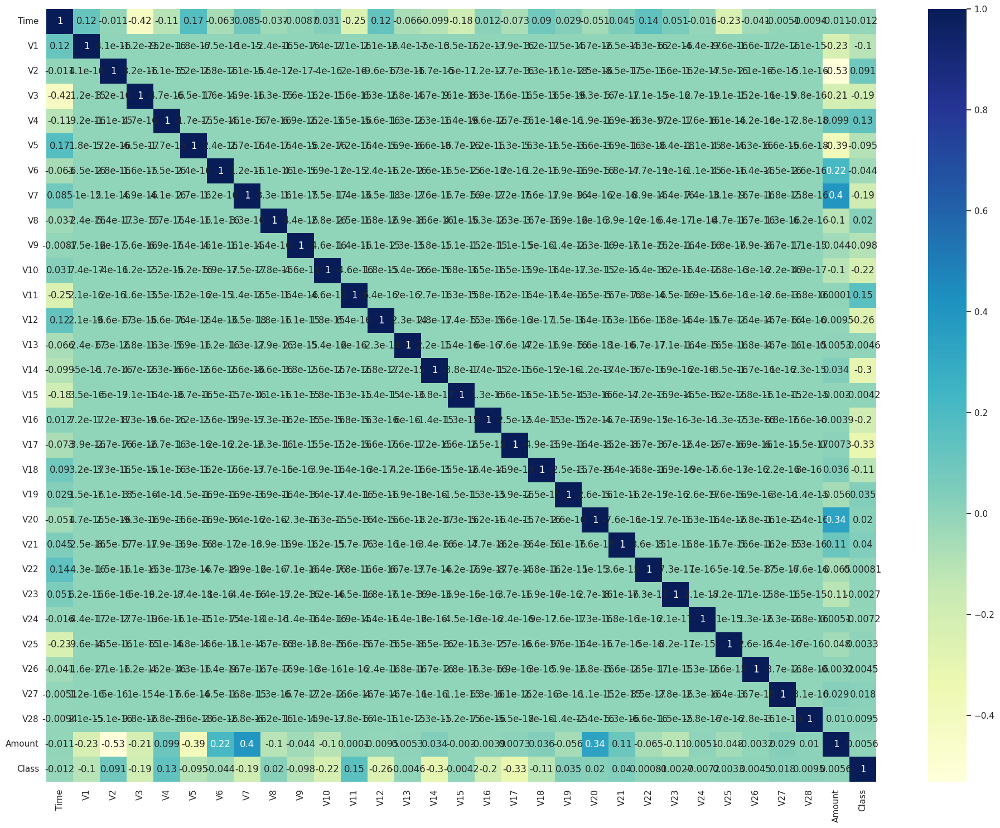

In [ ]:
# Plotting correlations on a heatmap

# figure size
plt.figure(figsize=(24,18))

# heatmap
sns.heatmap(corr, cmap="YlGnBu", annot=True)
plt.show()

Here we will observe the distribution of our classes

In [ ]:
classes=df['Class'].value_counts()
normal_share=classes[0]/df['Class'].count()*100
fraud_share=classes[1]/df['Class'].count()*100

In [ ]:
fraud_share

0.1727485630620034

In [ ]:
df.dtypes

Time      float64
V1        float64
V2        float64
V3        float64
V4        float64
V5        float64
V6        float64
V7        float64
V8        float64
V9        float64
V10       float64
V11       float64
V12       float64
V13       float64
V14       float64
V15       float64
V16       float64
V17       float64
V18       float64
V19       float64
V20       float64
V21       float64
V22       float64
V23       float64
V24       float64
V25       float64
V26       float64
V27       float64
V28       float64
Amount    float64
Class       int64
dtype: object

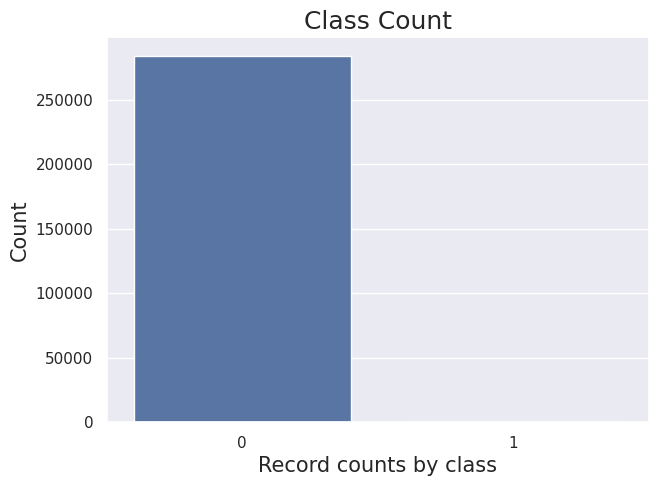

In [ ]:
# Create a bar plot for the number and percentage of fraudulent vs non-fraudulent transcations
plt.figure(figsize=(7,5))
sns.countplot(x='Class', data=df)
plt.title("Class Count", fontsize=18)
plt.xlabel("Record counts by class", fontsize=15)
plt.ylabel("Count", fontsize=15)
plt.show()


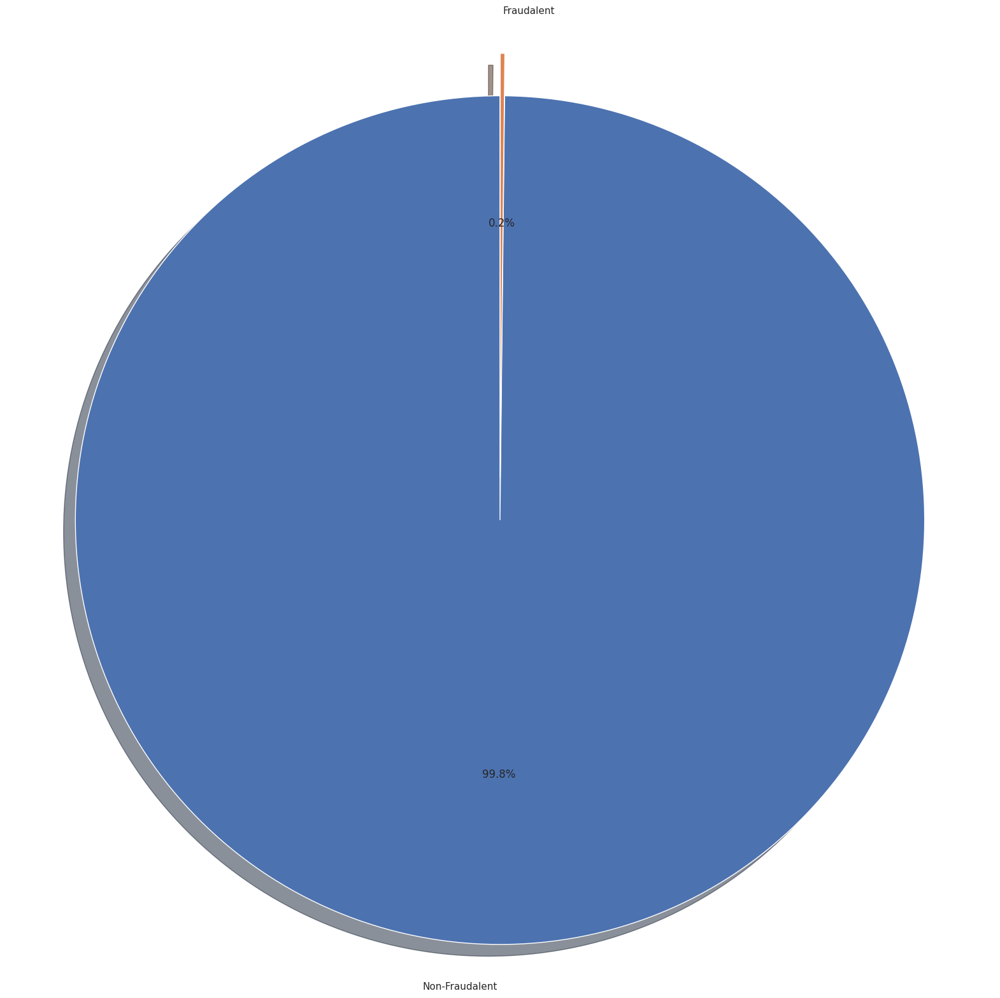

In [ ]:
#plt.title('Dsitribution of the Fraudalent vs Non-fraudalent transaction in Percentages')
classes=df['Class'].value_counts()
normal_share=classes[0]/df['Class'].count()*100
fraud_share=classes[1]/df['Class'].count()*100


labels = 'Non-Fraudalent', 'Fraudalent'
sizes = [normal_share, fraud_share]
explode = (0, 0.1)

fig1, ax1 = plt.subplots()
ax1.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=90)
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.show()

In [ ]:
print('The percentage without churn prediction is ', round(df['Class'].value_counts()[0]/len(df) * 100,2), '% of the dataset')
print('The percentage with churn prediction is ', round(df['Class'].value_counts()[1]/len(df) * 100,2), '% of the dataset')
print('The ratio of imbalance is', round(df['Class'].value_counts()[1]/df['Class'].value_counts()[0] * 100,2), '%')

The percentage without churn prediction is  99.83 % of the dataset
The percentage with churn prediction is  0.17 % of the dataset
The ratio of imbalance is 0.17 %


### We have 492 fraudalent transactions out of 2,84,807 total credit card transactions

This is a highly imbalanced problem looking at target variable distribution as there are many more genuine transactions class as compared to the fraudalent transactions. The model would achieve high accuracy as it would mostly predict majority class — transactions which are genuine in our dataset. We will use other metrics for model evaluation such as ROC-AUC , precision and recall to overcome this problem

In [ ]:
#Creating additional columns
Delta_Time = pd.to_timedelta(df['Time'], unit='s')

#Create derived columns Min and hour
df['Time_Day'] = (Delta_Time.dt.components.days).astype(int)
df['Time_Hour'] = (Delta_Time.dt.components.hours).astype(int)
df['Time_Min'] = (Delta_Time.dt.components.minutes).astype(int)

Text(0.5, 1.05, 'Time vs Class Distribution')

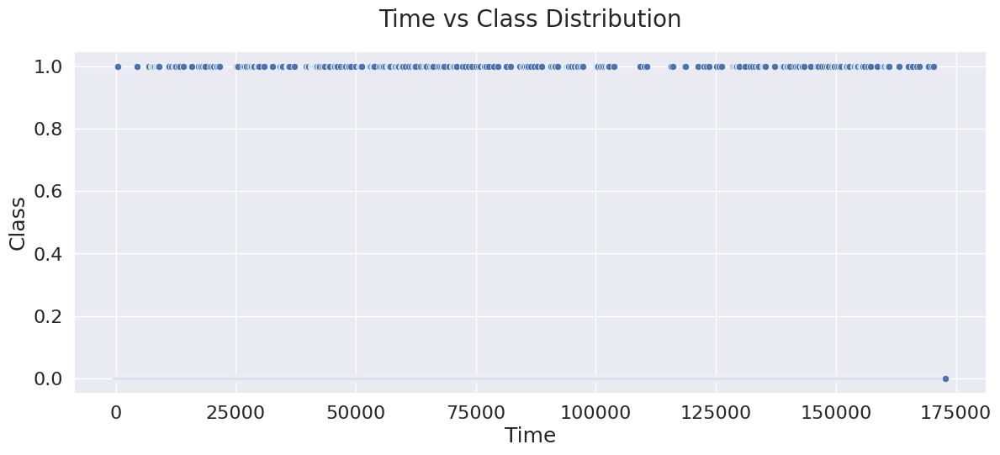

In [ ]:
# Create a scatter plot to observe the distribution of classes with time

# Using Bivariate Analysis

fig = plt.figure(figsize=(14, 18))
cmap = sns.color_palette('Set2')

# PLot the relation between the variables:

plt.subplot(3,1,1)
sns.scatterplot(x=df['Time'], y='Class', palette=cmap, data=df)
plt.xlabel('Time', size=18)
plt.ylabel('Class', size=18)
plt.tick_params(axis='x', labelsize=16)
plt.tick_params(axis='y', labelsize=16)
plt.title('Time vs Class Distribution', size=20, y=1.05)

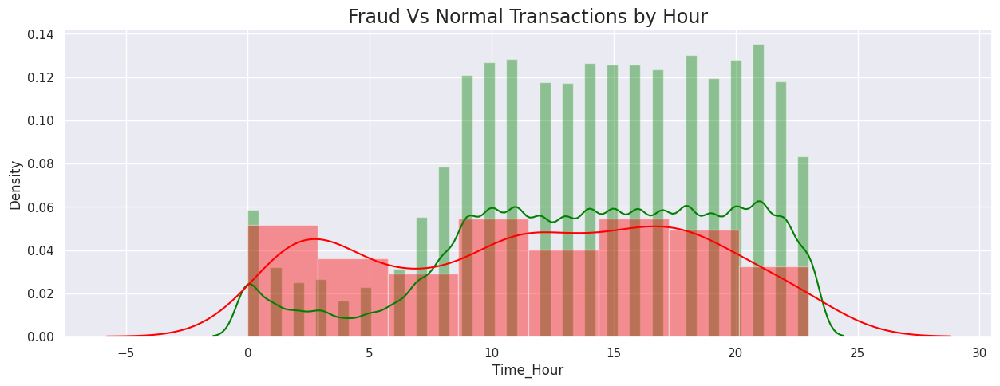

In [ ]:
#Frauds vs non-Fraud trasactions by hour
plt.figure(figsize=(15,5))
sns.distplot(df[df['Class'] == 0]["Time_Hour"], color='green')
sns.distplot(df[df['Class'] == 1]["Time_Hour"], color='red')
plt.title('Fraud Vs Normal Transactions by Hour', fontsize=17)
plt.show()

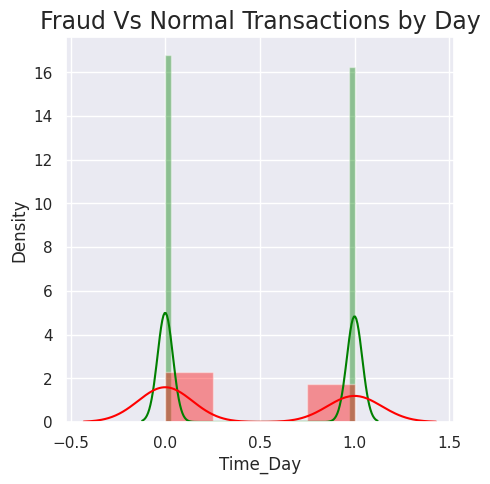

In [ ]:
#Frauds vs non-Fraud trasactions by day
plt.figure(figsize=(5,5))
sns.distplot(df[df['Class'] == 0]["Time_Day"], color='green')
sns.distplot(df[df['Class'] == 1]["Time_Day"], color='red')
plt.title('Fraud Vs Normal Transactions by Day', fontsize=17)
plt.show()

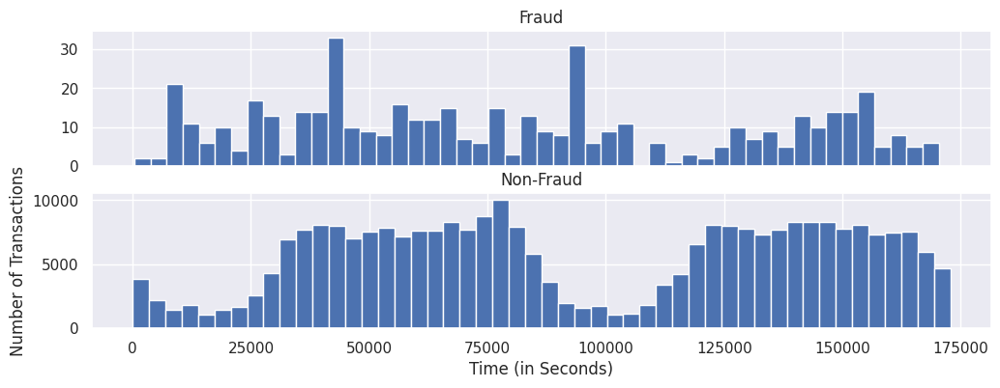

In [ ]:
f, (ax1, ax2) = plt.subplots(2, 1, sharex=True, figsize=(12,4))

bins = 50

ax1.hist(df.Time[df.Class == 1], bins = bins)
ax1.set_title('Fraud')

ax2.hist(df.Time[df.Class == 0], bins = bins)
ax2.set_title('Non-Fraud')

plt.xlabel('Time (in Seconds)')
plt.ylabel('Number of Transactions')
plt.show()

In [ ]:
# Create a scatter plot to observe the distribution of classes with Amount
df_Fraud = df[df['Class'] == 1]
df_Regular = df[df['Class'] == 0]

# Fraud Transaction Amount Stats
print(df_Fraud["Amount"].describe())

count     492.000000
mean      122.211321
std       256.683288
min         0.000000
25%         1.000000
50%         9.250000
75%       105.890000
max      2125.870000
Name: Amount, dtype: float64


In [ ]:
#Regular Transaction Amount Stats
print(df_Regular["Amount"].describe())

count    284315.000000
mean         88.291022
std         250.105092
min           0.000000
25%           5.650000
50%          22.000000
75%          77.050000
max       25691.160000
Name: Amount, dtype: float64


Text(0.5, 1.05, 'Amount vs Class Distribution')

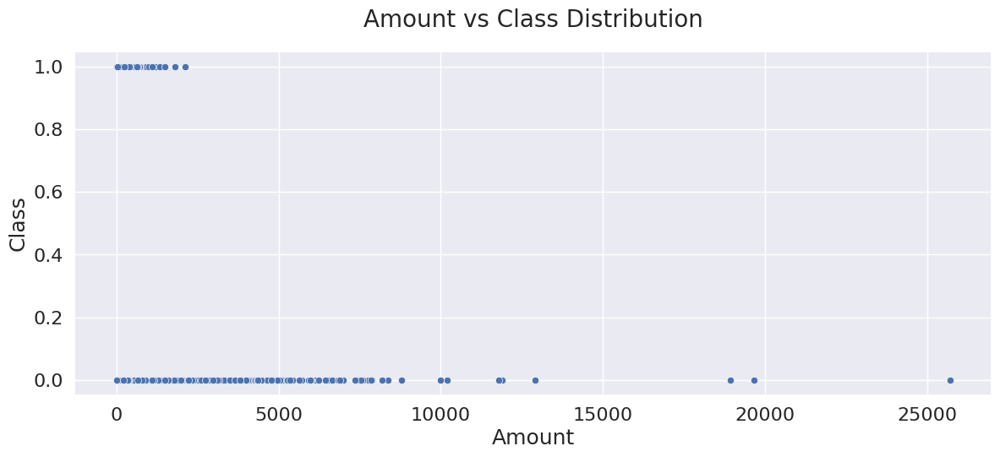

In [ ]:
# Creating a scatter plot to observe the distribution of classes with Amount

# Using Bivariate Analysis


fig = plt.figure(figsize=(14, 18))
cmap = sns.color_palette('Set1')

# PLot the relation between the variables:

plt.subplot(3,1,1)
sns.scatterplot(x=df['Amount'], y='Class', palette=cmap, data=df)
plt.xlabel('Amount', size=18)
plt.ylabel('Class', size=18)
plt.tick_params(axis='x', labelsize=16)
plt.tick_params(axis='y', labelsize=16)
plt.title('Amount vs Class Distribution', size=20, y=1.05)


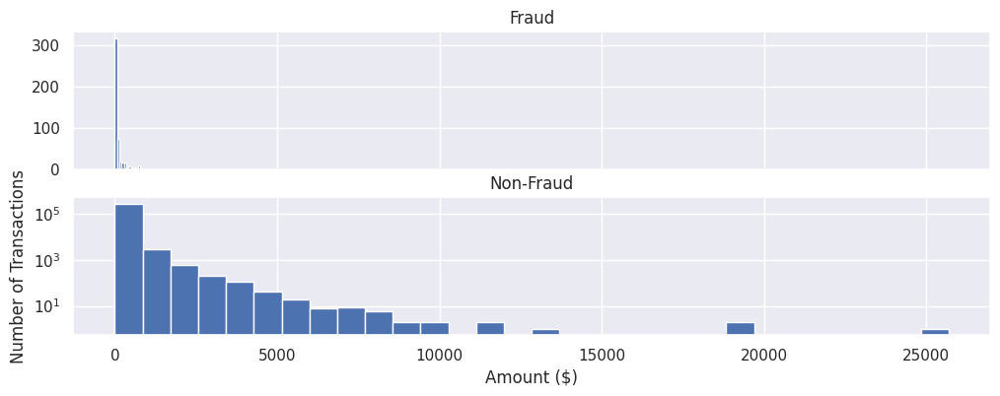

In [ ]:
f, (ax1, ax2) = plt.subplots(2, 1, sharex=True, figsize=(12,4))

bins = 30

ax1.hist(df.Amount[df.Class == 1], bins = bins)
ax1.set_title('Fraud')

ax2.hist(df.Amount[df.Class == 0], bins = bins)
ax2.set_title('Non-Fraud')

plt.xlabel('Amount ($)')
plt.ylabel('Number of Transactions')
plt.yscale('log')
plt.show()

In [ ]:
# Understanding more on the correlation in data:
print("Most important features relative to target variable Class")

corr_initial = df.corr()['Class']

# convert series to dataframe so it can be sorted
corr_initial = pd.DataFrame(corr_initial)

# correct column label from SalePrice to correlation
corr_initial.columns = ["Correlation"]

# sorting correlation
corr_initial2 = corr_initial.sort_values(by=['Correlation'], ascending=False)
corr_initial2.head(5)

Most important features relative to target variable Class


,Correlation
Class,1.000000
V11,0.154876
V4,0.133447
V2,0.091289
V21,0.040413


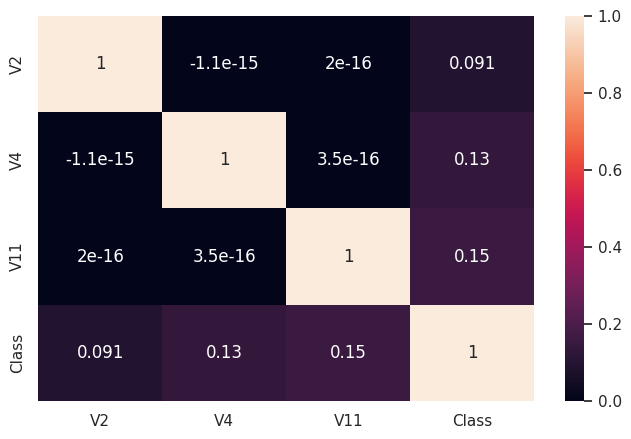

In [ ]:
# Plotting the heatmap again for relatively strong correlation (i.e. >0.09) with the target variable:

top_feature = corr.index[abs(corr['Class']>0.09)]
plt.subplots(figsize=(8, 5))
top_corr = df[top_feature].corr()
sns.heatmap(top_corr, annot=True)
plt.show()

**Plotting Distribution of Variable**

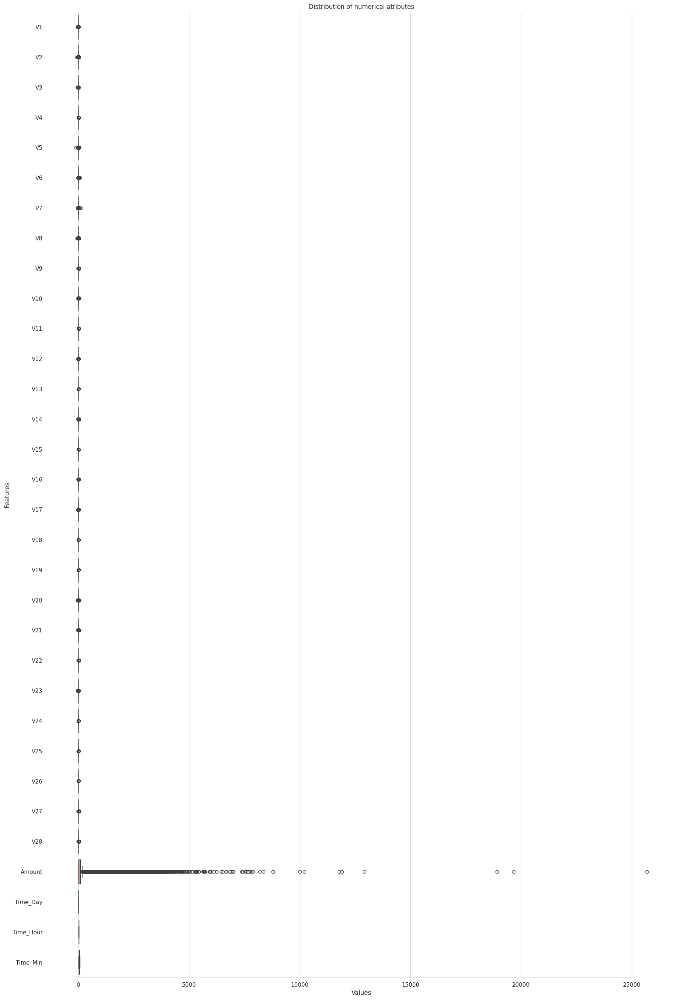

In [ ]:
# Boxplot to understand the distribution of numerical variables :

# Selecting only numerical feature from the dataframe:
numeric_features = df.select_dtypes(include=[np.number]).columns.tolist()

# Excluding BINARY target feature and Time variable as its not needed for transformation :
li_not_plot = ['Class','Time']
li_transform_num_feats = [c for c in list(numeric_features) if c not in li_not_plot]

sns.set_style("whitegrid")
f, ax = plt.subplots(figsize=(22,34))
# Using log scale:
#ax.set_xscale("log")
ax = sns.boxplot(data=df[li_transform_num_feats] , orient="h", palette="Paired")
ax.set(ylabel="Features")
ax.set(xlabel="Values")
ax.set(title="Distribution of numerical atributes")
sns.despine(trim=True,left=True)

In [ ]:
# Drop unnecessary columns
df.drop('Time', axis = 1, inplace= True)  # We have min and hour derived columns
# day/minutes might not be very useful as this is not time series data, we will keep only derived column hour
df.drop(['Time_Day', 'Time_Min'], axis = 1, inplace= True)

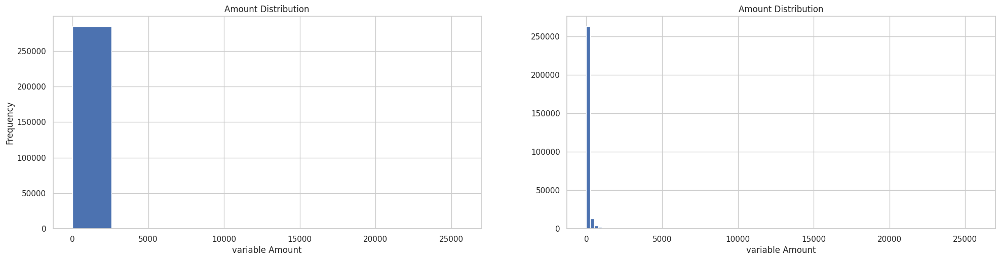

In [ ]:
# Understanding the Amount variable as it is not PCA transformed variable :

plt.figure(figsize=(24, 12))

plt.subplot(2,2,1)
plt.title('Amount Distribution')
df['Amount'].astype(int).plot.hist();
plt.xlabel("variable Amount")
#plt.ylabel("Frequency")

plt.subplot(2,2,2)
plt.title('Amount Distribution')
sns.set()
plt.xlabel("variable Amount")
plt.hist(df['Amount'],bins=100)
plt.show()


### Splitting the data into train & test data

In [ ]:
y= df['Class']

In [ ]:
X = df.drop(['Class'], axis=1)

In [ ]:
X.head(3)

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Time_Hour
0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0


In [ ]:
from sklearn import model_selection

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=100, test_size=0.25)

##### Preserve X_test & y_test to evaluate on the test data once you build the model

In [ ]:
print(np.sum(y))
print(np.sum(y_train))
print(np.sum(y_test))

492
370
122


### Plotting the distribution of a variable

In [ ]:
columns_list = list(X.columns.values)
columns_list

['V1',
 'V2',
 'V3',
 'V4',
 'V5',
 'V6',
 'V7',
 'V8',
 'V9',
 'V10',
 'V11',
 'V12',
 'V13',
 'V14',
 'V15',
 'V16',
 'V17',
 'V18',
 'V19',
 'V20',
 'V21',
 'V22',
 'V23',
 'V24',
 'V25',
 'V26',
 'V27',
 'V28',
 'Amount',
 'Time_Hour']

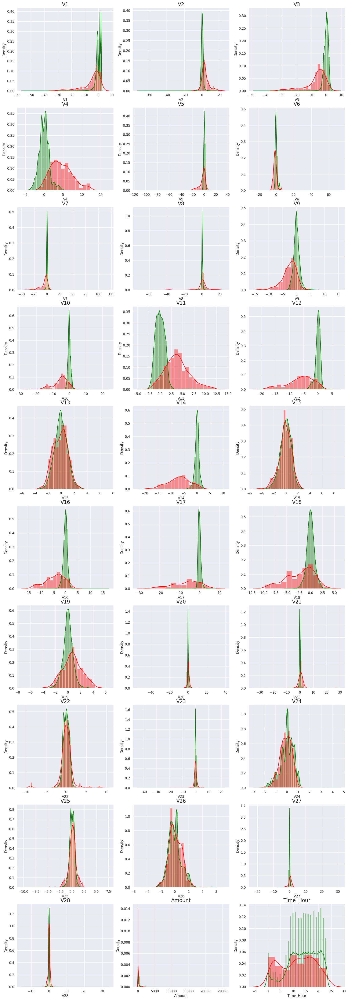

In [ ]:
# plot the histogram of a variable from the dataset to see the skewness
normal_records = df.Class == 0
fraud_records = df.Class == 1

plt.figure(figsize=(20, 60))
for n, col in enumerate(columns_list):
  plt.subplot(10,3,n+1)
  sns.distplot(X[col][normal_records], color='green')
  sns.distplot(X[col][fraud_records], color='red')
  plt.title(col, fontsize=17)
plt.show()


**Create model functions for Logistic Regression, Decision Tree, SVM, XGBoost, Random Forest, KNN**

In [ ]:
#Dataframe to store results
df_Results = pd.DataFrame(columns=['Data_Imbalance_Handiling','Model','Accuracy','roc_value','threshold'])

In [ ]:
def Plot_confusion_matrix(y_test, pred_test):
  cm = confusion_matrix(y_test, pred_test)
  plt.clf()
  plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Accent)
  classNames = ['Non-Fraudalent','Fraudalent']
  plt.title('Confusion Matrix - Test Data')
  plt.ylabel('True label')
  plt.xlabel('Predicted label')
  tick_marks = np.arange(len(classNames))
  plt.xticks(tick_marks, classNames, rotation=45)
  plt.yticks(tick_marks, classNames)
  s = [['TN','FP'], ['FN', 'TP']]

  for i in range(2):
      for j in range(2):
          plt.text(j,i, str(s[i][j])+" = "+str(cm[i][j]),fontsize=12)
  plt.show()

In [ ]:
def buildAndRunSVMModels(df_Results, DataImabalance, X_train,y_train, X_test, y_test ):
  #Evaluate SVM model with sigmoid kernel  model
  from sklearn.svm import SVC
  from sklearn.metrics import accuracy_score
  from sklearn.metrics import roc_auc_score

  clf = SVC(kernel='sigmoid', random_state=42)
  clf.fit(X_train,y_train)
  y_pred_SVM = clf.predict(X_test)
  SVM_Score = accuracy_score(y_test,y_pred_SVM)
  print("accuracy_score : {0}".format(SVM_Score))
  print("Confusion Matrix")
  Plot_confusion_matrix(y_test, y_pred_SVM)
  print("classification Report")
  print(classification_report(y_test, y_pred_SVM))



  # Run classifier
  classifier = SVC(kernel='sigmoid' , probability=True)
  svm_probs = classifier.fit(X_train, y_train).predict_proba(X_test)[:, 1]

  # Calculate roc auc
  roc_value = roc_auc_score(y_test, svm_probs)

  print("SVM roc_value: {0}" .format(roc_value))
  fpr, tpr, thresholds = metrics.roc_curve(y_test, svm_probs)
  threshold = thresholds[np.argmax(tpr-fpr)]
  print("SVM threshold: {0}".format(threshold))
  roc_auc = metrics.auc(fpr, tpr)
  print("ROC for the test dataset",'{:.1%}'.format(roc_auc))
  plt.plot(fpr,tpr,label="Test, auc="+str(roc_auc))
  plt.legend(loc=4)
  plt.show()

  df_Results = pd.concat([df_Results, pd.DataFrame({'Data_Imbalance_Handiling': DataImabalance,'Model': 'SVM','Accuracy': SVM_Score,'roc_value': roc_value,'threshold': threshold}, index=[0])],ignore_index= True)

  return df_Results

In [ ]:
def buildAndRunKNNModels(df_Results,DataImabalance, X_train,y_train, X_test, y_test ):
  #Evaluate KNN  model
  from sklearn.neighbors import KNeighborsClassifier
  from sklearn.metrics import roc_auc_score
  #create KNN model and fit the model with train dataset
  knn = KNeighborsClassifier(n_neighbors = 5,n_jobs=16)
  knn.fit(X_train,y_train)
  score = knn.score(X_test,y_test)
  print("model score")
  print(score)

  #Accuracy
  y_pred = knn.predict(X_test)
  KNN_Accuracy = metrics.accuracy_score(y_pred=y_pred, y_true=y_test)
  print("Confusion Matrix")
  Plot_confusion_matrix(y_test, y_pred)
  print("classification Report")
  print(classification_report(y_test, y_pred))


  knn_probs = knn.predict_proba(X_test)[:, 1]

  # Calculate roc auc
  knn_roc_value = roc_auc_score(y_test, knn_probs)
  print("KNN roc_value: {0}" .format(knn_roc_value))
  fpr, tpr, thresholds = metrics.roc_curve(y_test, knn_probs)
  threshold = thresholds[np.argmax(tpr-fpr)]
  print("KNN threshold: {0}".format(threshold))

  roc_auc = metrics.auc(fpr, tpr)
  print("ROC for the test dataset",'{:.1%}'.format(roc_auc))
  plt.plot(fpr,tpr,label="Test, auc="+str(roc_auc))
  plt.legend(loc=4)
  plt.show()

  df_Results = pd.concat([df_Results, pd.DataFrame({'Data_Imbalance_Handiling': DataImabalance,'Model': 'KNN','Accuracy': score,'roc_value': knn_roc_value,'threshold': threshold}, index=[0])],ignore_index= True)

  return df_Results




In [ ]:
def buildAndRunTreeModels(df_Results, DataImabalance, X_train,y_train, X_test, y_test ):
  #Evaluate Decision Tree model with 'gini' & 'entropy'
  from sklearn.tree import DecisionTreeClassifier
  from sklearn.metrics import roc_auc_score
  criteria = ['gini', 'entropy']
  scores = {}

  for c in criteria:
      dt = DecisionTreeClassifier(criterion = c, random_state=42)
      dt.fit(X_train, y_train)
      y_pred = dt.predict(X_test)
      test_score = dt.score(X_test, y_test)
      tree_preds = dt.predict_proba(X_test)[:, 1]
      tree_roc_value = roc_auc_score(y_test, tree_preds)
      scores = test_score
      print(c + " score: {0}" .format(test_score))
      print("Confusion Matrix")
      Plot_confusion_matrix(y_test, y_pred)
      print("classification Report")
      print(classification_report(y_test, y_pred))
      print(c + " tree_roc_value: {0}" .format(tree_roc_value))
      fpr, tpr, thresholds = metrics.roc_curve(y_test, tree_preds)
      threshold = thresholds[np.argmax(tpr-fpr)]
      print("Tree threshold: {0}".format(threshold))
      roc_auc = metrics.auc(fpr, tpr)
      print("ROC for the test dataset",'{:.1%}'.format(roc_auc))
      plt.plot(fpr,tpr,label="Test, auc="+str(roc_auc))
      plt.legend(loc=4)
      plt.show()

      df_Results = pd.concat([df_Results, pd.DataFrame({'Data_Imbalance_Handiling': DataImabalance,'Model': 'Tree Model with {0} criteria'.format(c),'Accuracy': test_score,'roc_value': tree_roc_value,'threshold': threshold}, index=[0])],ignore_index= True)

  return df_Results



In [ ]:
def buildAndRunXGBoostModels(df_Results, DataImabalance,X_train,y_train, X_test, y_test ):
  #Evaluate XGboost model
  from xgboost import XGBClassifier
  from sklearn.metrics import roc_auc_score
  # fit model no training data
  XGBmodel = XGBClassifier(random_state=42)
  XGBmodel.fit(X_train, y_train)
  y_pred = XGBmodel.predict(X_test)

  XGB_test_score = XGBmodel.score(X_test, y_test)
  print('Model Accuracy: {0}'.format(XGB_test_score))

  print("Confusion Matrix")
  Plot_confusion_matrix(y_test, y_pred)
  print("classification Report")
  print(classification_report(y_test, y_pred))
  # Probabilities for each class
  XGB_probs = XGBmodel.predict_proba(X_test)[:, 1]

  # Calculate roc auc
  XGB_roc_value = roc_auc_score(y_test, XGB_probs)

  print("XGboost roc_value: {0}" .format(XGB_roc_value))
  fpr, tpr, thresholds = metrics.roc_curve(y_test, XGB_probs)
  threshold = thresholds[np.argmax(tpr-fpr)]
  print("XGBoost threshold: {0}".format(threshold))
  roc_auc = metrics.auc(fpr, tpr)
  print("ROC for the test dataset",'{:.1%}'.format(roc_auc))
  plt.plot(fpr,tpr,label="Test, auc="+str(roc_auc))
  plt.legend(loc=4)
  plt.show()

  df_Results = pd.concat([df_Results, pd.DataFrame({'Data_Imbalance_Handiling': DataImabalance,'Model': 'XGBoost','Accuracy': XGB_test_score,'roc_value': XGB_roc_value,'threshold': threshold}, index=[0])],ignore_index= True)

  return df_Results




In [ ]:
def buildAndRunRandomForestModels(df_Results, DataImabalance, X_train,y_train, X_test, y_test ):
  #Evaluate Random Forest model

  from sklearn.ensemble import RandomForestClassifier
  from sklearn.metrics import roc_auc_score

  # Create the model with 100 trees
  RF_model = RandomForestClassifier(n_estimators=100,
                                bootstrap = True,
                                max_features = 'sqrt', random_state=42)
  # Fit on training data
  RF_model.fit(X_train, y_train)
  RF_test_score = RF_model.score(X_test, y_test)
  RF_model.predict(X_test)

  print('Model Accuracy: {0}'.format(RF_test_score))


  # Actual class predictions
  rf_predictions = RF_model.predict(X_test)

  print("Confusion Matrix")
  Plot_confusion_matrix(y_test, rf_predictions)
  print("classification Report")
  print(classification_report(y_test, rf_predictions))

  # Probabilities for each class
  rf_probs = RF_model.predict_proba(X_test)[:, 1]

  # Calculate roc auc
  roc_value = roc_auc_score(y_test, rf_probs)

  print("Random Forest roc_value: {0}" .format(roc_value))
  fpr, tpr, thresholds = metrics.roc_curve(y_test, rf_probs)
  threshold = thresholds[np.argmax(tpr-fpr)]
  print("Random Forest threshold: {0}".format(threshold))
  roc_auc = metrics.auc(fpr, tpr)
  print("ROC for the test dataset",'{:.1%}'.format(roc_auc))
  plt.plot(fpr,tpr,label="Test, auc="+str(roc_auc))
  plt.legend(loc=4)
  plt.show()

  df_Results = pd.concat([df_Results, pd.DataFrame({'Data_Imbalance_Handiling': DataImabalance,'Model': 'Random Forest','Accuracy': RF_test_score,'roc_value': roc_value,'threshold': threshold}, index=[0])],ignore_index= True)

  return df_Results

In [ ]:
def buildAndRunLogisticModels(df_Results, DataImabalance, X_train,y_train, X_test, y_test ):

  # Logistic Regression
  from sklearn import linear_model #import the package
  from sklearn.model_selection import KFold

  num_C = list(np.power(10.0, np.arange(-10, 10)))
  cv_num = KFold(n_splits=10, shuffle=True, random_state=42)

  searchCV_l2 = linear_model.LogisticRegressionCV(
          Cs= num_C
          ,penalty='l2'
          ,scoring='roc_auc'
          ,cv=cv_num
          ,random_state=42
          ,max_iter=10000
          ,fit_intercept=True
          ,solver='newton-cg'
          ,tol=10
      )

  searchCV_l1 = linear_model.LogisticRegressionCV(
          Cs=num_C
          ,penalty='l1'
          ,scoring='roc_auc'
          ,cv=cv_num
          ,random_state=42
          ,max_iter=10000
          ,fit_intercept=True
          ,solver='liblinear'
          ,tol=10
      )
  #searchCV.fit(X_train, y_train)
  searchCV_l2.fit(X_train, y_train)
  searchCV_l1.fit(X_train, y_train)
  print ('Max auc_roc for l2:', searchCV_l2.scores_[1].mean(axis=0).max())
  print ('Max auc_roc for l1:', searchCV_l1.scores_[1].mean(axis=0).max())

  print("Parameters for l2 regularisations")
  print(searchCV_l2.coef_)
  print(searchCV_l2.intercept_)
  print(searchCV_l2.scores_)

  print("Parameters for l1 regularisations")
  print(searchCV_l1.coef_)
  print(searchCV_l1.intercept_)
  print(searchCV_l1.scores_)


  #find predicted vallues
  y_pred_l2 = searchCV_l2.predict(X_test)
  y_pred_l1 = searchCV_l1.predict(X_test)


  #Find predicted probabilities
  y_pred_probs_l2 = searchCV_l2.predict_proba(X_test)[:,1]
  y_pred_probs_l1 = searchCV_l1.predict_proba(X_test)[:,1]

  # Accuaracy of L2/L1 models
  Accuracy_l2 = metrics.accuracy_score(y_pred=y_pred_l2, y_true=y_test)
  Accuracy_l1 = metrics.accuracy_score(y_pred=y_pred_l1, y_true=y_test)

  print("Accuarcy of Logistic model with l2 regularisation : {0}".format(Accuracy_l2))
  print("Confusion Matrix")
  Plot_confusion_matrix(y_test, y_pred_l2)
  print("classification Report")
  print(classification_report(y_test, y_pred_l2))
  print("Accuarcy of Logistic model with l1 regularisation : {0}".format(Accuracy_l1))
  print("Confusion Matrix")
  Plot_confusion_matrix(y_test, y_pred_l1)
  print("classification Report")
  print(classification_report(y_test, y_pred_l1))

  from sklearn.metrics import roc_auc_score
  l2_roc_value = roc_auc_score(y_test, y_pred_probs_l2)
  print("l2 roc_value: {0}" .format(l2_roc_value))
  fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred_probs_l2)
  threshold = thresholds[np.argmax(tpr-fpr)]
  print("l2 threshold: {0}".format(threshold))

  roc_auc = metrics.auc(fpr, tpr)
  print("ROC for the test dataset",'{:.1%}'.format(roc_auc))
  plt.plot(fpr,tpr,label="Test, auc="+str(roc_auc))
  plt.legend(loc=4)
  plt.show()

  df_Results = pd.concat([df_Results, pd.DataFrame({'Data_Imbalance_Handling': DataImabalance,'Model': 'Logistic Regression with L2 Regularisation','Accuracy': Accuracy_l2,'roc_value': l2_roc_value,'threshold': threshold}, index=[0])],ignore_index= True)

  l1_roc_value = roc_auc_score(y_test, y_pred_probs_l1)
  print("l1 roc_value: {0}" .format(l1_roc_value))
  fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred_probs_l1)
  threshold = thresholds[np.argmax(tpr-fpr)]
  print("l1 threshold: {0}".format(threshold))

  roc_auc = metrics.auc(fpr, tpr)
  print("ROC for the test dataset",'{:.1%}'.format(roc_auc))
  plt.plot(fpr,tpr,label="Test, auc="+str(roc_auc))
  plt.legend(loc=4)
  plt.show()

  df_Results = pd.concat([df_Results, pd.DataFrame({'Data_Imbalance_Handling': DataImabalance,'Model': 'Logistic Regression with L1 Regularisation','Accuracy': Accuracy_l1,'roc_value': l1_roc_value,'threshold': threshold}, index=[0])],ignore_index= True)
  return df_Results

### If there is skewness present in the distribution let's use:
- <b>Power Transformer</b> package present in the <b>preprocessing library provided by sklearn</b> to make distribution more gaussian

In [ ]:
# Applying : preprocessing.PowerTransformer(copy=False) to fit & transform the train & test data
from sklearn.preprocessing import PolynomialFeatures, PowerTransformer
pt = PowerTransformer()
pt.fit(X_train)                       ## Fit the PT
X_train_pt = pt.transform(X_train)
X_test_pt = pt.transform(X_test)

In [ ]:
#Creating Dataframes
X_train_pt_df = pd.DataFrame(data=X_train_pt,   columns=columns_list)
X_test_pt_df = pd.DataFrame(data=X_test_pt,   columns=columns_list)

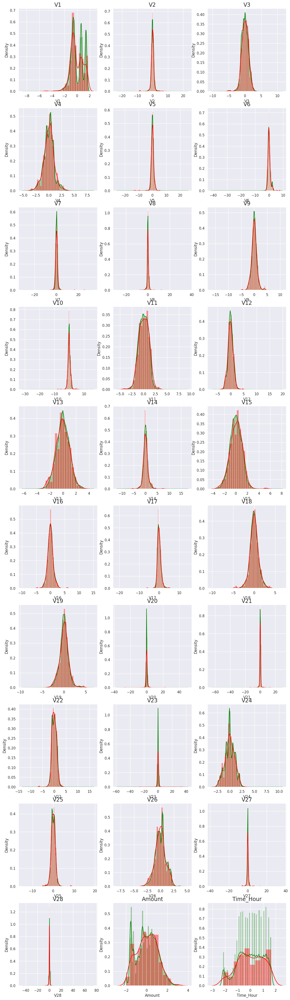

In [ ]:
# Plotting the histogram of a variable from the dataset to see the result
plt.figure(figsize=(15, 55))
for n, col in enumerate(columns_list):
  plt.subplot(10,3,n+1)
  sns.distplot(X_train_pt_df[col][normal_records], color='green')
  sns.distplot(X_train_pt_df[col][fraud_records], color='red')
  plt.title(col, fontsize=17)
plt.show()


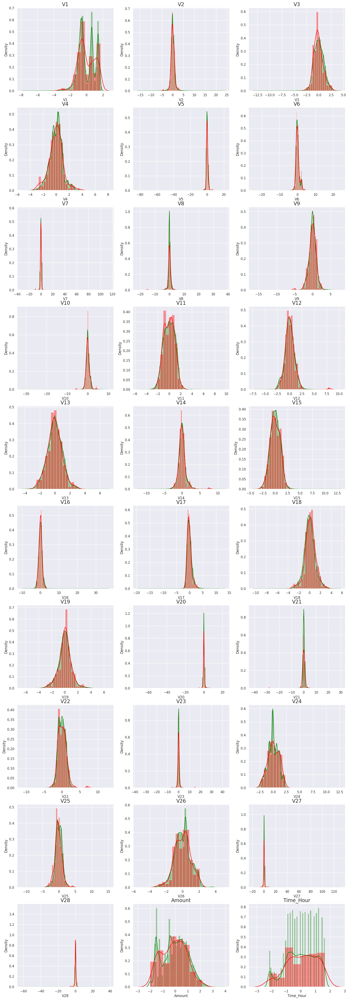

In [ ]:
# Plotting the histogram of a variable from the test dataset
plt.figure(figsize=(20, 60))
for n, col in enumerate(columns_list):
  plt.subplot(10,3,n+1)
  sns.distplot(X_test_pt_df[col][normal_records], color='green')
  sns.distplot(X_test_pt_df[col][fraud_records], color='red')
  plt.title(col, fontsize=17)
plt.show()

## Model Building
- Building different models on the imbalanced dataset and see the result

Logistic Regression with L1 And L2 Regularisation
Max auc_roc for l2: 0.9843201749055741
Max auc_roc for l1: 0.9855032715909994
Parameters for l2 regularisations
[[-8.94563893e-02 -7.17389503e-02 -2.97716801e-01  5.52212614e-01
   3.24712180e-02  1.16611909e-05 -7.17024584e-02 -2.14696526e-01
  -1.91902027e-01 -2.10725277e-01  1.85018142e-01 -4.98673134e-01
  -1.18316532e-01 -6.68976800e-01 -9.05227242e-02 -1.73773765e-01
  -8.42401523e-02  4.25315039e-02 -3.75097356e-02 -3.19884901e-02
   1.03119945e-01  9.17791048e-02 -2.73703249e-02 -1.52932354e-02
  -3.05115776e-03  4.72041519e-03 -5.55433587e-02 -2.37955362e-02
   2.98347738e-02  6.49843355e-02]]
[-8.07757247]
{1: array([[0.87900866, 0.8793355 , 0.8793355 , 0.8793355 , 0.87933688,
        0.87935067, 0.92746284, 0.96958012, 0.97693065, 0.97608941,
        0.97608941, 0.97608941, 0.97608941, 0.97608941, 0.97608941,
        0.97608941, 0.97608941, 0.97608941, 0.97608941, 0.97608941],
       [0.91268334, 0.91246971, 0.91246971, 0.912

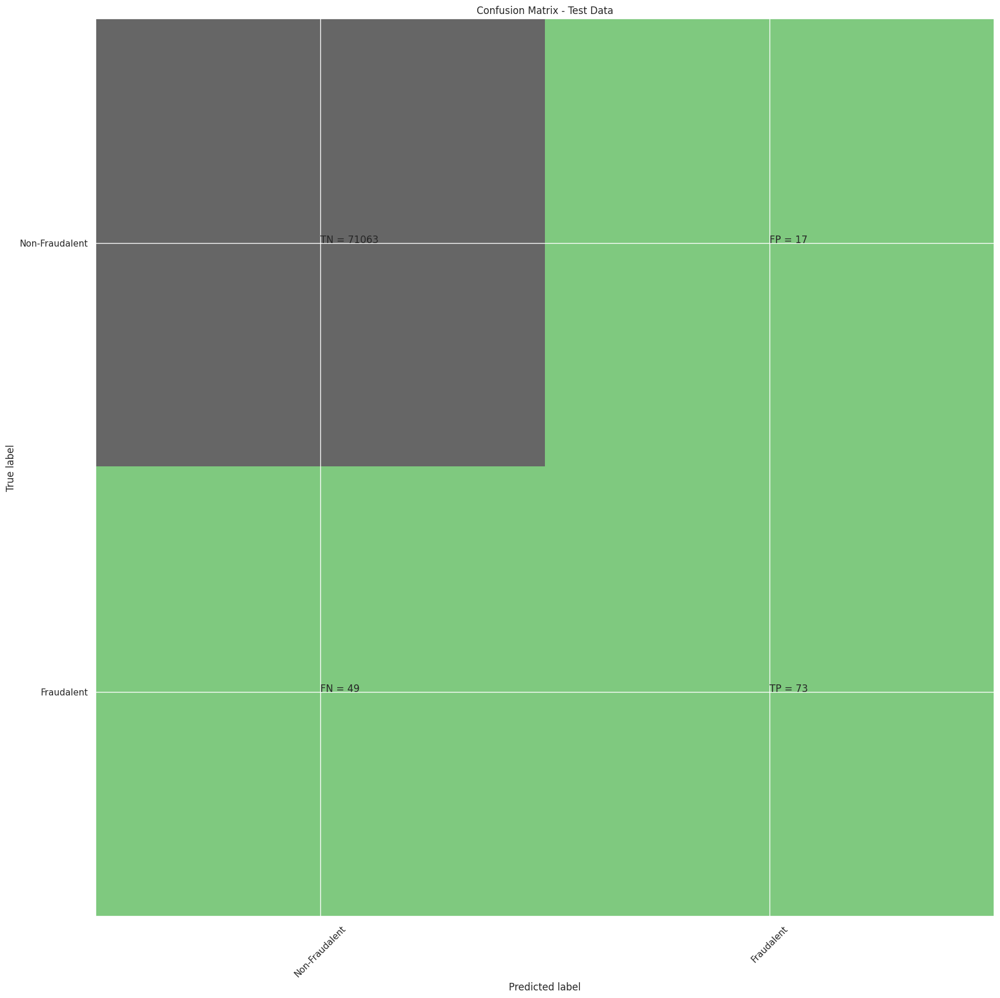

classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     71080
           1       0.81      0.60      0.69       122

    accuracy                           1.00     71202
   macro avg       0.91      0.80      0.84     71202
weighted avg       1.00      1.00      1.00     71202

Accuarcy of Logistic model with l1 regularisation : 0.9990168815482711
Confusion Matrix


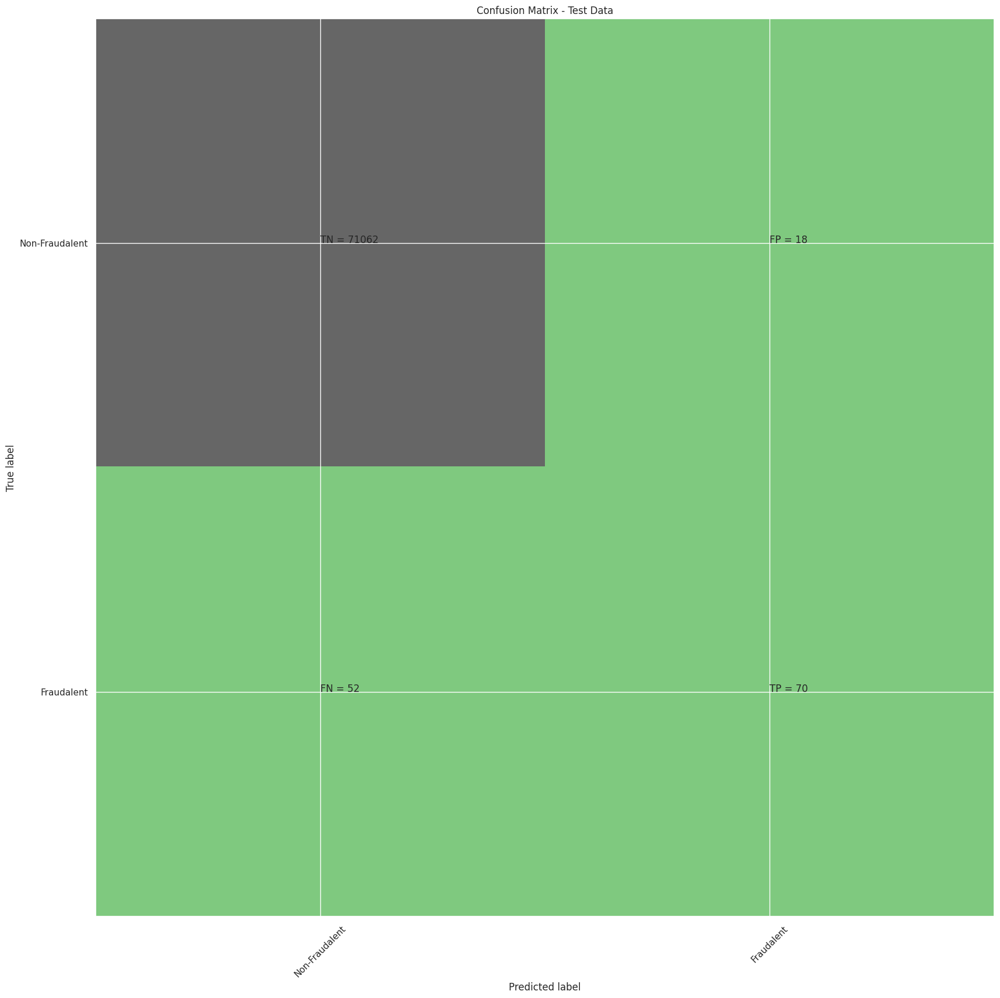

classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     71080
           1       0.80      0.57      0.67       122

    accuracy                           1.00     71202
   macro avg       0.90      0.79      0.83     71202
weighted avg       1.00      1.00      1.00     71202

l2 roc_value: 0.9676710379438545
l2 threshold: 0.0012594469502600313
ROC for the test dataset 96.8%


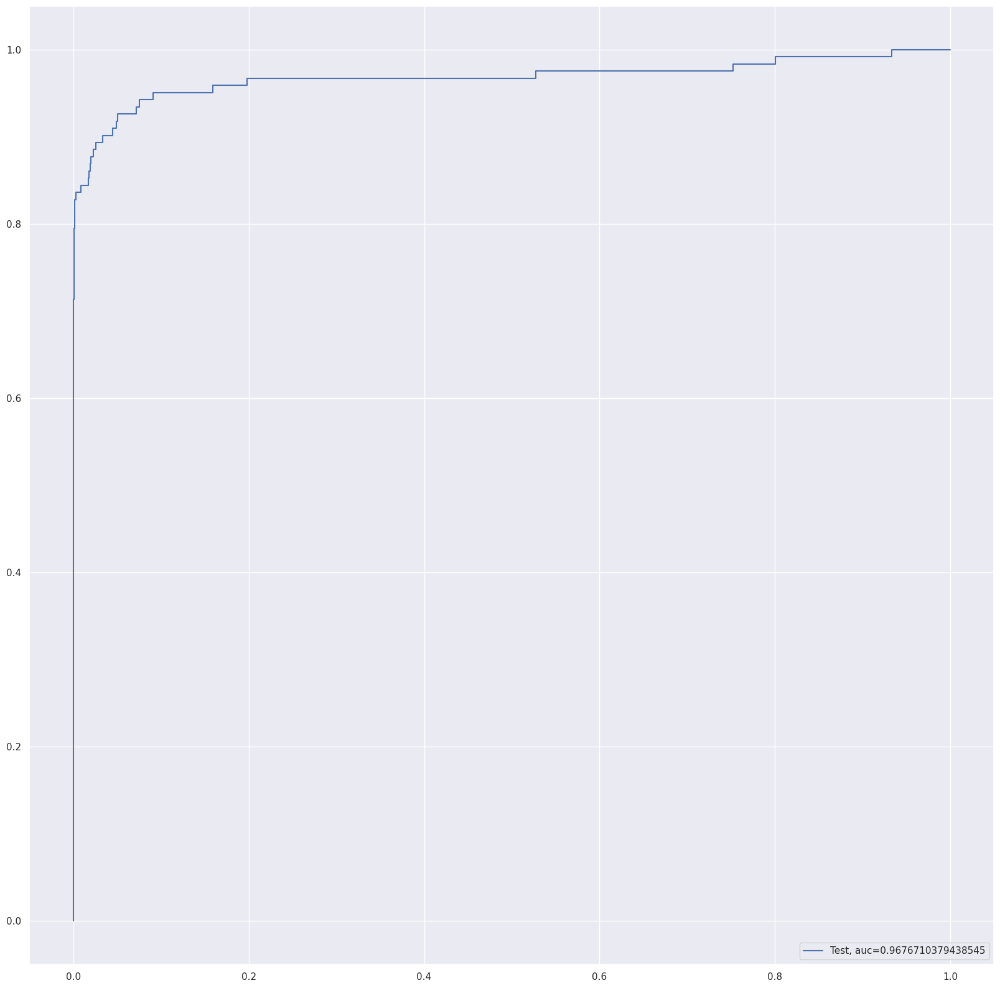

l1 roc_value: 0.9671014880485623
l1 threshold: 0.004576702422906568
ROC for the test dataset 96.7%


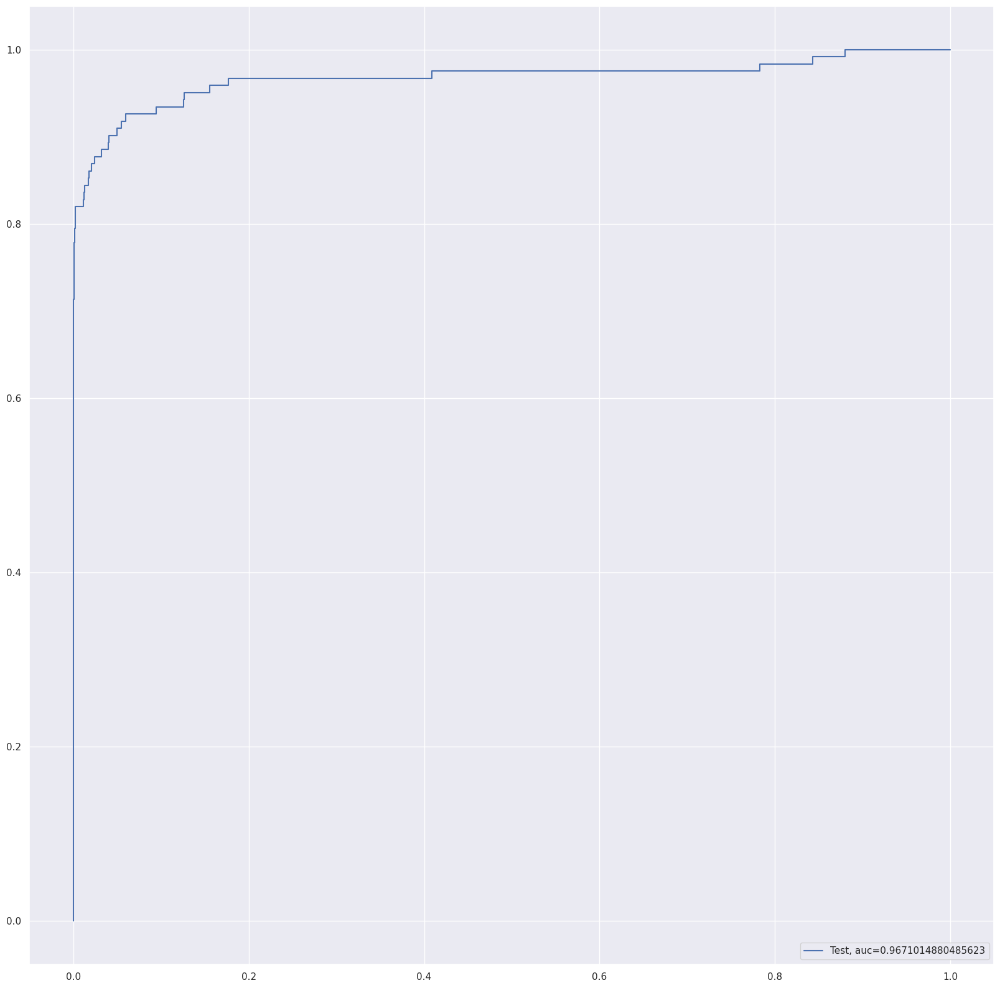

Time Taken by Model: --- 175.58454489707947 seconds ---
--------------------------------------------------------------------------------


In [ ]:
# For Logistic Regression
from sklearn import linear_model #import the package

# Running Logistic Regression with L1 And L2 Regularisation
print("Logistic Regression with L1 And L2 Regularisation")

start_time = time.time()

df_Results = buildAndRunLogisticModels(df_Results,"Power Transformer",X_train_pt_df,y_train, X_test_pt_df, y_test)

print("Time Taken by Model: --- %s seconds ---" % (time.time() - start_time))
print('-'*80 )



Decision Tree Models with  'gini' & 'entropy' criteria
gini score: 0.998876436055167
Confusion Matrix


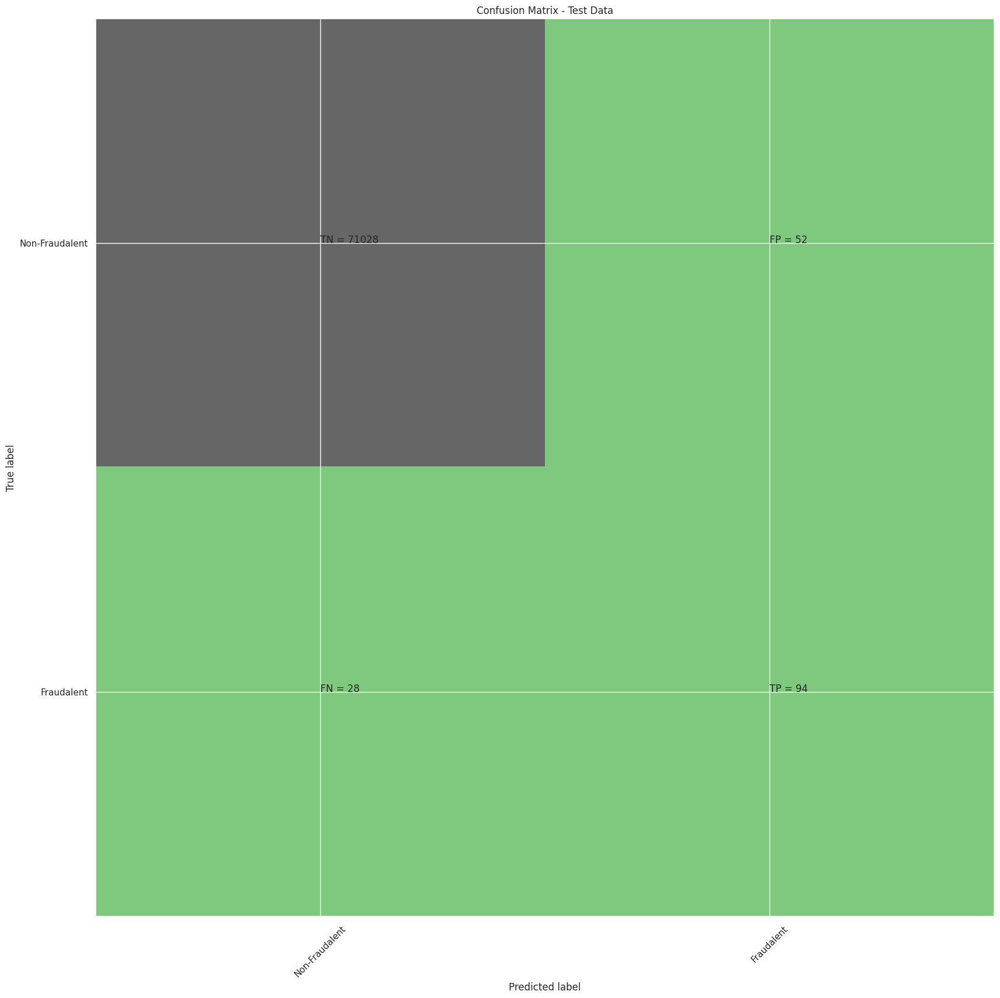

classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     71080
           1       0.64      0.77      0.70       122

    accuracy                           1.00     71202
   macro avg       0.82      0.88      0.85     71202
weighted avg       1.00      1.00      1.00     71202

gini tree_roc_value: 0.8848801166083932
Tree threshold: 1.0
ROC for the test dataset 88.5%


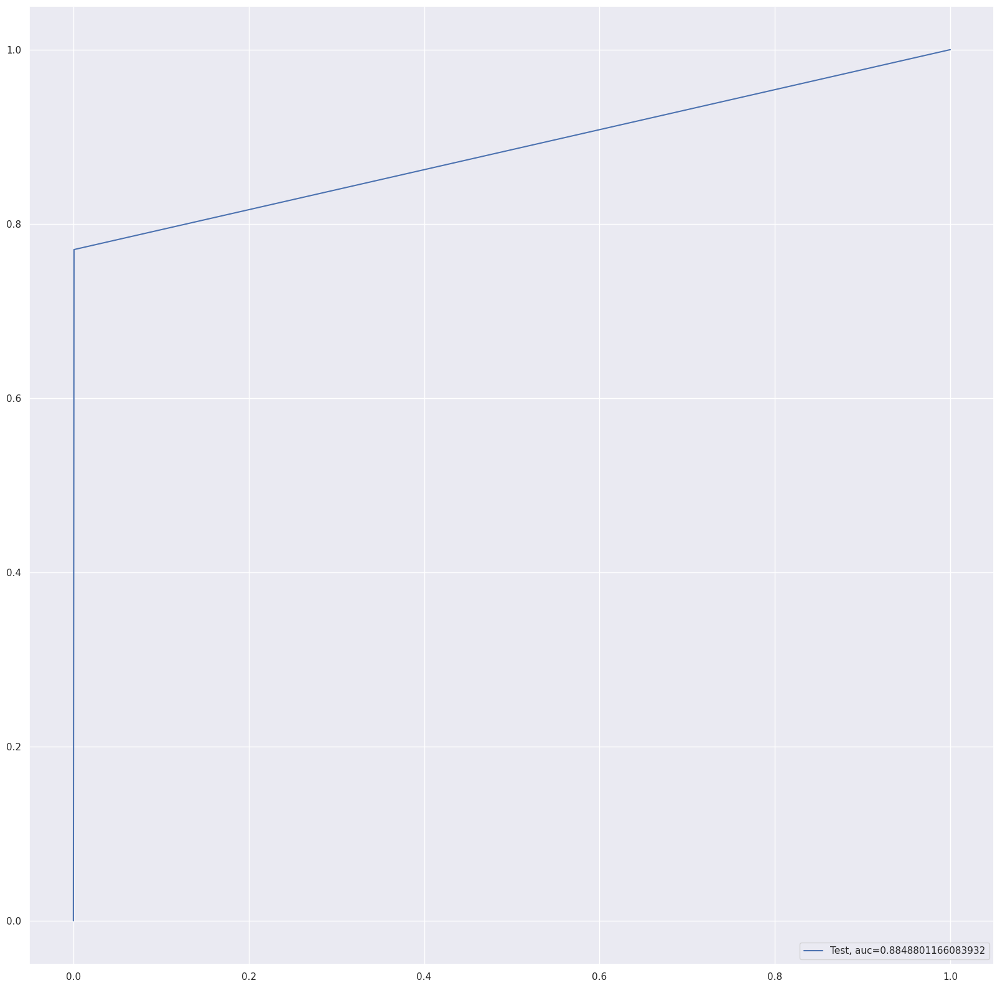

entropy score: 0.9990590151962023
Confusion Matrix


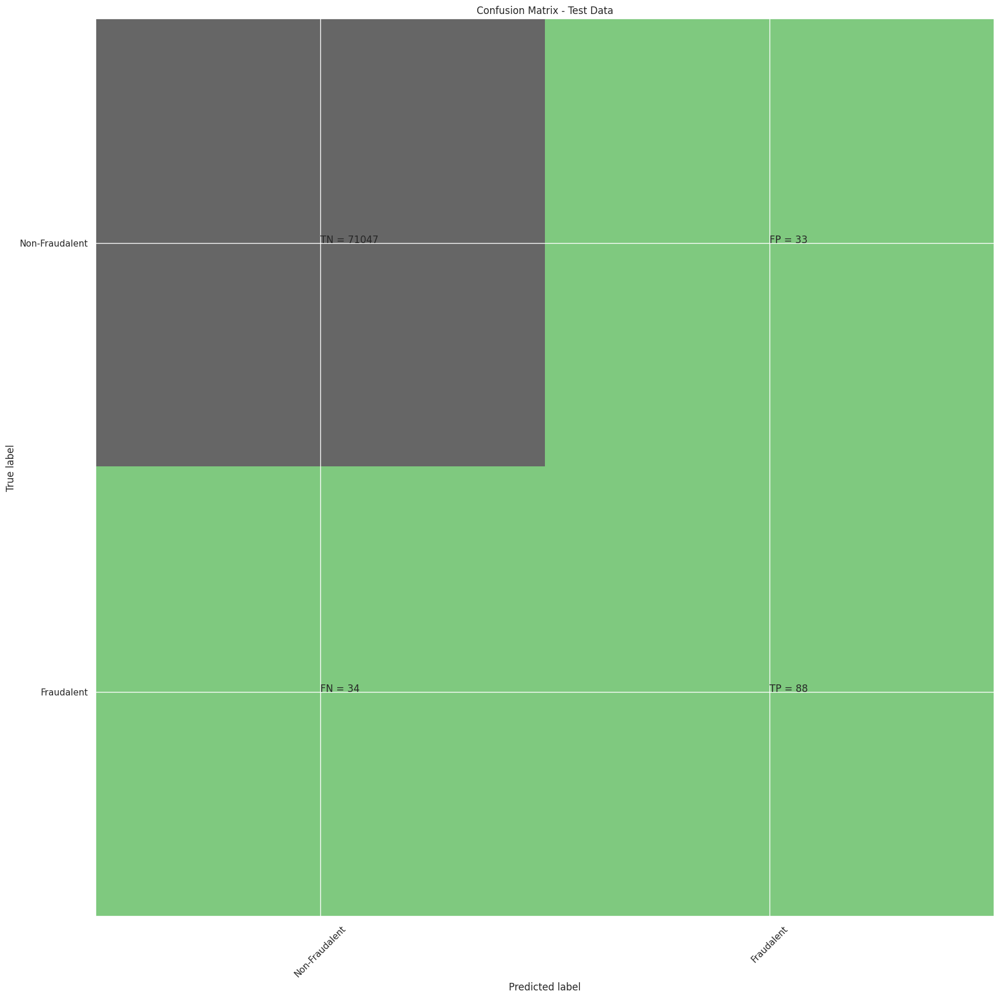

classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     71080
           1       0.73      0.72      0.72       122

    accuracy                           1.00     71202
   macro avg       0.86      0.86      0.86     71202
weighted avg       1.00      1.00      1.00     71202

entropy tree_roc_value: 0.8604236048968145
Tree threshold: 1.0
ROC for the test dataset 86.0%


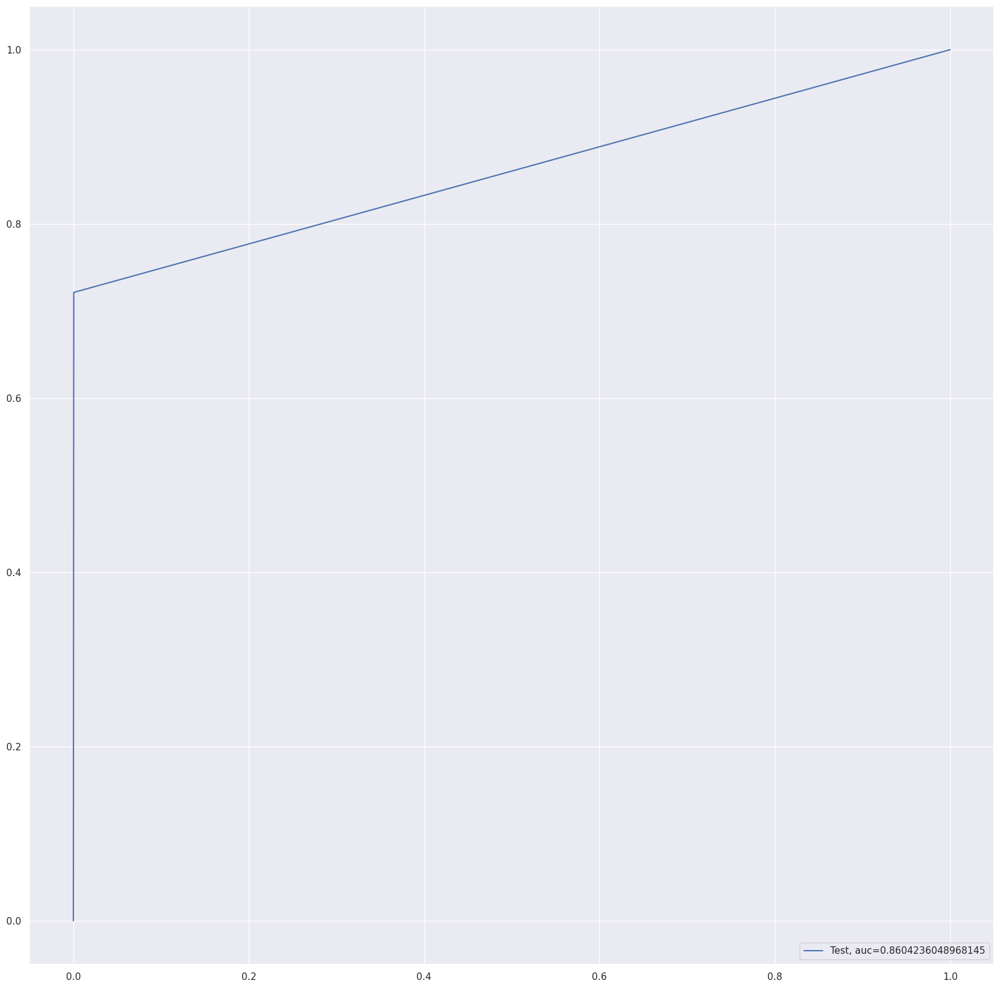

Time Taken by Model: --- 41.89792084693909 seconds ---
--------------------------------------------------------------------------------


In [ ]:
#Running Decision Tree Models with  'gini' & 'entropy' criteria
print("Decision Tree Models with  'gini' & 'entropy' criteria")

start_time = time.time()

df_Results = buildAndRunTreeModels(df_Results,"Power Transformer",X_train_pt_df,y_train, X_test_pt_df, y_test)

print("Time Taken by Model: --- %s seconds ---" % (time.time() - start_time))
print('-'*80 )



Random Forest Model
Model Accuracy: 0.9993539507317211
Confusion Matrix


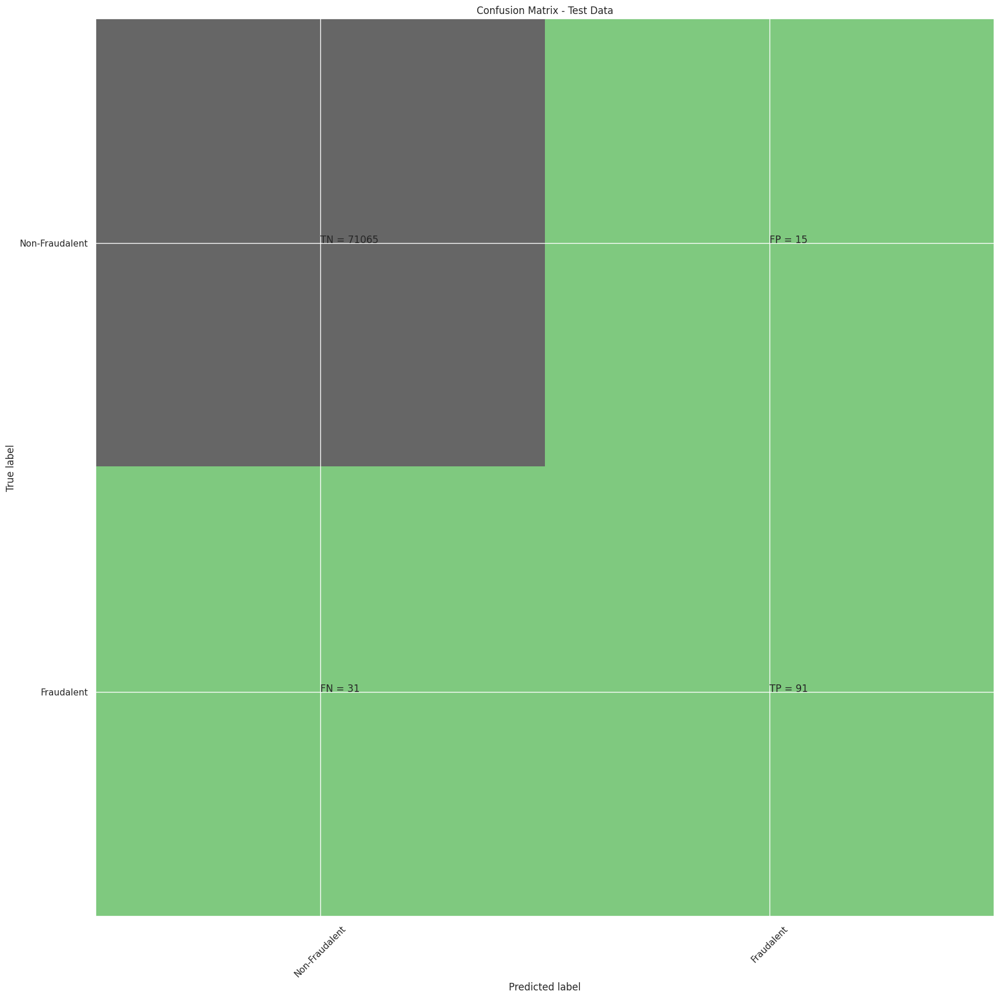

classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     71080
           1       0.86      0.75      0.80       122

    accuracy                           1.00     71202
   macro avg       0.93      0.87      0.90     71202
weighted avg       1.00      1.00      1.00     71202

Random Forest roc_value: 0.9325522154672176
Random Forest threshold: 0.02
ROC for the test dataset 93.3%


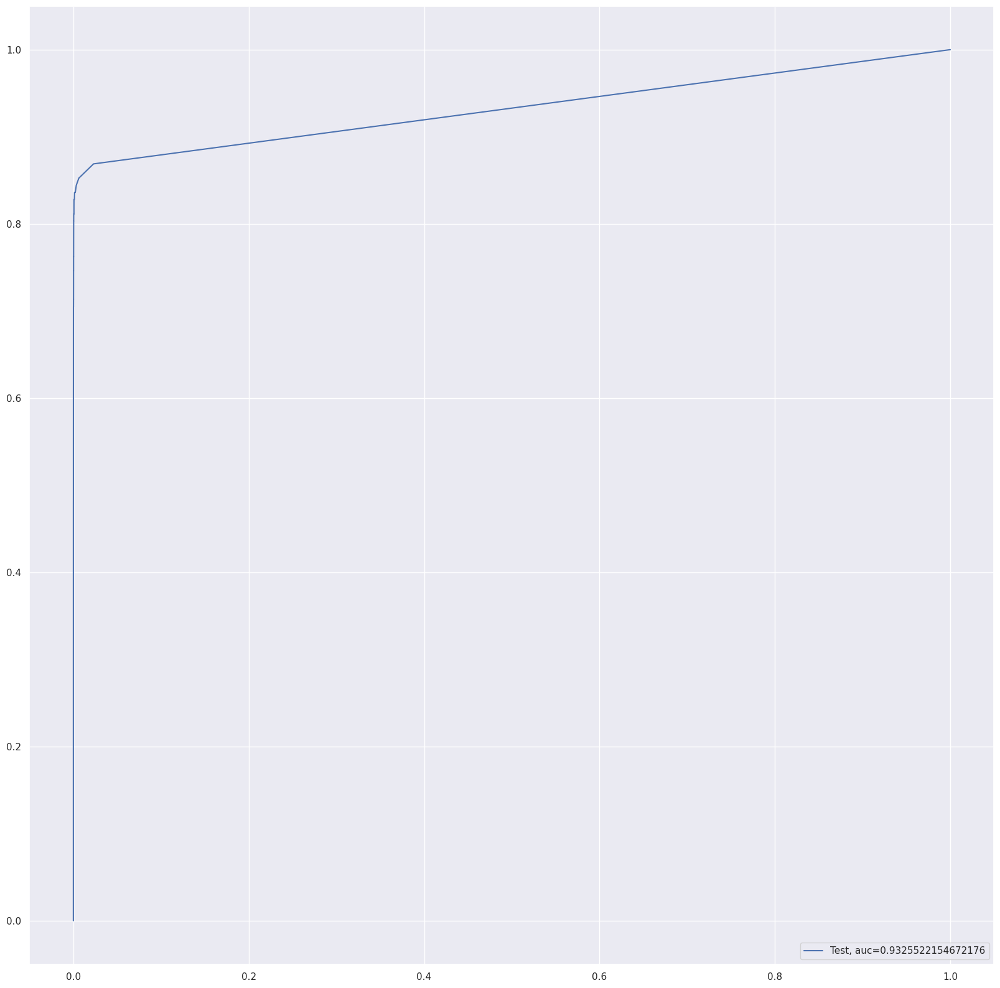

Time Taken by Model: --- 260.11158990859985 seconds ---
--------------------------------------------------------------------------------


In [ ]:
#Run Random Forest Model
print("Random Forest Model")

start_time = time.time()

df_Results = buildAndRunRandomForestModels(df_Results,"Power Transformer",X_train_pt_df,y_train, X_test_pt_df, y_test)

print("Time Taken by Model: --- %s seconds ---" % (time.time() - start_time))
print('-'*80 )



XGBoost Model
Model Accuracy: 0.9994803516755147
Confusion Matrix


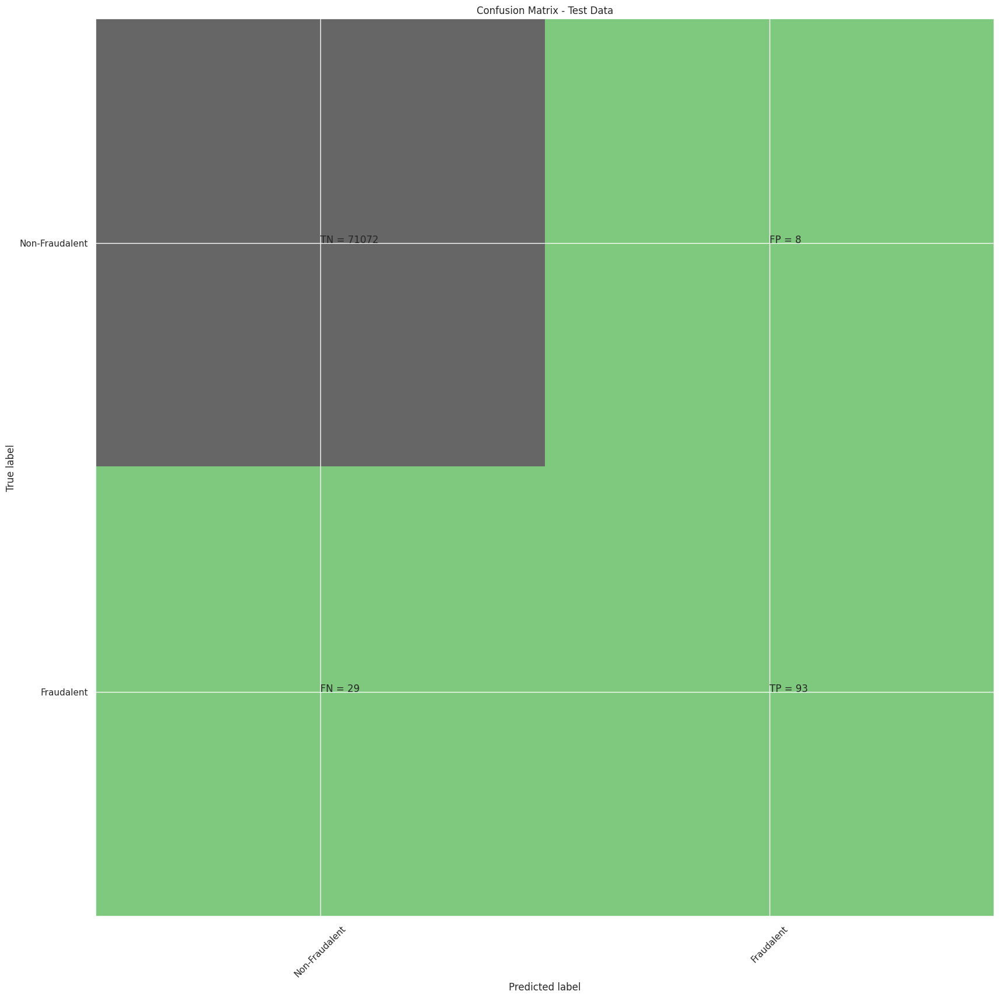

classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     71080
           1       0.92      0.76      0.83       122

    accuracy                           1.00     71202
   macro avg       0.96      0.88      0.92     71202
weighted avg       1.00      1.00      1.00     71202

XGboost roc_value: 0.9806270007472531
XGBoost threshold: 2.466619662300218e-05
ROC for the test dataset 98.1%


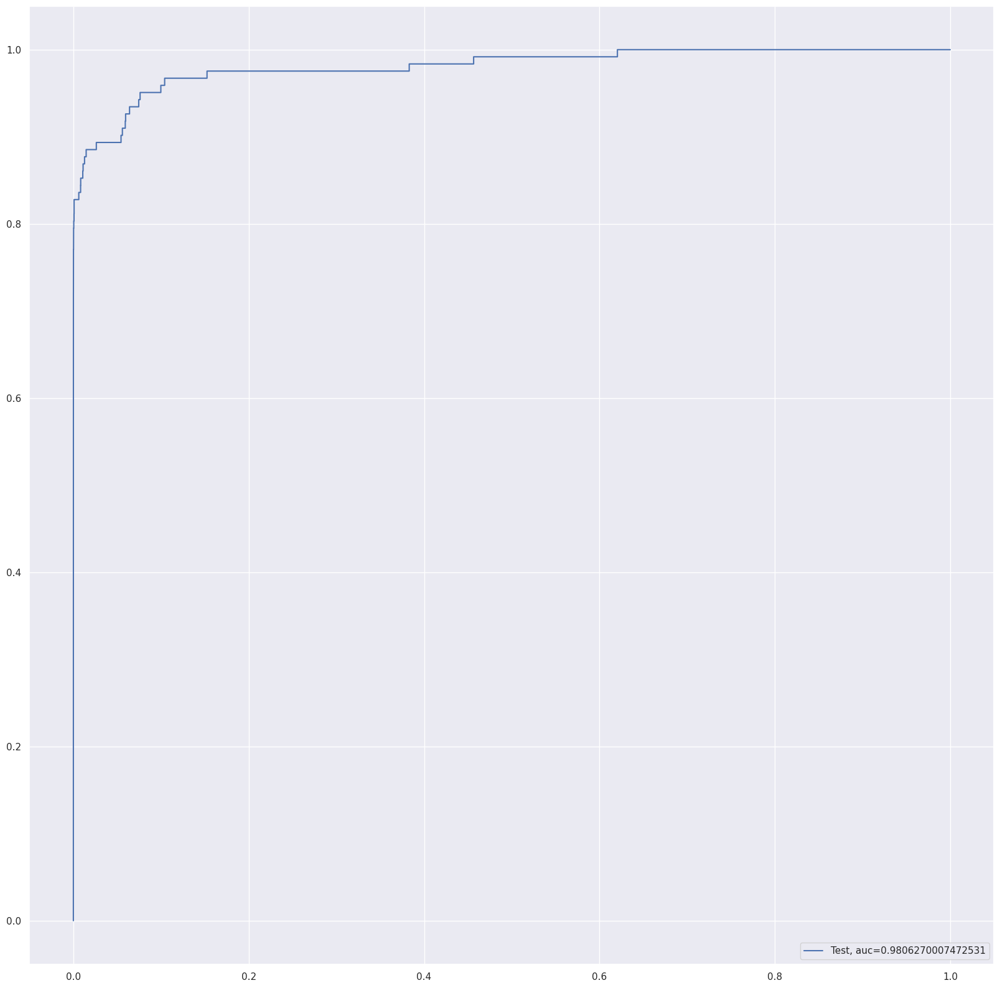

Time Taken by Model: --- 5.4277825355529785 seconds ---
--------------------------------------------------------------------------------


In [ ]:
#Run XGBoost Model
print("XGBoost Model")

start_time = time.time()

df_Results = buildAndRunXGBoostModels(df_Results,"Power Transformer",X_train_pt_df,y_train, X_test_pt_df, y_test)

print("Time Taken by Model: --- %s seconds ---" % (time.time() - start_time))
print('-'*80 )



SVM Model with Sigmoid Kernel
accuracy_score : 0.9984410550265442
Confusion Matrix


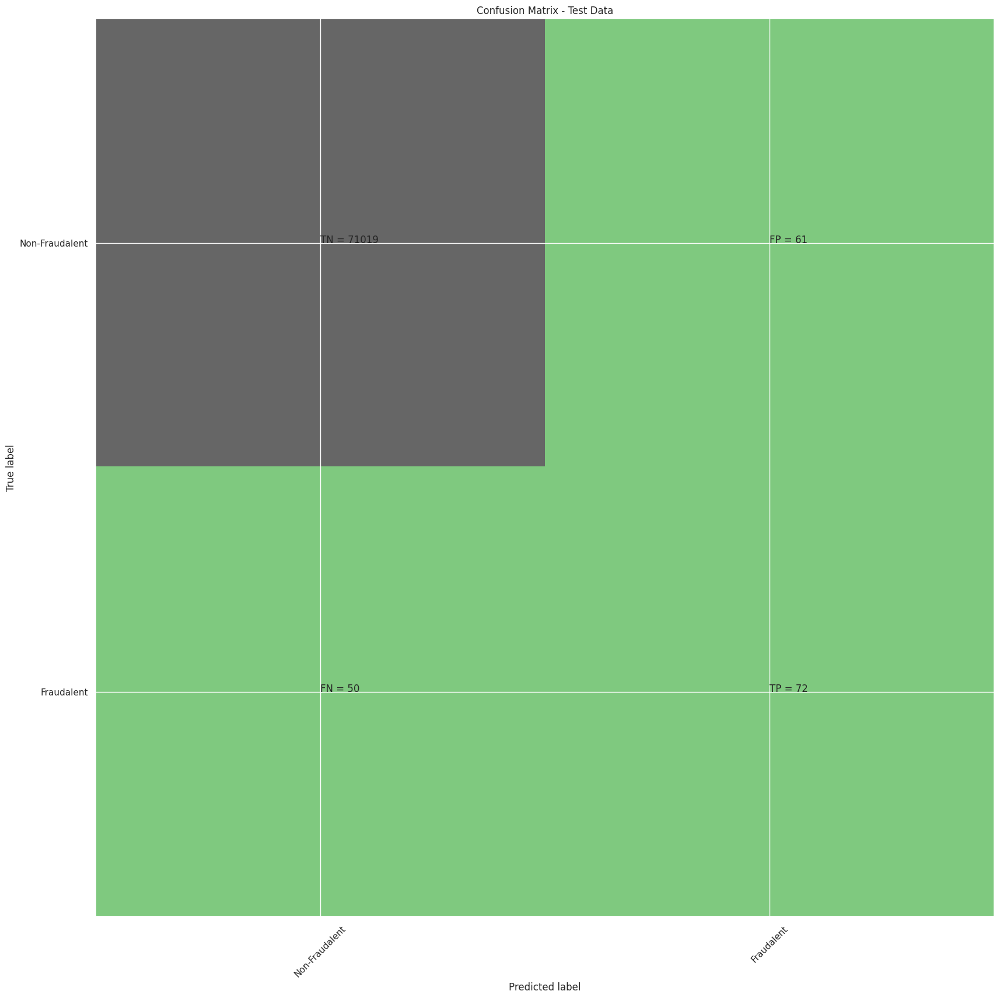

classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     71080
           1       0.54      0.59      0.56       122

    accuracy                           1.00     71202
   macro avg       0.77      0.79      0.78     71202
weighted avg       1.00      1.00      1.00     71202

SVM roc_value: 0.8763661586575274
SVM threshold: 0.001666653494554087
ROC for the test dataset 87.6%


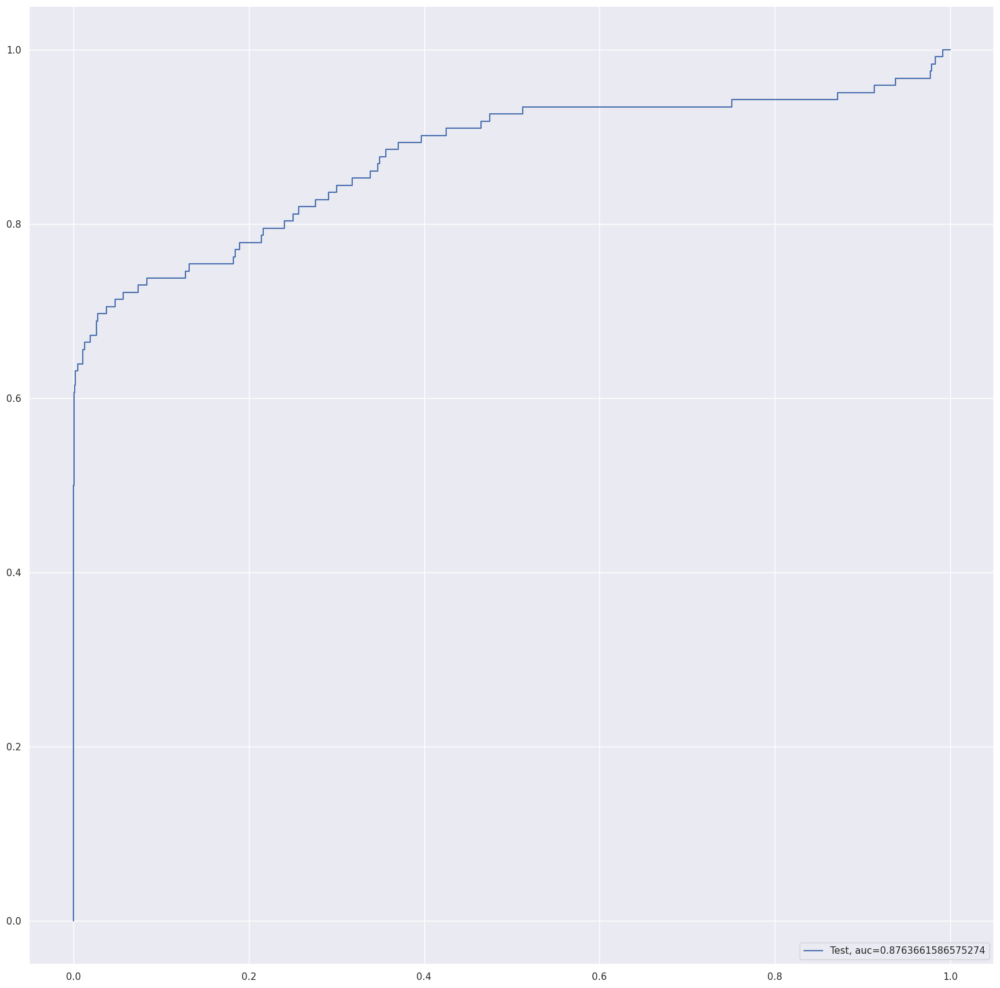

Time Taken by Model: --- 114.59371709823608 seconds ---


In [ ]:
#Run SVM Model with Sigmoid Kernel
print("SVM Model with Sigmoid Kernel")

start_time = time.time()

df_Results = buildAndRunSVMModels(df_Results,"Power Transformer",X_train_pt_df,y_train, X_test_pt_df, y_test)

print("Time Taken by Model: --- %s seconds ---" % (time.time() - start_time))

KNN Model
model score
0.9992275497879273
Confusion Matrix


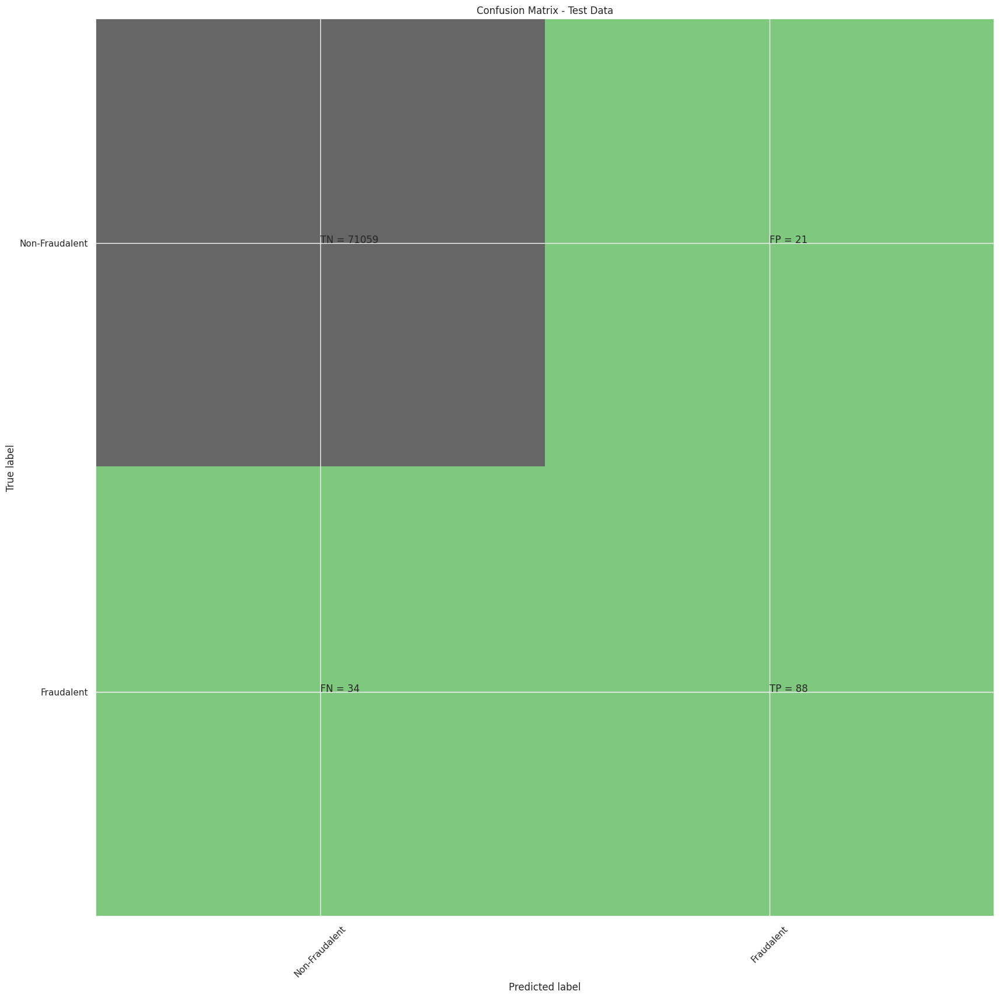

classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     71080
           1       0.81      0.72      0.76       122

    accuracy                           1.00     71202
   macro avg       0.90      0.86      0.88     71202
weighted avg       1.00      1.00      1.00     71202

KNN roc_value: 0.9096644164506398
KNN threshold: 0.2
ROC for the test dataset 91.0%


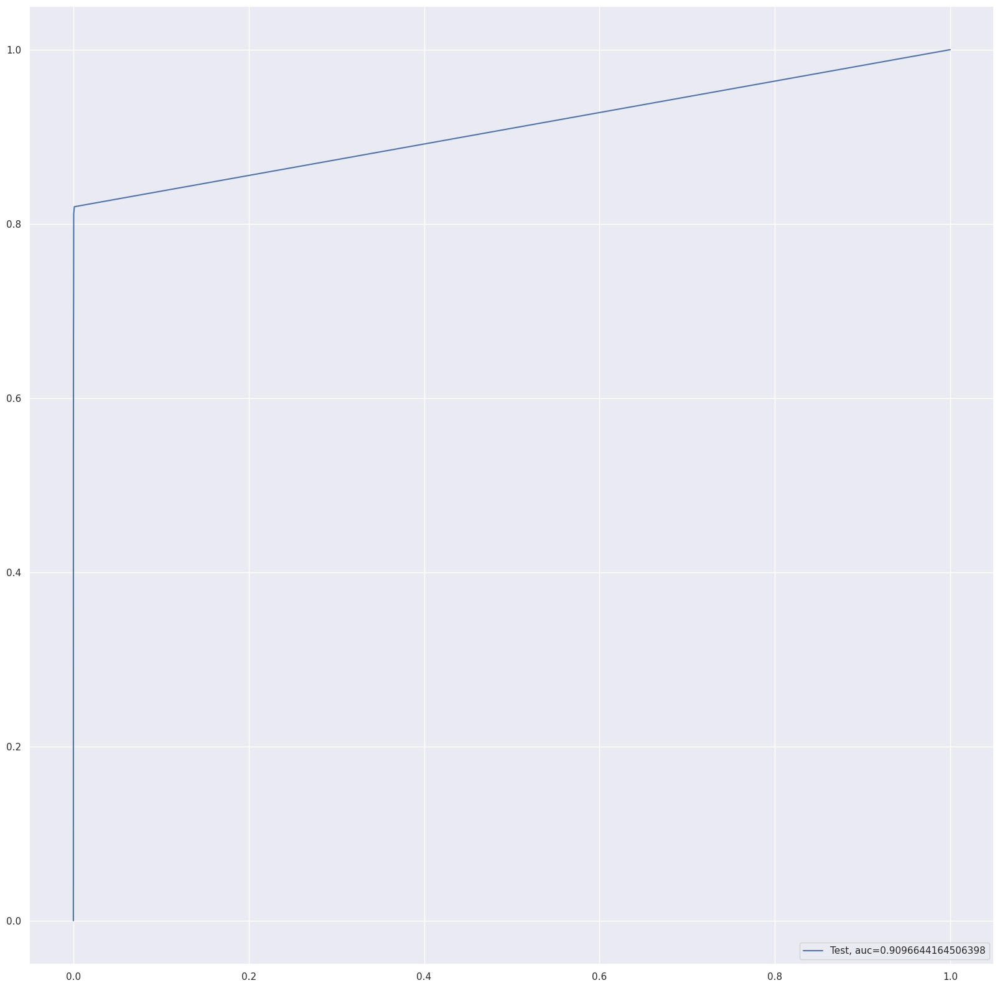

Time Taken by Model: --- 281.96484565734863 seconds ---
--------------------------------------------------------------------------------


In [ ]:
#Run KNN Model
print("KNN Model")

start_time = time.time()

df_Results = buildAndRunKNNModels(df_Results,"Power Transformer",X_train_pt_df,y_train, X_test_pt_df, y_test)

print("Time Taken by Model: --- %s seconds ---" % (time.time() - start_time))
print('-'*80 )

In [ ]:
df_Results

,Data_Imbalance_Handiling,Model,Accuracy,roc_value,threshold,Data_Imbalance_Handling
0,NaN,Logistic Regression with L2 Regularisation,0.999073,0.967671,0.001259,Power Transformer
1,NaN,Logistic Regression with L1 Regularisation,0.999017,0.967101,0.004577,Power Transformer
2,Power Transformer,Tree Model with gini criteria,0.998876,0.884880,1.000000,NaN
3,Power Transformer,Tree Model with entropy criteria,0.999059,0.860424,1.000000,NaN
4,Power Transformer,Random Forest,0.999354,0.932552,0.020000,NaN
5,Power Transformer,XGBoost,0.999480,0.980627,0.000025,NaN
6,Power Transformer,SVM,0.998441,0.876366,0.001667,NaN
7,Power Transformer,KNN,0.999228,0.909664,0.200000,NaN


## perfom cross validation on the X_train & y_train to create:
- X_train_cv
- X_test_cv
- y_train_cv
- y_test_cv

## Perform cross validation with RepeatedKFold

In [ ]:
#Perfrom RepeatedKFold and check the results
from sklearn.model_selection import RepeatedKFold
rkf = RepeatedKFold(n_splits=5, n_repeats=10, random_state=None)

# X is the feature set and y is the target
for train_index, test_index in rkf.split(X,y):
    print("TRAIN:", train_index, "TEST:", test_index)
    X_train_cv, X_test_cv = X.iloc[train_index], X.iloc[test_index]
    y_train_cv, y_test_cv = y.iloc[train_index], y.iloc[test_index]

TRAIN: [     1      2      3 ... 284804 284805 284806] TEST: [     0      8     12 ... 284797 284799 284803]
TRAIN: [     0      1      2 ... 284803 284805 284806] TEST: [    16     22     46 ... 284792 284793 284804]
TRAIN: [     0      2      3 ... 284803 284804 284805] TEST: [     1      4      7 ... 284787 284798 284806]
TRAIN: [     0      1      2 ... 284803 284804 284806] TEST: [     3     10     17 ... 284780 284802 284805]
TRAIN: [     0      1      3 ... 284804 284805 284806] TEST: [     2      5      6 ... 284791 284800 284801]
TRAIN: [     0      1      2 ... 284804 284805 284806] TEST: [     4      5     10 ... 284773 284781 284793]
TRAIN: [     0      1      2 ... 284804 284805 284806] TEST: [     3      6      7 ... 284800 284801 284802]
TRAIN: [     1      2      3 ... 284802 284803 284805] TEST: [     0      9     11 ... 284797 284804 284806]
TRAIN: [     0      3      4 ... 284804 284805 284806] TEST: [     1      2     17 ... 284798 284799 284803]
TRAIN: [     0     

## Similarly explore other algorithms by building models like:¶
- KNN
- SVM
- Decision Tree
- Random Forest
- XGBoost

Logistic Regression with L1 And L2 Regularisation
Max auc_roc for l2: 0.9836125105437107
Max auc_roc for l1: 0.9718311448065506
Parameters for l2 regularisations
[[-2.06420467e-03  4.65023556e-02 -8.62166581e-02  2.39653008e-01
   9.05320335e-02 -4.41120625e-02 -3.68167052e-02 -1.25266787e-01
  -8.32246975e-02 -1.69447984e-01  1.37114511e-01 -2.02048542e-01
  -4.45991730e-02 -3.60828764e-01 -8.47076410e-03 -1.00256987e-01
  -8.23148874e-02 -8.20345054e-03  1.70075881e-02 -1.52487712e-02
   4.83317568e-02  3.23317224e-02 -1.13621752e-02 -1.02278974e-02
  -1.60765340e-02  5.67792564e-03 -1.08098123e-02 -1.39310269e-03
   3.24566406e-04  1.28843710e-02]]
[-7.62875635]
{1: array([[0.58674524, 0.58856169, 0.60901497, 0.76349004, 0.91310849,
        0.94307807, 0.95855999, 0.95905426, 0.96244625, 0.96233152,
        0.96233152, 0.96233152, 0.96233152, 0.96233152, 0.96233152,
        0.96233152, 0.96233152, 0.96233152, 0.96233152, 0.96233152],
       [0.56832905, 0.57049165, 0.5983418 , 0.783

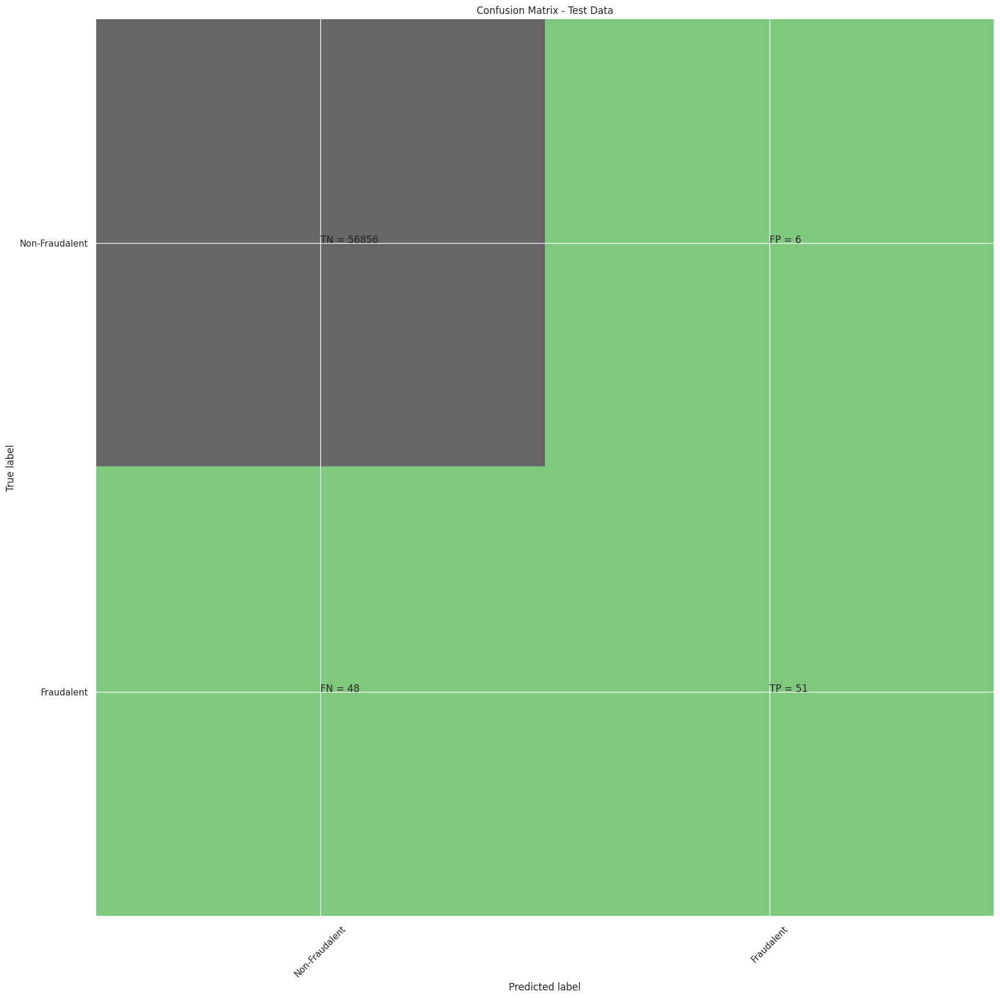

classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56862
           1       0.89      0.52      0.65        99

    accuracy                           1.00     56961
   macro avg       0.95      0.76      0.83     56961
weighted avg       1.00      1.00      1.00     56961

Accuarcy of Logistic model with l1 regularisation : 0.9991397622934991
Confusion Matrix


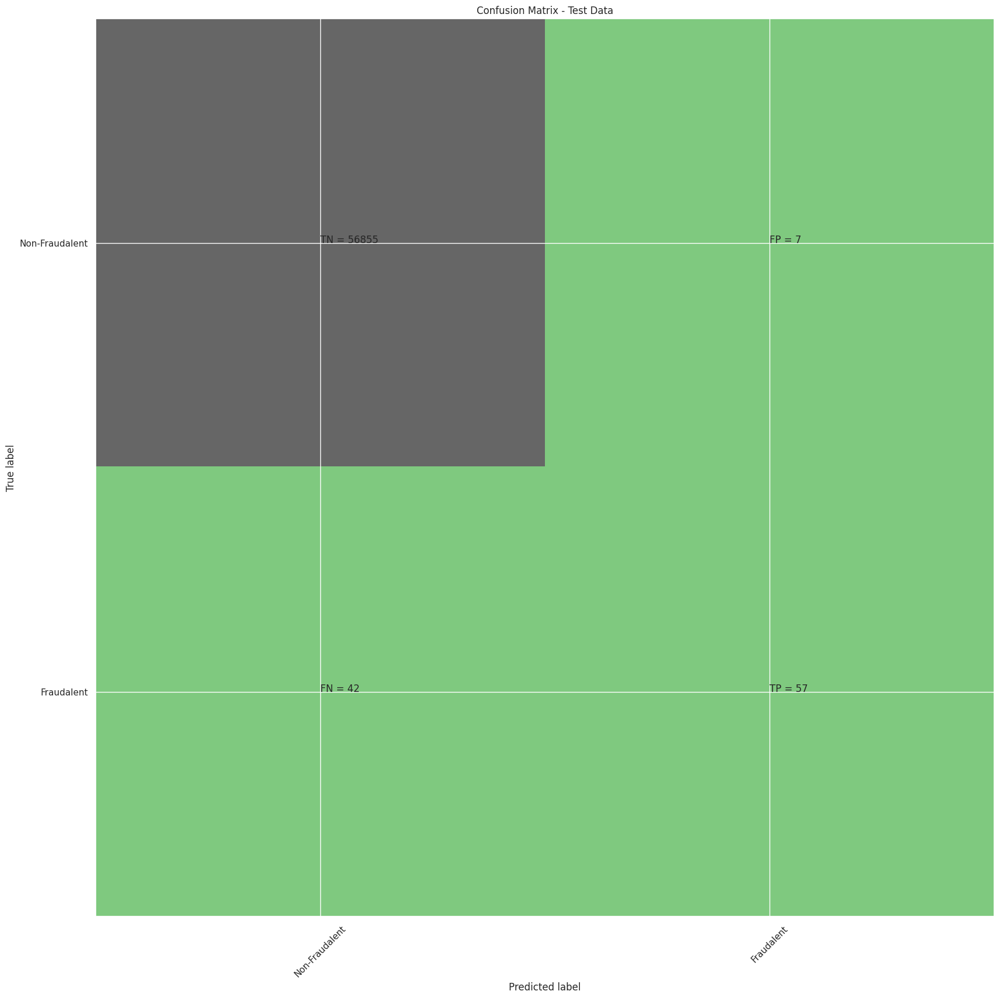

classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56862
           1       0.89      0.58      0.70        99

    accuracy                           1.00     56961
   macro avg       0.94      0.79      0.85     56961
weighted avg       1.00      1.00      1.00     56961

l2 roc_value: 0.9826958338618146
l2 threshold: 0.0031104719988682217
ROC for the test dataset 98.3%


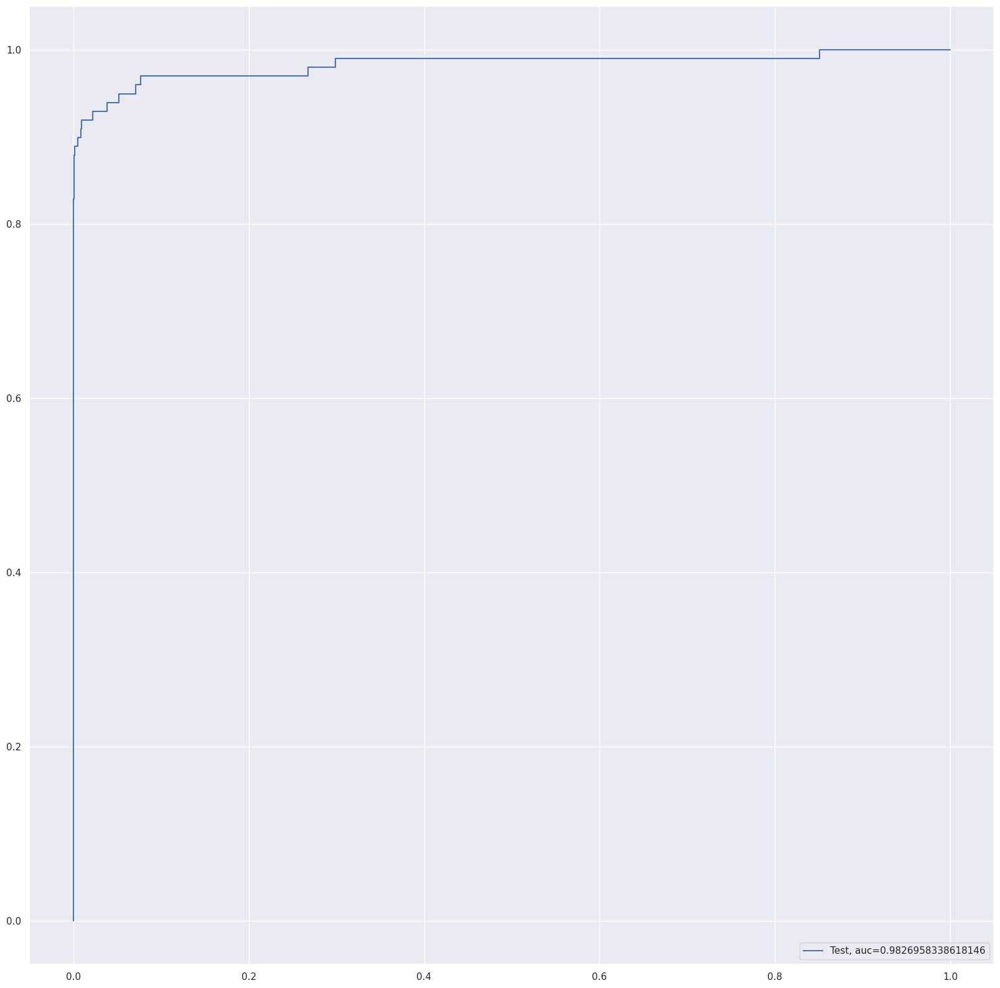

l1 roc_value: 0.8944941660991044
l1 threshold: 0.0471800811824056
ROC for the test dataset 89.4%


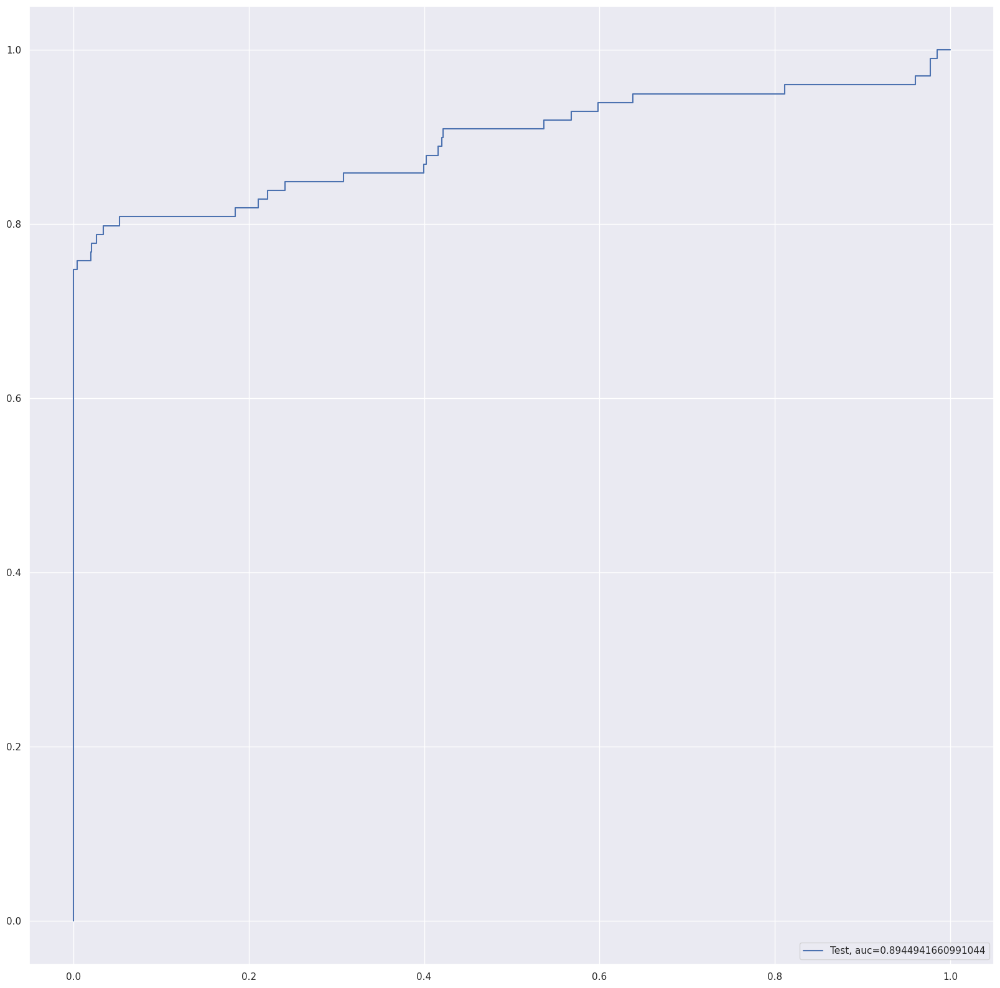

Time Taken by Model: --- 374.4120225906372 seconds ---
--------------------------------------------------------------------------------


In [ ]:
#Run Logistic Regression with L1 And L2 Regularisation
print("Logistic Regression with L1 And L2 Regularisation")

start_time = time.time()

df_Results = buildAndRunLogisticModels(df_Results,"RepeatedKFold Cross Validation", X_train_cv,y_train_cv, X_test_cv, y_test_cv)

print("Time Taken by Model: --- %s seconds ---" % (time.time() - start_time))
print('-'*80 )

Decision Tree Models with  'gini' & 'entropy' criteria
gini score: 0.9992977651375503
Confusion Matrix


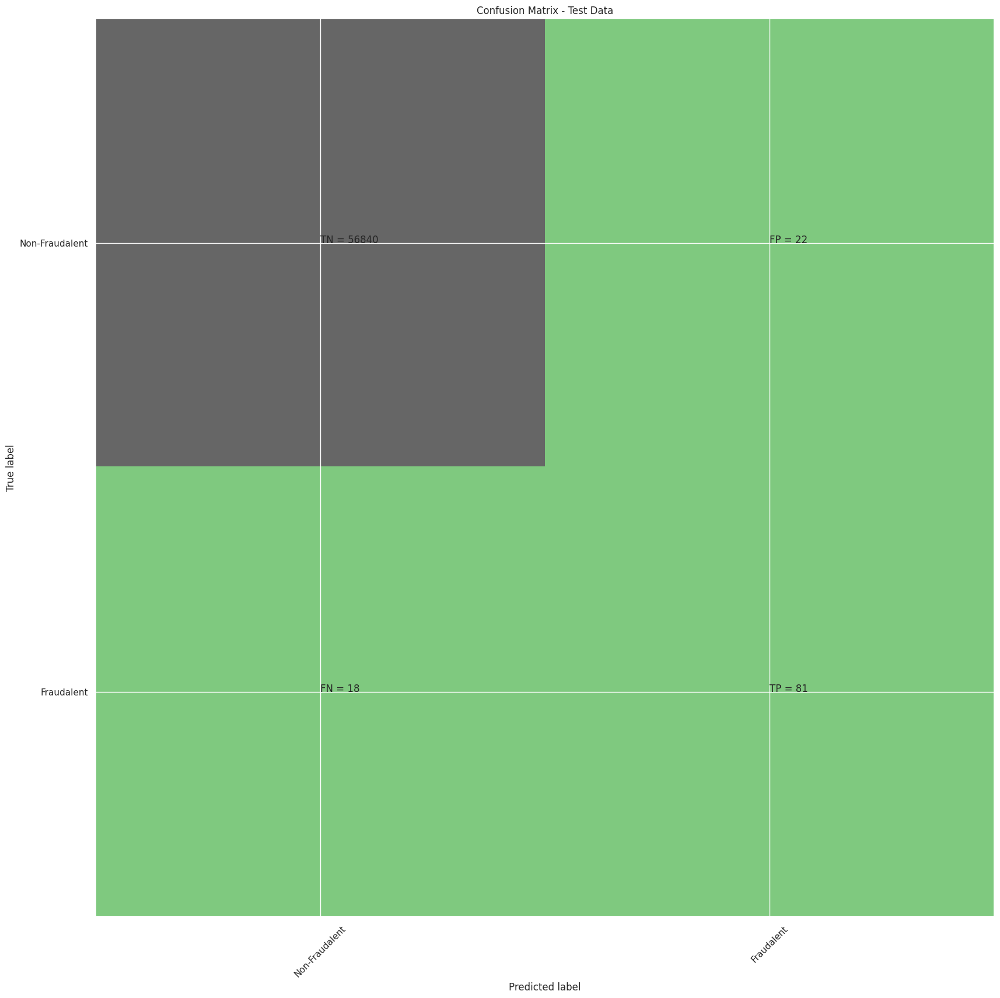

classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56862
           1       0.79      0.82      0.80        99

    accuracy                           1.00     56961
   macro avg       0.89      0.91      0.90     56961
weighted avg       1.00      1.00      1.00     56961

gini tree_roc_value: 0.9088974582801744
Tree threshold: 1.0
ROC for the test dataset 90.9%


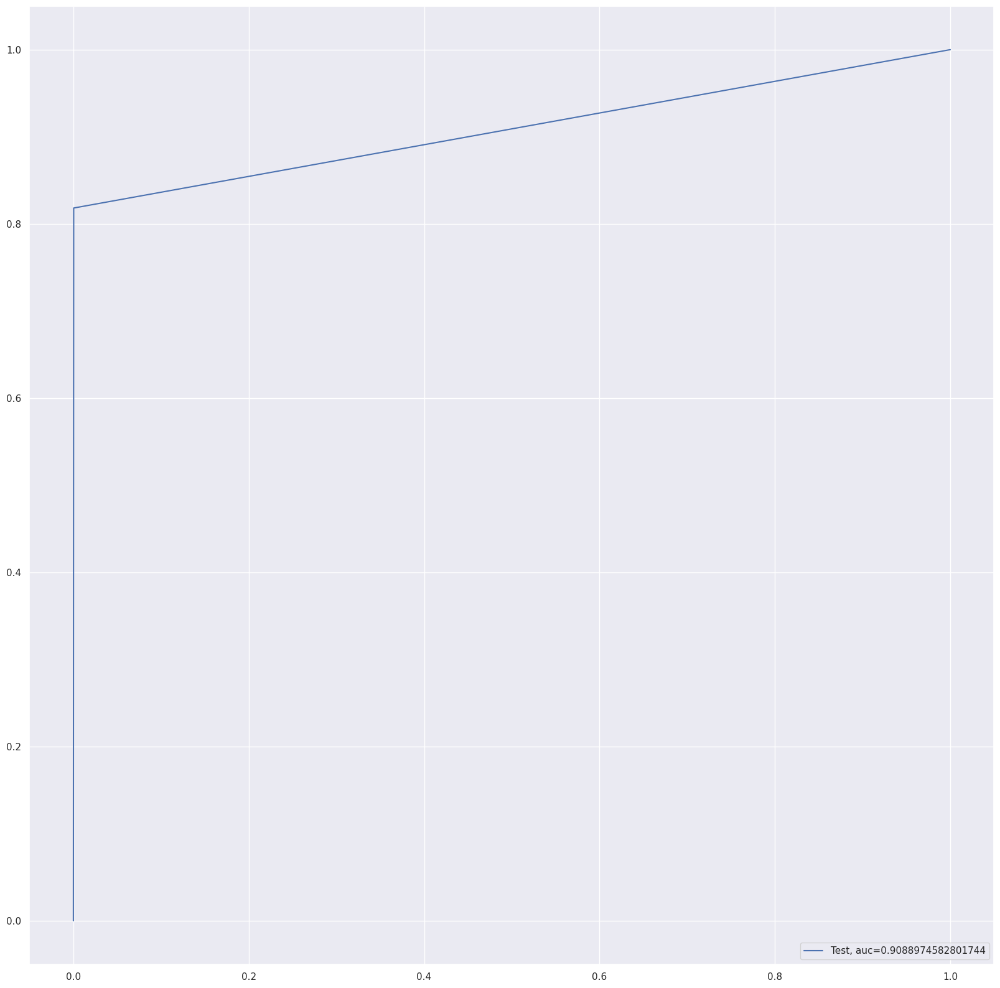

entropy score: 0.9990519829356929
Confusion Matrix


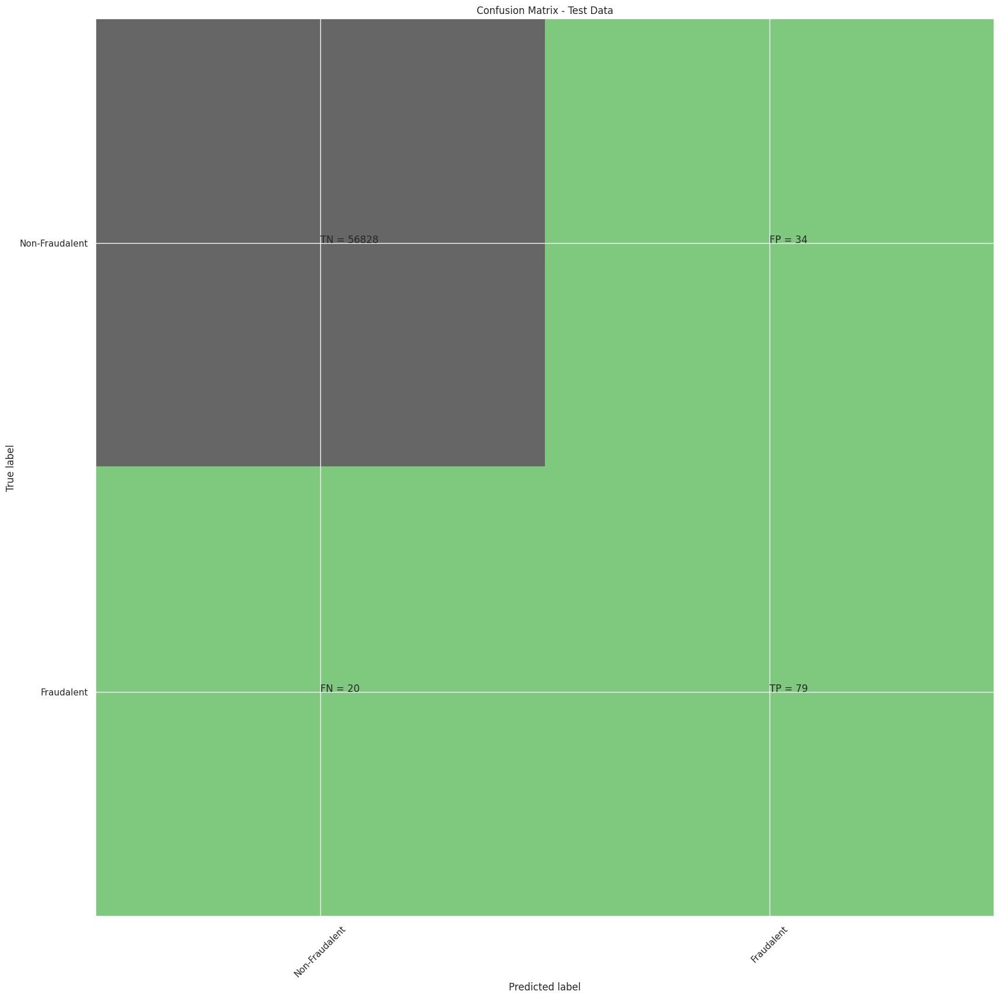

classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56862
           1       0.70      0.80      0.75        99

    accuracy                           1.00     56961
   macro avg       0.85      0.90      0.87     56961
weighted avg       1.00      1.00      1.00     56961

entropy tree_roc_value: 0.8986909295551271
Tree threshold: 1.0
ROC for the test dataset 89.9%


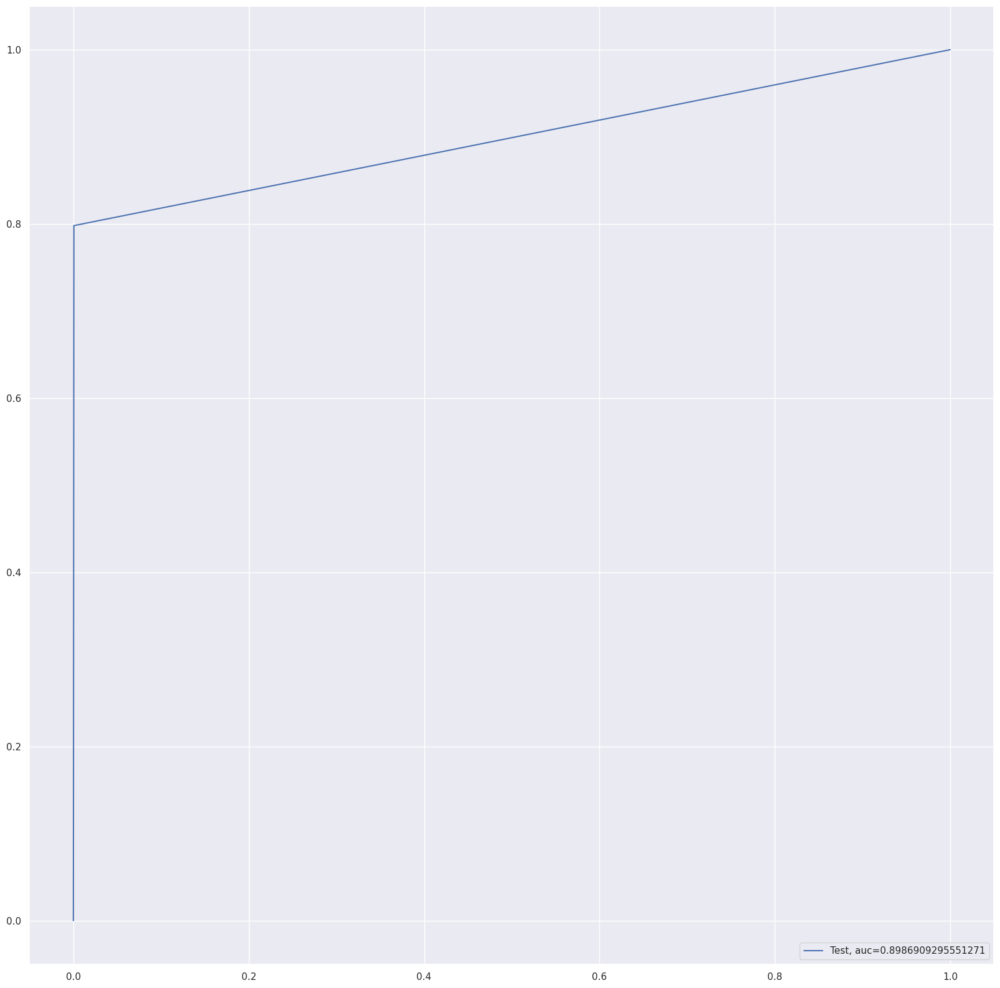

Time Taken by Model: --- 41.05414414405823 seconds ---
--------------------------------------------------------------------------------


In [ ]:
#Run Decision Tree Models with  'gini' & 'entropy' criteria
print("Decision Tree Models with  'gini' & 'entropy' criteria")

start_time = time.time()

df_Results = buildAndRunTreeModels(df_Results,"RepeatedKFold Cross Validation",X_train_cv,y_train_cv, X_test_cv, y_test_cv)

print("Time Taken by Model: --- %s seconds ---" % (time.time() - start_time))
print('-'*80 )

Random Forest Model
Model Accuracy: 0.9995611032109689
Confusion Matrix


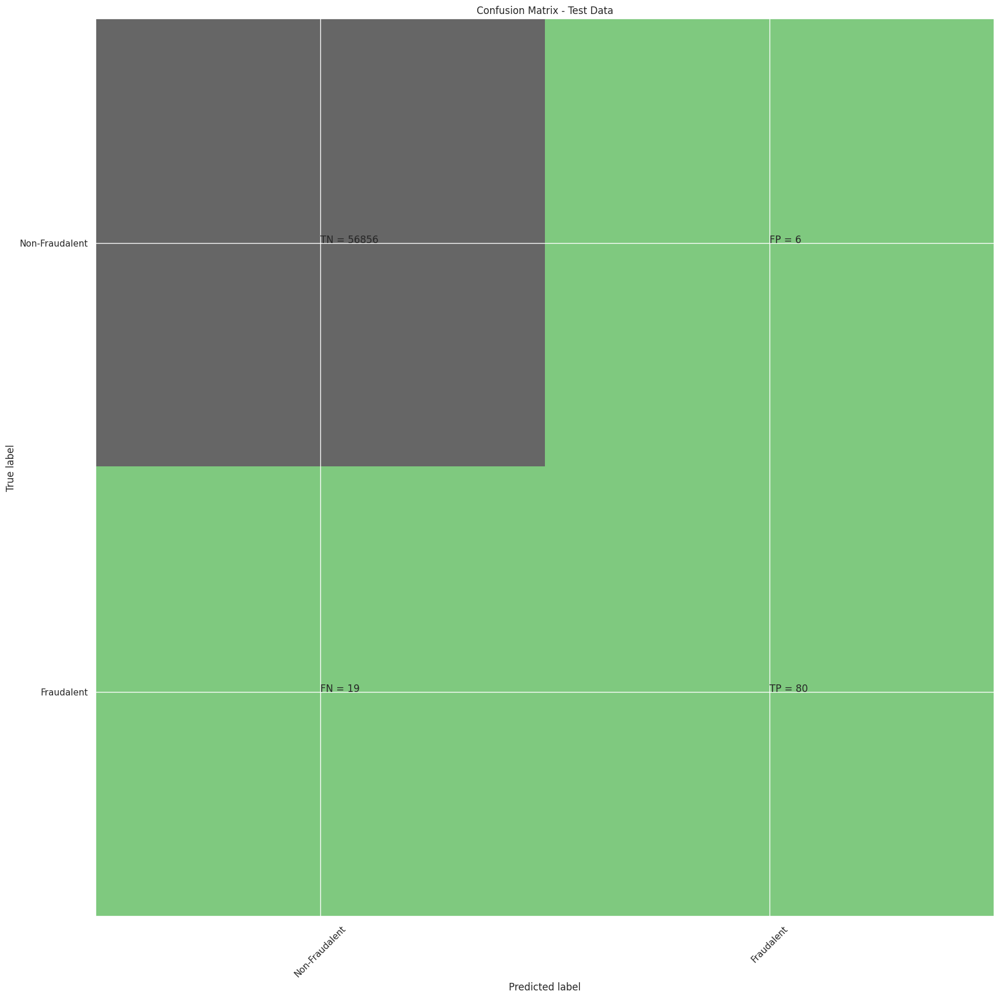

classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56862
           1       0.93      0.81      0.86        99

    accuracy                           1.00     56961
   macro avg       0.96      0.90      0.93     56961
weighted avg       1.00      1.00      1.00     56961

Random Forest roc_value: 0.9634189668483222
Random Forest threshold: 0.02
ROC for the test dataset 96.3%


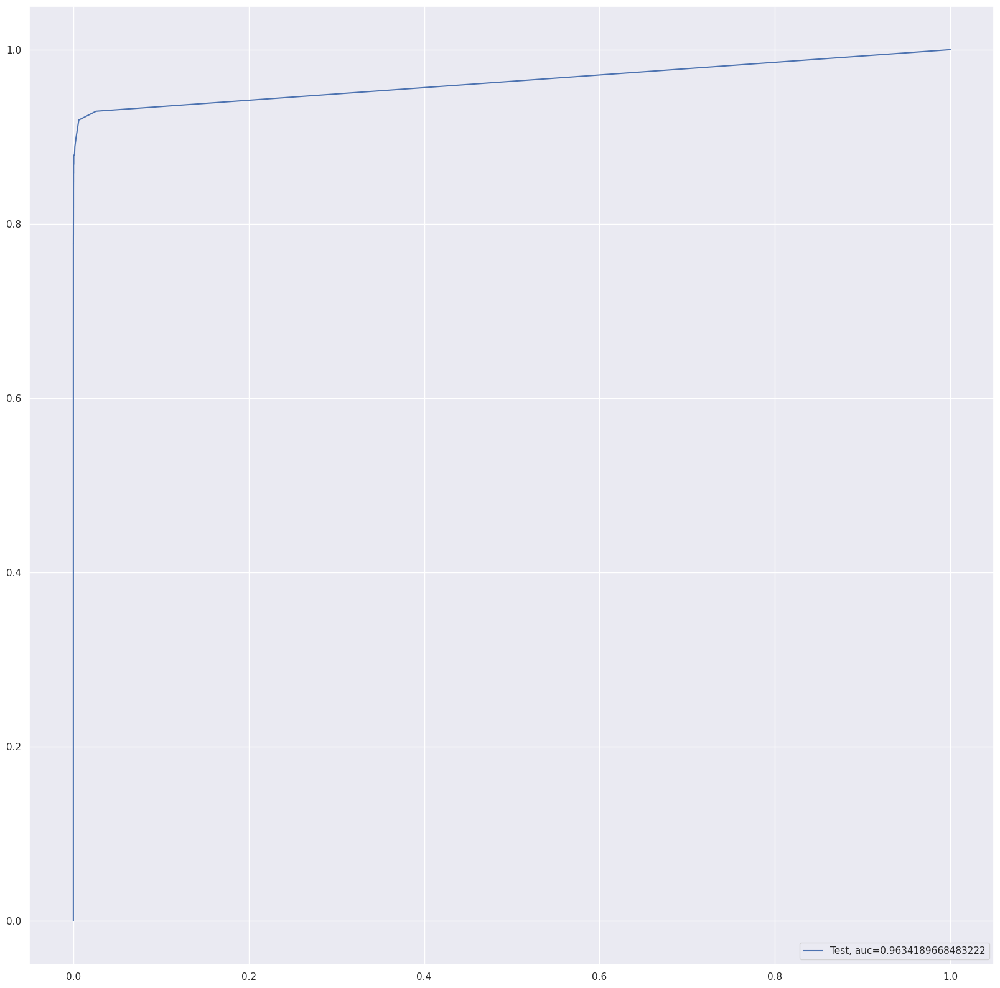

Time Taken by Model: --- 280.12651443481445 seconds ---
--------------------------------------------------------------------------------


In [ ]:
#Run Random Forest Model
print("Random Forest Model")

start_time = time.time()

df_Results = buildAndRunRandomForestModels(df_Results,"RepeatedKFold Cross Validation",X_train_cv,y_train_cv, X_test_cv, y_test_cv)

print("Time Taken by Model: --- %s seconds ---" % (time.time() - start_time))
print('-'*80 )

XGBoost Model
Model Accuracy: 0.9995786590825302
Confusion Matrix


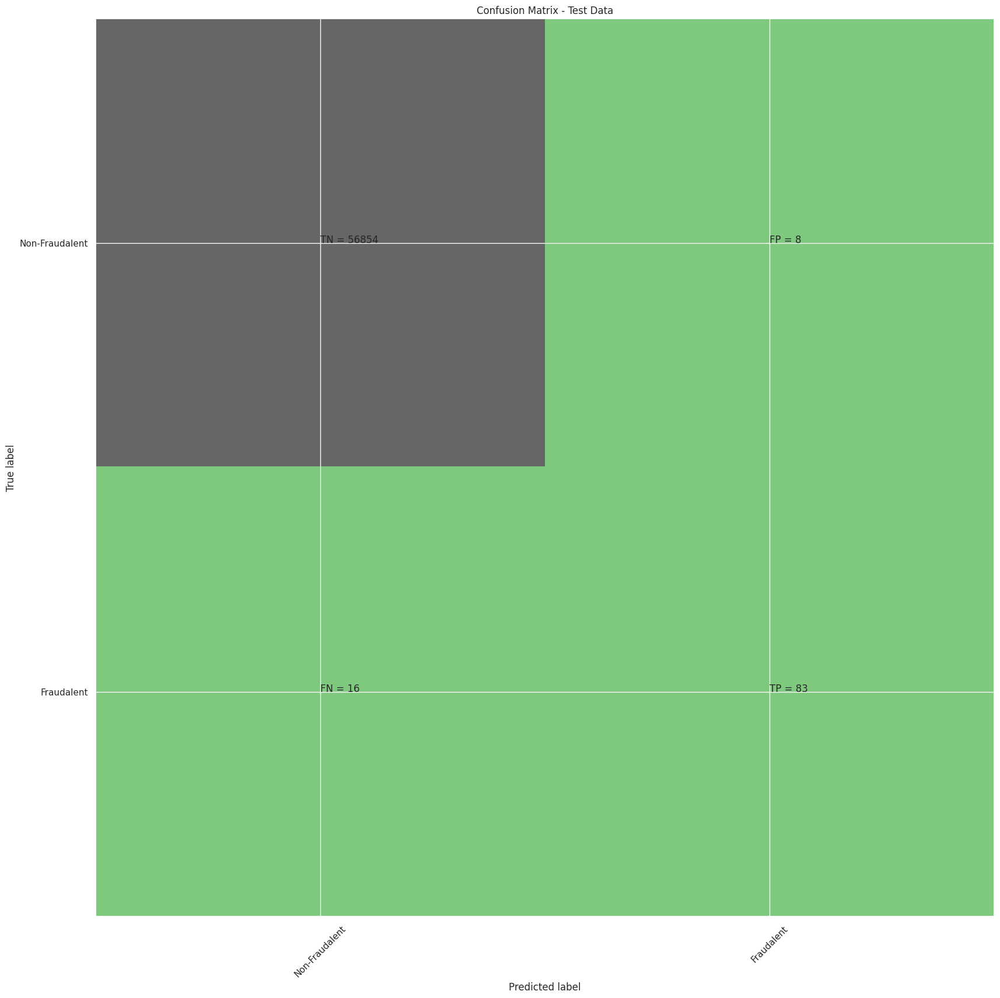

classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56862
           1       0.91      0.84      0.87        99

    accuracy                           1.00     56961
   macro avg       0.96      0.92      0.94     56961
weighted avg       1.00      1.00      1.00     56961

XGboost roc_value: 0.9795912059286546
XGBoost threshold: 0.0002782749361358583
ROC for the test dataset 98.0%


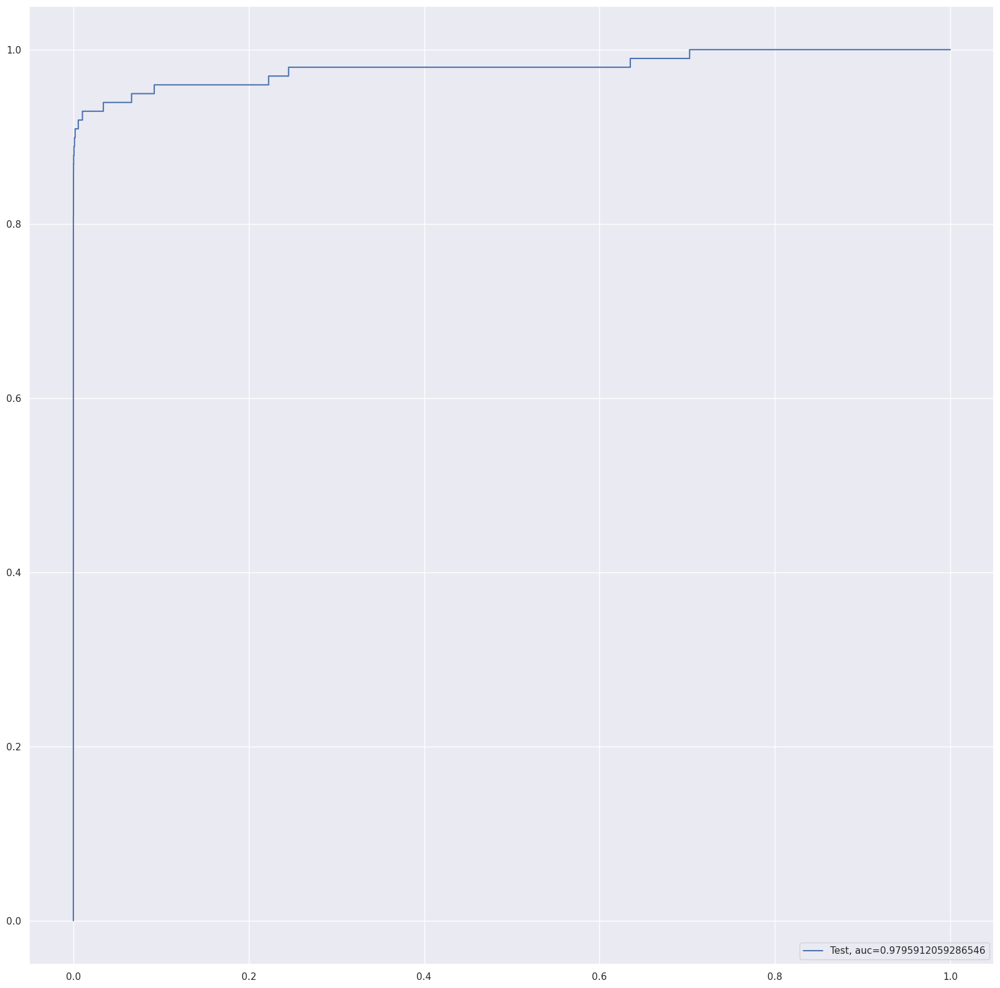

Time Taken by Model: --- 8.7329843044281 seconds ---
--------------------------------------------------------------------------------


In [ ]:
#Run XGBoost Model
print("XGBoost Model")

start_time = time.time()

df_Results = buildAndRunXGBoostModels(df_Results,"RepeatedKFold Cross Validation",X_train_cv,y_train_cv, X_test_cv, y_test_cv)

print("Time Taken by Model: --- %s seconds ---" % (time.time() - start_time))
print('-'*80 )

SVM Model with Sigmoid Kernel
accuracy_score : 0.9976650690823546
Confusion Matrix


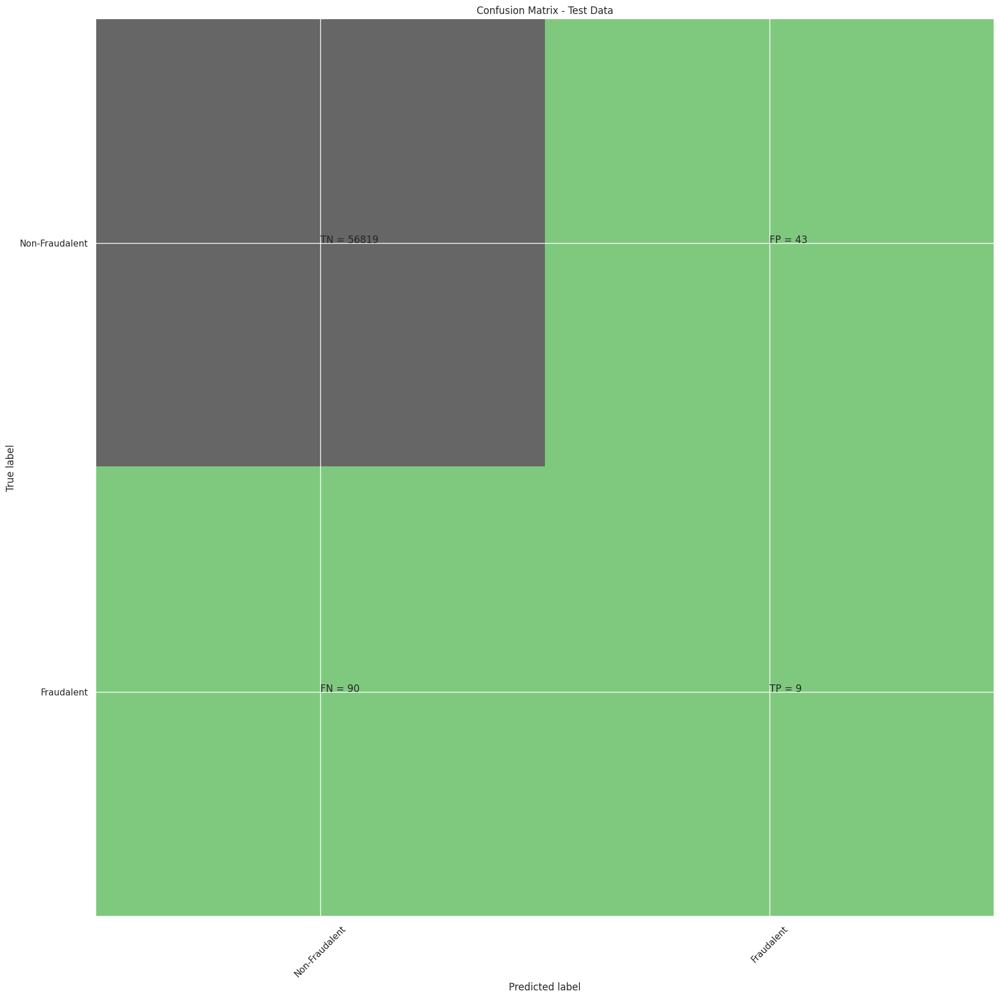

classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56862
           1       0.17      0.09      0.12        99

    accuracy                           1.00     56961
   macro avg       0.59      0.55      0.56     56961
weighted avg       1.00      1.00      1.00     56961

SVM roc_value: 0.7100596908553013
SVM threshold: 0.0013895726035797588
ROC for the test dataset 71.0%


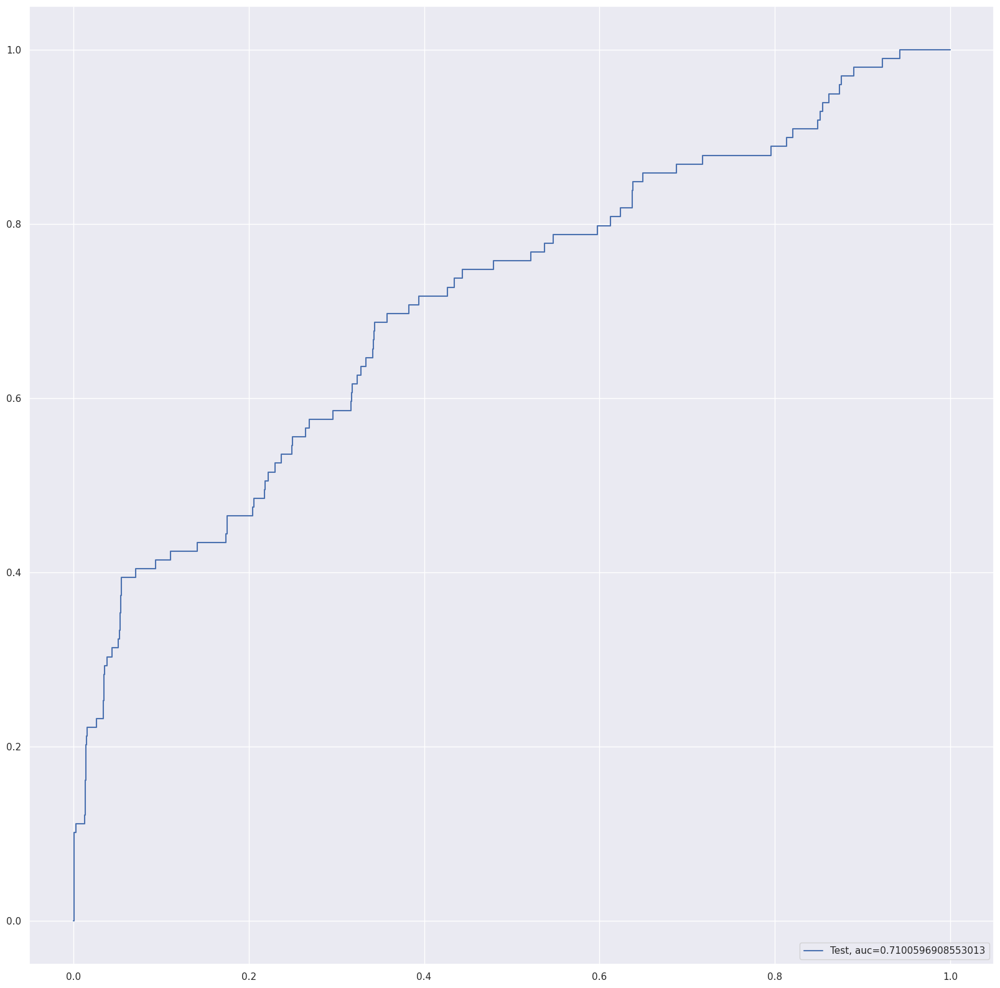

Time Taken by Model: --- 204.59643149375916 seconds ---
--------------------------------------------------------------------------------


In [ ]:
#Run SVM Model with Sigmoid Kernel
print("SVM Model with Sigmoid Kernel")

start_time = time.time()

df_Results = buildAndRunSVMModels(df_Results,"RepeatedKFold Cross Validation",X_train_cv,y_train_cv, X_test_cv, y_test_cv)

print("Time Taken by Model: --- %s seconds ---" % (time.time() - start_time))
print('-'*80 )

KNN Model
model score
0.999280209265989
Confusion Matrix


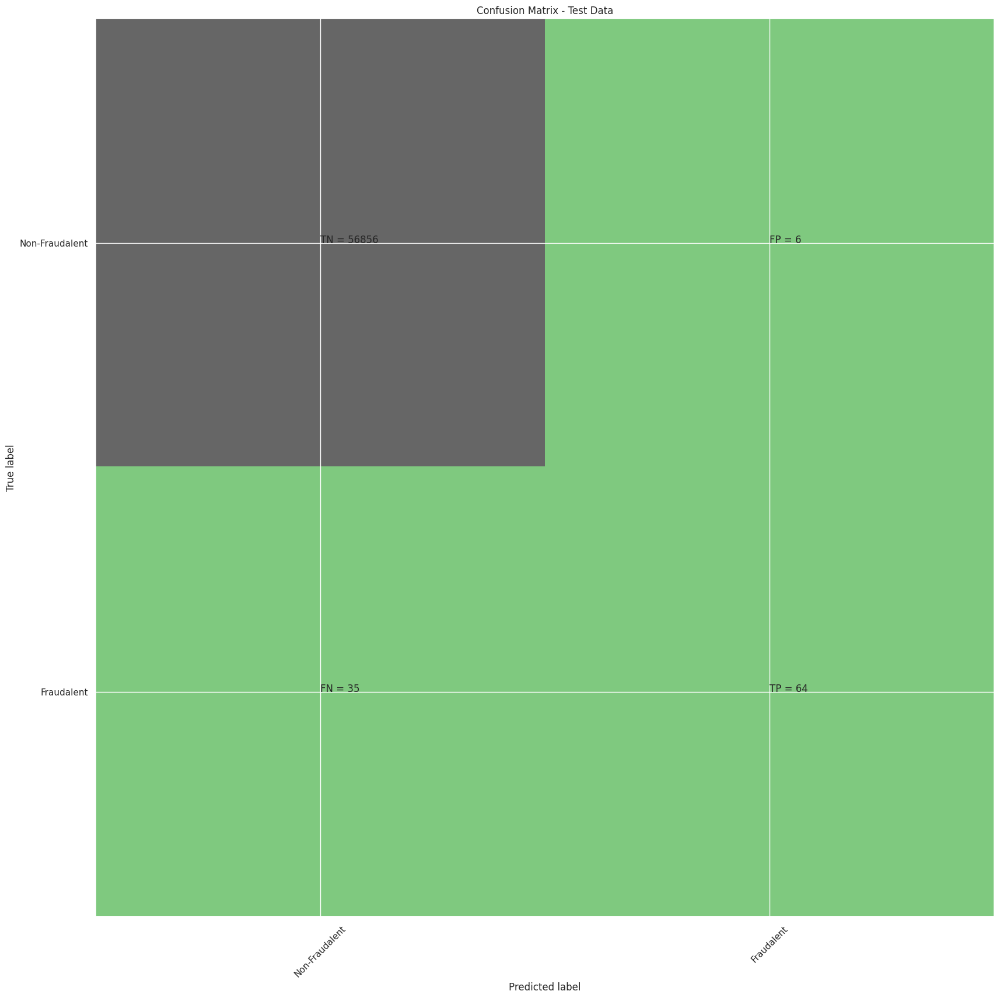

classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56862
           1       0.91      0.65      0.76        99

    accuracy                           1.00     56961
   macro avg       0.96      0.82      0.88     56961
weighted avg       1.00      1.00      1.00     56961

KNN roc_value: 0.8785669824764475
KNN threshold: 0.2
ROC for the test dataset 87.9%


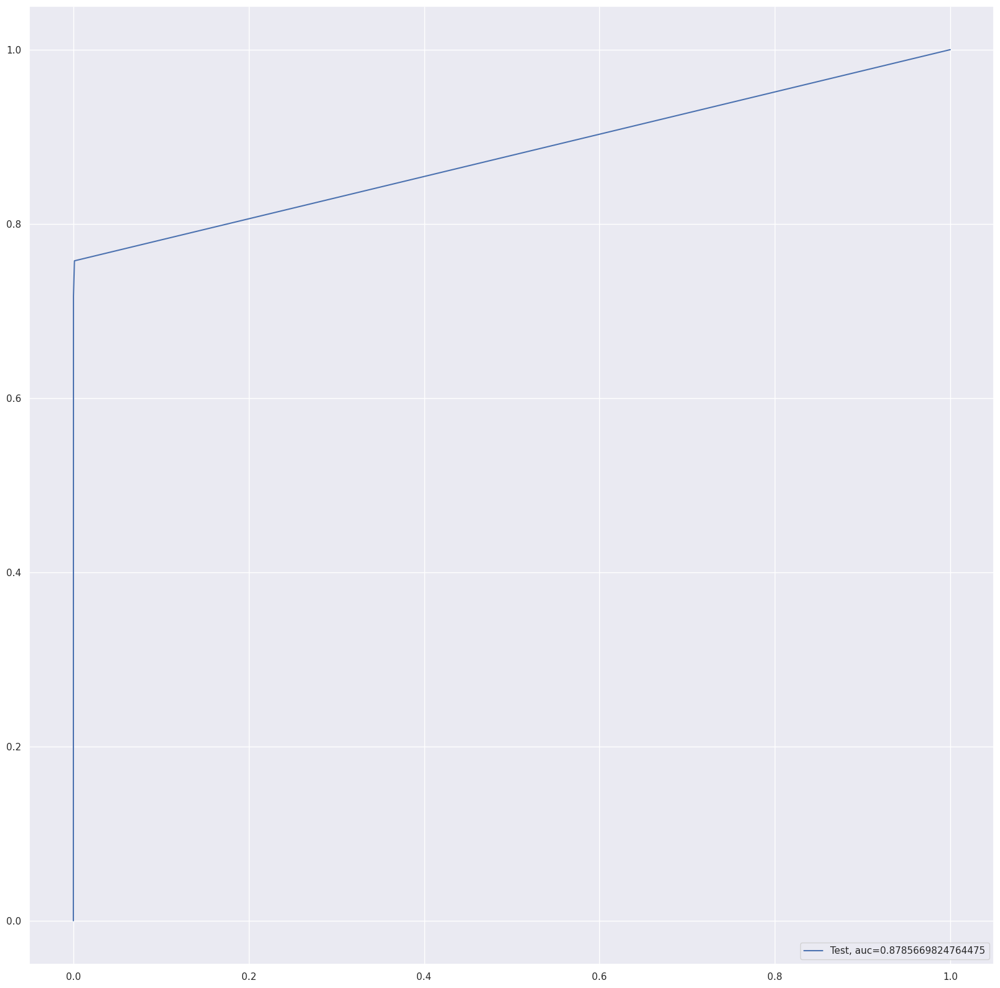

Time Taken by Model: --- 241.75698518753052 seconds ---
--------------------------------------------------------------------------------


In [ ]:
#Run KNN Model
print("KNN Model")

start_time = time.time()

df_Results = buildAndRunKNNModels(df_Results,"RepeatedKFold Cross Validation",X_train_cv,y_train_cv, X_test_cv, y_test_cv)

print("Time Taken by Model: --- %s seconds ---" % (time.time() - start_time))
print('-'*80 )

In [ ]:
df_Results

,Data_Imbalance_Handiling,Model,Accuracy,roc_value,threshold,Data_Imbalance_Handling
0,NaN,Logistic Regression with L2 Regularisation,0.999073,0.967671,0.001259,Power Transformer
1,NaN,Logistic Regression with L1 Regularisation,0.999017,0.967101,0.004577,Power Transformer
2,Power Transformer,Tree Model with gini criteria,0.998876,0.884880,1.000000,NaN
3,Power Transformer,Tree Model with entropy criteria,0.999059,0.860424,1.000000,NaN
4,Power Transformer,Random Forest,0.999354,0.932552,0.020000,NaN
5,Power Transformer,XGBoost,0.999480,0.980627,0.000025,NaN
6,Power Transformer,SVM,0.998441,0.876366,0.001667,NaN
7,Power Transformer,KNN,0.999228,0.909664,0.200000,NaN
8,NaN,Logistic Regression with L2 Regularisation,0.999052,0.982696,0.003110,RepeatedKFold Cross Validation
9,NaN,Logistic Regression with L1 Regularisation,0.999140,0.894494,0.047180,RepeatedKFold Cross Validation


**XGBoost with Repeated KFold cross validation has best results with ROC_Value of 0.979591**

In [ ]:
# Evaluate XGboost model
from xgboost import XGBClassifier

# Fitting model
XGBmodel = XGBClassifier(random_state=42)
XGBmodel.fit(X_train_cv,y_train_cv)

coefficients = pd.concat([pd.DataFrame(X.columns),pd.DataFrame(np.transpose(XGBmodel.feature_importances_))], axis = 1)
coefficients.columns = ['Feature','feature_importances']

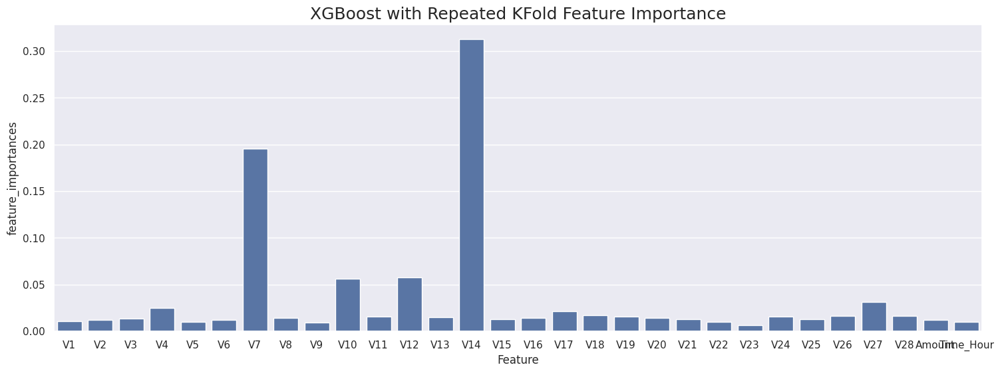

In [ ]:
plt.figure(figsize=(18,6))

sns.barplot(x='Feature', y='feature_importances', data=coefficients)

plt.title("XGBoost with Repeated KFold Feature Importance", fontsize=18)

plt.show()

## Cross validation with StratifiedKFold

In [ ]:
# Perfroming StratifiedKFold and check the results
from sklearn.model_selection import StratifiedKFold
skf = StratifiedKFold(n_splits=5, random_state=None)


# X is the feature set and y is the target variable
for train_index, test_index in skf.split(X,y):
    print("TRAIN:", train_index, "TEST:", test_index)
    X_train_SKF_cv, X_test_SKF_cv = X.iloc[train_index], X.iloc[test_index]
    y_train_SKF_cv, y_test_SKF_cv = y.iloc[train_index], y.iloc[test_index]


TRAIN: [ 30473  30496  31002 ... 284804 284805 284806] TEST: [    0     1     2 ... 57017 57018 57019]
TRAIN: [     0      1      2 ... 284804 284805 284806] TEST: [ 30473  30496  31002 ... 113964 113965 113966]
TRAIN: [     0      1      2 ... 284804 284805 284806] TEST: [ 81609  82400  83053 ... 170946 170947 170948]
TRAIN: [     0      1      2 ... 284804 284805 284806] TEST: [150654 150660 150661 ... 227866 227867 227868]
TRAIN: [     0      1      2 ... 227866 227867 227868] TEST: [212516 212644 213092 ... 284804 284805 284806]


**Checking other algorithms**

Logistic Regression with L1 And L2 Regularisation
Max auc_roc for l2: 0.9824998302436573
Max auc_roc for l1: 0.9652106893977332
Parameters for l2 regularisations
[[ 0.00683334  0.06145934 -0.06703104  0.21837008  0.05400372 -0.0319603
  -0.02280335 -0.1149601  -0.06954056 -0.16366435  0.12779    -0.19159896
  -0.03711445 -0.36059637  0.00364854 -0.08799108 -0.07288165 -0.0007583
   0.00394511 -0.0279599   0.03822224  0.02337054 -0.01173993 -0.00997821
  -0.00657592  0.00627513 -0.01025023 -0.00174467  0.00039791 -0.00096784]]
[-7.40641365]
{1: array([[0.69243733, 0.69420152, 0.71447107, 0.83768575, 0.95579612,
        0.97136042, 0.98915673, 0.99464431, 0.99129517, 0.99071237,
        0.99096601, 0.99096601, 0.99096601, 0.99096601, 0.99096601,
        0.99096601, 0.99096601, 0.99096601, 0.99096601, 0.99096601],
       [0.60700243, 0.60865586, 0.62914551, 0.76884136, 0.90900227,
        0.94879974, 0.9604112 , 0.98181412, 0.98547001, 0.98328227,
        0.97955152, 0.97955152, 0.9795515

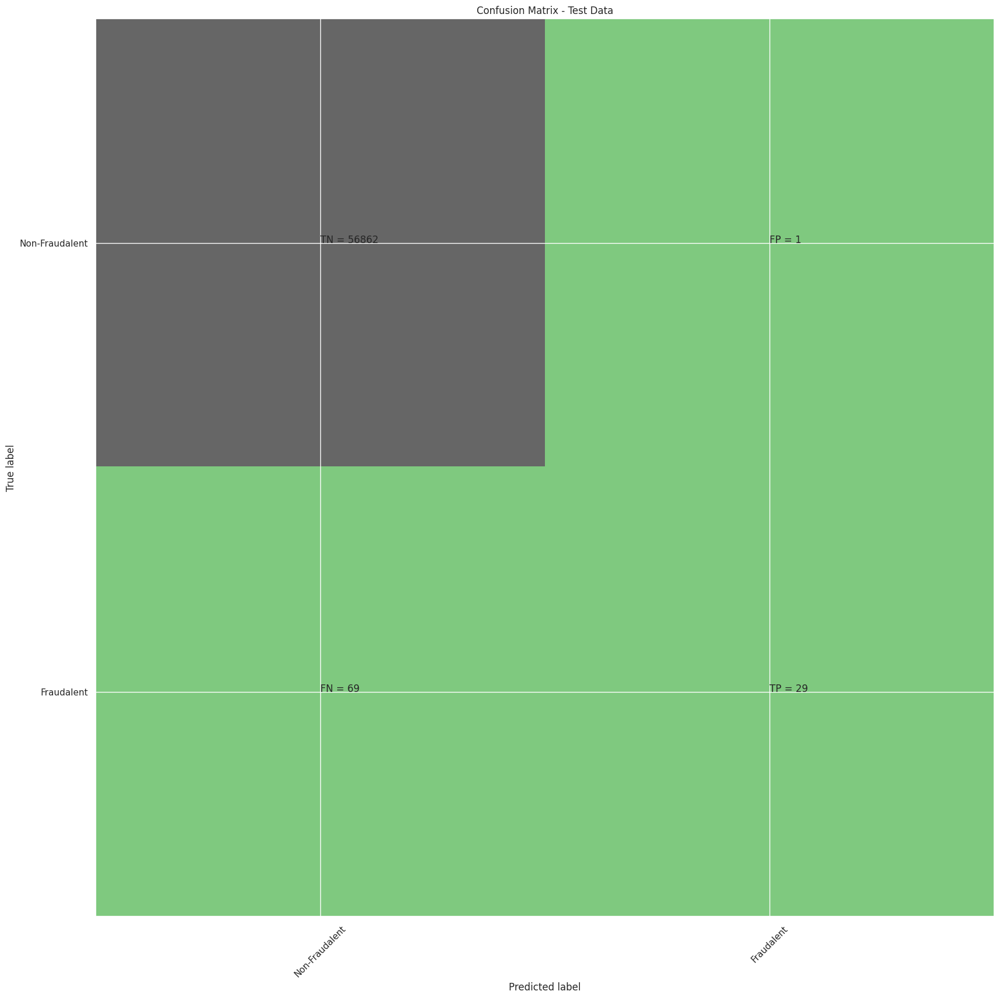

classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56863
           1       0.97      0.30      0.45        98

    accuracy                           1.00     56961
   macro avg       0.98      0.65      0.73     56961
weighted avg       1.00      1.00      1.00     56961

Accuarcy of Logistic model with l1 regularisation : 0.9987535331191517
Confusion Matrix


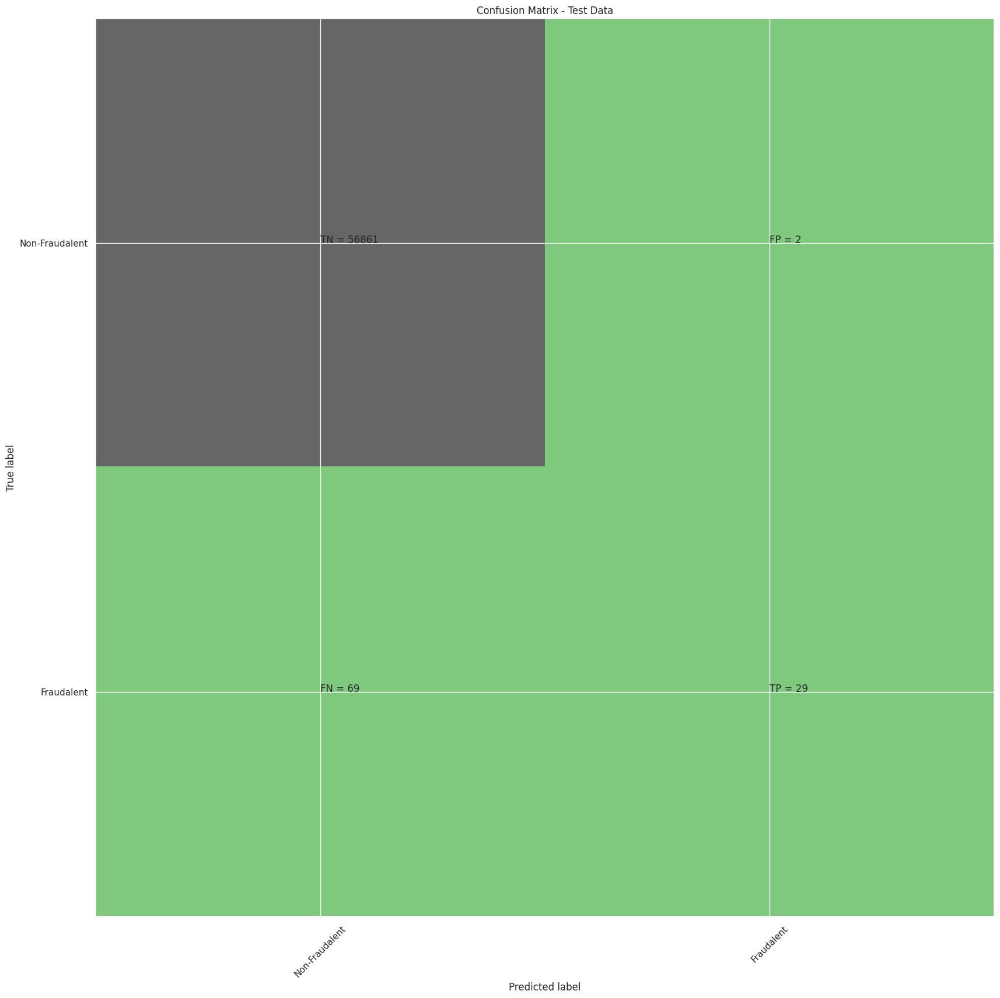

classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56863
           1       0.94      0.30      0.45        98

    accuracy                           1.00     56961
   macro avg       0.97      0.65      0.72     56961
weighted avg       1.00      1.00      1.00     56961

l2 roc_value: 0.9833866719401124
l2 threshold: 0.0015540600590433185
ROC for the test dataset 98.3%


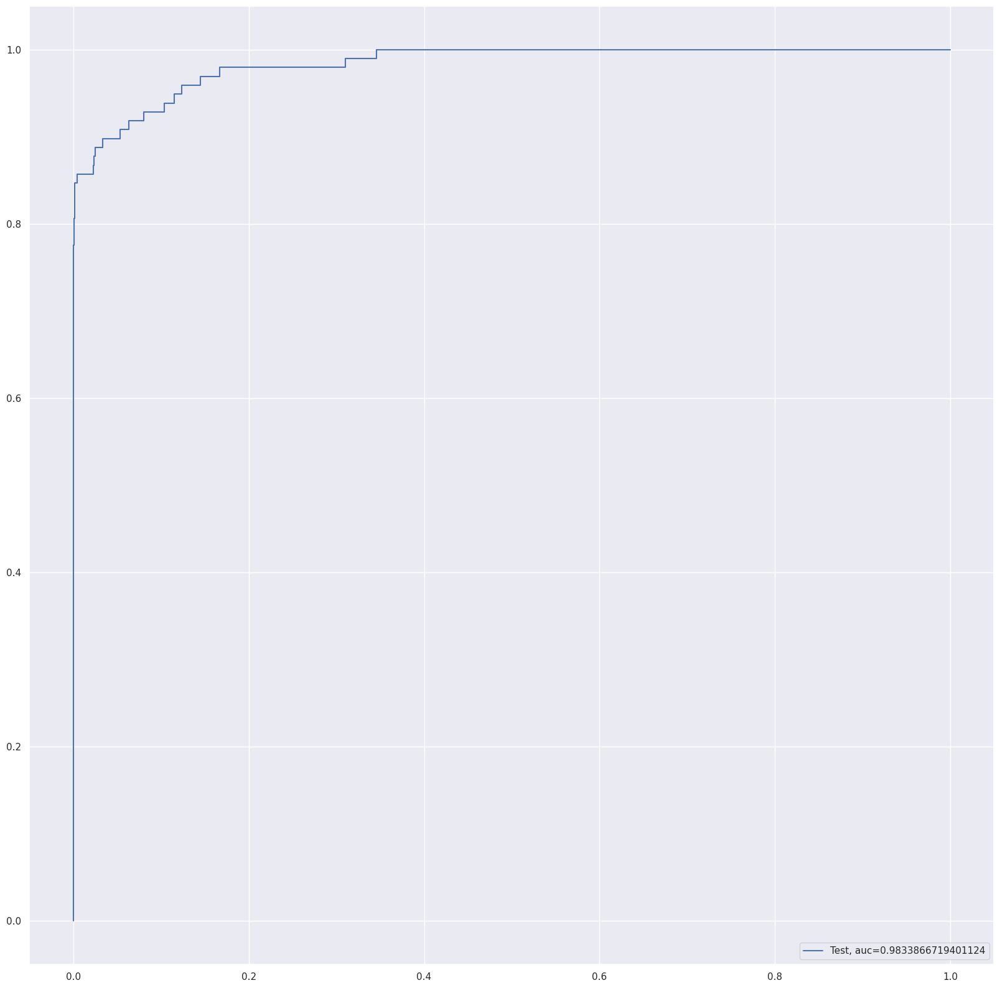

l1 roc_value: 0.8890758561483437
l1 threshold: 0.021087492766199863
ROC for the test dataset 88.9%


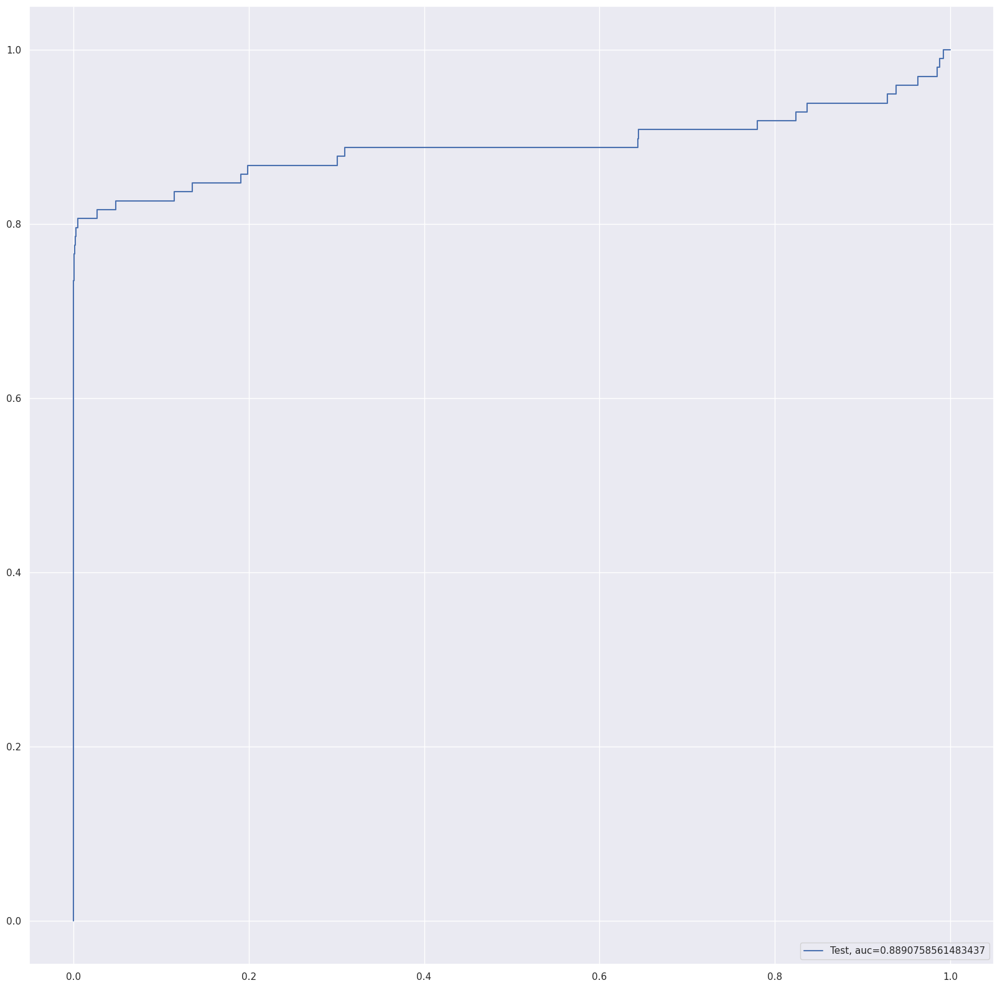

Time Taken by Model: --- 384.83683037757874 seconds ---
--------------------------------------------------------------------------------


In [ ]:
#Run Logistic Regression with L1 And L2 Regularisation
print("Logistic Regression with L1 And L2 Regularisation")
start_time = time.time()
df_Results = buildAndRunLogisticModels(df_Results,"StratifiedKFold Cross Validation", X_train_SKF_cv,y_train_SKF_cv, X_test_SKF_cv, y_test_SKF_cv)
print("Time Taken by Model: --- %s seconds ---" % (time.time() - start_time))
print('-'*80 )



Decision Tree Models with  'gini' & 'entropy' criteria
gini score: 0.998841312476958
Confusion Matrix


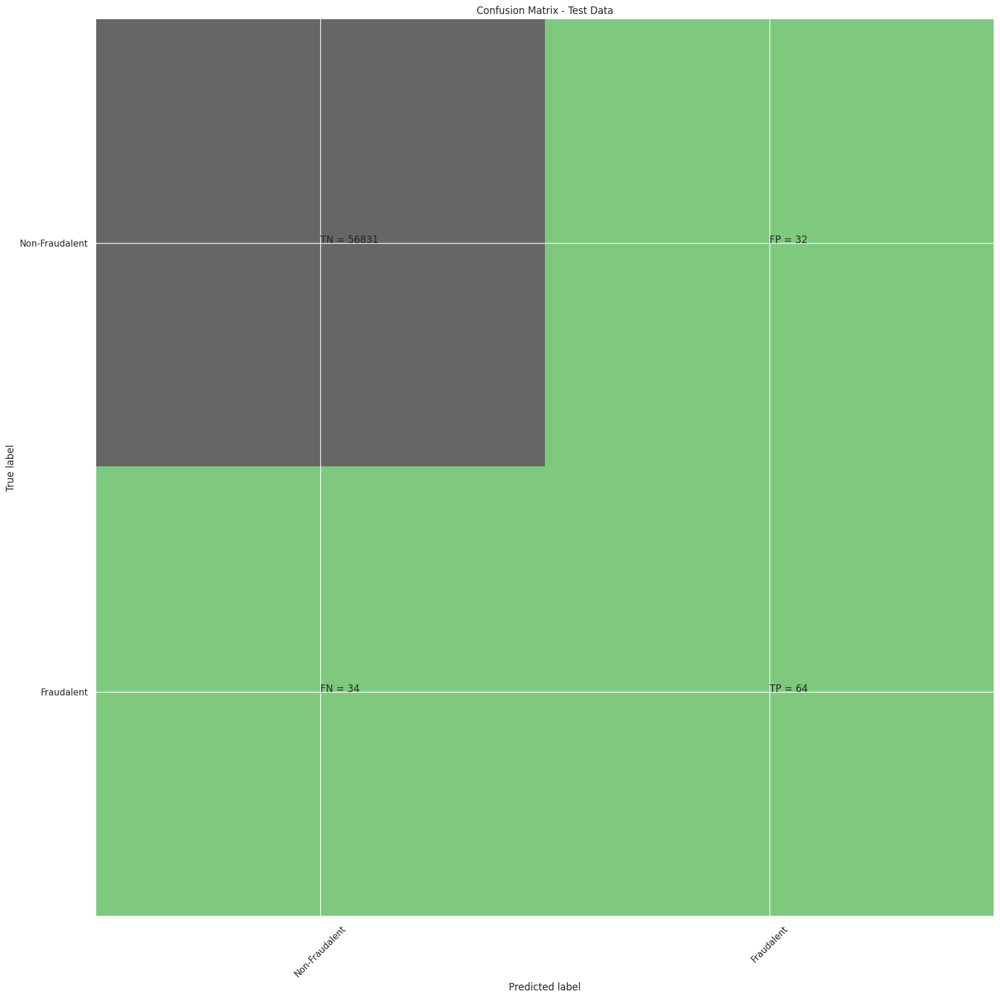

classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56863
           1       0.67      0.65      0.66        98

    accuracy                           1.00     56961
   macro avg       0.83      0.83      0.83     56961
weighted avg       1.00      1.00      1.00     56961

gini tree_roc_value: 0.8262492341959029
Tree threshold: 1.0
ROC for the test dataset 82.6%


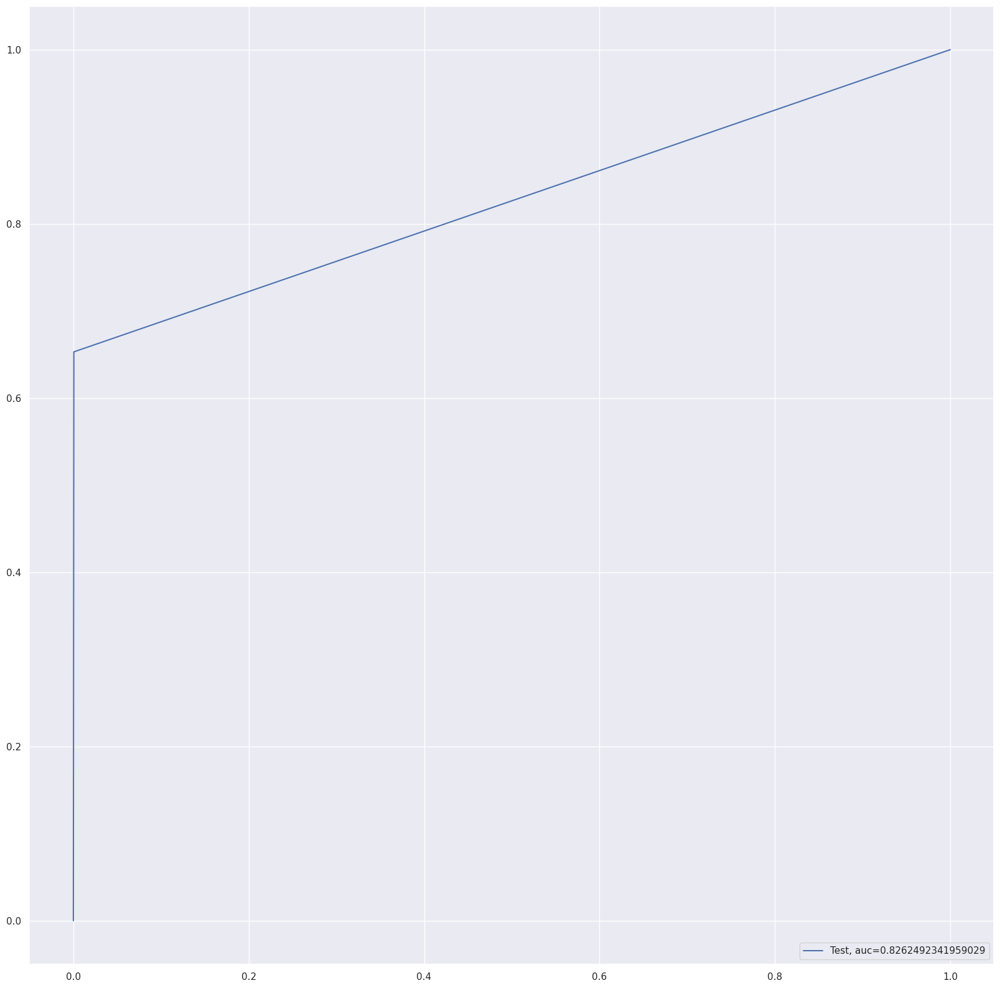

entropy score: 0.9990168711925703
Confusion Matrix


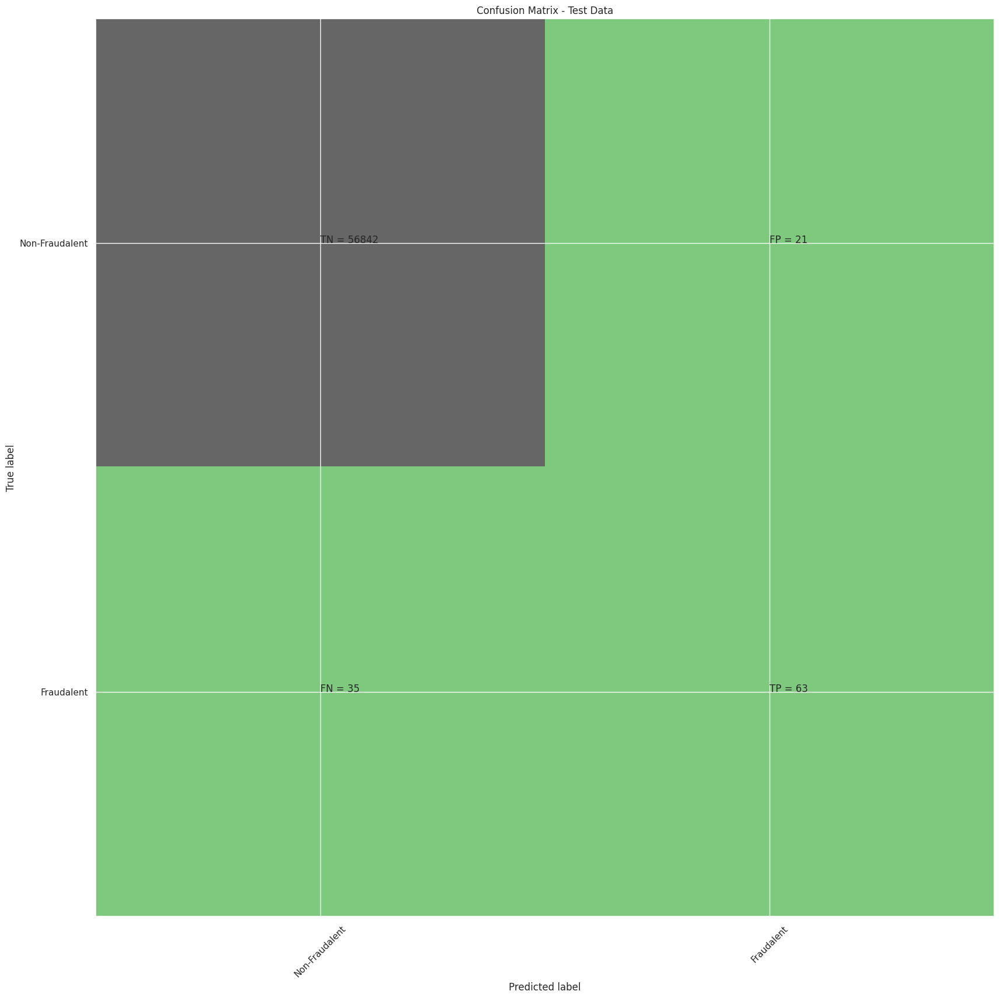

classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56863
           1       0.75      0.64      0.69        98

    accuracy                           1.00     56961
   macro avg       0.87      0.82      0.85     56961
weighted avg       1.00      1.00      1.00     56961

entropy tree_roc_value: 0.8212439170839185
Tree threshold: 1.0
ROC for the test dataset 82.1%


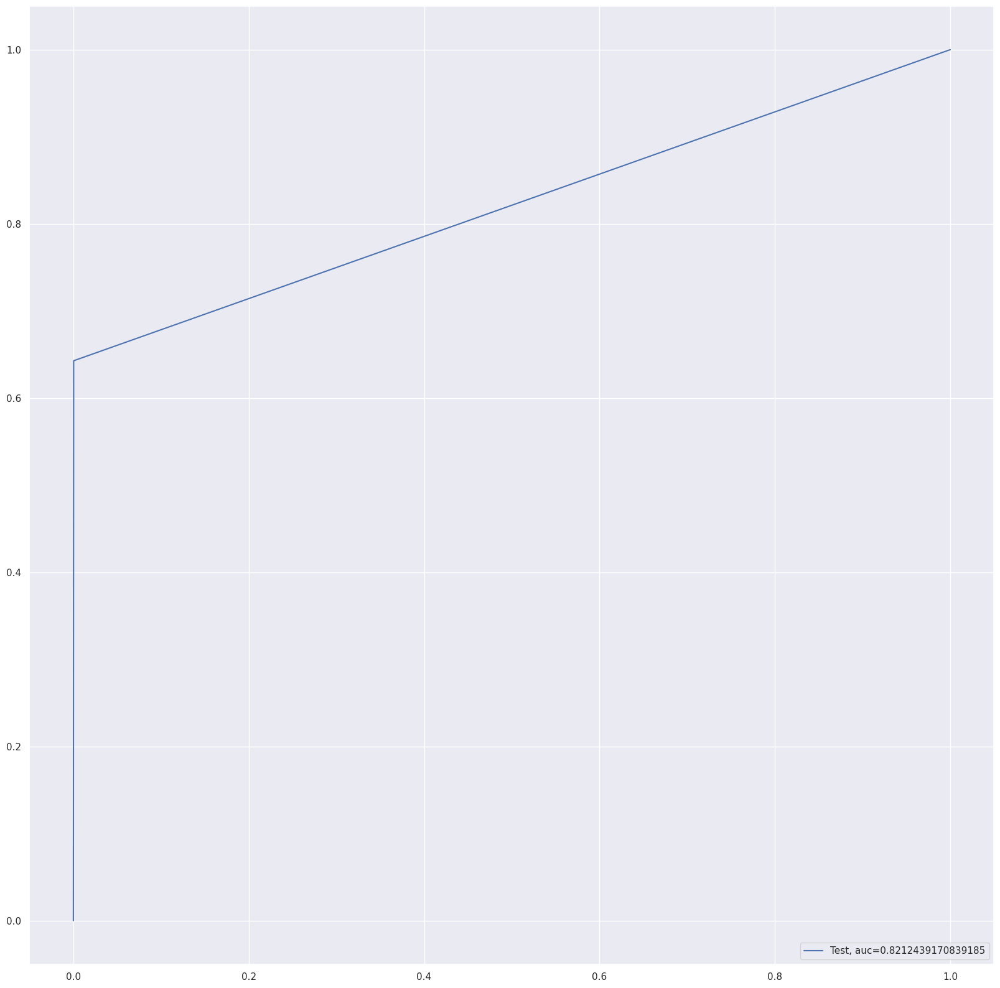

Time Taken by Model: --- 39.81511306762695 seconds ---
--------------------------------------------------------------------------------


In [ ]:
#Run Decision Tree Models with  'gini' & 'entropy' criteria
print("Decision Tree Models with  'gini' & 'entropy' criteria")
start_time = time.time()
df_Results = buildAndRunTreeModels(df_Results,"StratifiedKFold Cross Validation",X_train_SKF_cv,y_train_SKF_cv, X_test_SKF_cv, y_test_SKF_cv)
print("Time Taken by Model: --- %s seconds ---" % (time.time() - start_time))
print('-'*80 )


Random Forest Model
Model Accuracy: 0.9994382121100402
Confusion Matrix


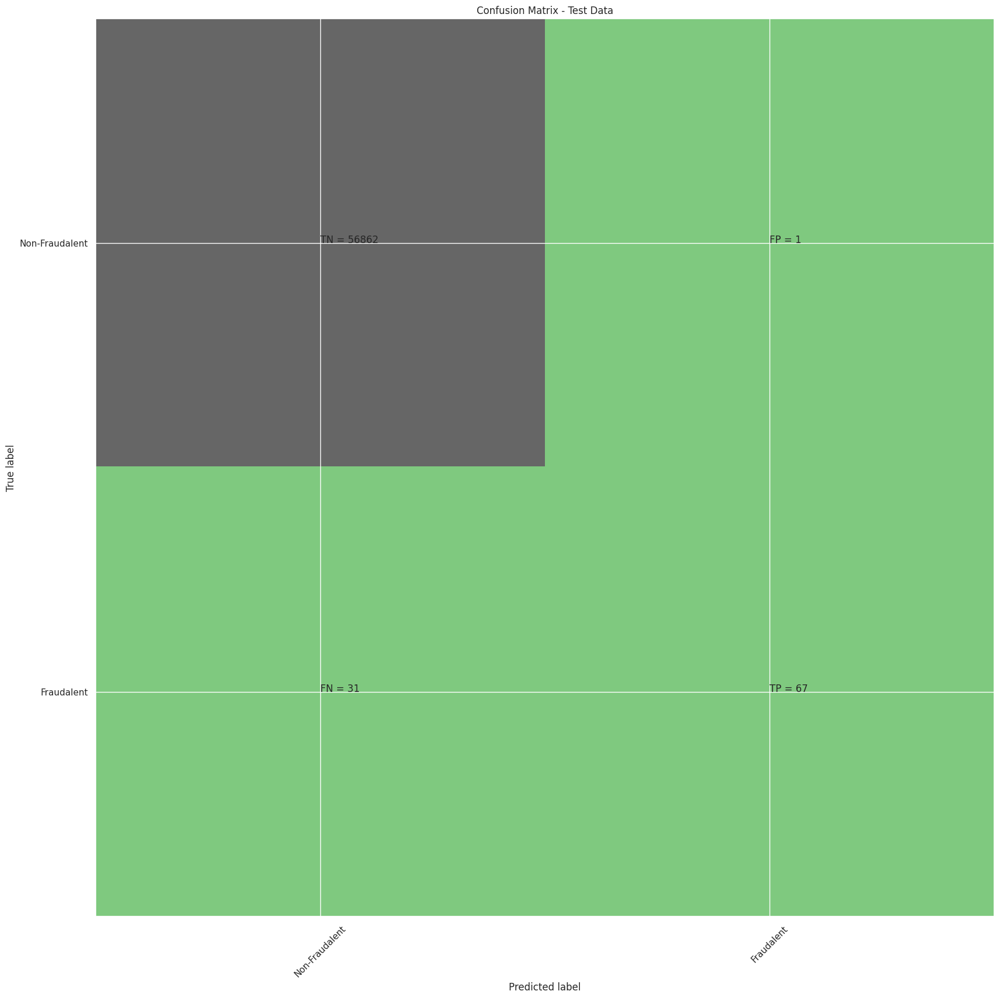

classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56863
           1       0.99      0.68      0.81        98

    accuracy                           1.00     56961
   macro avg       0.99      0.84      0.90     56961
weighted avg       1.00      1.00      1.00     56961

Random Forest roc_value: 0.9464721329855826
Random Forest threshold: 0.01
ROC for the test dataset 94.6%


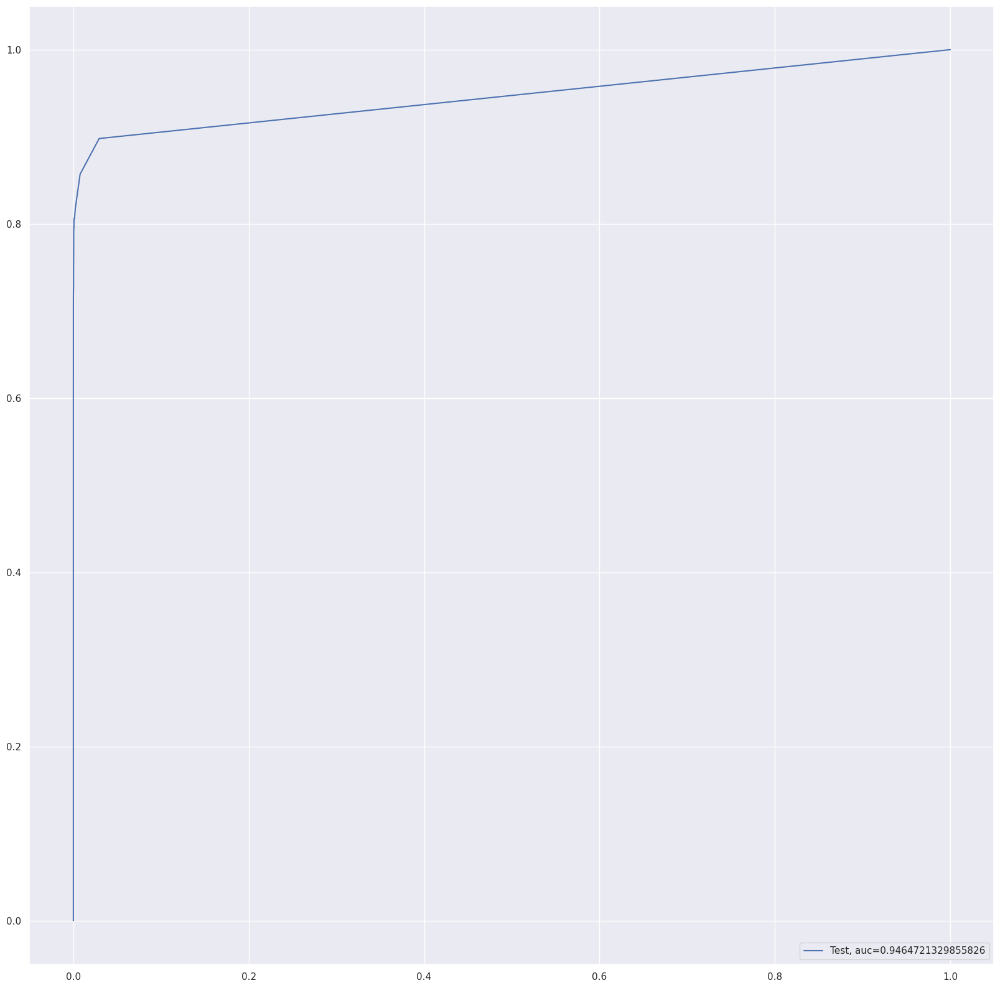

Time Taken by Model: --- 265.70659279823303 seconds ---
--------------------------------------------------------------------------------


In [ ]:
#Run Random Forest Model
print("Random Forest Model")
start_time = time.time()
df_Results = buildAndRunRandomForestModels(df_Results,"StratifiedKFold Cross Validation",X_train_SKF_cv,y_train_SKF_cv, X_test_SKF_cv, y_test_SKF_cv)
print("Time Taken by Model: --- %s seconds ---" % (time.time() - start_time))
print('-'*80 )


XGBoost Model
Model Accuracy: 0.9994382121100402
Confusion Matrix


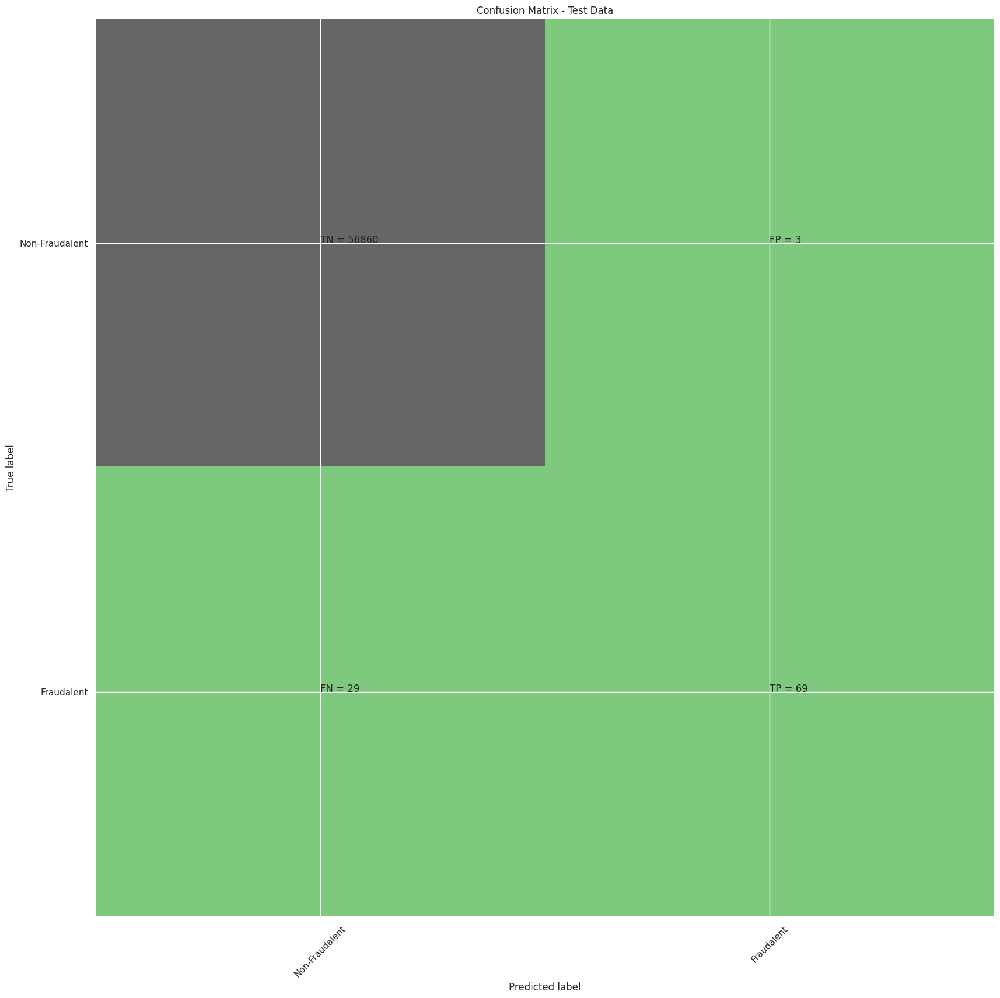

classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56863
           1       0.96      0.70      0.81        98

    accuracy                           1.00     56961
   macro avg       0.98      0.85      0.91     56961
weighted avg       1.00      1.00      1.00     56961

XGboost roc_value: 0.9722049451474309
XGBoost threshold: 3.768169699469581e-05
ROC for the test dataset 97.2%


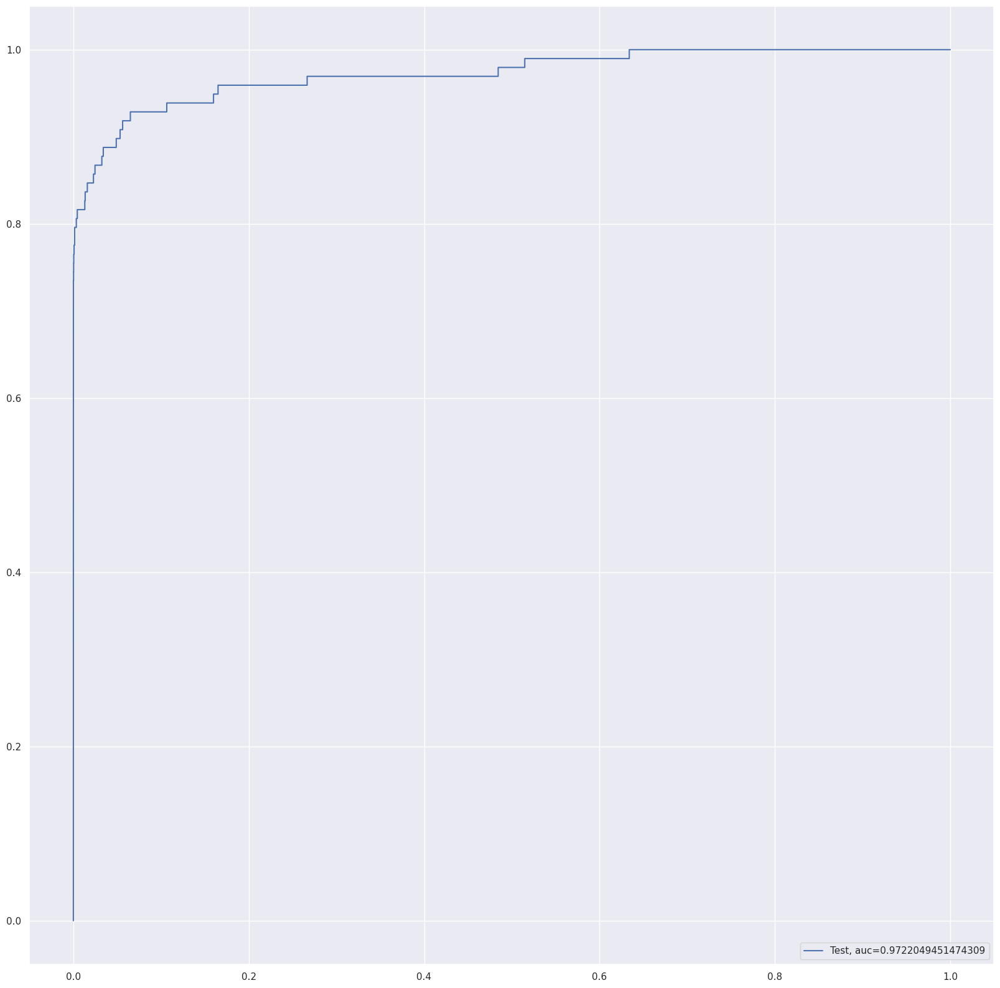

Time Taken by Model: --- 5.473321199417114 seconds ---
--------------------------------------------------------------------------------


In [ ]:
#Run XGBoost Model
print("XGBoost Model")
start_time = time.time()
df_Results = buildAndRunXGBoostModels(df_Results,"StratifiedKFold Cross Validation",X_train_SKF_cv,y_train_SKF_cv, X_test_SKF_cv, y_test_SKF_cv)
print("Time Taken by Model: --- %s seconds ---" % (time.time() - start_time))
print('-'*80 )


SVM Model with Sigmoid Kernel
accuracy_score : 0.9982795245869981
Confusion Matrix


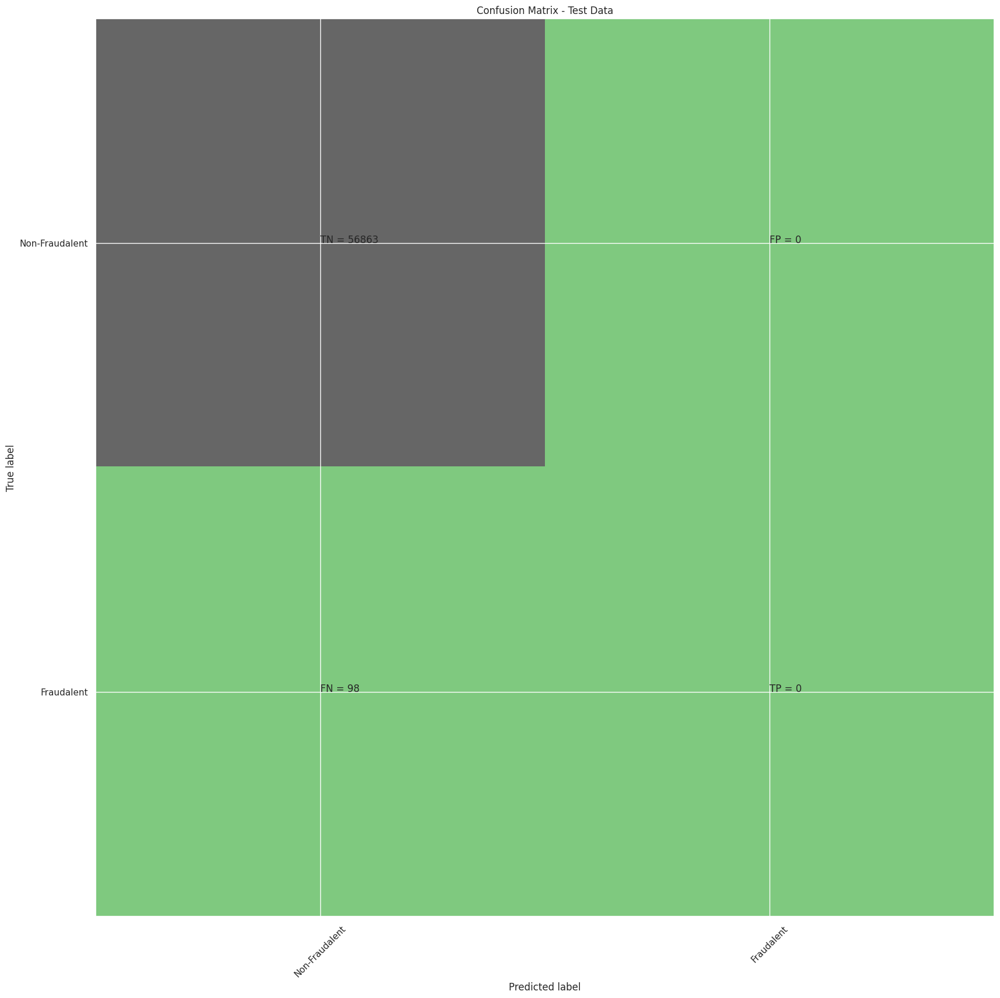

classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56863
           1       0.00      0.00      0.00        98

    accuracy                           1.00     56961
   macro avg       0.50      0.50      0.50     56961
weighted avg       1.00      1.00      1.00     56961

SVM roc_value: 0.40177034885494567
SVM threshold: 0.0018126876881397924
ROC for the test dataset 40.2%


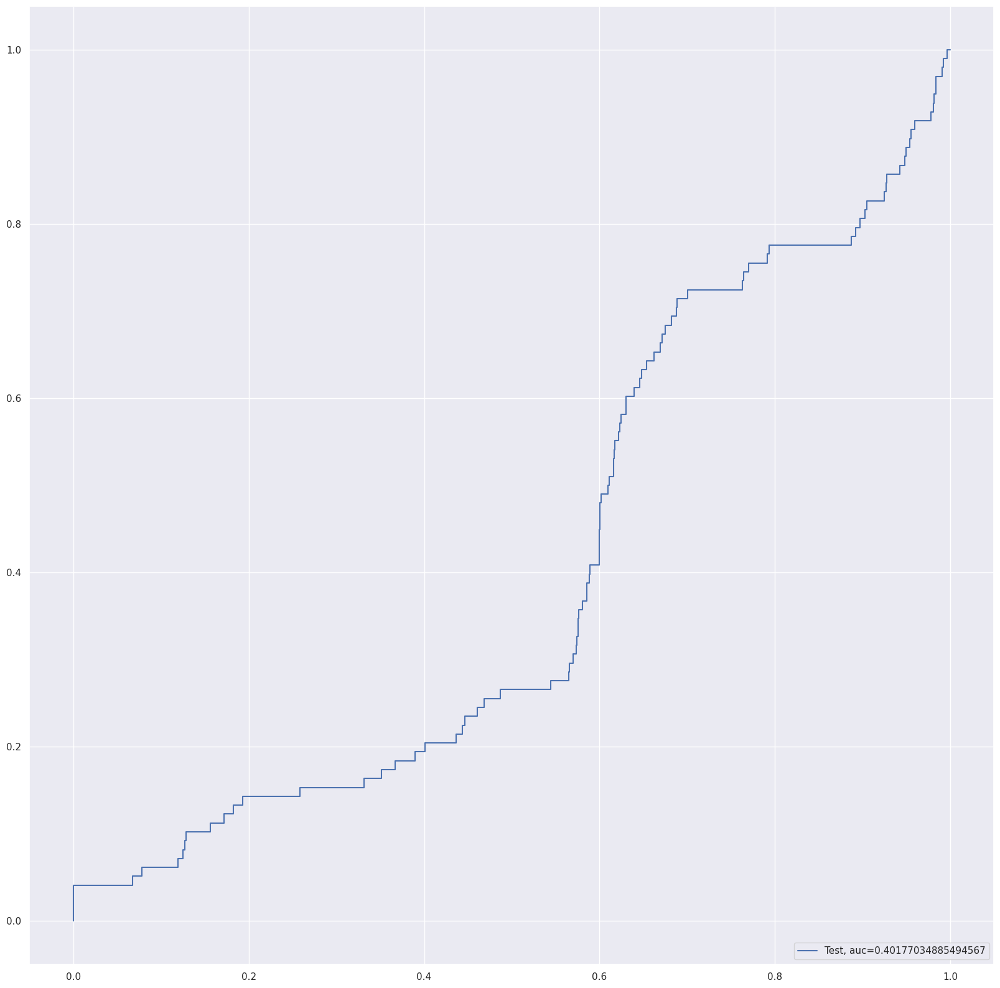

Time Taken by Model: --- 1082.0750632286072 seconds ---
--------------------------------------------------------------------------------


In [ ]:
#Run SVM Model with Sigmoid Kernel
print("SVM Model with Sigmoid Kernel")
start_time = time.time()
df_Results = buildAndRunSVMModels(df_Results,"StratifiedKFold Cross Validation",X_train_SKF_cv,y_train_SKF_cv, X_test_SKF_cv, y_test_SKF_cv)
print("Time Taken by Model: --- %s seconds ---" % (time.time() - start_time))
print('-'*80 )


KNN Model
model score
0.9991924299081828
Confusion Matrix


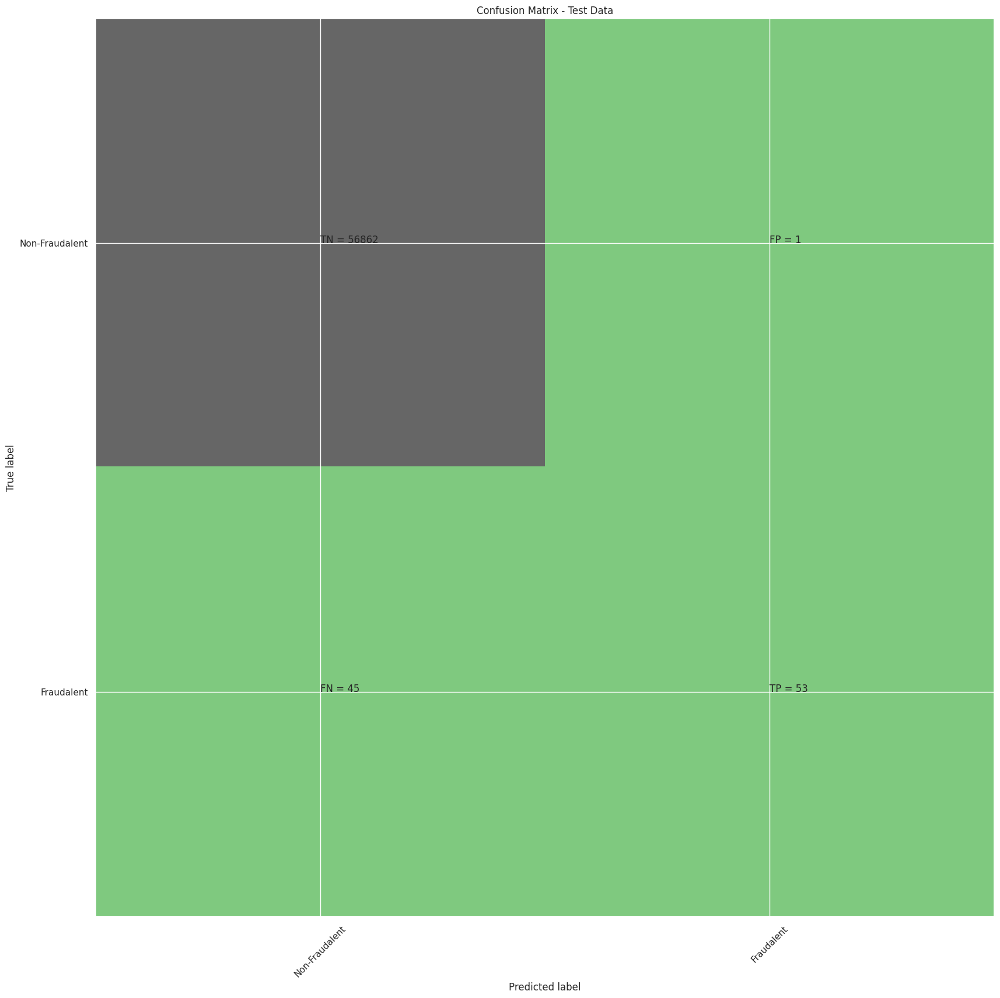

classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56863
           1       0.98      0.54      0.70        98

    accuracy                           1.00     56961
   macro avg       0.99      0.77      0.85     56961
weighted avg       1.00      1.00      1.00     56961

KNN roc_value: 0.8057457828285457
KNN threshold: 0.2
ROC for the test dataset 80.6%


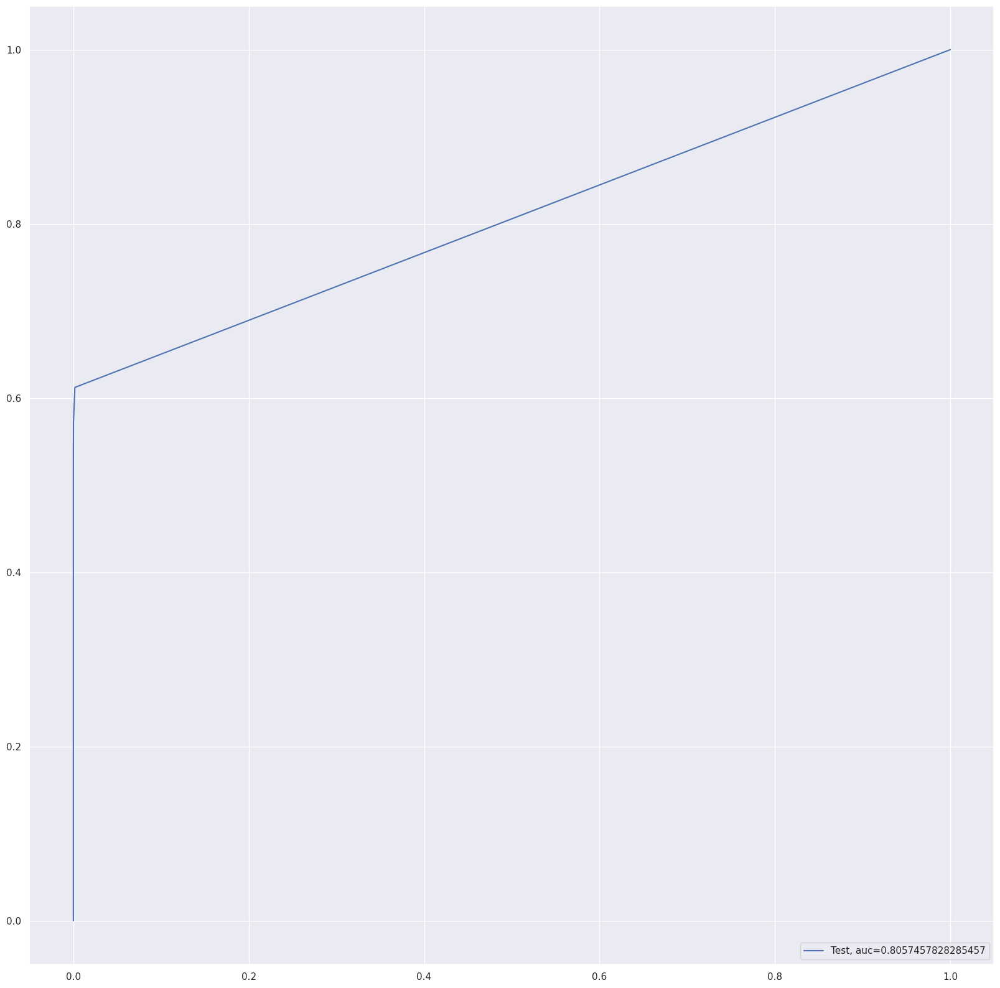

Time Taken by Model: --- 241.85329413414001 seconds ---
--------------------------------------------------------------------------------


In [ ]:
#Run KNN Model
print("KNN Model")
start_time = time.time()
df_Results = buildAndRunKNNModels(df_Results,"StratifiedKFold Cross Validation",X_train_SKF_cv,y_train_SKF_cv, X_test_SKF_cv, y_test_SKF_cv)
print("Time Taken by Model: --- %s seconds ---" % (time.time() - start_time))
print('-'*80 )


In [ ]:
df_Results

,Data_Imbalance_Handiling,Model,Accuracy,roc_value,threshold,Data_Imbalance_Handling
0,NaN,Logistic Regression with L2 Regularisation,0.999073,0.967671,0.001259,Power Transformer
1,NaN,Logistic Regression with L1 Regularisation,0.999017,0.967101,0.004577,Power Transformer
2,Power Transformer,Tree Model with gini criteria,0.998876,0.884880,1.000000,NaN
3,Power Transformer,Tree Model with entropy criteria,0.999059,0.860424,1.000000,NaN
4,Power Transformer,Random Forest,0.999354,0.932552,0.020000,NaN
5,Power Transformer,XGBoost,0.999480,0.980627,0.000025,NaN
6,Power Transformer,SVM,0.998441,0.876366,0.001667,NaN
7,Power Transformer,KNN,0.999228,0.909664,0.200000,NaN
8,NaN,Logistic Regression with L2 Regularisation,0.999052,0.982696,0.003110,RepeatedKFold Cross Validation
9,NaN,Logistic Regression with L1 Regularisation,0.999140,0.894494,0.047180,RepeatedKFold Cross Validation


## Proceed with the model which shows the best result
- Apply the best hyperparameter on the model
- Predict on the test dataset

**Logistic Regression with L2 Regularisation for StratifiedFold cross validation gives best results with roc = 0.983387**

*Let's Apply the best hyperparameter on this model and get the prediction on test dataset*

In [ ]:
 # Logistic Regression
from sklearn import linear_model #import the package
from sklearn.model_selection import KFold

num_C = list(np.power(10.0, np.arange(-10, 10)))
cv_num = KFold(n_splits=10, shuffle=True, random_state=42)

searchCV_l2 = linear_model.LogisticRegressionCV(
          Cs= num_C
          ,penalty='l2'
          ,scoring='roc_auc'
          ,cv=cv_num
          ,random_state=42
          ,max_iter=10000
          ,fit_intercept=True
          ,solver='newton-cg'
          ,tol=10
      )


#searchCV.fit(X_train, y_train)
searchCV_l2.fit(X_train, y_train)
print ('Max auc_roc for l2:', searchCV_l2.scores_[1].mean(axis=0).max())


print("Parameters for l2 regularisations are:")
print(searchCV_l2.coef_)
print(searchCV_l2.intercept_)
print(searchCV_l2.scores_)


Max auc_roc for l2: 0.9856322817863864
Parameters for l2 regularisations are:
[[ 2.51202761e-02  3.59809095e-02 -9.58942015e-02  2.33465346e-01
   7.53656802e-02 -4.41232407e-02 -2.25184717e-02 -1.10584373e-01
  -9.37994155e-02 -1.72612650e-01  1.34576329e-01 -2.06757677e-01
  -4.36568619e-02 -3.76168668e-01 -1.08207752e-02 -1.00422429e-01
  -1.13737515e-01 -8.48765823e-03  1.73181844e-02 -2.23307368e-02
   3.48422614e-02  2.51946214e-02  4.71591594e-03 -1.30385993e-02
  -7.66317451e-03  5.56246043e-03  3.21777137e-03 -1.23590341e-03
   3.54272823e-04 -1.73321605e-03]]
[-7.39006501]
{1: array([[0.5931214 , 0.59268836, 0.61304781, 0.75072609, 0.9209177 ,
        0.94900692, 0.96895126, 0.97317126, 0.97074407, 0.96839687,
        0.96839687, 0.96839687, 0.96839687, 0.96839687, 0.96839687,
        0.96839687, 0.96839687, 0.96839687, 0.96839687, 0.96839687],
       [0.53794581, 0.53938908, 0.55982415, 0.71493682, 0.89926143,
        0.95477009, 0.99433112, 0.99666927, 0.99533281, 0.9925127

In [ ]:
#Find predicted values
y_pred_l2 = searchCV_l2.predict(X_test)


#Find predicted probabilities
y_pred_probs_l2 = searchCV_l2.predict_proba(X_test)[:,1]


# Accuaracy of the L2/L1 models
Accuracy_l2 = metrics.accuracy_score(y_pred=y_pred_l2, y_true=y_test)


print("Accuarcy of Logistic model with l2 regularisation : {0}".format(Accuracy_l2))


Accuarcy of Logistic model with l2 regularisation : 0.9989045251537878


In [ ]:
from sklearn.metrics import roc_auc_score

l2_roc_value = roc_auc_score(y_test, y_pred_probs_l2)
print("l2 roc_value: {0}" .format(l2_roc_value))

fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred_probs_l2)
threshold = thresholds[np.argmax(tpr-fpr)]
print("l2 threshold: {0}".format(threshold))


l2 roc_value: 0.9727274509442143
l2 threshold: 0.0013695263297653563


In [ ]:
searchCV_l2.coef_

array([[ 2.51202761e-02,  3.59809095e-02, -9.58942015e-02,
         2.33465346e-01,  7.53656802e-02, -4.41232407e-02,
        -2.25184717e-02, -1.10584373e-01, -9.37994155e-02,
        -1.72612650e-01,  1.34576329e-01, -2.06757677e-01,
        -4.36568619e-02, -3.76168668e-01, -1.08207752e-02,
        -1.00422429e-01, -1.13737515e-01, -8.48765823e-03,
         1.73181844e-02, -2.23307368e-02,  3.48422614e-02,
         2.51946214e-02,  4.71591594e-03, -1.30385993e-02,
        -7.66317451e-03,  5.56246043e-03,  3.21777137e-03,
        -1.23590341e-03,  3.54272823e-04, -1.73321605e-03]])

In [ ]:
coefficients = pd.concat([pd.DataFrame(X.columns),pd.DataFrame(np.transpose(searchCV_l2.coef_))], axis = 1)
coefficients.columns = ['Feature','Importance Coefficient']

coefficients

,Feature,Importance Coefficient
0,V1,0.025120
1,V2,0.035981
2,V3,-0.095894
3,V4,0.233465
4,V5,0.075366
5,V6,-0.044123
6,V7,-0.022518
7,V8,-0.110584
8,V9,-0.093799
9,V10,-0.172613


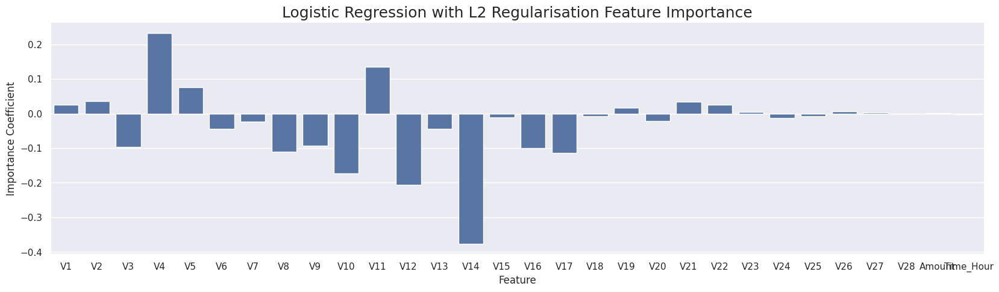

In [ ]:
#Plotting barplot
plt.figure(figsize=(20,5))
sns.barplot(x='Feature', y='Importance Coefficient', data=coefficients)

plt.title("Logistic Regression with L2 Regularisation Feature Importance", fontsize=18)

plt.show()

**V4, V11, v5 has + ve imporatnce whereas V14, V12, V10 seems to have -ve impact on the predictaions**
Let's try undersampling to reduce execution time

In [ ]:
from imblearn.under_sampling import RandomUnderSampler

#Defining Oversampler
RUS = RandomUnderSampler(sampling_strategy=0.5)

# fit and apply
X_Under, y_Under = RUS.fit_resample(X_train, y_train)

#Creating Dataframe
X_Under = pd.DataFrame(data=X_Under,   columns=columns_list)

Logistic Regression with L1 And L2 Regularisation
Max auc_roc for l2: 0.9807855353116146
Max auc_roc for l1: 0.5
Parameters for l2 regularisations
[[-0.01720598  0.07067748 -0.14008872  0.43022851  0.09223963 -0.10531609
  -0.08859586 -0.09529312 -0.07210322 -0.14979662  0.17467771 -0.32051705
  -0.07362638 -0.40022686 -0.06561068 -0.06201614 -0.0386494   0.0296539
  -0.0094377  -0.06767422  0.02299634  0.02641717  0.04309227 -0.01685964
   0.01836128 -0.03157785  0.04080412  0.02758428  0.00158989  0.00319251]]
[-3.14664166]
{1: array([[0.52444614, 0.52521008, 0.5328495 , 0.58135982, 0.78762414,
        0.93315508, 0.97211612, 0.96982429, 0.98128342, 0.97860963,
        0.97860963, 0.97860963, 0.97860963, 0.97860963, 0.97860963,
        0.97860963, 0.97860963, 0.97860963, 0.97860963, 0.97860963],
       [0.48259494, 0.48378165, 0.49248418, 0.55617089, 0.73496835,
        0.88014241, 0.94897152, 0.97191456, 0.97863924, 0.97587025,
        0.97587025, 0.97587025, 0.97587025, 0.97587025,

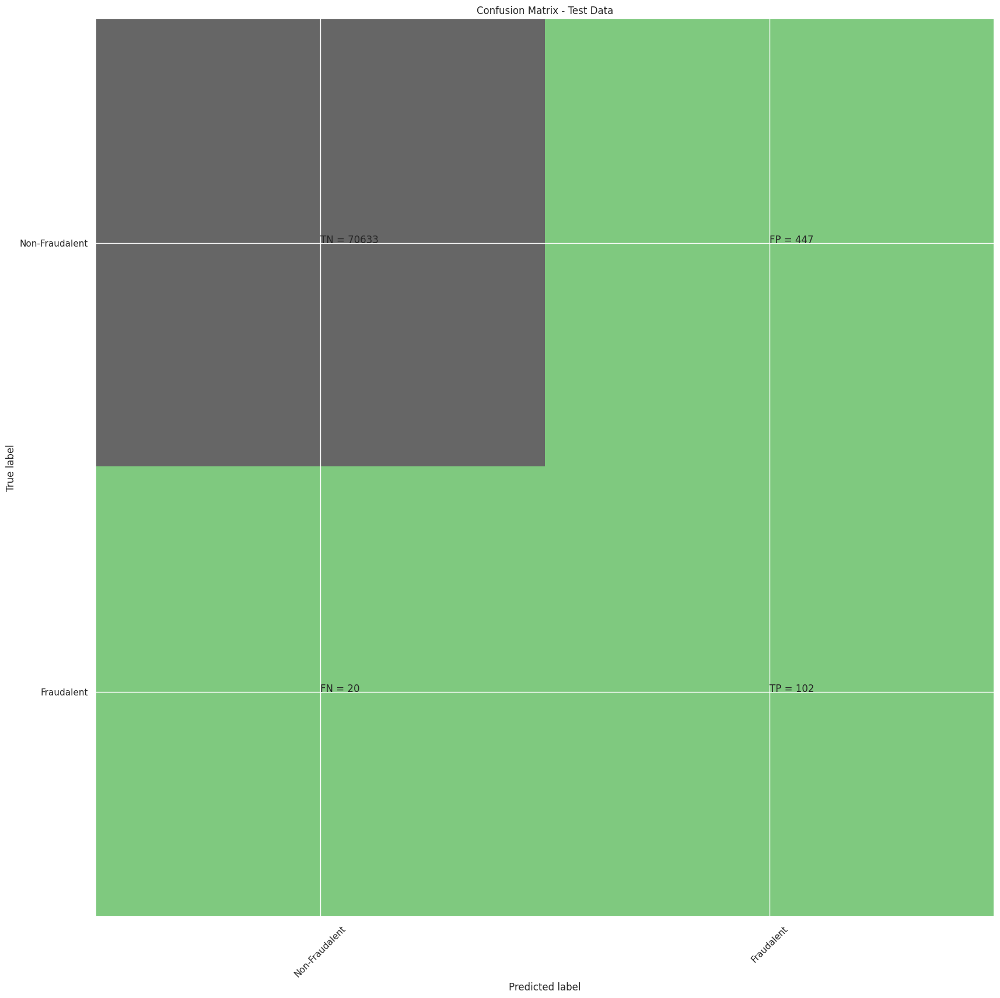

classification Report
              precision    recall  f1-score   support

           0       1.00      0.99      1.00     71080
           1       0.19      0.84      0.30       122

    accuracy                           0.99     71202
   macro avg       0.59      0.91      0.65     71202
weighted avg       1.00      0.99      1.00     71202

Accuarcy of Logistic model with l1 regularisation : 0.9982865649841297
Confusion Matrix


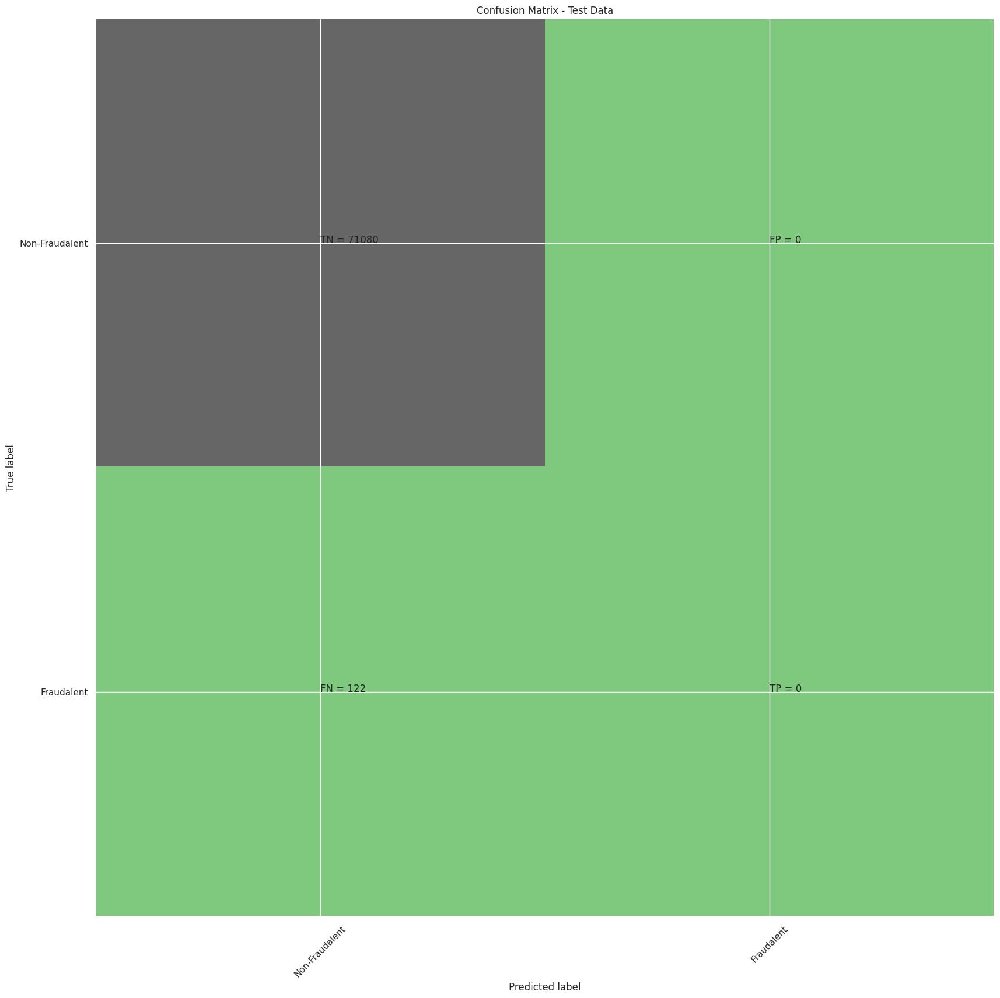

classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     71080
           1       0.00      0.00      0.00       122

    accuracy                           1.00     71202
   macro avg       0.50      0.50      0.50     71202
weighted avg       1.00      1.00      1.00     71202

l2 roc_value: 0.9719775455040269
l2 threshold: 0.13437249054015937
ROC for the test dataset 97.2%


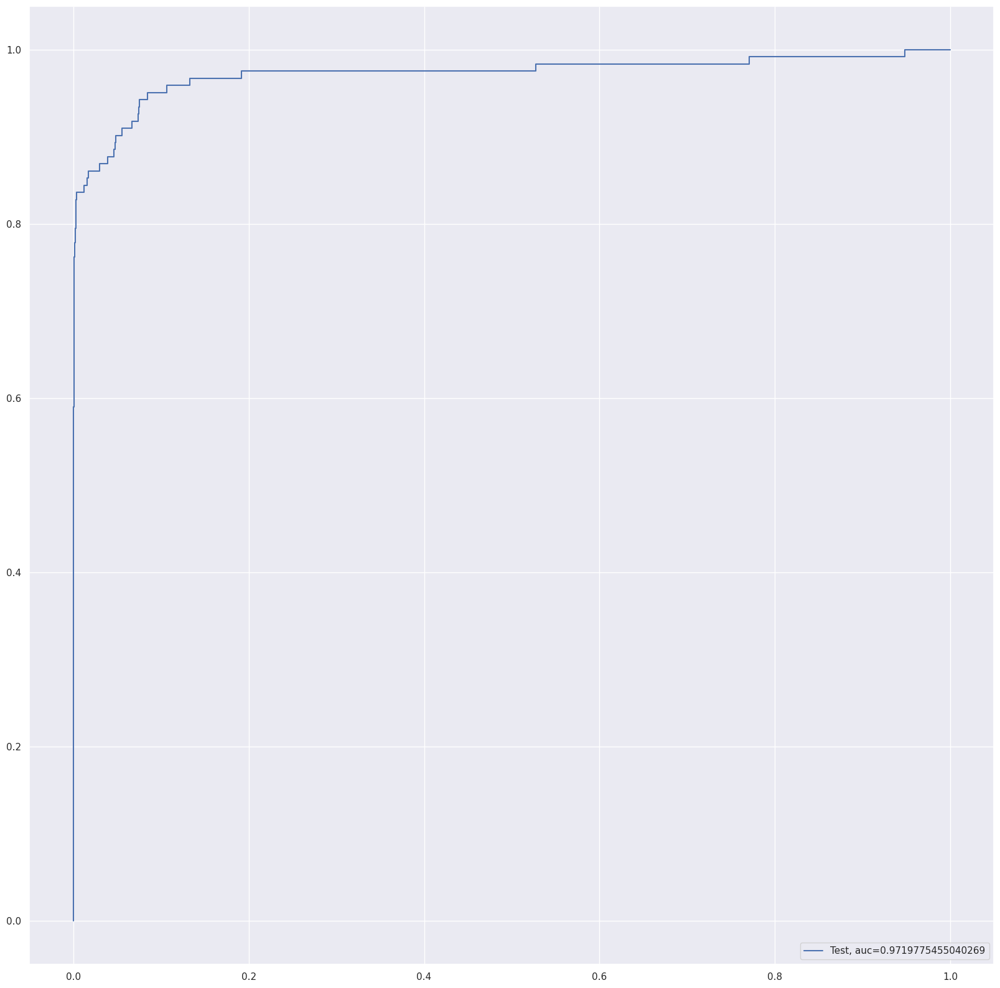

l1 roc_value: 0.5
l1 threshold: 1.5
ROC for the test dataset 50.0%


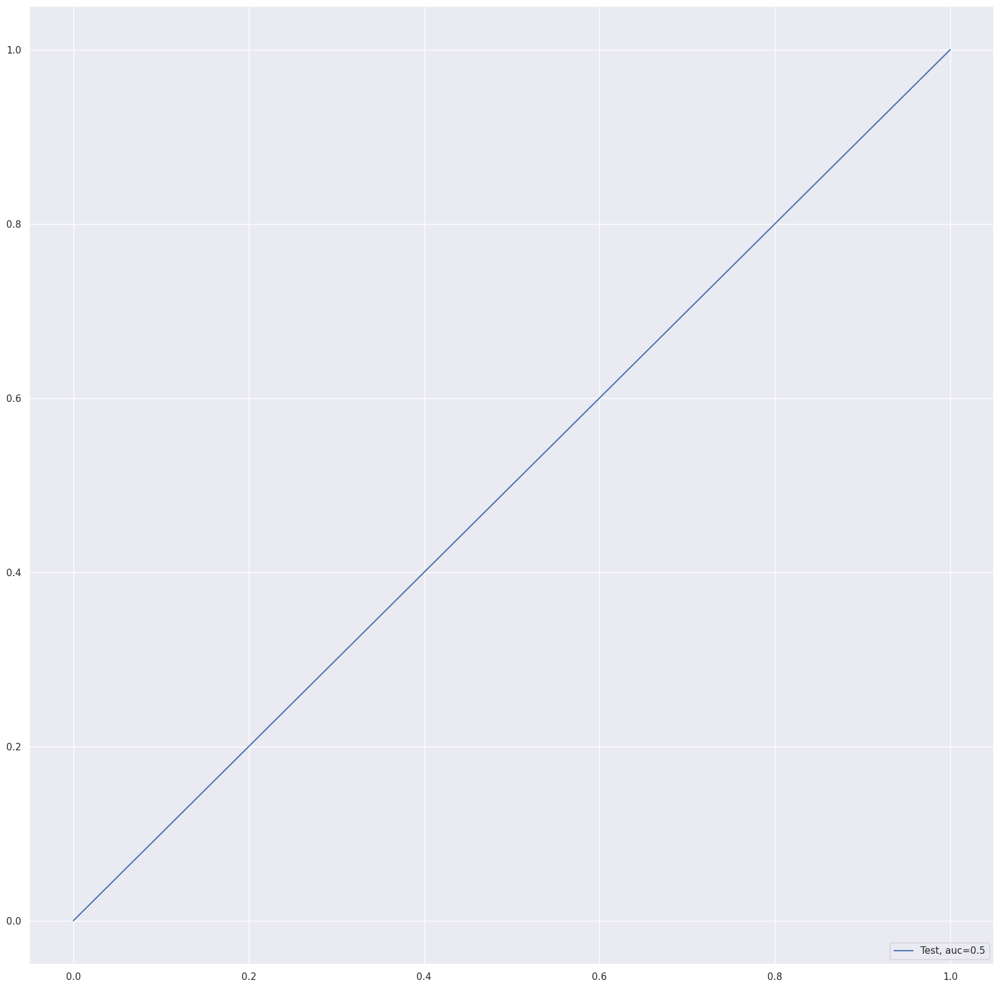

Time Taken by Model: --- 5.607385635375977 seconds ---
--------------------------------------------------------------------------------


In [ ]:
#Running Logistic Regression with L1 And L2 Regularisation
print("Logistic Regression with L1 And L2 Regularisation")
start_time = time.time()
df_Results = buildAndRunLogisticModels(df_Results,"Random Undersampling", X_Under, y_Under , X_test, y_test)
print("Time Taken by Model: --- %s seconds ---" % (time.time() - start_time))
print('-'*80 )


Decision Tree Models with  'gini' & 'entropy' criteria
gini score: 0.9437796691104182
Confusion Matrix


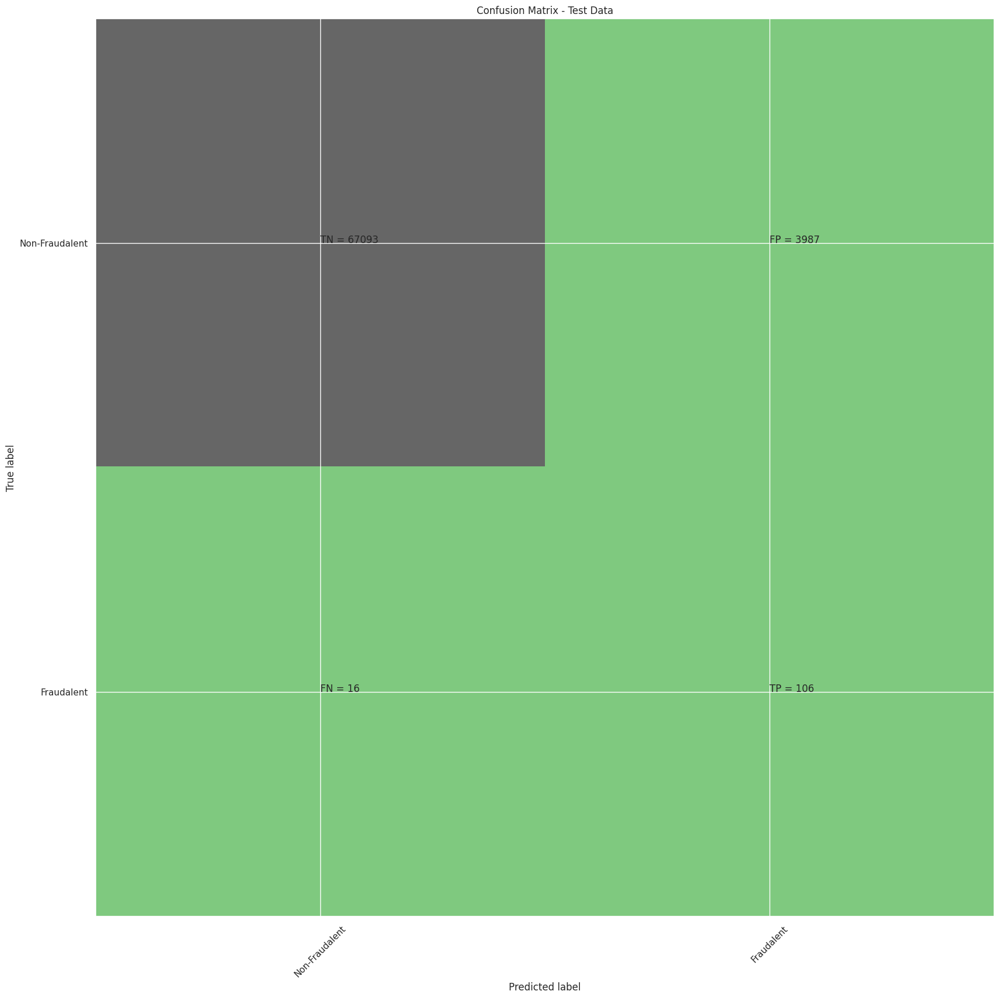

classification Report
              precision    recall  f1-score   support

           0       1.00      0.94      0.97     71080
           1       0.03      0.87      0.05       122

    accuracy                           0.94     71202
   macro avg       0.51      0.91      0.51     71202
weighted avg       1.00      0.94      0.97     71202

gini tree_roc_value: 0.9063803656927775
Tree threshold: 1.0
ROC for the test dataset 90.6%


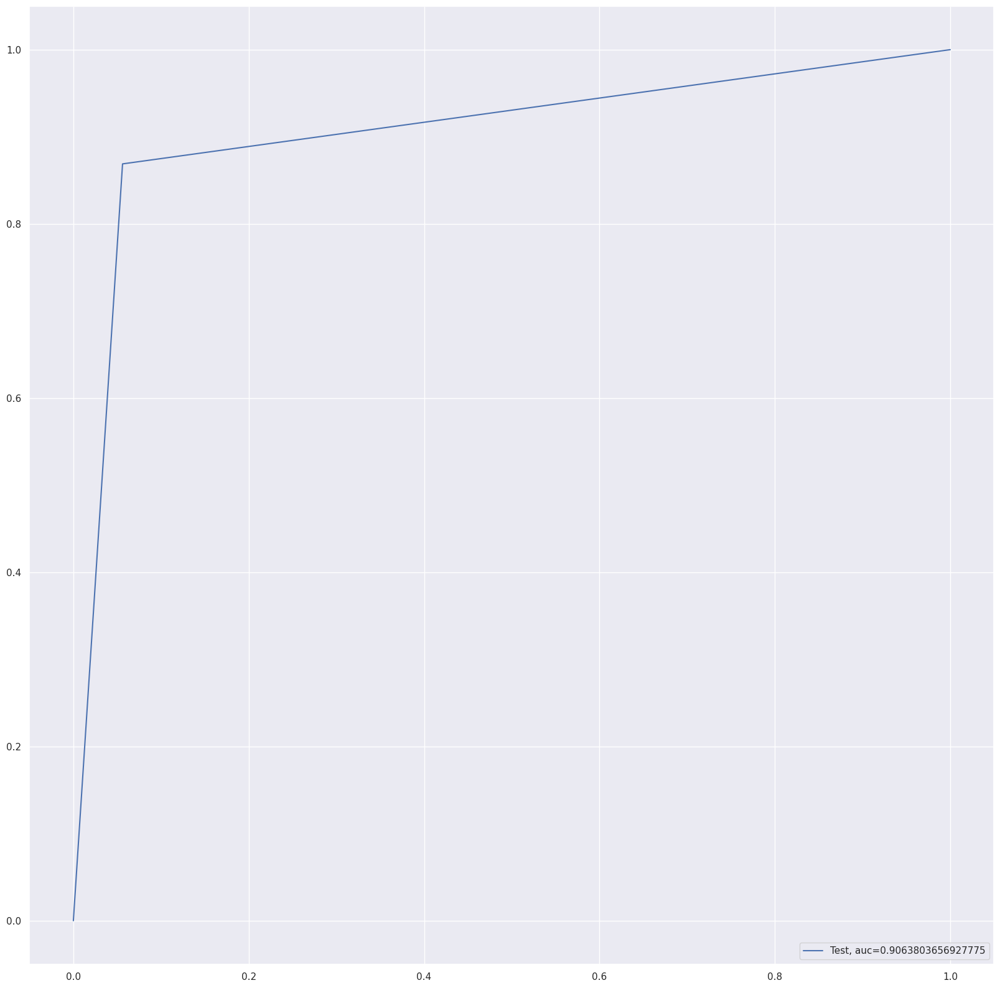

entropy score: 0.9492991769894105
Confusion Matrix


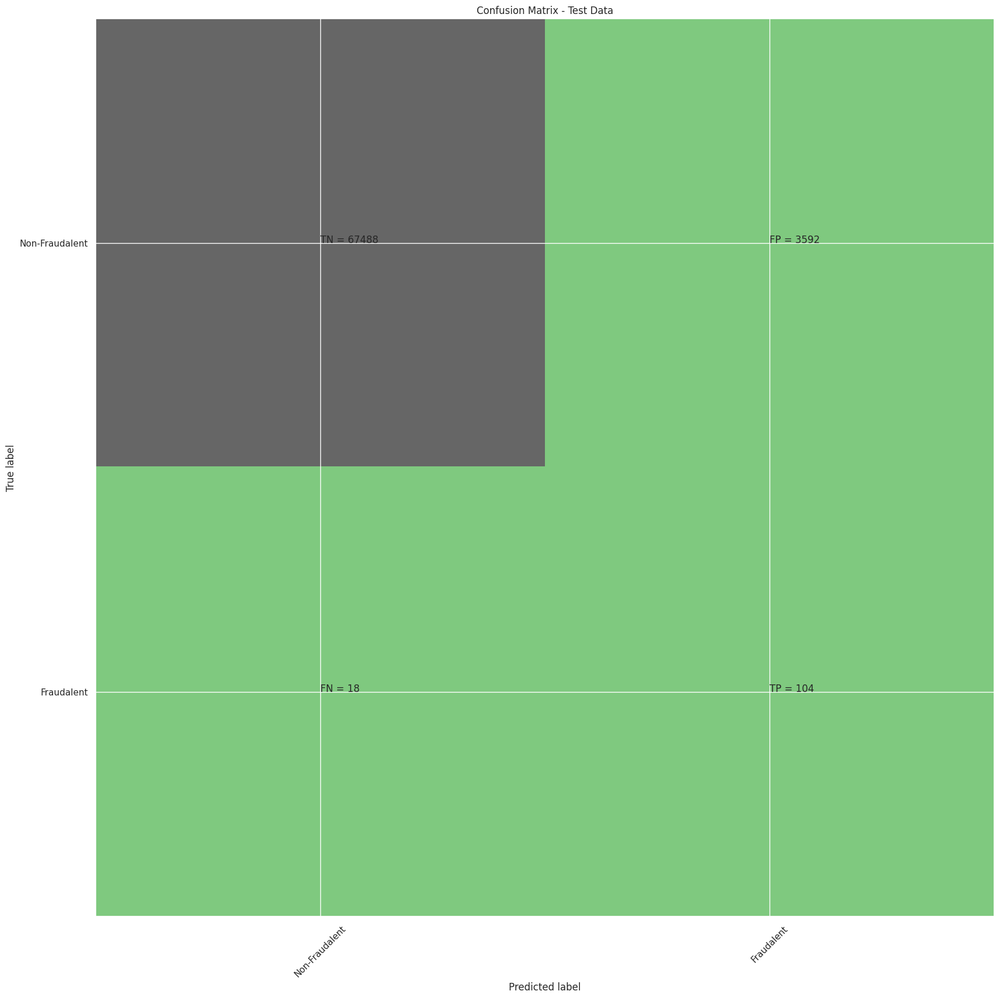

classification Report
              precision    recall  f1-score   support

           0       1.00      0.95      0.97     71080
           1       0.03      0.85      0.05       122

    accuracy                           0.95     71202
   macro avg       0.51      0.90      0.51     71202
weighted avg       1.00      0.95      0.97     71202

entropy tree_roc_value: 0.9009622037510264
Tree threshold: 1.0
ROC for the test dataset 90.1%


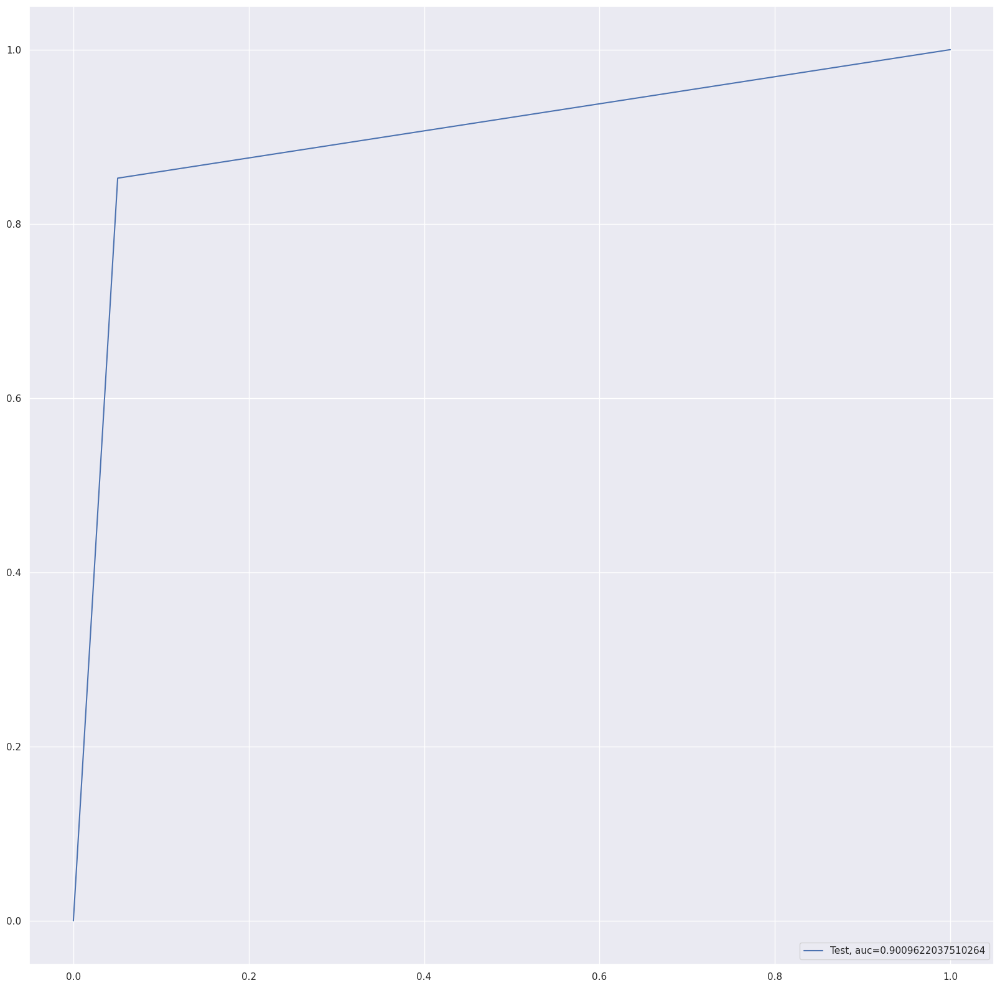

Time Taken by Model: --- 2.326716661453247 seconds ---
--------------------------------------------------------------------------------


In [ ]:
#Run Decision Tree Models with  'gini' & 'entropy' criteria
print("Decision Tree Models with  'gini' & 'entropy' criteria")
start_time = time.time()
df_Results = buildAndRunTreeModels(df_Results, "Random Undersampling",X_Under, y_Under , X_test, y_test)
print("Time Taken by Model: --- %s seconds ---" % (time.time() - start_time))
print('-'*80 )


Random Forest Model
Model Accuracy: 0.9914047358220275
Confusion Matrix


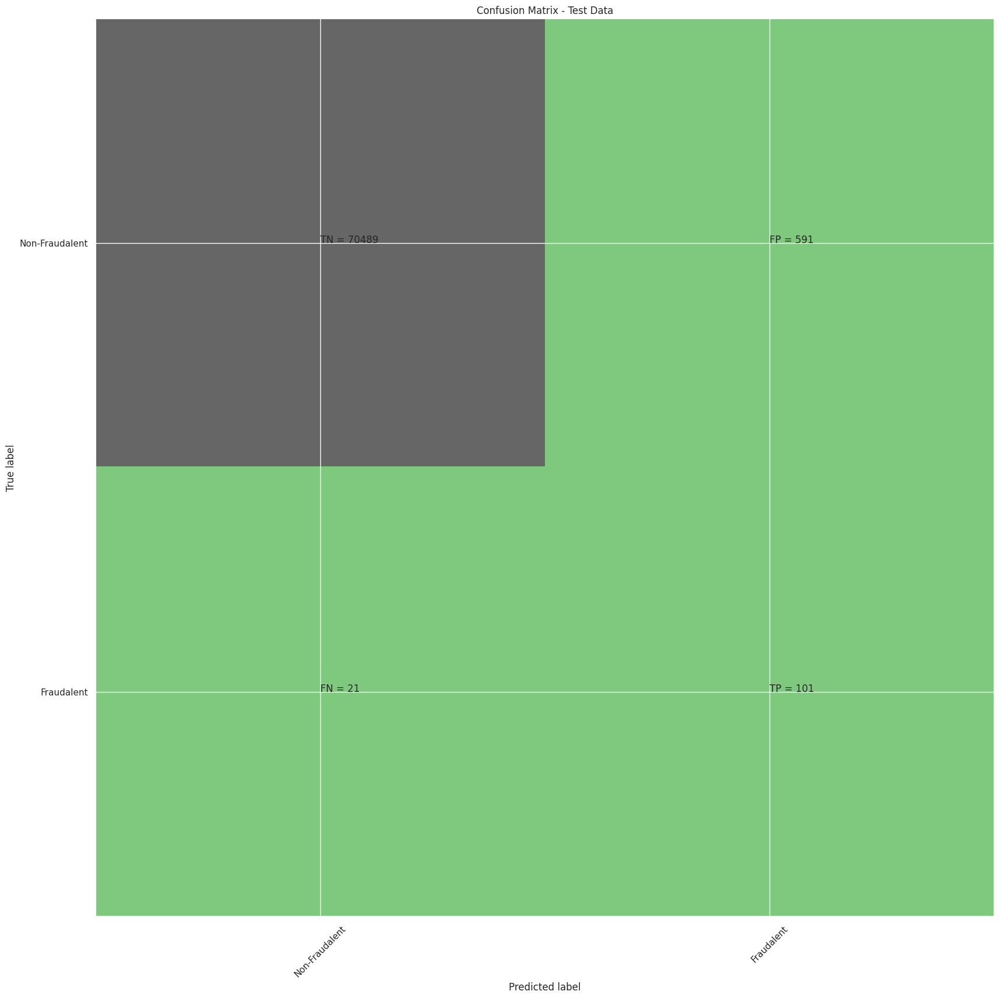

classification Report
              precision    recall  f1-score   support

           0       1.00      0.99      1.00     71080
           1       0.15      0.83      0.25       122

    accuracy                           0.99     71202
   macro avg       0.57      0.91      0.62     71202
weighted avg       1.00      0.99      0.99     71202

Random Forest roc_value: 0.9698207745601815
Random Forest threshold: 0.22
ROC for the test dataset 97.0%


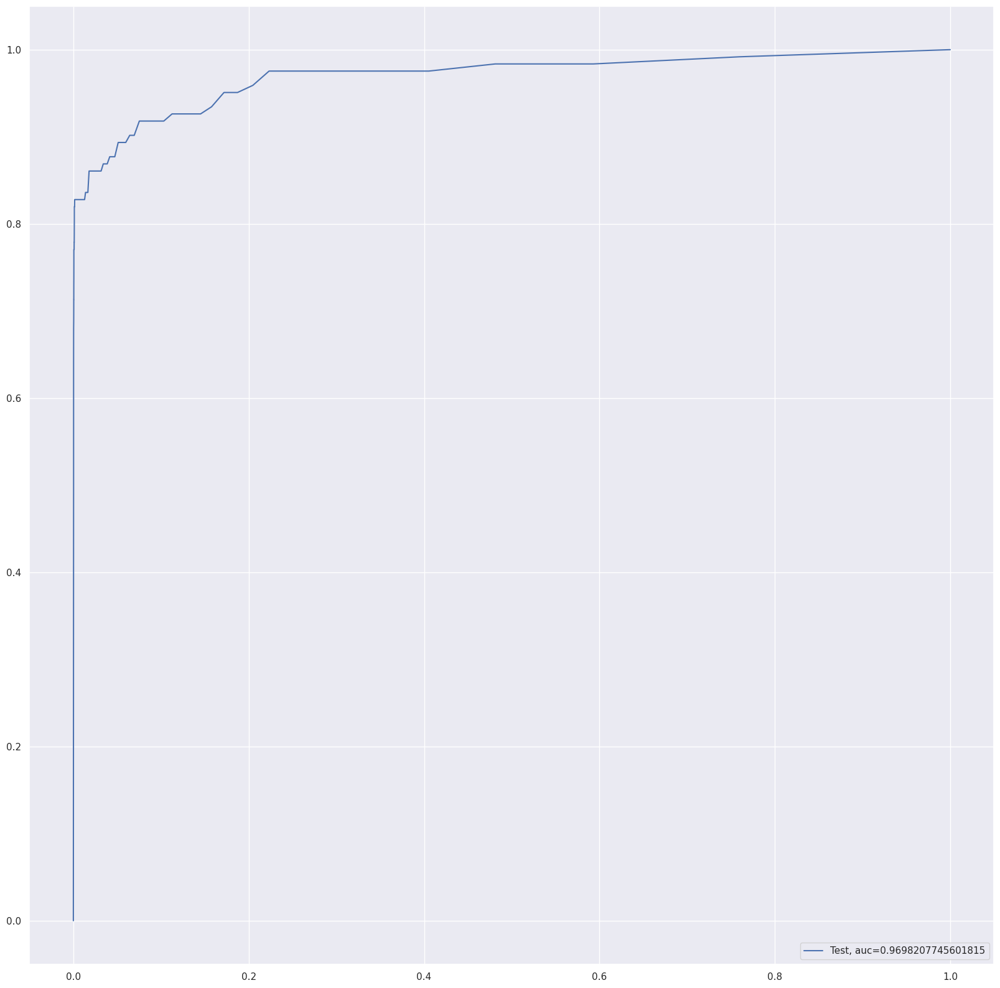

Time Taken by Model: --- 3.981309652328491 seconds ---
--------------------------------------------------------------------------------


In [ ]:
#Run Random Forest Model
print("Random Forest Model")
start_time = time.time()
df_Results = buildAndRunRandomForestModels(df_Results, "Random Undersampling",X_Under, y_Under , X_test, y_test)
print("Time Taken by Model: --- %s seconds ---" % (time.time() - start_time))
print('-'*80 )


XGBoost Model
Model Accuracy: 0.9829499171371591
Confusion Matrix


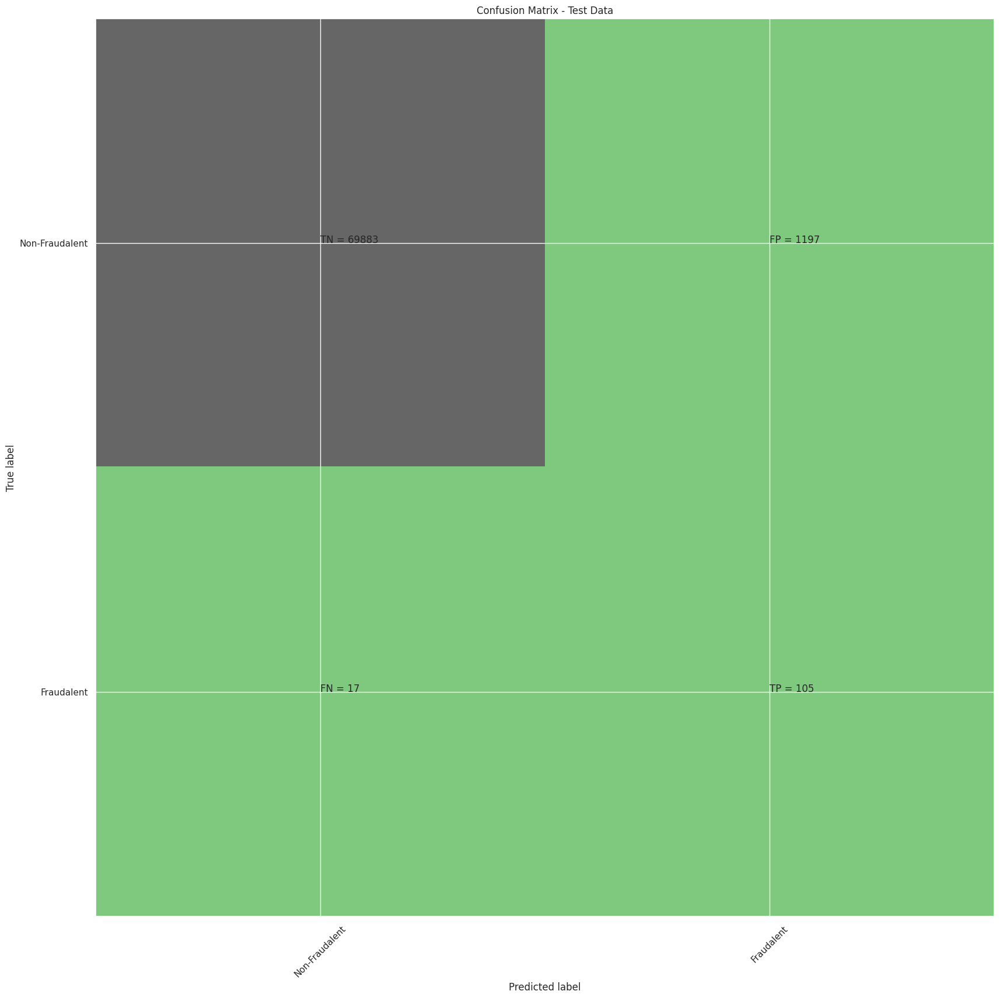

classification Report
              precision    recall  f1-score   support

           0       1.00      0.98      0.99     71080
           1       0.08      0.86      0.15       122

    accuracy                           0.98     71202
   macro avg       0.54      0.92      0.57     71202
weighted avg       1.00      0.98      0.99     71202

XGboost roc_value: 0.9795295879959778
XGBoost threshold: 0.08307598531246185
ROC for the test dataset 98.0%


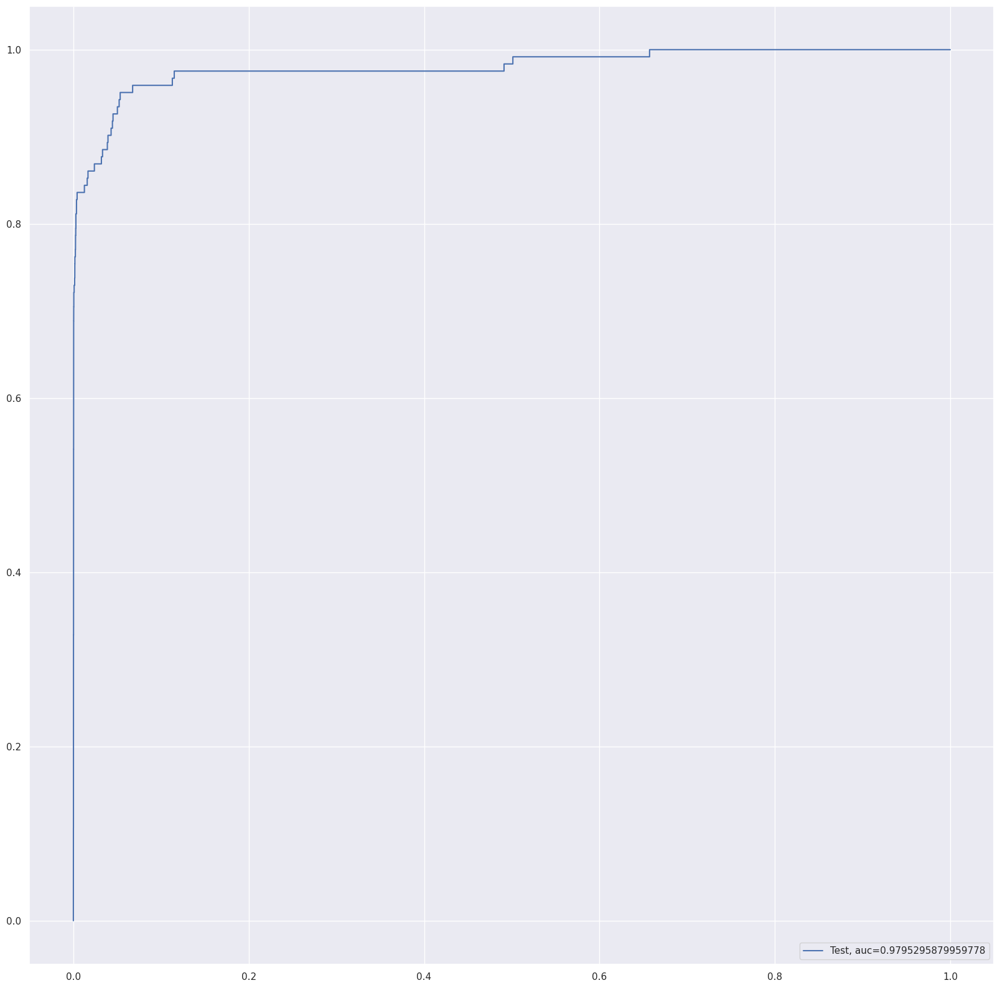

Time Taken by Model: --- 2.439356565475464 seconds ---
--------------------------------------------------------------------------------


In [ ]:
#Run XGBoost Model
print("XGBoost Model")
start_time = time.time()
df_Results = buildAndRunXGBoostModels(df_Results, "Random Undersampling",X_Under, y_Under , X_test, y_test)
print("Time Taken by Model: --- %s seconds ---" % (time.time() - start_time))
print('-'*80 )


SVM Model with Sigmoid Kernel
accuracy_score : 0.8102160051683941
Confusion Matrix


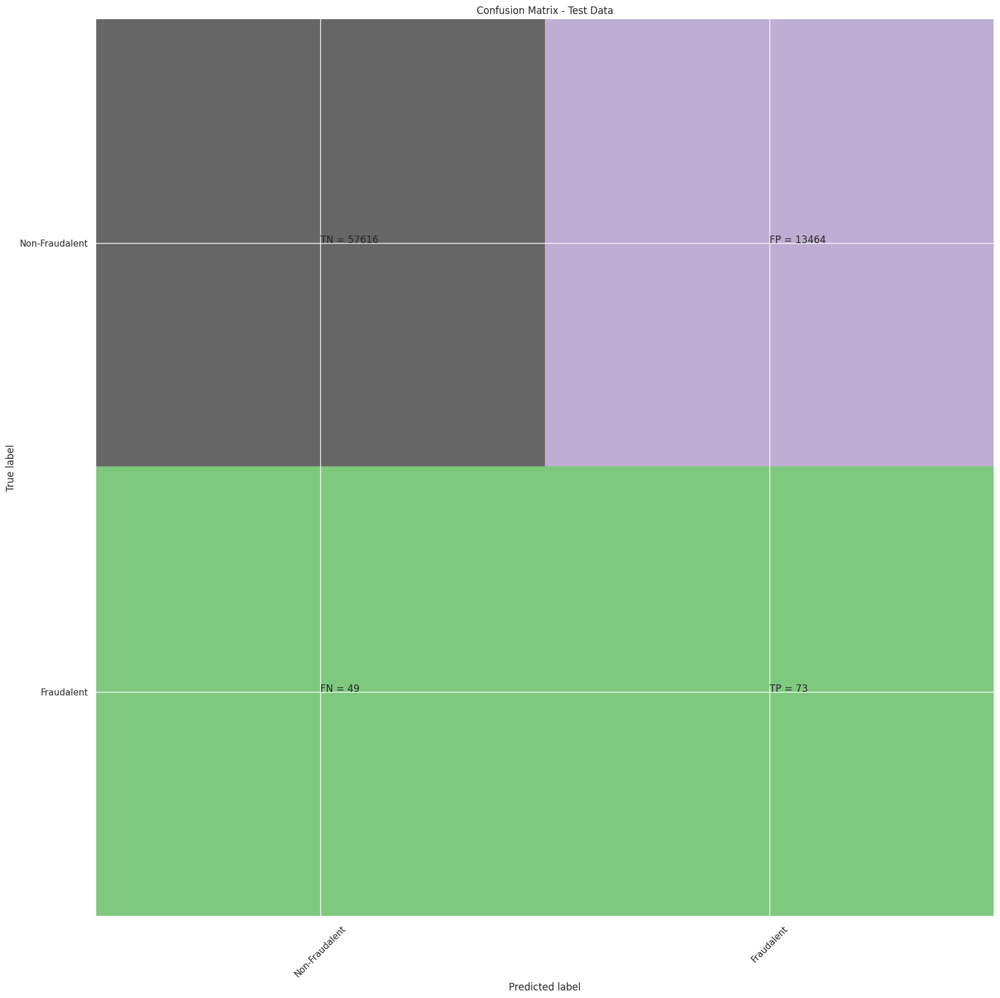

classification Report
              precision    recall  f1-score   support

           0       1.00      0.81      0.90     71080
           1       0.01      0.60      0.01       122

    accuracy                           0.81     71202
   macro avg       0.50      0.70      0.45     71202
weighted avg       1.00      0.81      0.89     71202

SVM roc_value: 0.7044085629676099
SVM threshold: 0.34492645247577236
ROC for the test dataset 70.4%


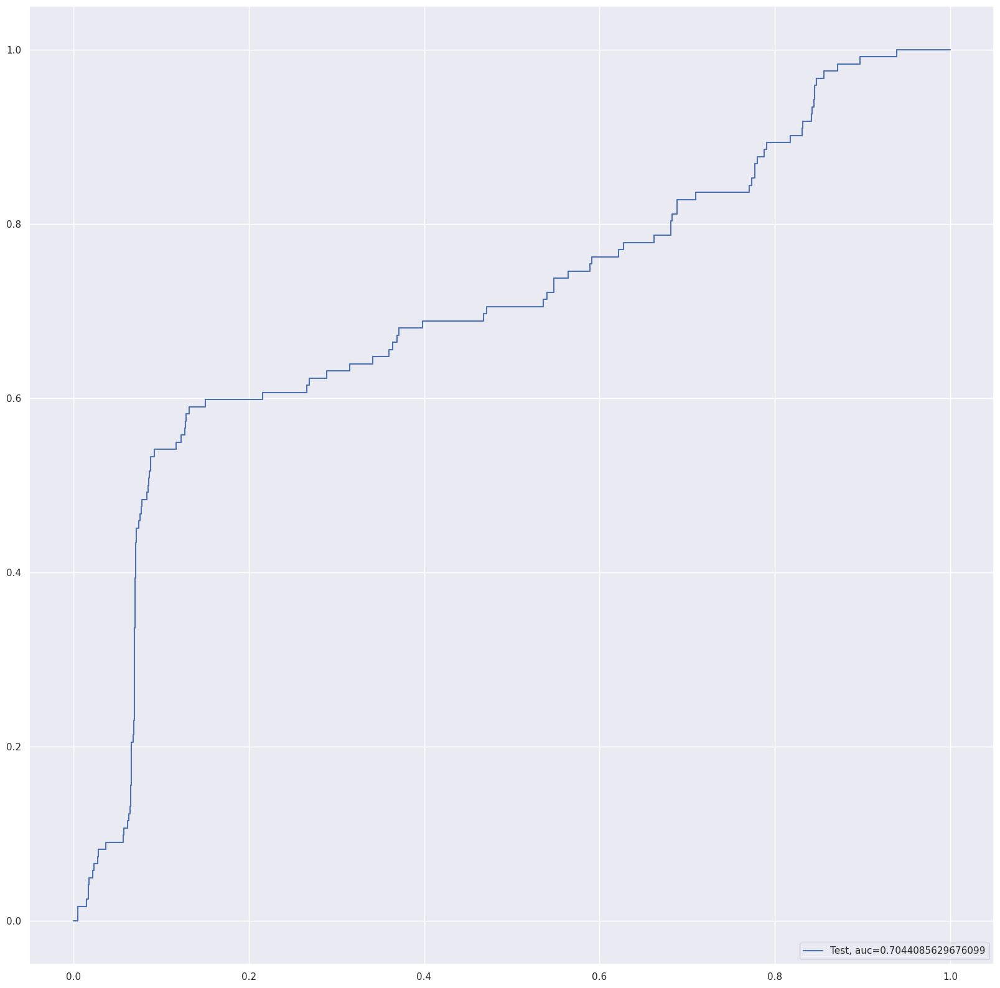

Time Taken by Model: --- 6.66006326675415 seconds ---
--------------------------------------------------------------------------------


In [ ]:
#Run SVM Model with Sigmoid Kernel
print("SVM Model with Sigmoid Kernel")
start_time = time.time()
df_Results = buildAndRunSVMModels(df_Results, "Random Undersampling",X_Under, y_Under , X_test, y_test)
print("Time Taken by Model: --- %s seconds ---" % (time.time() - start_time))
print('-'*80 )


KNN Model
model score
0.9692564815595067
Confusion Matrix


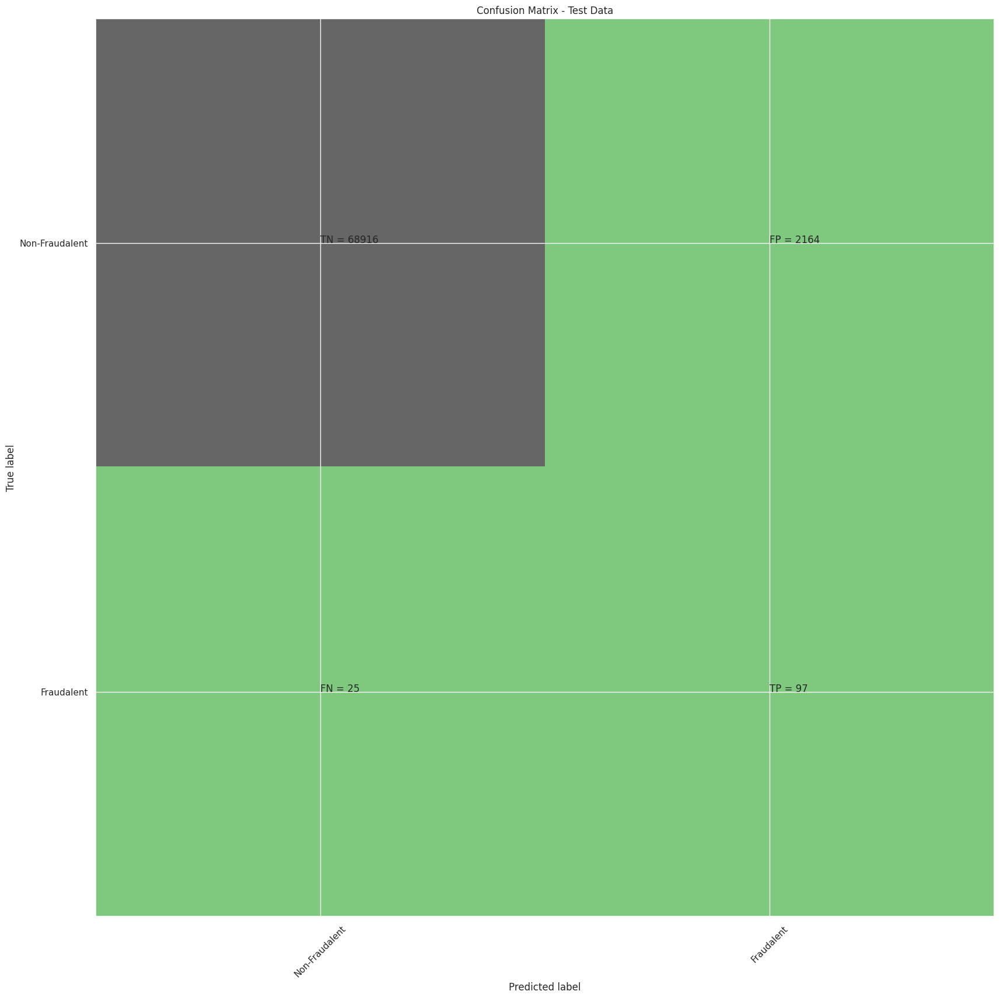

classification Report
              precision    recall  f1-score   support

           0       1.00      0.97      0.98     71080
           1       0.04      0.80      0.08       122

    accuracy                           0.97     71202
   macro avg       0.52      0.88      0.53     71202
weighted avg       1.00      0.97      0.98     71202

KNN roc_value: 0.9437899572866406
KNN threshold: 0.4
ROC for the test dataset 94.4%


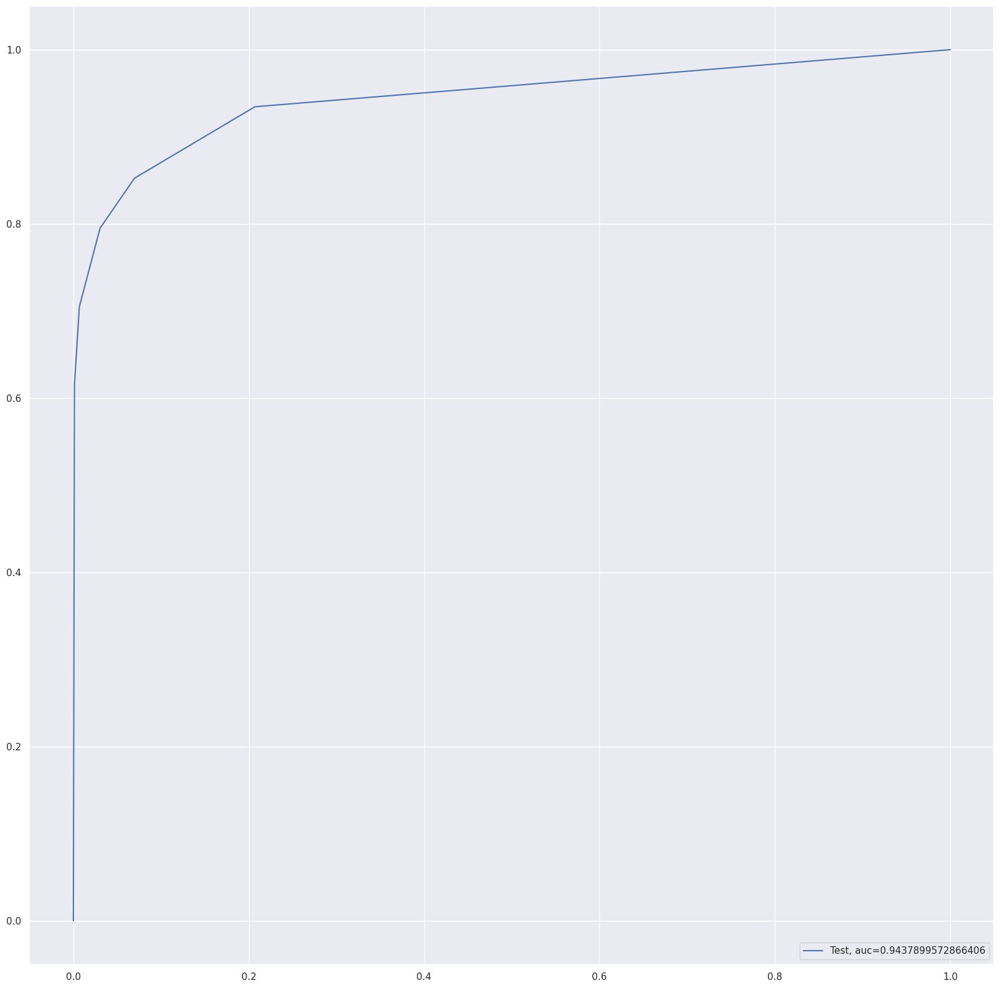

Time Taken by Model: --- 11.050777912139893 seconds ---
--------------------------------------------------------------------------------


In [ ]:
#Run KNN Model
print("KNN Model")
start_time = time.time()
df_Results = buildAndRunKNNModels(df_Results,"Random Undersampling",X_Under, y_Under , X_test, y_test)
print("Time Taken by Model: --- %s seconds ---" % (time.time() - start_time))
print('-'*80 )


In [ ]:
df_Results

,Data_Imbalance_Handiling,Model,Accuracy,roc_value,threshold,Data_Imbalance_Handling
0,NaN,Logistic Regression with L2 Regularisation,0.999073,0.967671,0.001259,Power Transformer
1,NaN,Logistic Regression with L1 Regularisation,0.999017,0.967101,0.004577,Power Transformer
2,Power Transformer,Tree Model with gini criteria,0.998876,0.884880,1.000000,NaN
3,Power Transformer,Tree Model with entropy criteria,0.999059,0.860424,1.000000,NaN
4,Power Transformer,Random Forest,0.999354,0.932552,0.020000,NaN
5,Power Transformer,XGBoost,0.999480,0.980627,0.000025,NaN
6,Power Transformer,SVM,0.998441,0.876366,0.001667,NaN
7,Power Transformer,KNN,0.999228,0.909664,0.200000,NaN
8,NaN,Logistic Regression with L2 Regularisation,0.999052,0.982696,0.003110,RepeatedKFold Cross Validation
9,NaN,Logistic Regression with L1 Regularisation,0.999140,0.894494,0.047180,RepeatedKFold Cross Validation


**Undersampling has impoved the XGBoost Results**

Perform Oversampling with RandomOverSampler and StratifiedKFold Cross Validation

- We will display class distibution with and without the Random Oversampling. Then, use the oversampled with StratifiedKFold cross validation method to genearte Train And test datasets

- After we have train and test dataset we will feed the data to below models:
1. Logistic Regression with L2 Regularisation
2. Logistic Regression with L1 Regularisation
3. Decision tree model with Gini criteria
4. Decision tree model with Entropy criteria
5. Random Forest
6. XGBoost
7. KNN

- Once we have results for above models, we will compare the results and select model which provided best results for the Random oversampling

In [ ]:
"""
from imblearn.over_sampling import RandomOverSampler
#Define Oversampler
ROS = RandomOverSampler(sampling_strategy=0.5)
# fit and apply the transform
X_over, y_over = ROS.fit_resample(X_train, y_train)
"""

'\nfrom imblearn.over_sampling import RandomOverSampler\n#Define Oversampler\nROS = RandomOverSampler(sampling_strategy=0.5)\n# fit and apply the transform\nX_over, y_over = ROS.fit_resample(X_train, y_train)\n'

In [ ]:
from sklearn.model_selection import StratifiedKFold
from imblearn.over_sampling import RandomOverSampler


skf = StratifiedKFold(n_splits=5, random_state=None)

for fold, (train_index, test_index) in enumerate(skf.split(X,y), 1):
    X_train = X.loc[train_index]
    y_train = y.loc[train_index]
    X_test = X.loc[test_index]
    y_test = y.loc[test_index]
    ROS = RandomOverSampler(sampling_strategy=0.5)
    X_over, y_over= ROS.fit_resample(X_train, y_train)

#Creating Dataframe for X_over
X_over = pd.DataFrame(data=X_over,   columns=columns_list)

Logistic Regression with L1 And L2 Regularisation
Max auc_roc for l2: 0.9865223327311596
Max auc_roc for l1: 0.5
Parameters for l2 regularisations
[[ 0.38110831  0.40053403  0.27763106  0.83544307  0.35641013 -0.49086447
  -0.36066011 -0.33389772 -0.2290666  -0.65928003  0.29677101 -0.9029278
  -0.30589273 -0.90791557  0.01904908 -0.50630392 -0.28633832 -0.15551426
   0.15508124 -0.71966321  0.07332445  0.53674917  0.12434457 -0.43192495
   0.22363615 -0.07345818 -0.37076458  0.19475305  0.00565932  0.03824332]]
[-5.12040402]
{1: array([[0.6284304 , 0.75806722, 0.90502774, 0.95369554, 0.97496978,
        0.98316044, 0.98480736, 0.98551978, 0.98583213, 0.98594903,
        0.98596235, 0.98596235, 0.98596235, 0.98596235, 0.98596235,
        0.98596235, 0.98596235, 0.98596235, 0.98596235, 0.98596235],
       [0.62996732, 0.75725664, 0.90496493, 0.95518219, 0.97601677,
        0.98388364, 0.98542289, 0.98589826, 0.98625329, 0.9863795 ,
        0.9863795 , 0.9863795 , 0.9863795 , 0.9863795 ,

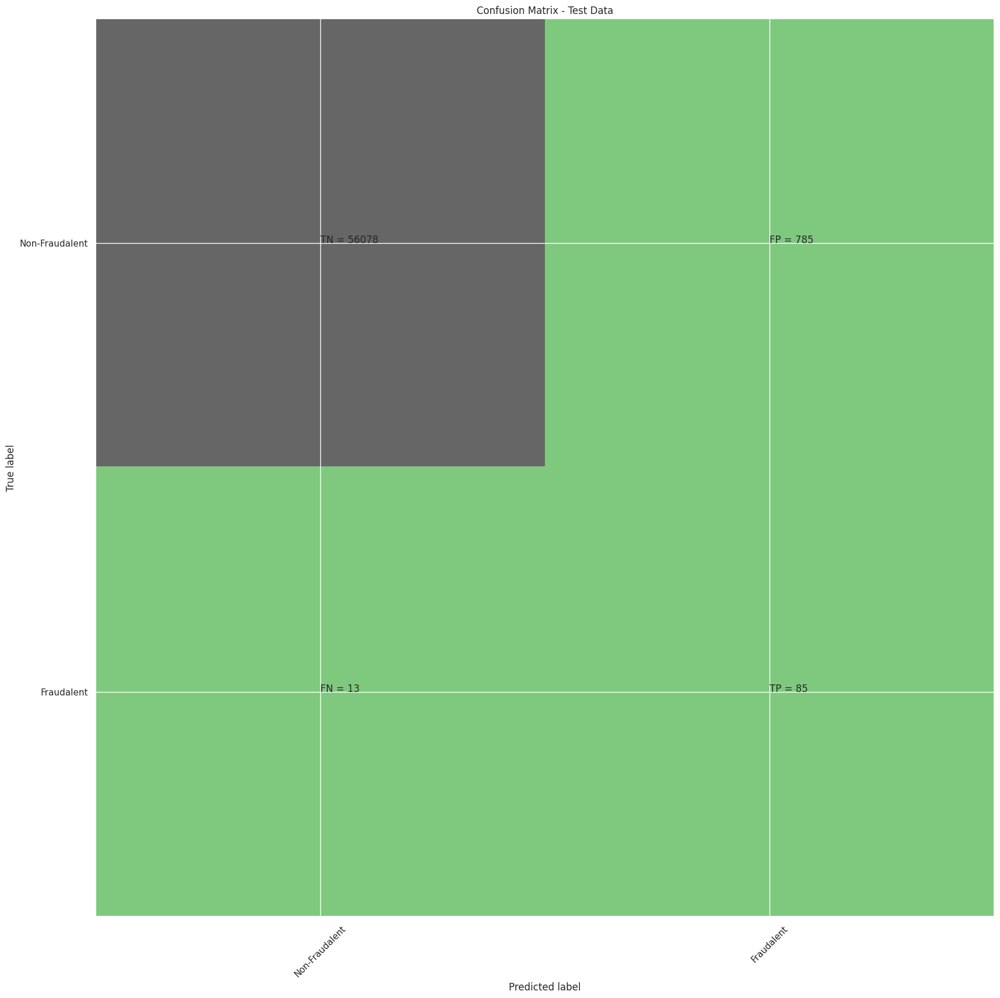

classification Report
              precision    recall  f1-score   support

           0       1.00      0.99      0.99     56863
           1       0.10      0.87      0.18        98

    accuracy                           0.99     56961
   macro avg       0.55      0.93      0.58     56961
weighted avg       1.00      0.99      0.99     56961

Accuarcy of Logistic model with l1 regularisation : 0.9982795245869981
Confusion Matrix


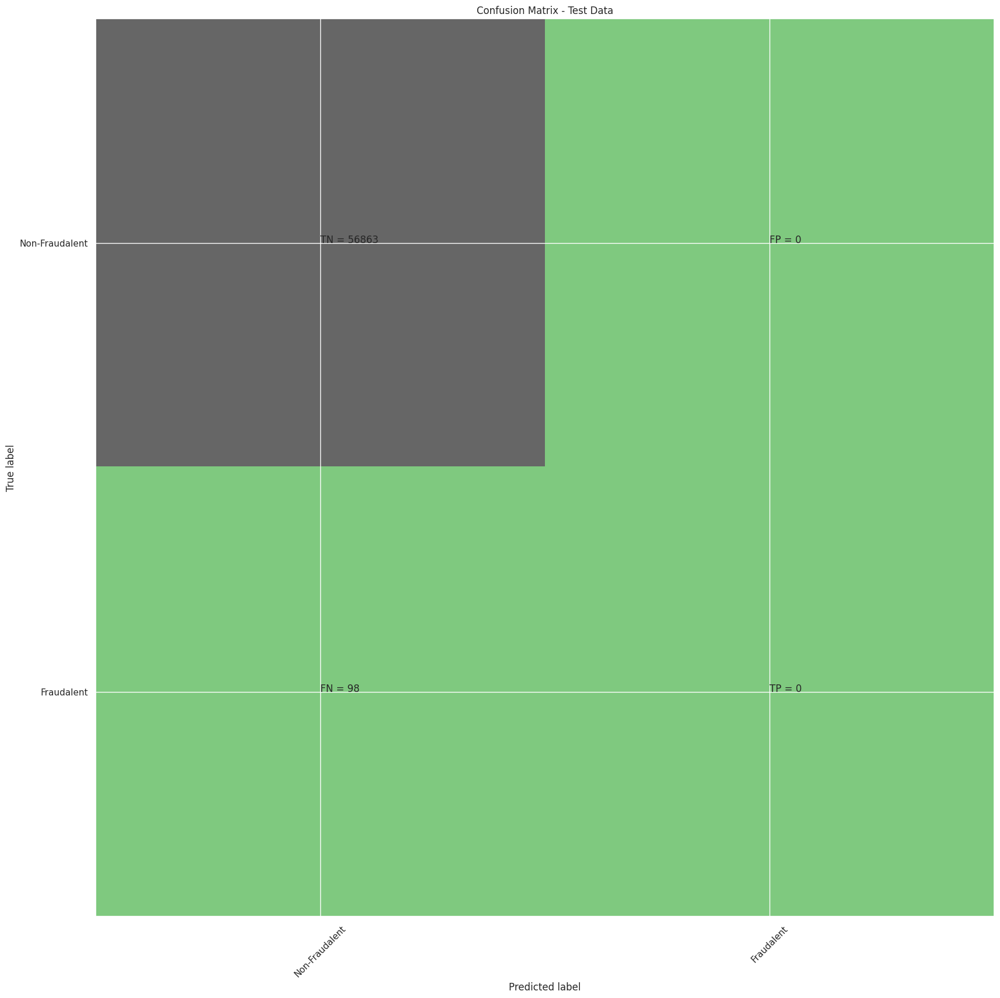

classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56863
           1       0.00      0.00      0.00        98

    accuracy                           1.00     56961
   macro avg       0.50      0.50      0.50     56961
weighted avg       1.00      1.00      1.00     56961

l2 roc_value: 0.980771004566292
l2 threshold: 0.3247531717223233
ROC for the test dataset 98.1%


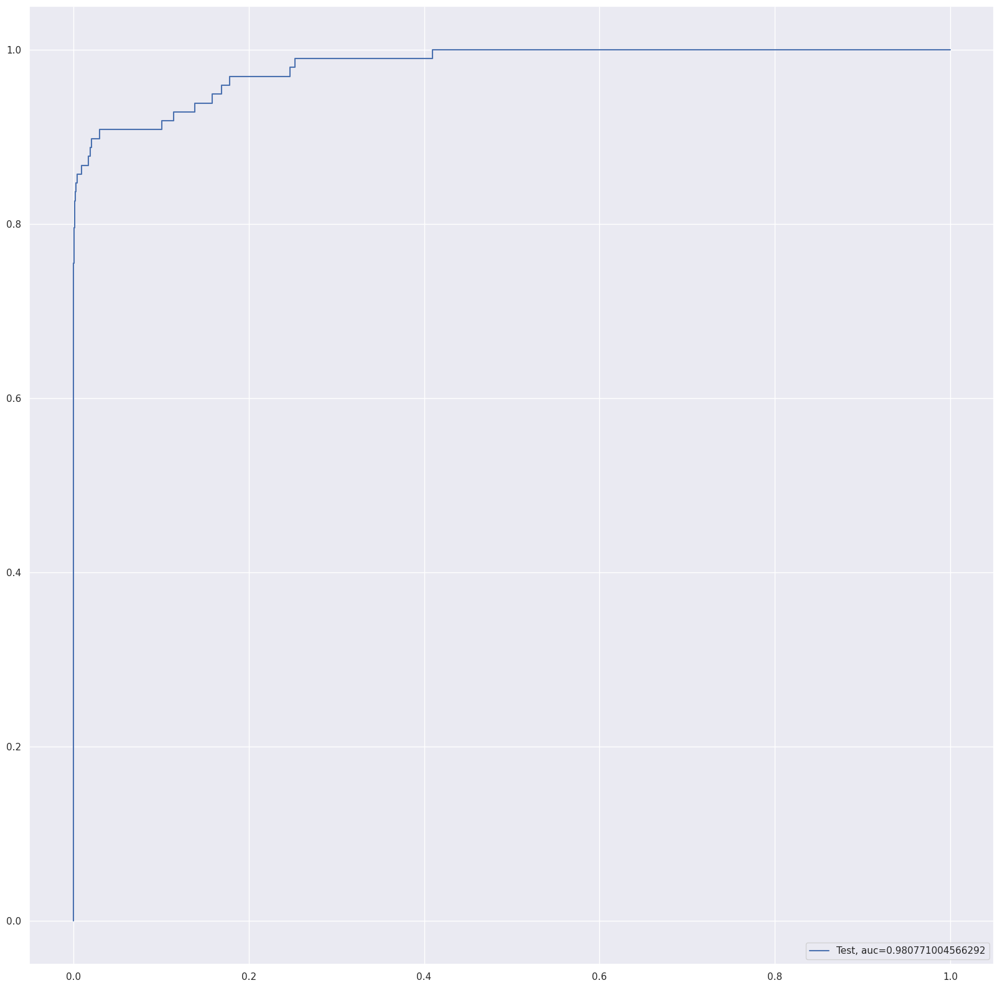

l1 roc_value: 0.5
l1 threshold: 1.5
ROC for the test dataset 50.0%


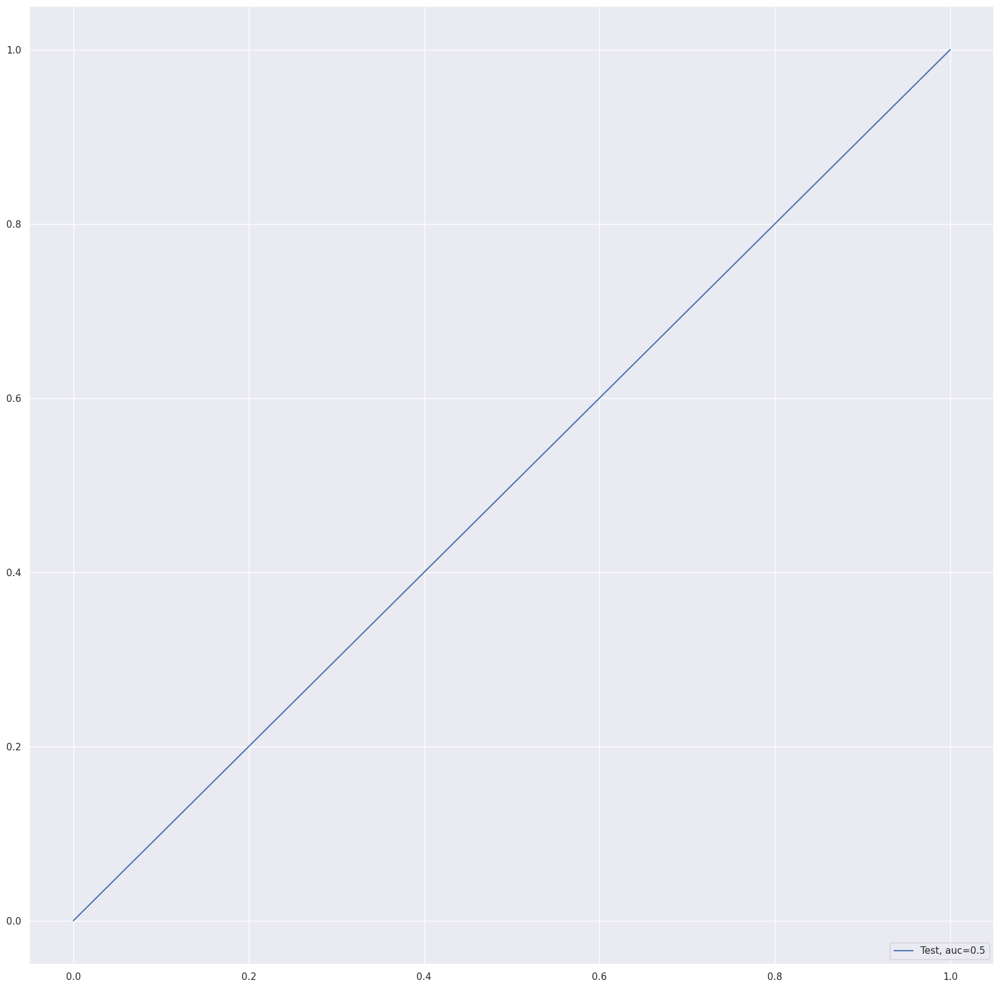

Time Taken by Model: --- 517.1527292728424 seconds ---
--------------------------------------------------------------------------------


In [ ]:
Data_Imbalance_Handiling	 = "Random Oversampling with StratifiedKFold CV "

#Run Logistic Regression with L1 And L2 Regularisation
print("Logistic Regression with L1 And L2 Regularisation")
start_time = time.time()
df_Results = buildAndRunLogisticModels(df_Results , Data_Imbalance_Handiling , X_over, y_over, X_test, y_test)
print("Time Taken by Model: --- %s seconds ---" % (time.time() - start_time))
print('-'*80 )


Decision Tree Models with  'gini' & 'entropy' criteria
gini score: 0.9991222064219378
Confusion Matrix


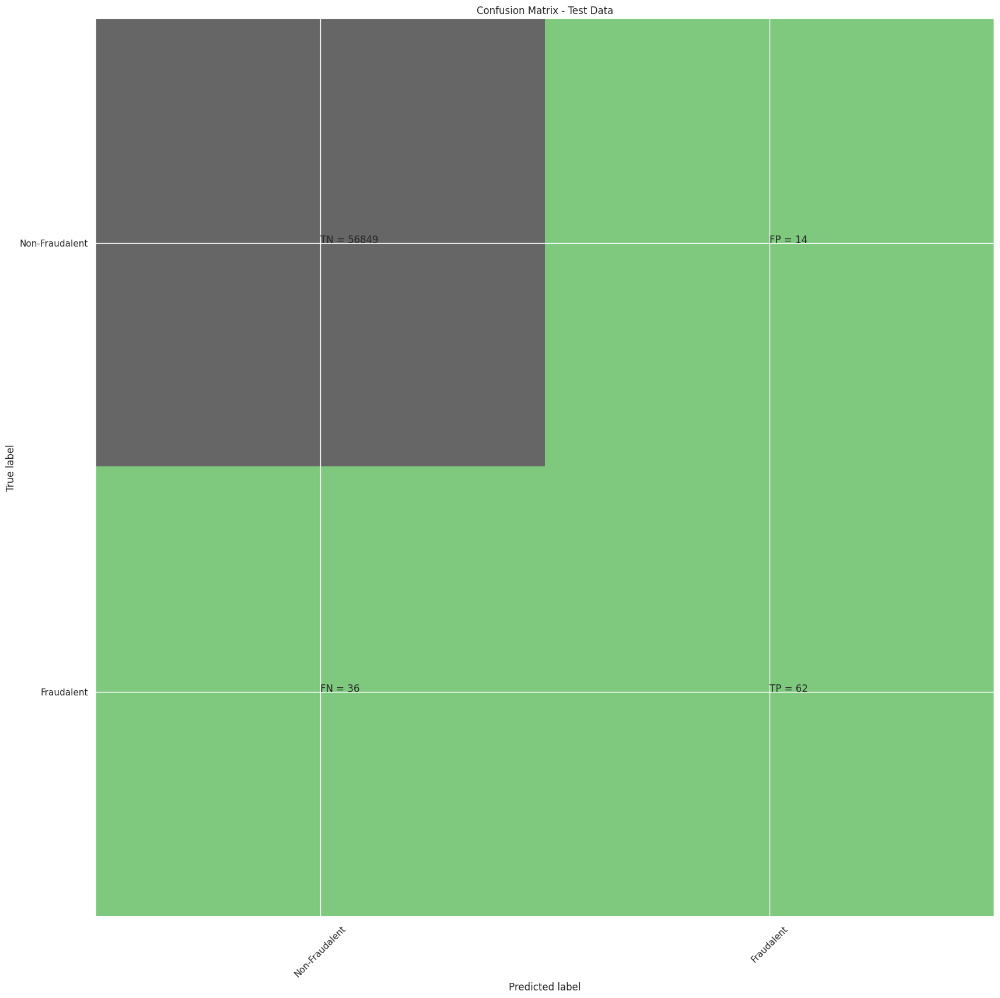

classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56863
           1       0.82      0.63      0.71        98

    accuracy                           1.00     56961
   macro avg       0.91      0.82      0.86     56961
weighted avg       1.00      1.00      1.00     56961

gini tree_roc_value: 0.8162034277158096
Tree threshold: 1.0
ROC for the test dataset 81.6%


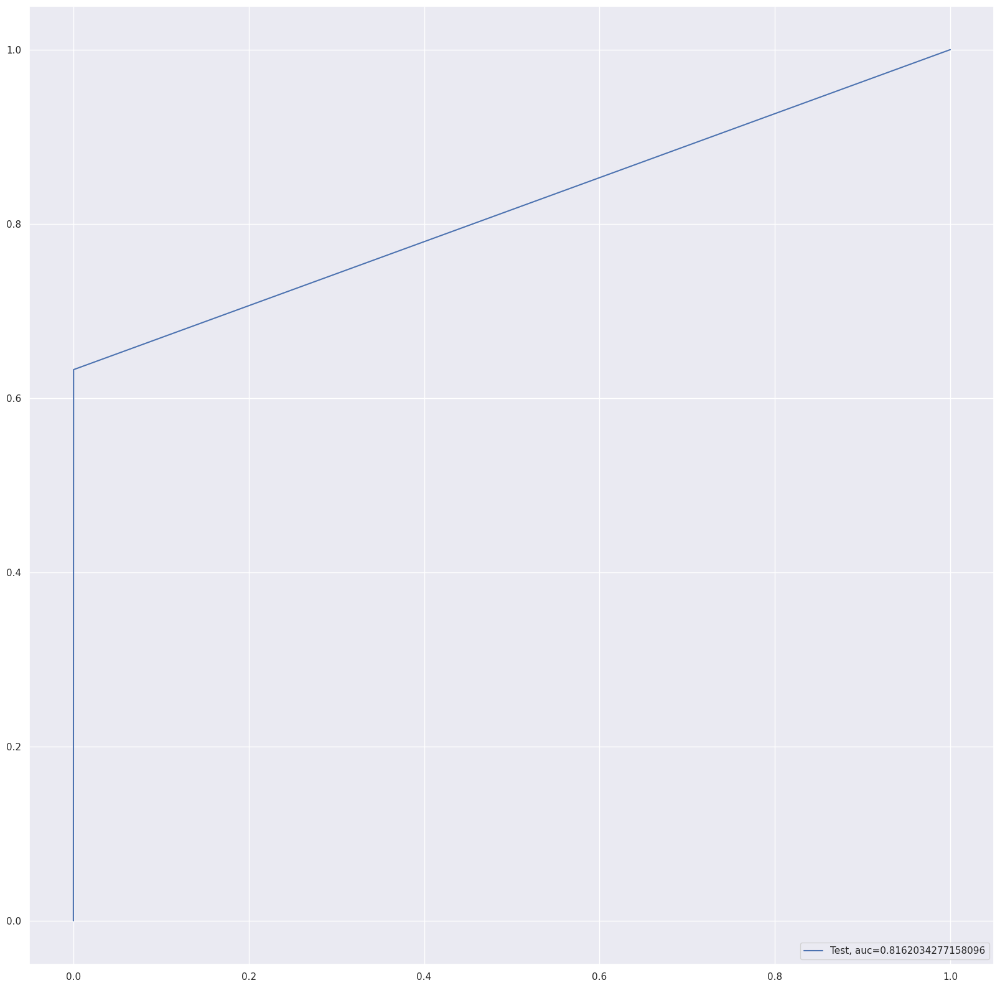

entropy score: 0.9990695388072541
Confusion Matrix


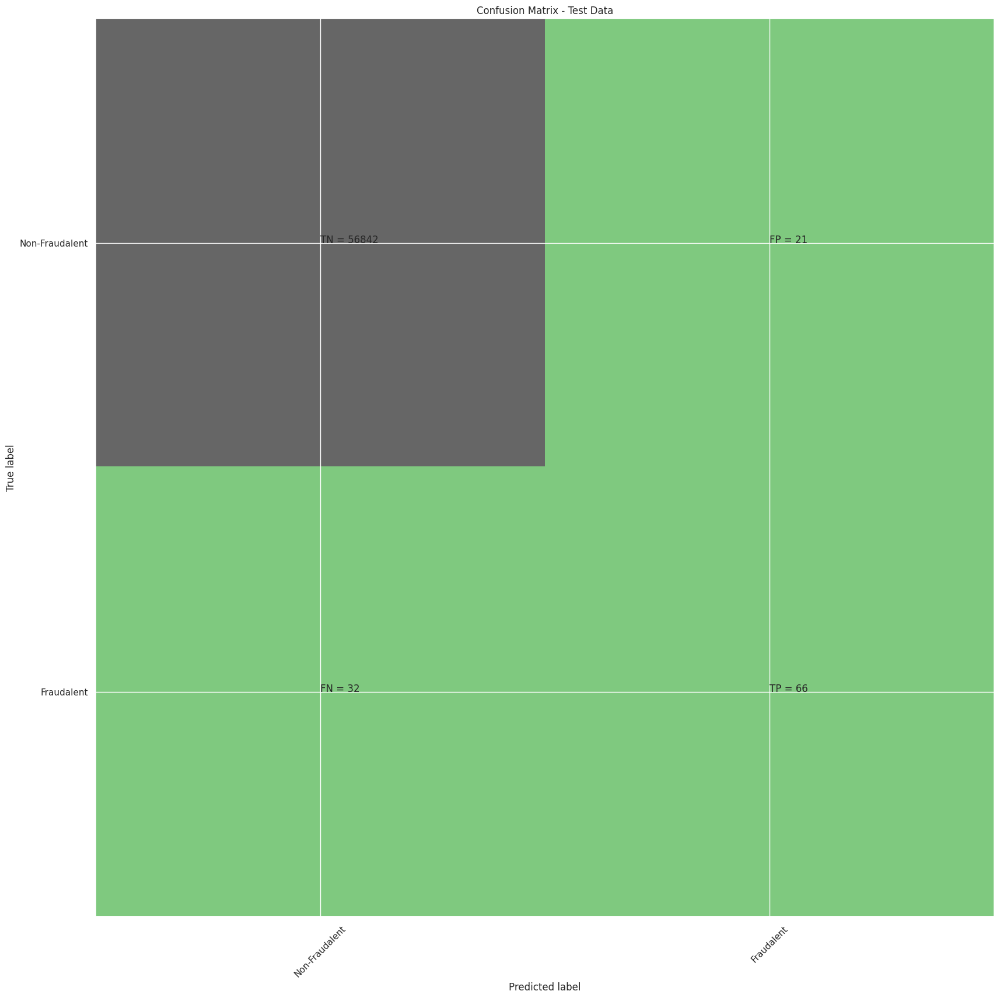

classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56863
           1       0.76      0.67      0.71        98

    accuracy                           1.00     56961
   macro avg       0.88      0.84      0.86     56961
weighted avg       1.00      1.00      1.00     56961

entropy tree_roc_value: 0.8365500395328982
Tree threshold: 1.0
ROC for the test dataset 83.7%


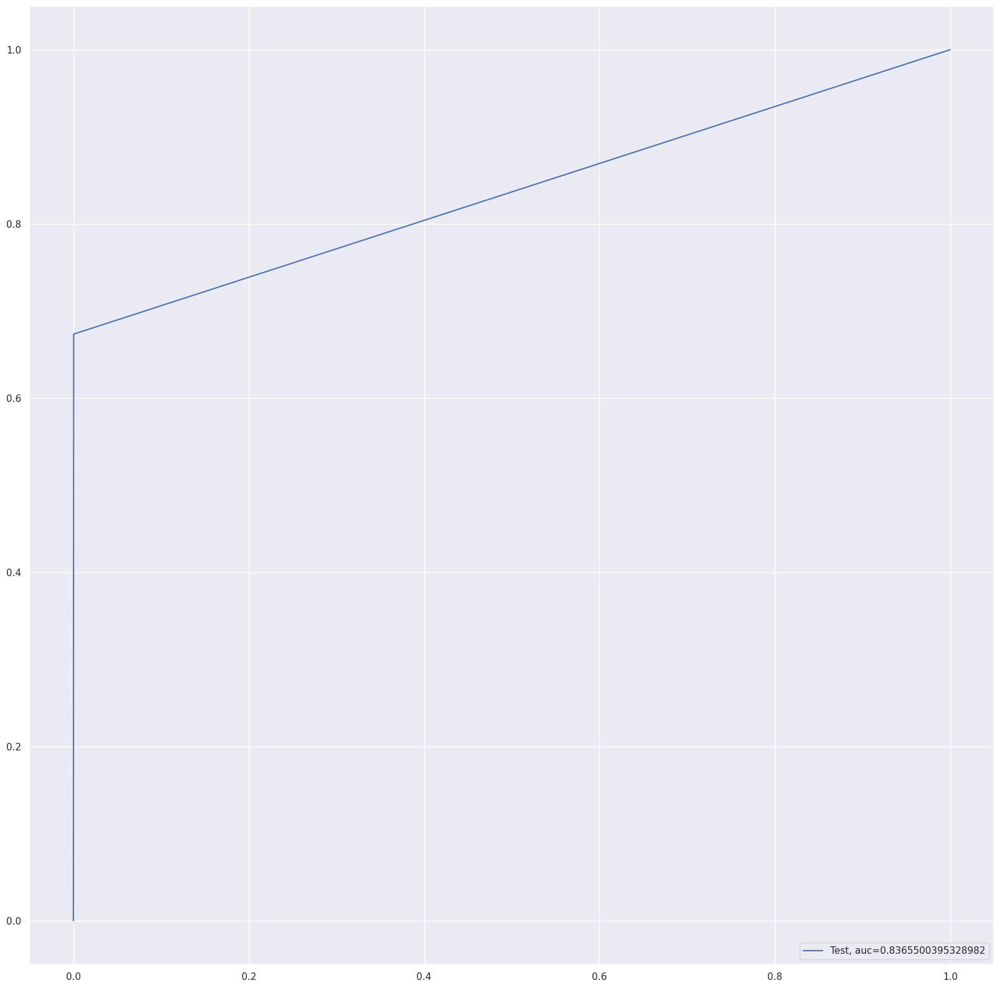

Time Taken by Model: --- 31.17864727973938 seconds ---
--------------------------------------------------------------------------------


In [ ]:
#Run Decision Tree Models with  'gini' & 'entropy' criteria
print("Decision Tree Models with  'gini' & 'entropy' criteria")
start_time = time.time()
df_Results = buildAndRunTreeModels(df_Results , Data_Imbalance_Handiling,X_over, y_over, X_test, y_test)
print("Time Taken by Model: --- %s seconds ---" % (time.time() - start_time))
print('-'*80 )


Random Forest Model
Model Accuracy: 0.9995084355962852
Confusion Matrix


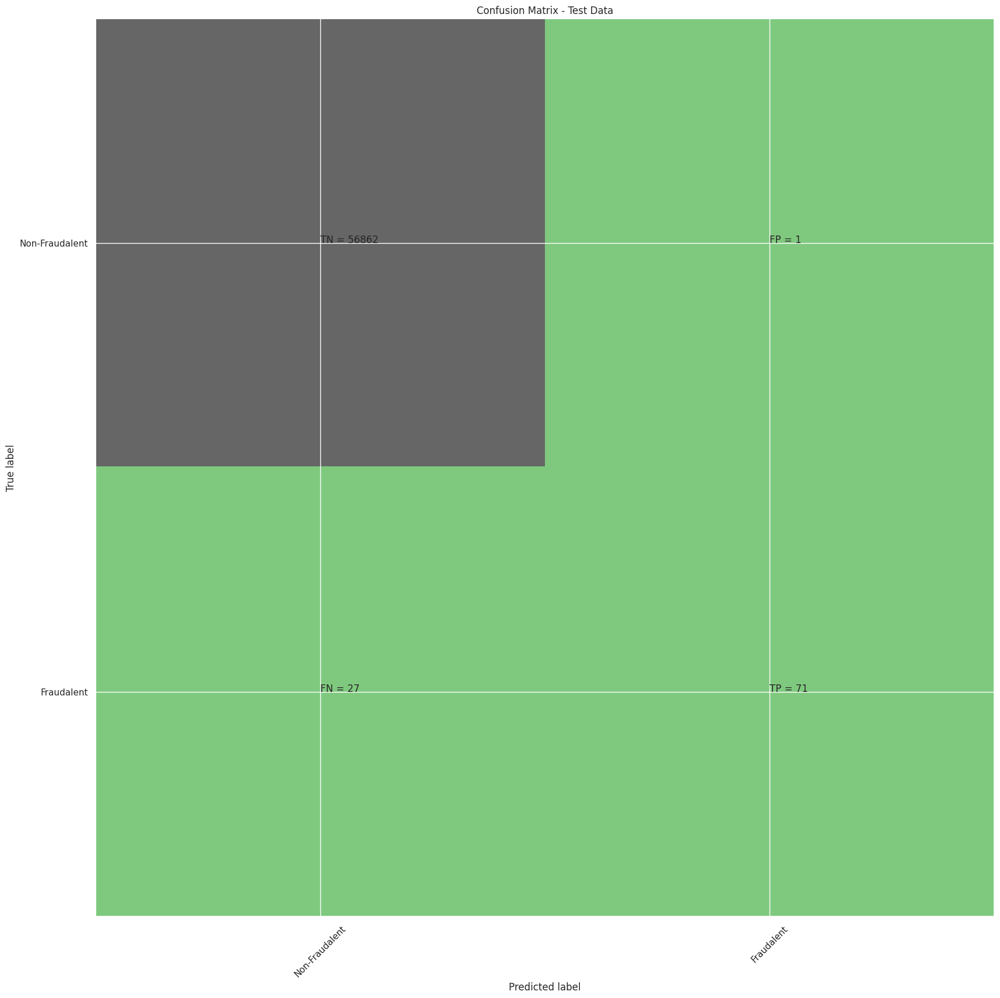

classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56863
           1       0.99      0.72      0.84        98

    accuracy                           1.00     56961
   macro avg       0.99      0.86      0.92     56961
weighted avg       1.00      1.00      1.00     56961

Random Forest roc_value: 0.9355744759961913
Random Forest threshold: 0.03
ROC for the test dataset 93.6%


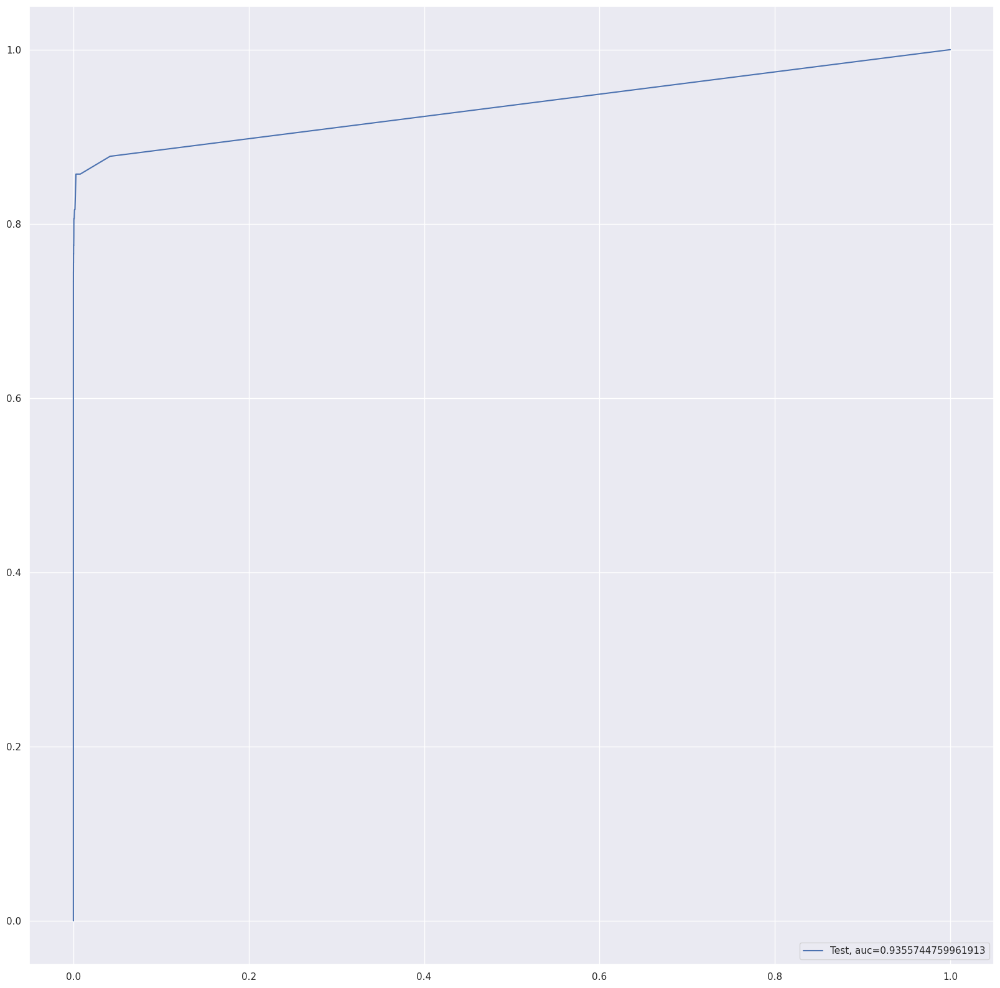

Time Taken by Model: --- 214.78488039970398 seconds ---
--------------------------------------------------------------------------------


In [ ]:
#Run Random Forest Model
print("Random Forest Model")
start_time = time.time()
df_Results = buildAndRunRandomForestModels(df_Results , Data_Imbalance_Handiling,X_over, y_over, X_test, y_test)
print("Time Taken by Model: --- %s seconds ---" % (time.time() - start_time))
print('-'*80 )


XGBoost Model
Model Accuracy: 0.9995084355962852
Confusion Matrix


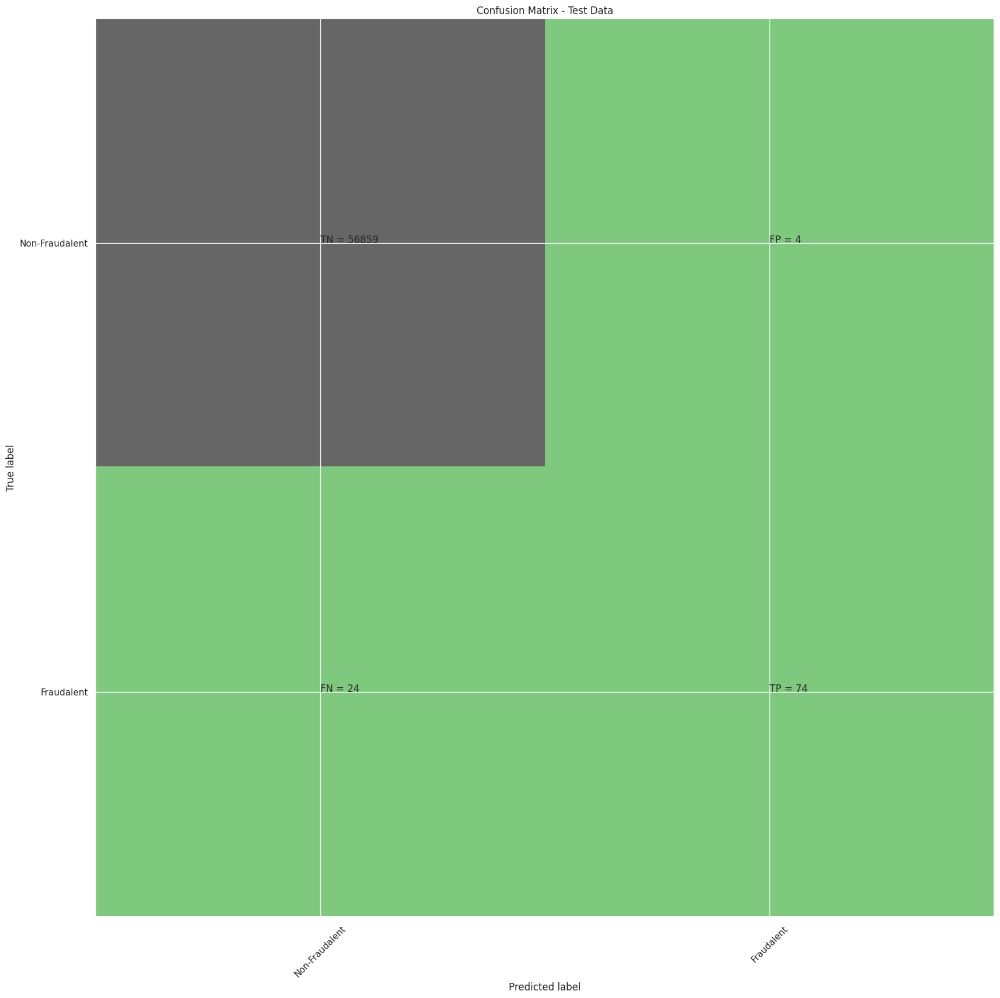

classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56863
           1       0.95      0.76      0.84        98

    accuracy                           1.00     56961
   macro avg       0.97      0.88      0.92     56961
weighted avg       1.00      1.00      1.00     56961

XGboost roc_value: 0.9839356103660535
XGBoost threshold: 2.9788448955514468e-05
ROC for the test dataset 98.4%


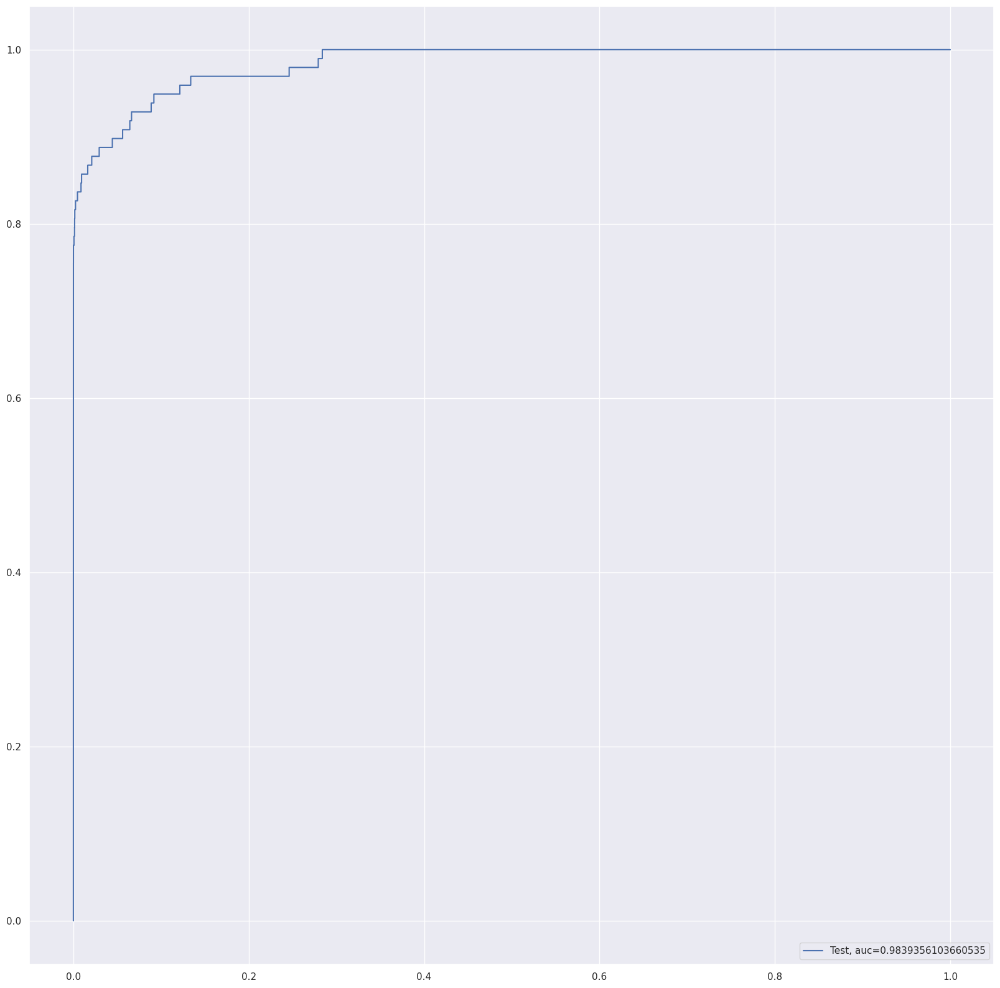

Time Taken by Model: --- 7.816895008087158 seconds ---
--------------------------------------------------------------------------------


In [ ]:
#Run XGBoost Model
print("XGBoost Model")
start_time = time.time()
df_Results = buildAndRunXGBoostModels(df_Results , Data_Imbalance_Handiling,X_over, y_over, X_test, y_test)
print("Time Taken by Model: --- %s seconds ---" % (time.time() - start_time))
print('-'*80 )


KNN Model
model score
0.9980688541282632
Confusion Matrix


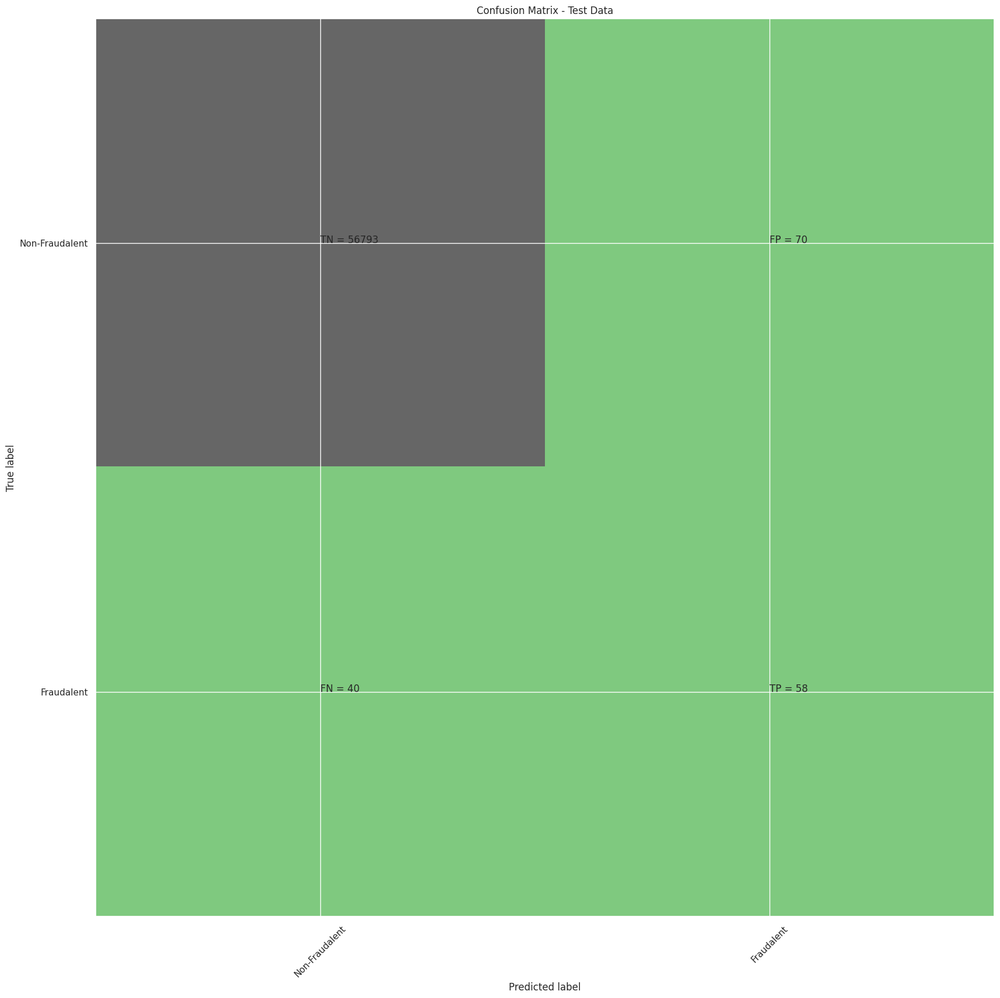

classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56863
           1       0.45      0.59      0.51        98

    accuracy                           1.00     56961
   macro avg       0.73      0.80      0.76     56961
weighted avg       1.00      1.00      1.00     56961

KNN roc_value: 0.805604465728046
KNN threshold: 0.2
ROC for the test dataset 80.6%


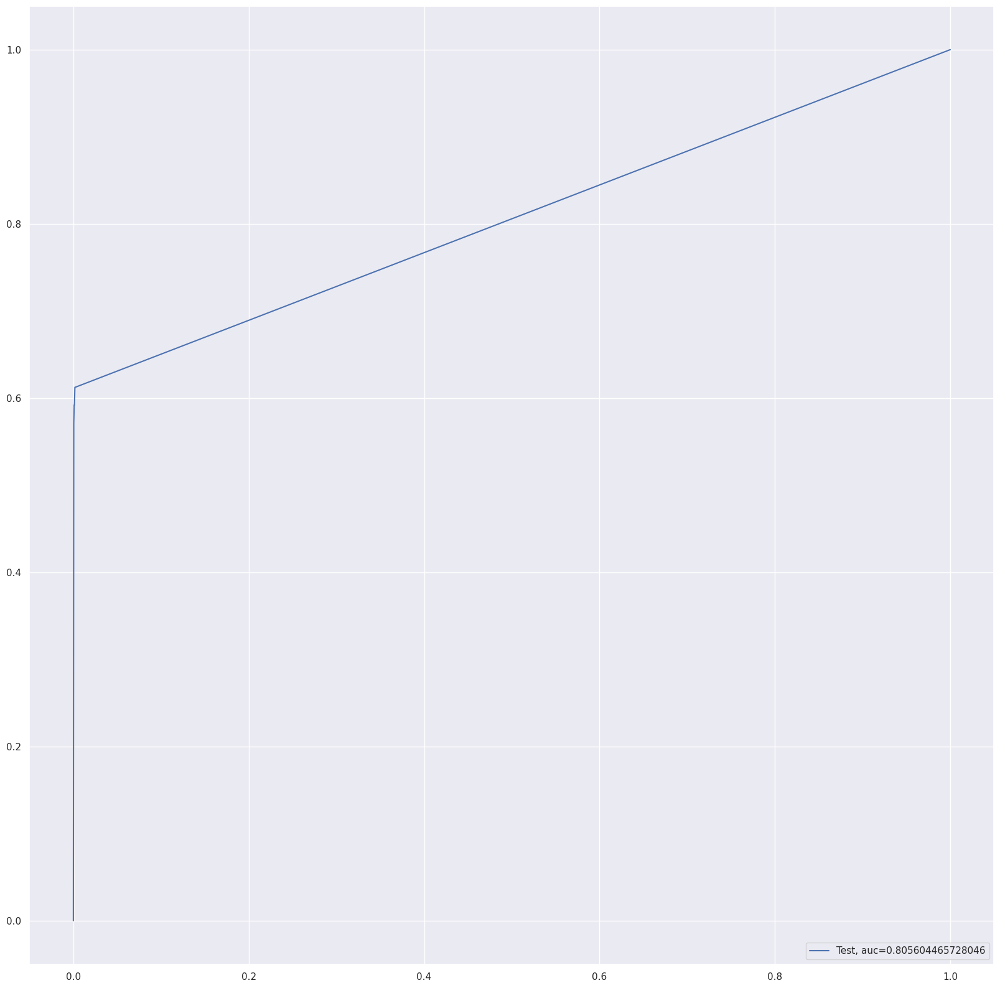

Time Taken by Model: --- 359.60248041152954 seconds ---
--------------------------------------------------------------------------------


In [ ]:
#Run KNN Model
print("KNN Model")
start_time = time.time()
df_Results = buildAndRunKNNModels(df_Results , Data_Imbalance_Handiling,X_over, y_over, X_test, y_test)
print("Time Taken by Model: --- %s seconds ---" % (time.time() - start_time))
print('-'*80 )


In [ ]:
df_Results

,Data_Imbalance_Handiling,Model,Accuracy,roc_value,threshold,Data_Imbalance_Handling
0,NaN,Logistic Regression with L2 Regularisation,0.999073,0.967671,0.001259,Power Transformer
1,NaN,Logistic Regression with L1 Regularisation,0.999017,0.967101,0.004577,Power Transformer
2,Power Transformer,Tree Model with gini criteria,0.998876,0.884880,1.000000,NaN
3,Power Transformer,Tree Model with entropy criteria,0.999059,0.860424,1.000000,NaN
4,Power Transformer,Random Forest,0.999354,0.932552,0.020000,NaN
5,Power Transformer,XGBoost,0.999480,0.980627,0.000025,NaN
6,Power Transformer,SVM,0.998441,0.876366,0.001667,NaN
7,Power Transformer,KNN,0.999228,0.909664,0.200000,NaN
8,NaN,Logistic Regression with L2 Regularisation,0.999052,0.982696,0.003110,RepeatedKFold Cross Validation
9,NaN,Logistic Regression with L1 Regularisation,0.999140,0.894494,0.047180,RepeatedKFold Cross Validation


**Random Oversampling have +ve change in prediction for XGBoost Looking at Accuracy and ROC value we have XGBoost which has provided best results for SMOTE oversampling**

### Perform Oversampling with SMOTE

- We will use SMOTE Oversampling method to handle the class imbalance. Then, display class distibution with and without the SMOTE.

- Then We will use the oversampled with StratifiedKFold cross validation method to genearte Train And test datasets and feed the data to below models:

1. Logistic Regression with L2 Regularisation
2. Logistic Regression with L1 Regularisation
3. Decision tree model with Gini criteria
4. Decision tree model with Entropy criteria
5. Random Forest
6. XGBoost
7. KNN


- We have already tried SVM (support vector Machine) model , but due to extensive processiing we will avoide it.

- After we get results for above model, we will compare the results and select model which provided best results for the SMOTE oversampling

In [ ]:
import warnings
warnings.filterwarnings("ignore")

from imblearn import over_sampling
SMOTE = over_sampling.SMOTE(random_state=0)

X_train_Smote, y_train_Smote= SMOTE.fit_resample(X_train, y_train)

#Creating dataframe
X_train_smote_1 = X_train_Smote[X_train.shape[0]:]

X_train_1 = X_train.to_numpy()[np.where(y_train==1.0)]
X_train_0 = X_train.to_numpy()[np.where(y_train==0.0)]


In [ ]:
print(X_train_1.shape)  # Should be (n_samples, n_features)
print(X_train_smote_1.shape)  # Should be (n_samples_smote, n_features)
print(X_train_0.shape)  # Should be (n_samples_class0, n_features)


(394, 30)
(227058, 30)
(227452, 30)


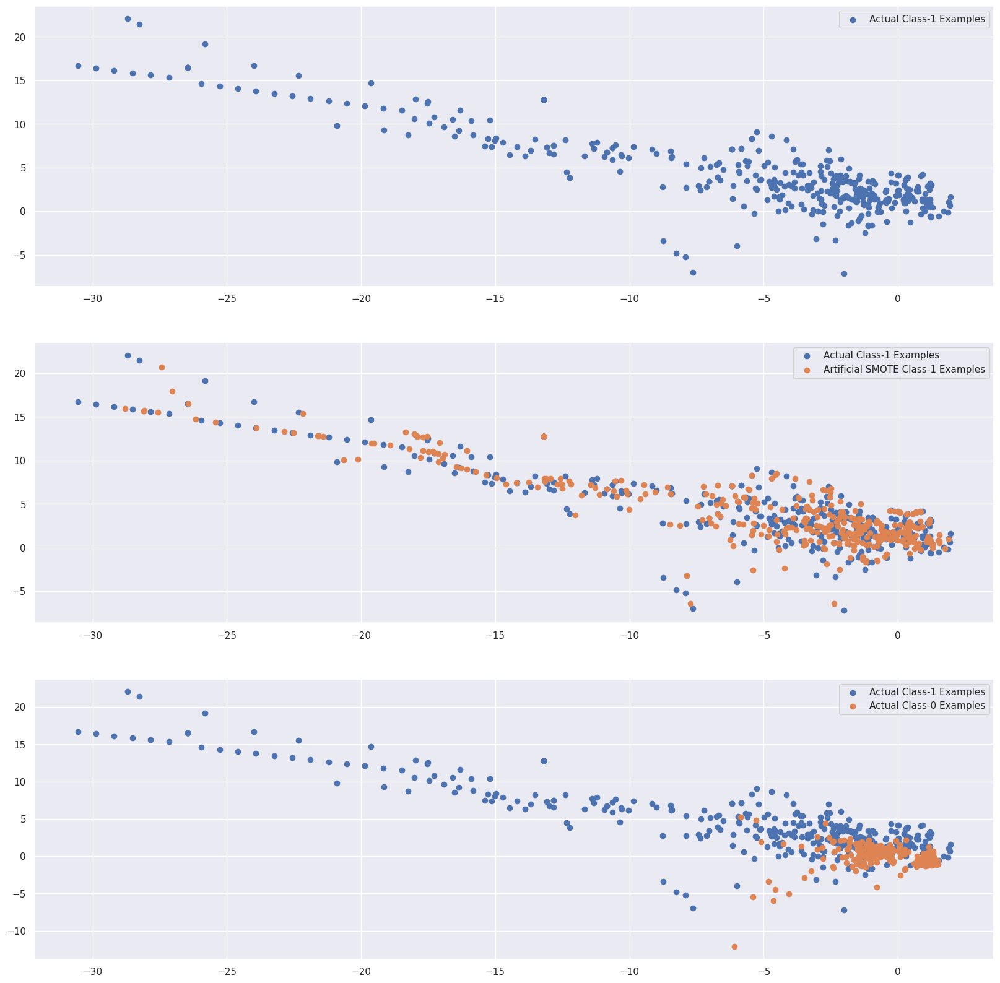

In [ ]:
plt.rcParams['figure.figsize'] = [20, 20]
fig = plt.figure()

plt.subplot(3, 1, 1)
plt.scatter(X_train_1[:, 0], X_train_1[:, 1], label='Actual Class-1 Examples')
plt.legend()

plt.subplot(3, 1, 2)
plt.scatter(X_train_1[:, 0], X_train_1[:, 1], label='Actual Class-1 Examples')
plt.scatter(X_train_smote_1.iloc[:X_train_1.shape[0], 0], X_train_smote_1.iloc[:X_train_1.shape[0], 1], label='Artificial SMOTE Class-1 Examples')
plt.legend()

plt.subplot(3, 1, 3)
plt.scatter(X_train_1[:, 0], X_train_1[:, 1], label='Actual Class-1 Examples')
plt.scatter(X_train_0[:X_train_1.shape[0], 0], X_train_0[:X_train_1.shape[0], 1], label='Actual Class-0 Examples')
plt.legend()

plt.show()


In [ ]:
#Creating dataframe
X_train_Smote = pd.DataFrame(data=X_train_Smote,   columns=columns_list)

In [ ]:
from sklearn.model_selection import StratifiedKFold
from imblearn import over_sampling

skf = StratifiedKFold(n_splits=5, random_state=None)

for fold, (train_index, test_index) in enumerate(skf.split(X,y), 1):
    X_train = X.loc[train_index]
    y_train = y.loc[train_index]
    X_test = X.loc[test_index]
    y_test = y.loc[test_index]
    SMOTE = over_sampling.SMOTE(random_state=0)
    X_train_Smote, y_train_Smote= SMOTE.fit_resample(X_train, y_train)


In [ ]:
#Creating Dataframe for X_over
X_train_Smote = pd.DataFrame(data=X_train_Smote,   columns=columns_list)

In [ ]:
Data_Imbalance_Handiling	 = "SMOTE Oversampling with StratifiedKFold CV "


Logistic Regression with L1 And L2 Regularisation
Max auc_roc for l2: 0.9930151908600335
Max auc_roc for l1: 0.5
Parameters for l2 regularisations
[[ 0.77250717  0.70922917  0.68870062  0.9386533   0.49654908 -0.93763709
  -0.69646179 -0.50711057 -0.4230197  -0.92054632  0.61728754 -1.25021754
  -0.23816749 -1.52802351  0.12539892 -0.78227643 -0.84372509 -0.43395297
   0.22142958 -1.08326073 -0.02347838  0.56559111  0.40484273 -0.91729951
   0.50599915  0.03415568 -0.1810893   0.84940107  0.00903448  0.01105878]]
[-5.30100402]
{1: array([[0.64927751, 0.78559745, 0.91748425, 0.96520455, 0.98466299,
        0.98956394, 0.99069921, 0.99160614, 0.99195638, 0.99205489,
        0.99207139, 0.99207139, 0.99207139, 0.99207139, 0.99207139,
        0.99207139, 0.99207139, 0.99207139, 0.99207139, 0.99207139],
       [0.6460276 , 0.7845671 , 0.91904908, 0.96766049, 0.98636753,
        0.99079354, 0.99182711, 0.99273092, 0.99311457, 0.99320849,
        0.99322173, 0.99322173, 0.99322173, 0.99322173

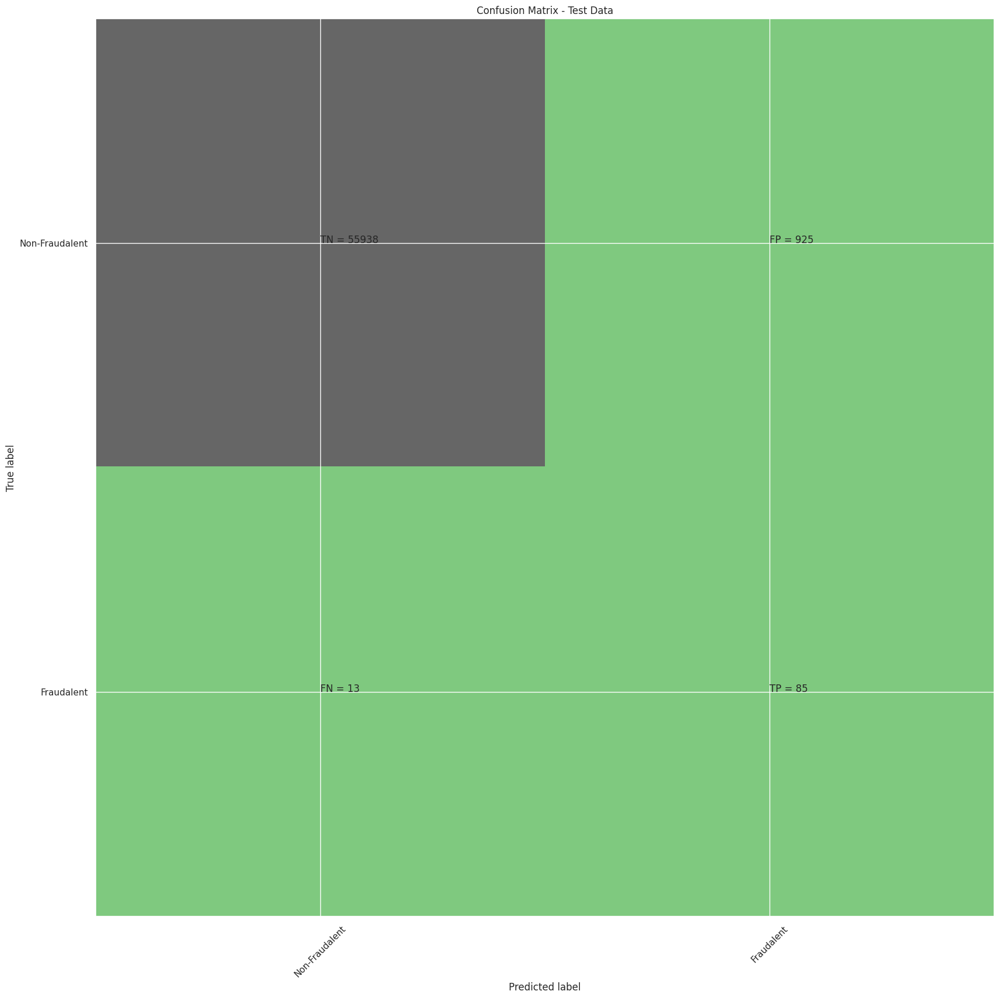

classification Report
              precision    recall  f1-score   support

           0       1.00      0.98      0.99     56863
           1       0.08      0.87      0.15        98

    accuracy                           0.98     56961
   macro avg       0.54      0.93      0.57     56961
weighted avg       1.00      0.98      0.99     56961

Accuarcy of Logistic model with l1 regularisation : 0.9982795245869981
Confusion Matrix


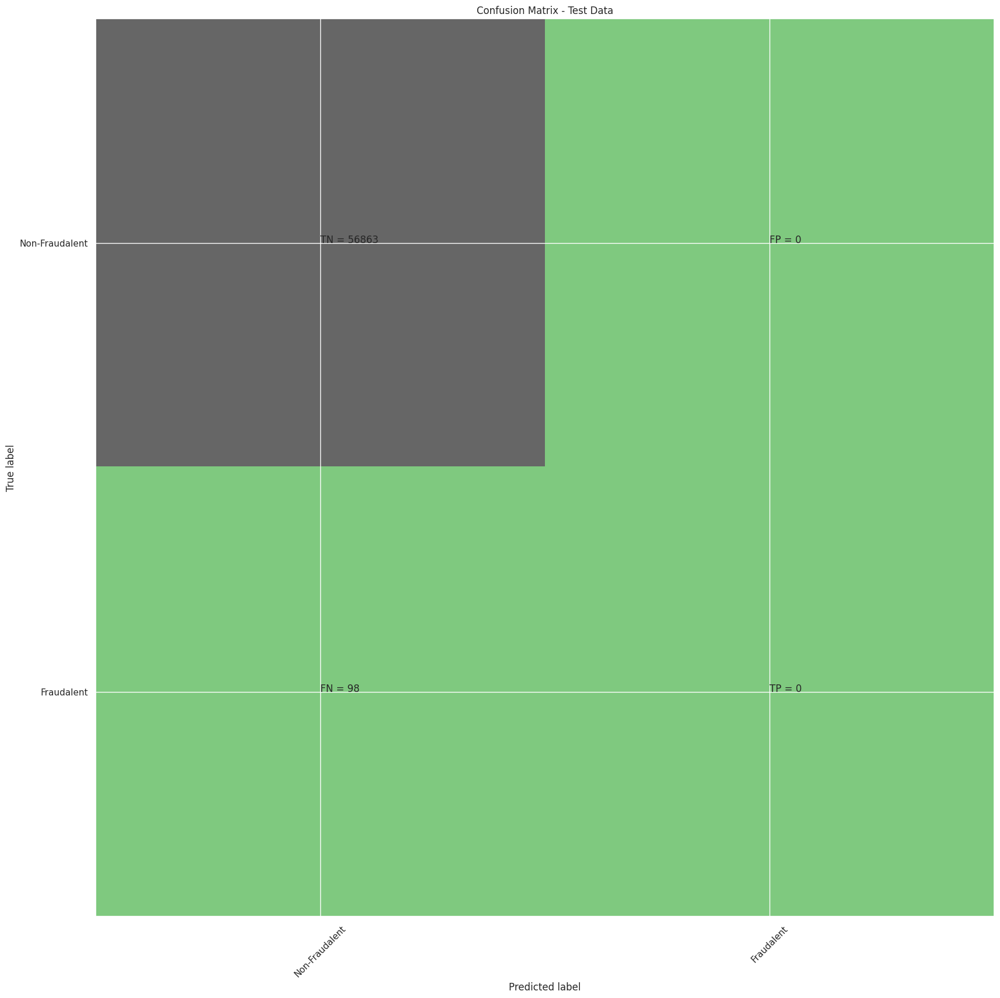

classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56863
           1       0.00      0.00      0.00        98

    accuracy                           1.00     56961
   macro avg       0.50      0.50      0.50     56961
weighted avg       1.00      1.00      1.00     56961

l2 roc_value: 0.9745828408918391
l2 threshold: 0.3939516300872773
ROC for the test dataset 97.5%


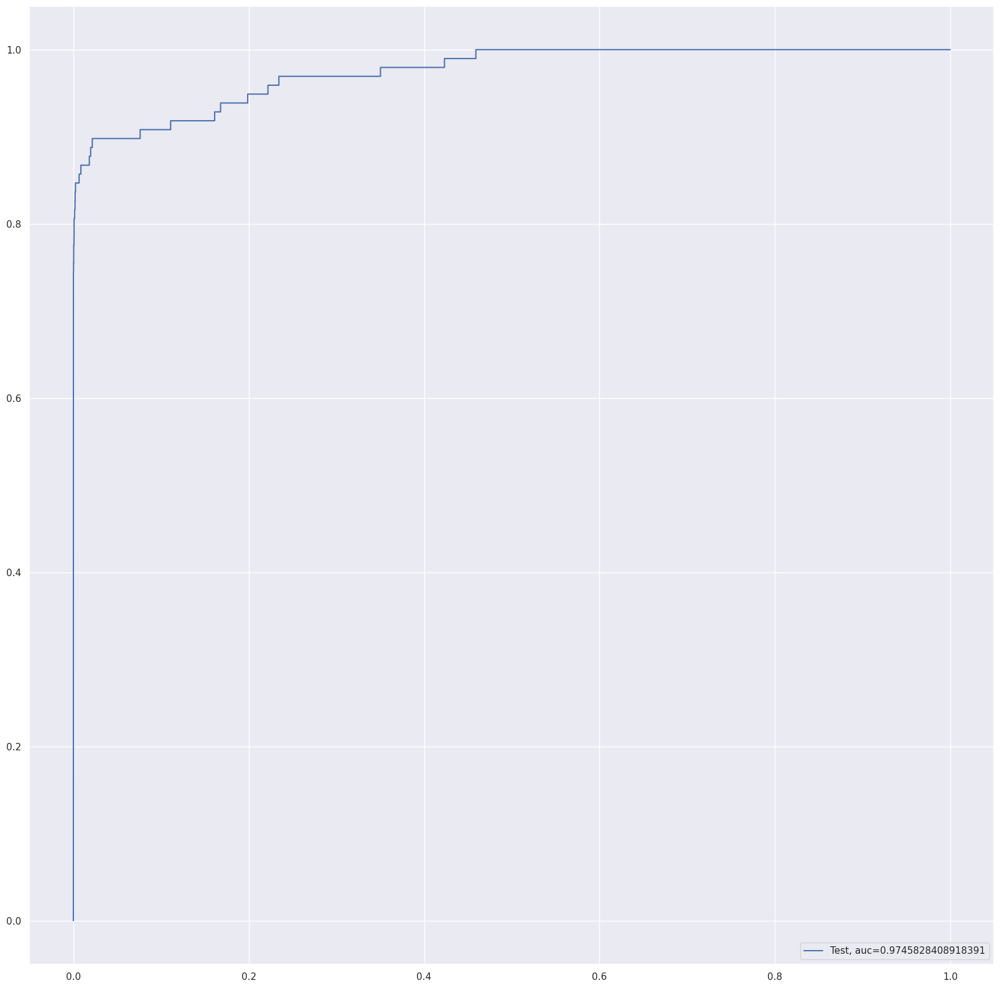

l1 roc_value: 0.5
l1 threshold: 1.5
ROC for the test dataset 50.0%


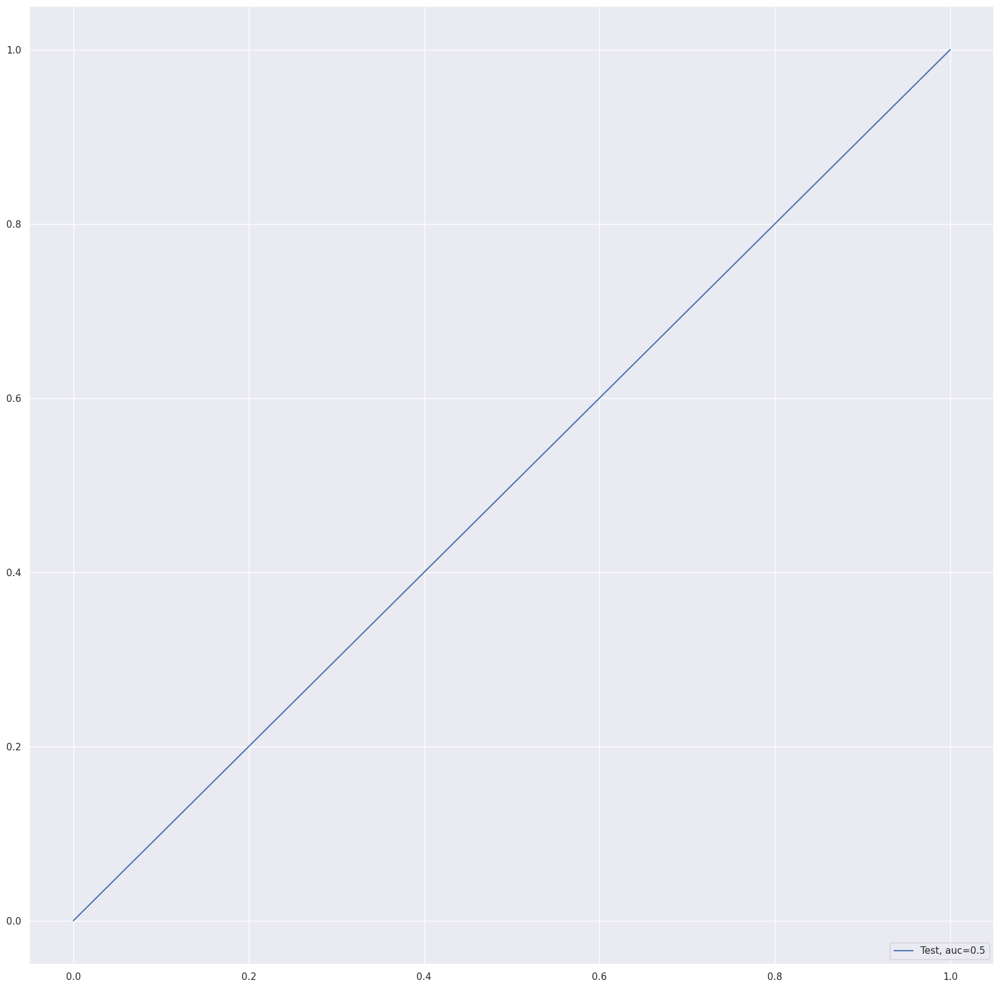

Time Taken by Model: --- 662.2418942451477 seconds ---
--------------------------------------------------------------------------------


In [ ]:
#Run Logistic Regression with L1 And L2 Regularisation
print("Logistic Regression with L1 And L2 Regularisation")
start_time = time.time()
df_Results = buildAndRunLogisticModels(df_Results, Data_Imbalance_Handiling, X_train_Smote, y_train_Smote , X_test, y_test)
print("Time Taken by Model: --- %s seconds ---" % (time.time() - start_time))
print('-'*80 )


Decision Tree Models with  'gini' & 'entropy' criteria
gini score: 0.9977528484401608
Confusion Matrix


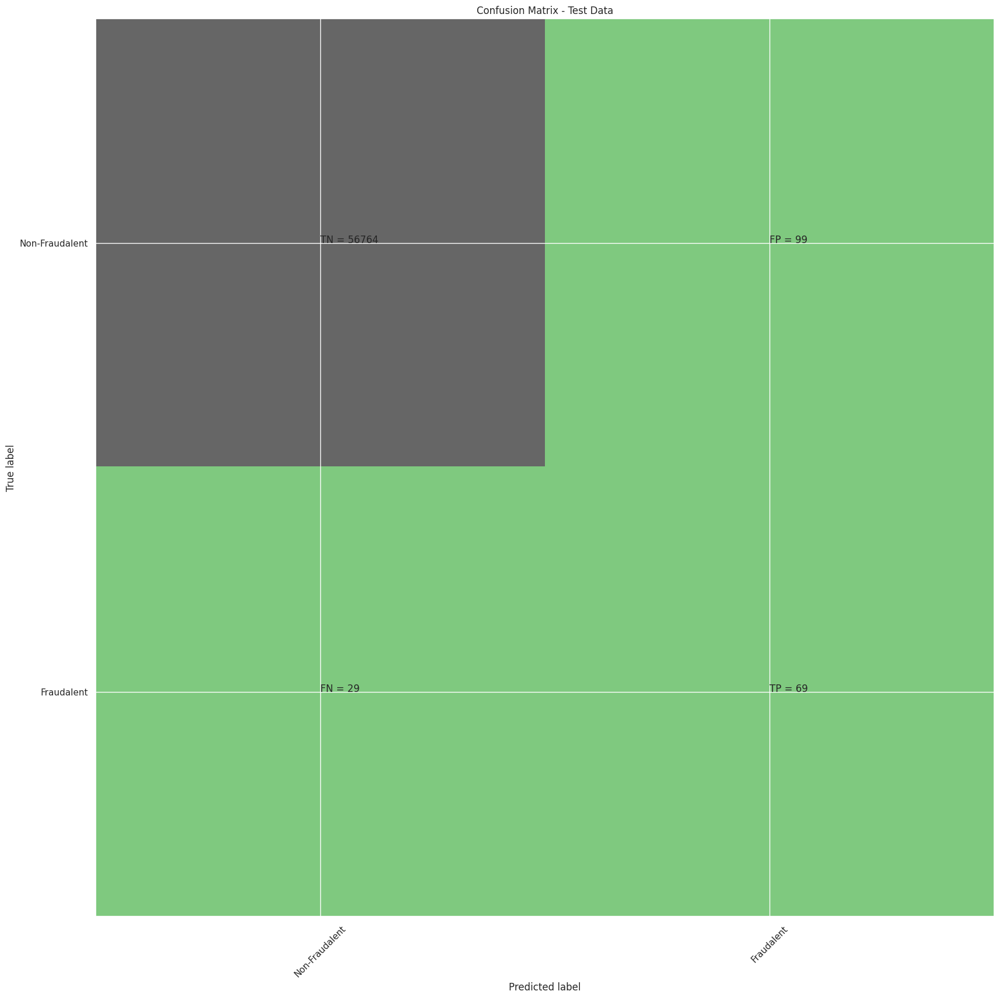

classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56863
           1       0.41      0.70      0.52        98

    accuracy                           1.00     56961
   macro avg       0.71      0.85      0.76     56961
weighted avg       1.00      1.00      1.00     56961

gini tree_roc_value: 0.8511703029874526
Tree threshold: 1.0
ROC for the test dataset 85.1%


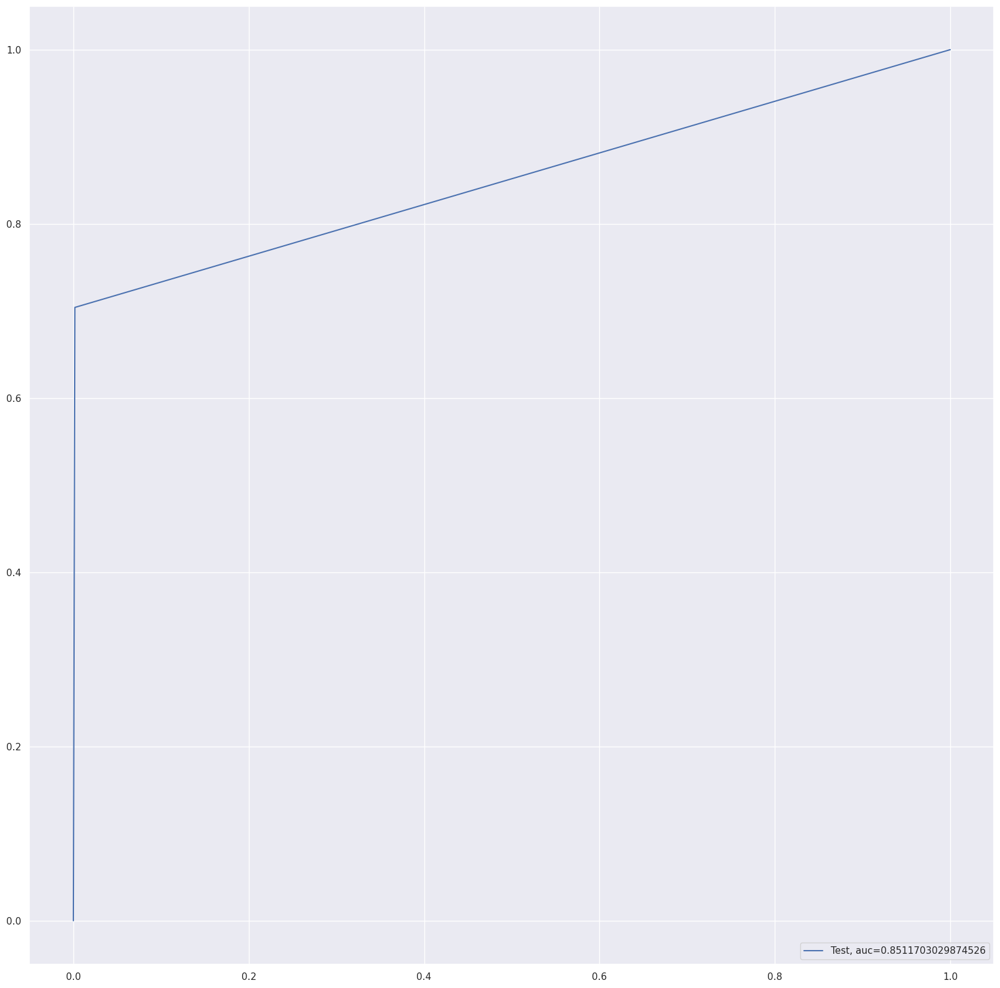

entropy score: 0.9969803900914661
Confusion Matrix


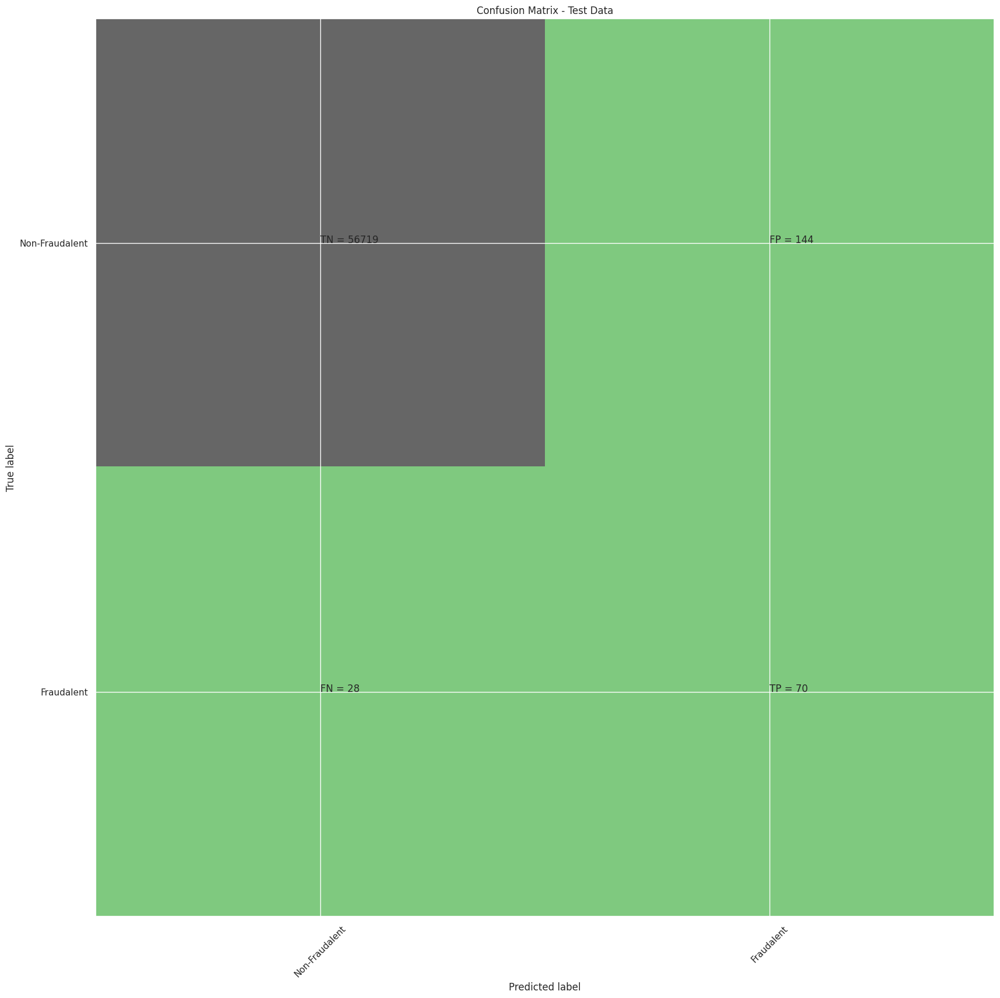

classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56863
           1       0.33      0.71      0.45        98

    accuracy                           1.00     56961
   macro avg       0.66      0.86      0.72     56961
weighted avg       1.00      1.00      1.00     56961

entropy tree_roc_value: 0.8558766559223799
Tree threshold: 1.0
ROC for the test dataset 85.6%


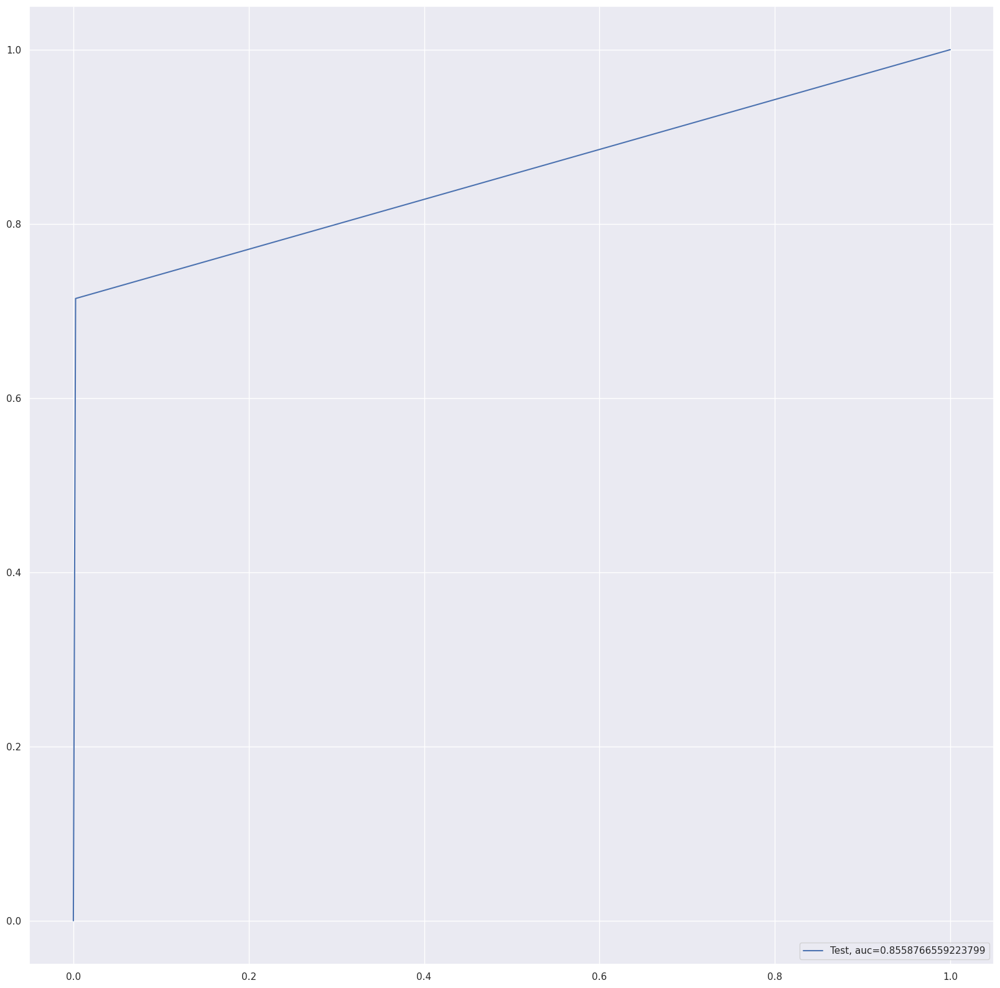

Time Taken by Model: --- 94.91048407554626 seconds ---
--------------------------------------------------------------------------------


In [ ]:
#Run Decision Tree Models with  'gini' & 'entropy' criteria
print("Decision Tree Models with  'gini' & 'entropy' criteria")
start_time = time.time()
df_Results = buildAndRunTreeModels(df_Results, Data_Imbalance_Handiling, X_train_Smote, y_train_Smote , X_test, y_test)
print("Time Taken by Model: --- %s seconds ---" % (time.time() - start_time))
print('-'*80 )


Random Forest Model
Model Accuracy: 0.999490879724724
Confusion Matrix


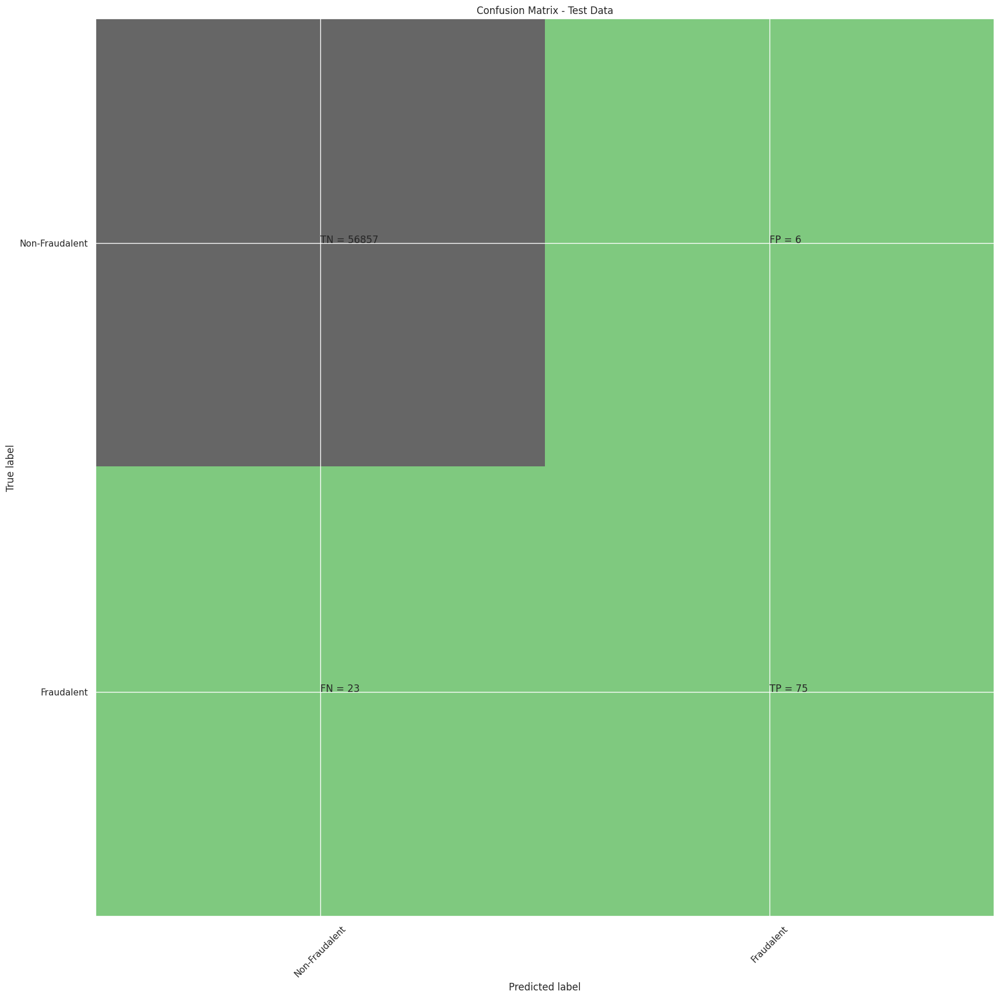

classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56863
           1       0.93      0.77      0.84        98

    accuracy                           1.00     56961
   macro avg       0.96      0.88      0.92     56961
weighted avg       1.00      1.00      1.00     56961

Random Forest roc_value: 0.9614705879186172
Random Forest threshold: 0.05
ROC for the test dataset 96.1%


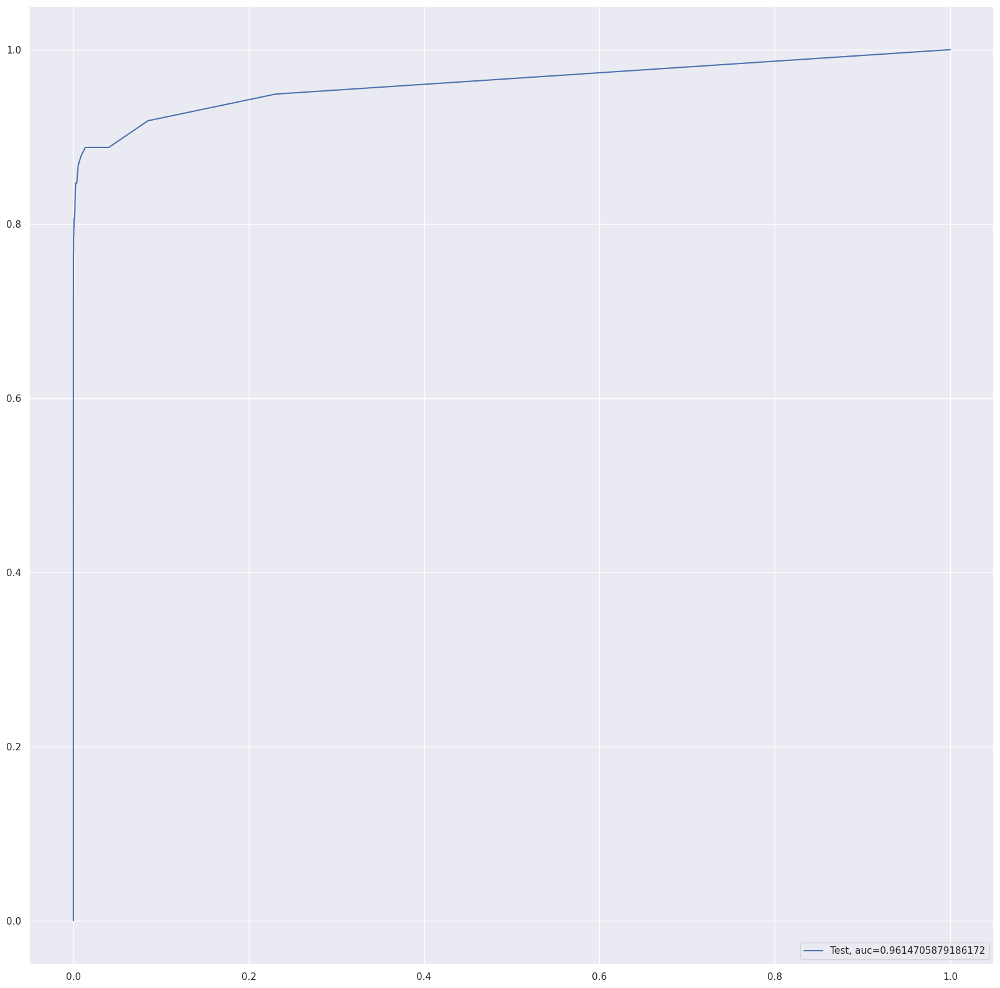

Time Taken by Model: --- 492.4414048194885 seconds ---
--------------------------------------------------------------------------------


In [ ]:
#Run Random Forest Model
print("Random Forest Model")
start_time = time.time()
df_Results = buildAndRunRandomForestModels(df_Results, Data_Imbalance_Handiling, X_train_Smote, y_train_Smote , X_test, y_test)
print("Time Taken by Model: --- %s seconds ---" % (time.time() - start_time))
print('-'*80 )


XGBoost Model
Model Accuracy: 0.9994031003669177
Confusion Matrix


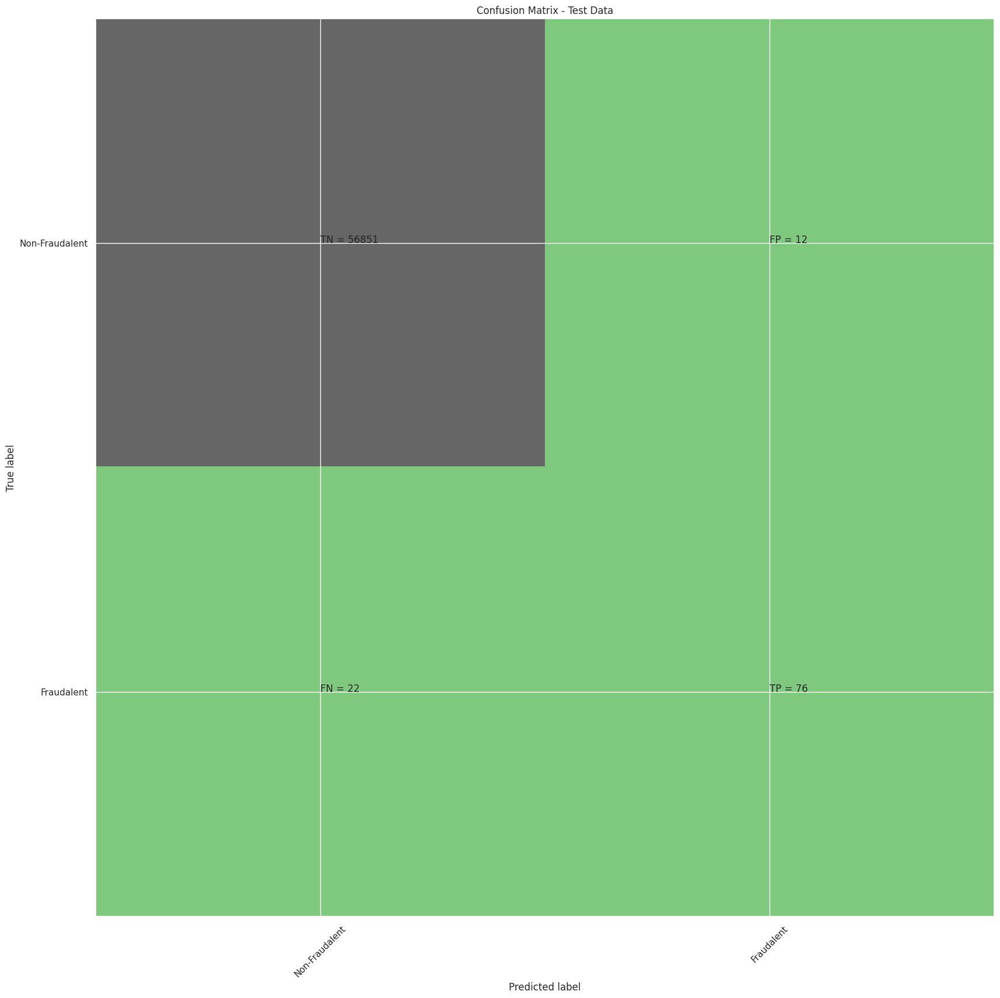

classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56863
           1       0.86      0.78      0.82        98

    accuracy                           1.00     56961
   macro avg       0.93      0.89      0.91     56961
weighted avg       1.00      1.00      1.00     56961

XGboost roc_value: 0.9704734293344512
XGBoost threshold: 0.000144163059303537
ROC for the test dataset 97.0%


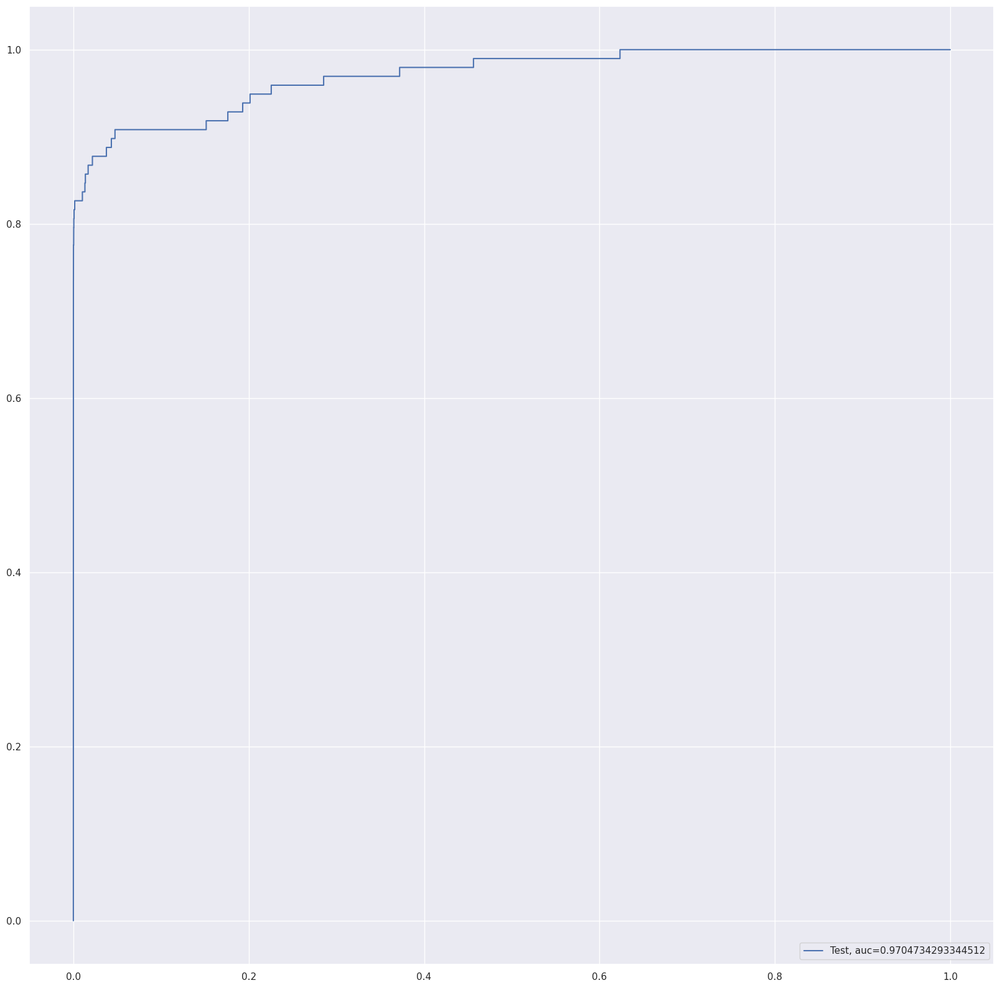

Time Taken by Model: --- 16.201568603515625 seconds ---
--------------------------------------------------------------------------------


In [ ]:
#Run XGBoost Model
print("XGBoost Model")
start_time = time.time()
df_Results = buildAndRunXGBoostModels(df_Results, Data_Imbalance_Handiling, X_train_Smote, y_train_Smote , X_test, y_test)
print("Time Taken by Model: --- %s seconds ---" % (time.time() - start_time))
print('-'*80 )


KNN Model
model score
0.9946805709169432
Confusion Matrix


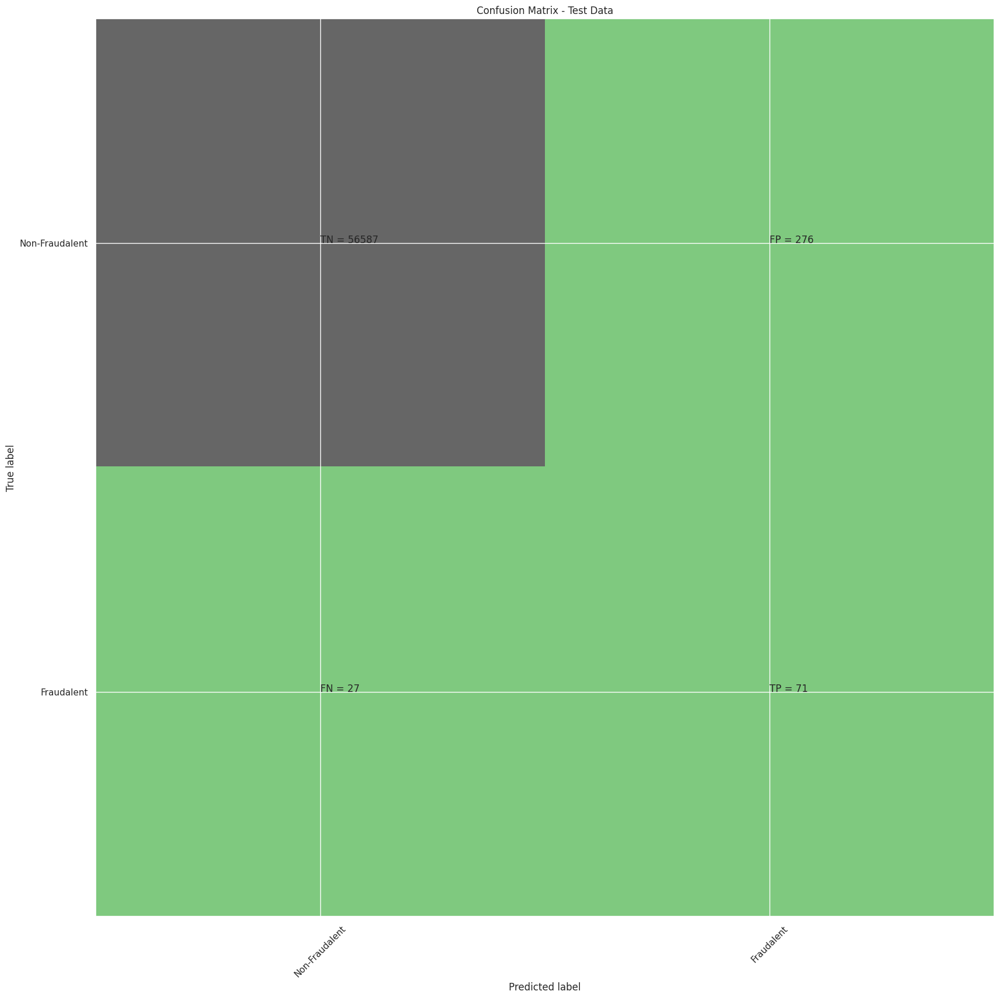

classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56863
           1       0.20      0.72      0.32        98

    accuracy                           0.99     56961
   macro avg       0.60      0.86      0.66     56961
weighted avg       1.00      0.99      1.00     56961

KNN roc_value: 0.8602674455287628
KNN threshold: 0.6
ROC for the test dataset 86.0%


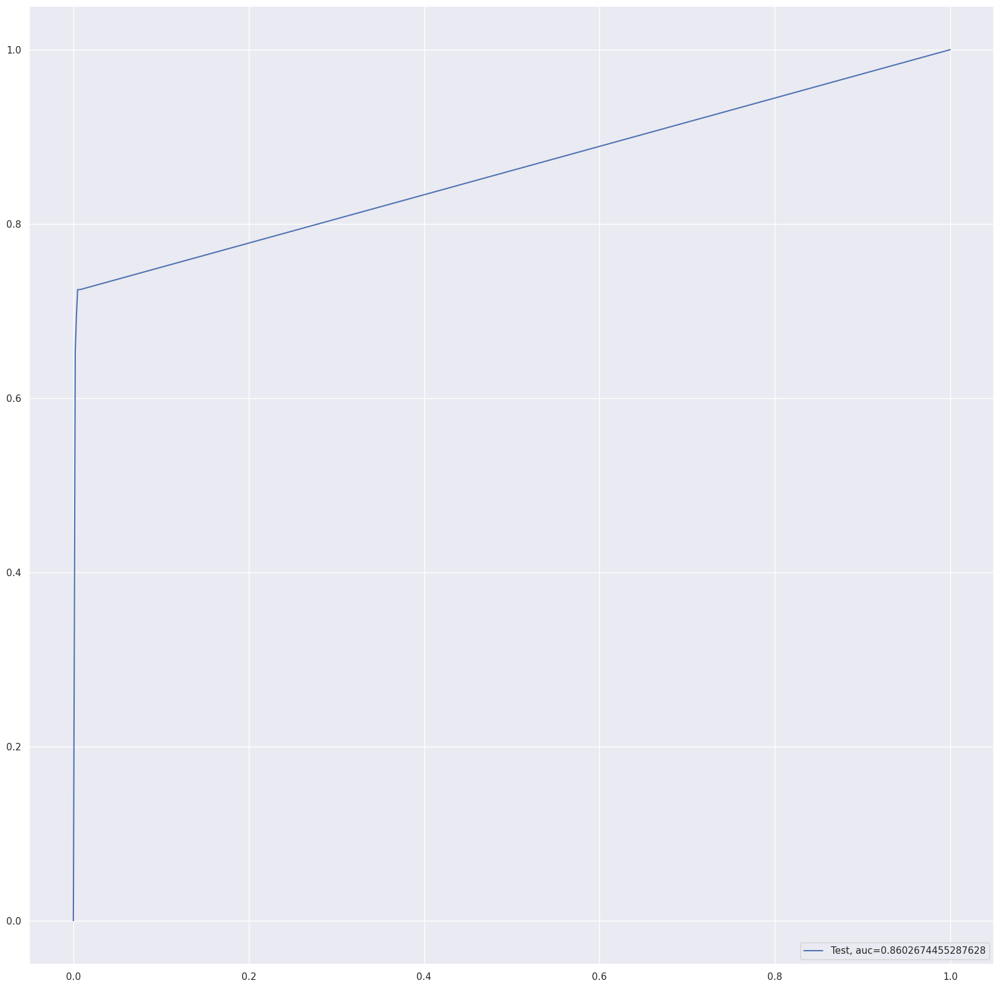

Time Taken by Model: --- 477.04765009880066 seconds ---
--------------------------------------------------------------------------------


In [ ]:
#Run KNN Model
print("KNN Model")
start_time = time.time()
df_Results = buildAndRunKNNModels(df_Results, Data_Imbalance_Handiling, X_train_Smote, y_train_Smote , X_test, y_test)
print("Time Taken by Model: --- %s seconds ---" % (time.time() - start_time))
print('-'*80 )


In [ ]:
df_Results

,Data_Imbalance_Handiling,Model,Accuracy,roc_value,threshold,Data_Imbalance_Handling
0,NaN,Logistic Regression with L2 Regularisation,0.999073,0.967671,0.001259,Power Transformer
1,NaN,Logistic Regression with L1 Regularisation,0.999017,0.967101,0.004577,Power Transformer
2,Power Transformer,Tree Model with gini criteria,0.998876,0.884880,1.000000,NaN
3,Power Transformer,Tree Model with entropy criteria,0.999059,0.860424,1.000000,NaN
4,Power Transformer,Random Forest,0.999354,0.932552,0.020000,NaN
5,Power Transformer,XGBoost,0.999480,0.980627,0.000025,NaN
6,Power Transformer,SVM,0.998441,0.876366,0.001667,NaN
7,Power Transformer,KNN,0.999228,0.909664,0.200000,NaN
8,NaN,Logistic Regression with L2 Regularisation,0.999052,0.982696,0.003110,RepeatedKFold Cross Validation
9,NaN,Logistic Regression with L1 Regularisation,0.999140,0.894494,0.047180,RepeatedKFold Cross Validation


**From Accuracy and ROC value we can conclude that XGBoost has provided best results for SMOTE oversampling technique**

### Let's use ADASYN Oversampling method to handle the class imbalance

- First we will display class distibution with and without the ADASYN Oversampling. Then We will use the oversampled with StratifiedKFold cross validation method to genearte Train And test datasets.

- After we have train and test dataset we will feed the data to below models:

1. Logistic Regression with L2 Regularisation
2. Logistic Regression with L1 Regularisation
3. Decision tree model with Gini criteria
4. Decision tree model with Entropy criteria
5. Random Forest
6. XGBoost
7. KNN

- Once we have results for above models, we will compare the results and select model which provided best results for the oversampling


In [ ]:
import warnings
warnings.filterwarnings("ignore")

import numpy as np
from imblearn import over_sampling
import matplotlib.pyplot as plt

ADASYN = over_sampling.ADASYN(random_state=0)
X_train_ADASYN, y_train_ADASYN = ADASYN.fit_resample(X_train, y_train)

# The Artificial minority samples and corresponding minority labels from ADASYN are appended

X_train_adasyn_1 = X_train_ADASYN[X_train.shape[0]:]

X_train_1 = X_train.to_numpy()[np.where(y_train==1.0)]
X_train_0 = X_train.to_numpy()[np.where(y_train==0.0)]


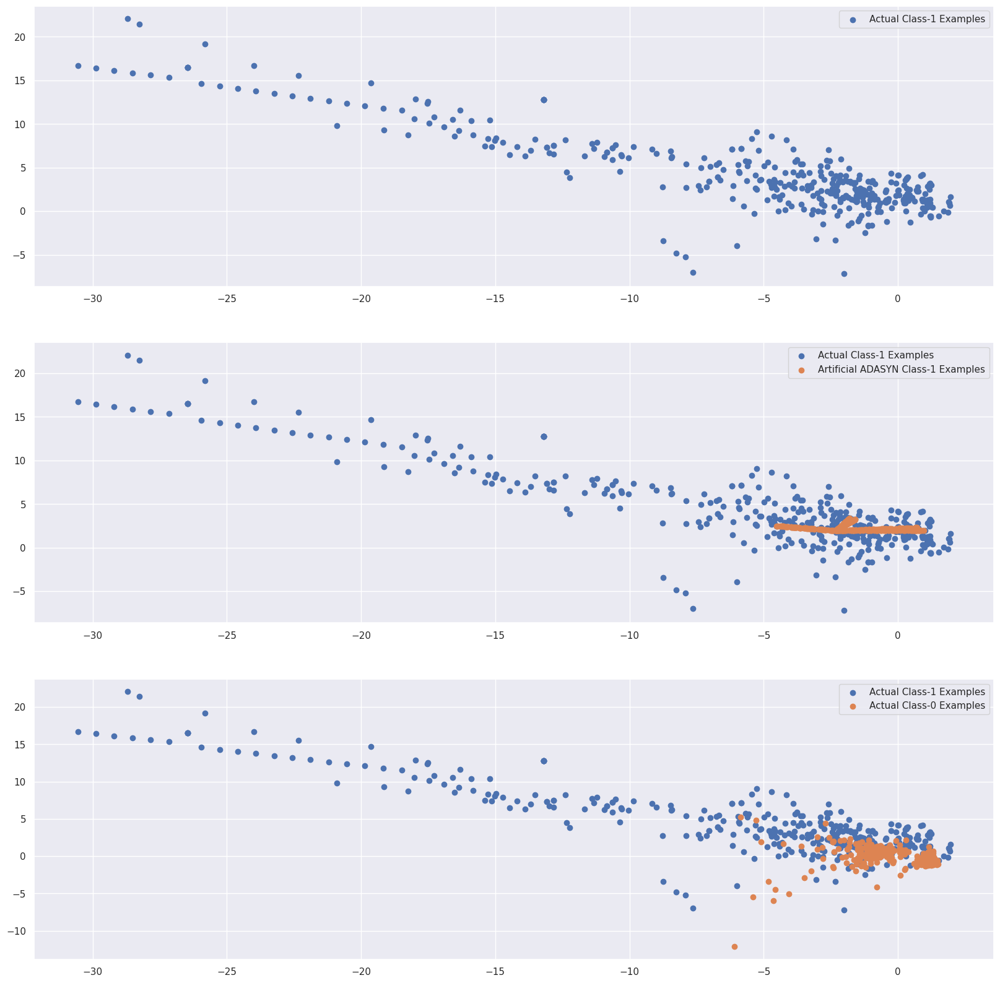

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['figure.figsize'] = [20, 20]
fig = plt.figure()

plt.subplot(3, 1, 1)
plt.scatter(X_train_1[:, 0], X_train_1[:, 1], label='Actual Class-1 Examples')
plt.legend()


plt.subplot(3, 1, 2)
plt.scatter(X_train_1[:, 0], X_train_1[:, 1], label='Actual Class-1 Examples')
plt.scatter(X_train_adasyn_1.iloc[:X_train_1.shape[0], 0], X_train_adasyn_1.iloc[:X_train_1.shape[0], 1],label='Artificial ADASYN Class-1 Examples')
plt.legend()

plt.subplot(3, 1, 3)
plt.scatter(X_train_1[:, 0], X_train_1[:, 1], label='Actual Class-1 Examples')
plt.scatter(X_train_0[:X_train_1.shape[0], 0], X_train_0[:X_train_1.shape[0], 1], label='Actual Class-0 Examples')
plt.legend()

plt.show()

In [ ]:
from sklearn.model_selection import StratifiedKFold
from imblearn import over_sampling

skf = StratifiedKFold(n_splits=5, random_state=None)

for fold, (train_index, test_index) in enumerate(skf.split(X,y), 1):
    X_train = X.loc[train_index]
    y_train = y.loc[train_index]
    X_test = X.loc[test_index]
    y_test = y.loc[test_index]
    SMOTE = over_sampling.SMOTE(random_state=0)
    X_train_ADASYN, y_train_ADASYN= ADASYN.fit_resample(X_train, y_train)



In [ ]:
#Create Dataframe for X_over
X_train_ADASYN = pd.DataFrame(data=X_train_ADASYN,   columns=columns_list)

**Building models on other algorithms**

In [ ]:
Data_Imbalance_Handiling	 = "ADASYN Oversampling with StratifiedKFold CV "


Logistic Regression with L1 And L2 Regularisation
Max auc_roc for l2: 0.9835137791366966
Max auc_roc for l1: 0.5
Parameters for l2 regularisations
[[ 0.99402122  1.06020753  0.87027131  0.95034628  0.76778972 -1.20194104
  -0.94695313 -0.58402748 -0.36285745 -0.88785534  0.79266932 -1.4532049
  -0.16504877 -1.99242122  0.14401854 -1.00139473 -1.14710889 -0.5295751
   0.38474625 -1.41793068 -0.20529939  0.71924009  0.65857401 -1.11433656
   0.71569949  0.20912597  0.14873634  1.32846907  0.01286602  0.02230643]]
[-5.11916237]
{1: array([[0.610404  , 0.63191849, 0.72150467, 0.87081578, 0.95798817,
        0.97416661, 0.97844939, 0.98148389, 0.98277327, 0.98315642,
        0.98321665, 0.98321831, 0.98321831, 0.98321831, 0.98321831,
        0.98321831, 0.98321831, 0.98321831, 0.98321831, 0.98321831],
       [0.61072194, 0.63192858, 0.72000917, 0.86805623, 0.95677094,
        0.9739103 , 0.97856566, 0.98179908, 0.98313262, 0.98350137,
        0.98355597, 0.98355597, 0.98355597, 0.98355597, 

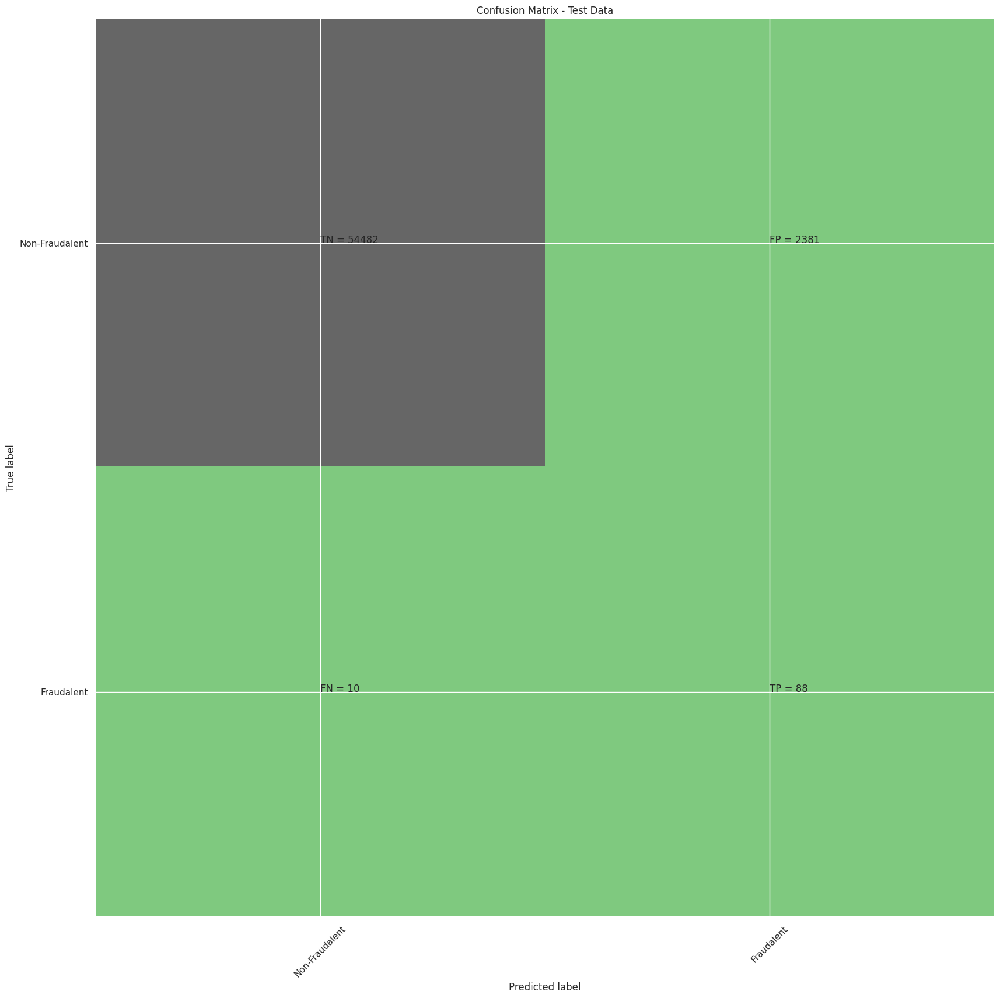

classification Report
              precision    recall  f1-score   support

           0       1.00      0.96      0.98     56863
           1       0.04      0.90      0.07        98

    accuracy                           0.96     56961
   macro avg       0.52      0.93      0.52     56961
weighted avg       1.00      0.96      0.98     56961

Accuarcy of Logistic model with l1 regularisation : 0.9982795245869981
Confusion Matrix


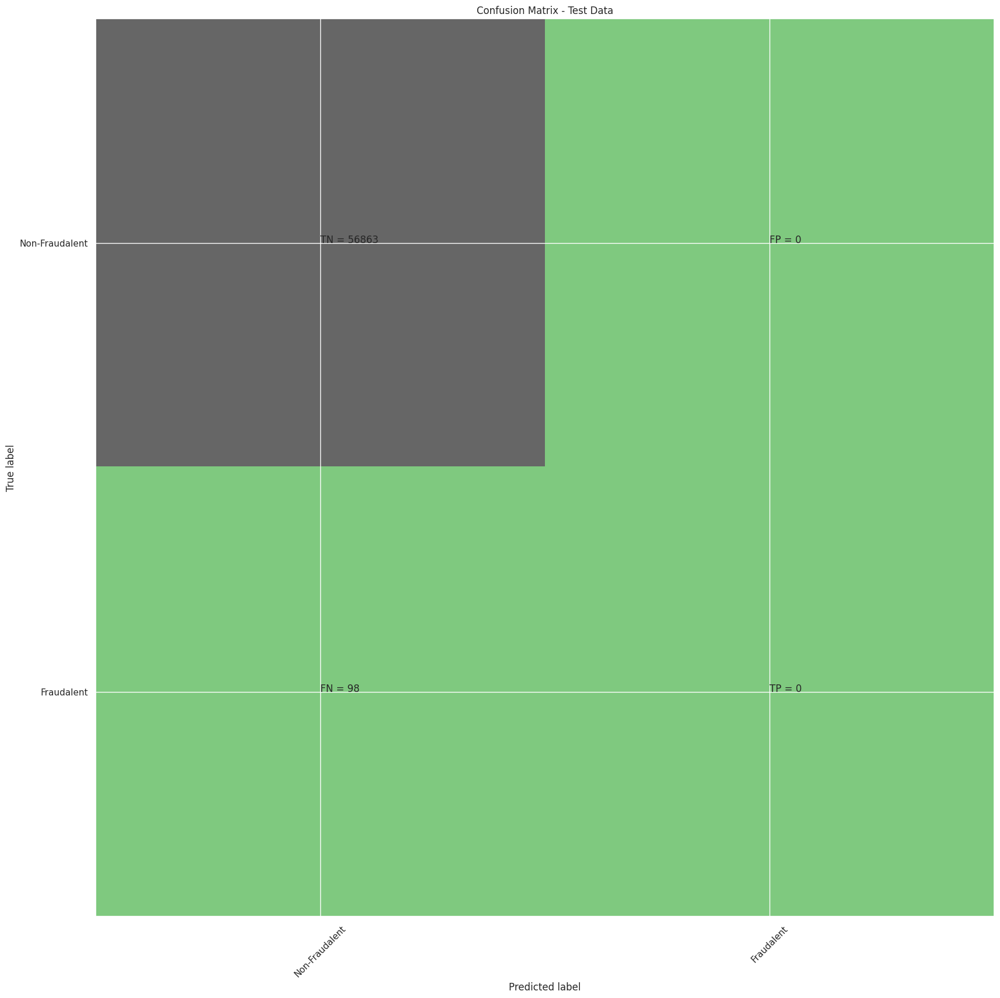

classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56863
           1       0.00      0.00      0.00        98

    accuracy                           1.00     56961
   macro avg       0.50      0.50      0.50     56961
weighted avg       1.00      1.00      1.00     56961

l2 roc_value: 0.9740284292321646
l2 threshold: 0.6115468403459997
ROC for the test dataset 97.4%


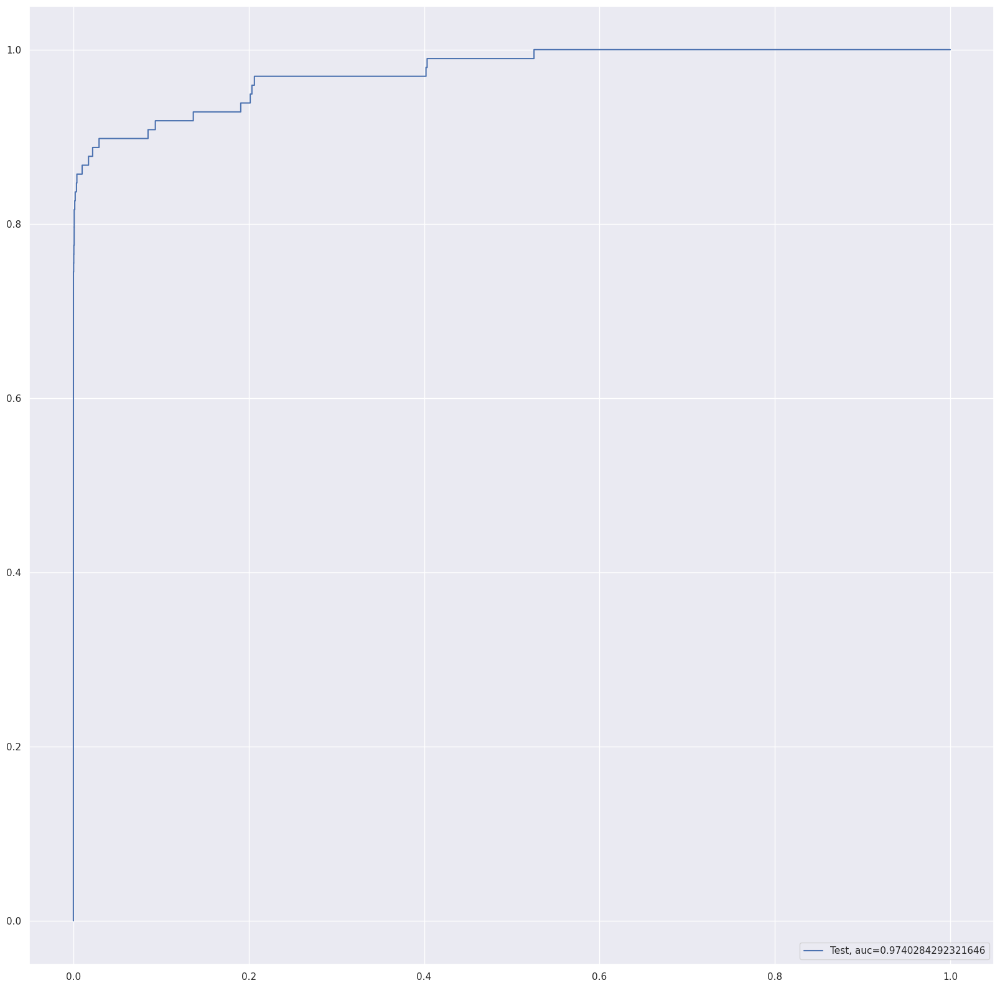

l1 roc_value: 0.5
l1 threshold: 1.5
ROC for the test dataset 50.0%


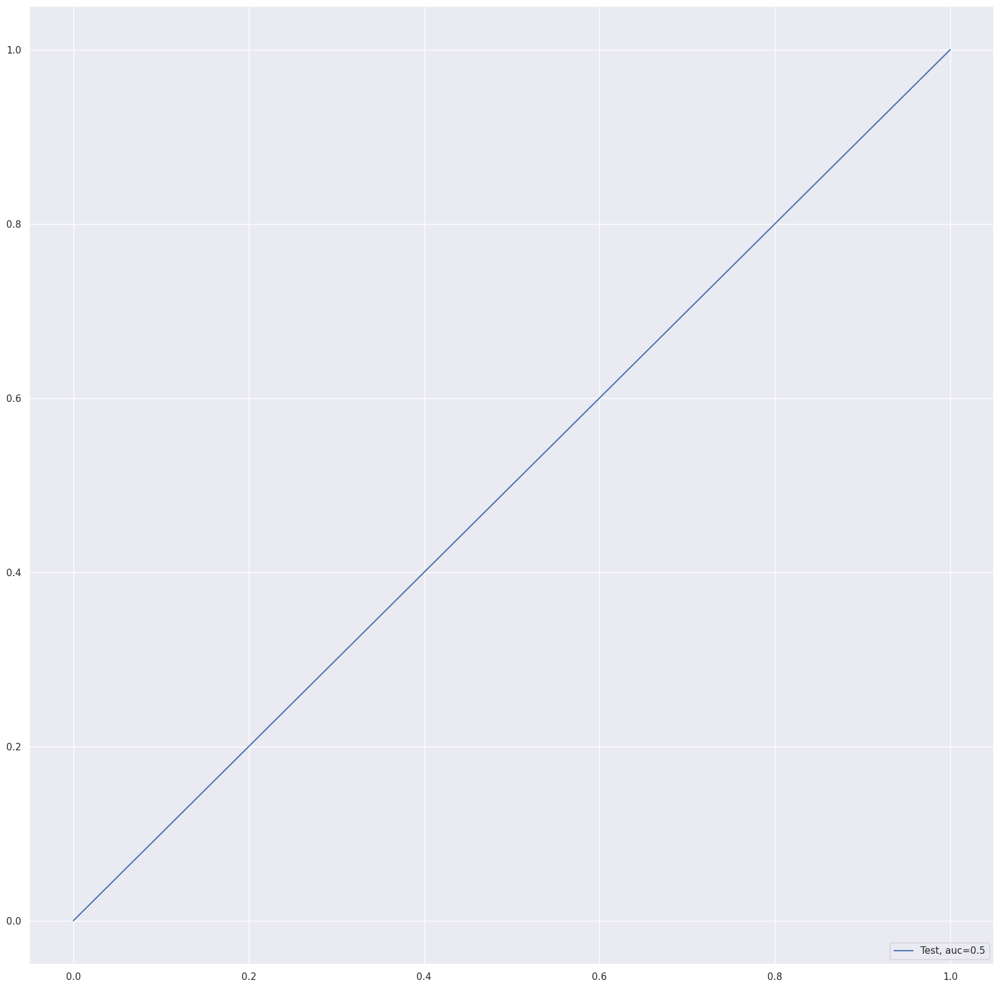

Time Taken by Model: --- 739.8533515930176 seconds ---
--------------------------------------------------------------------------------


In [ ]:
#Run Logistic Regression with L1 And L2 Regularisation
print("Logistic Regression with L1 And L2 Regularisation")
start_time = time.time()
df_Results = buildAndRunLogisticModels(df_Results, Data_Imbalance_Handiling, X_train_ADASYN, y_train_ADASYN , X_test, y_test)
print("Time Taken by Model: --- %s seconds ---" % (time.time() - start_time))
print('-'*80 )


Decision Tree Models with  'gini' & 'entropy' criteria
gini score: 0.9979459630273345
Confusion Matrix


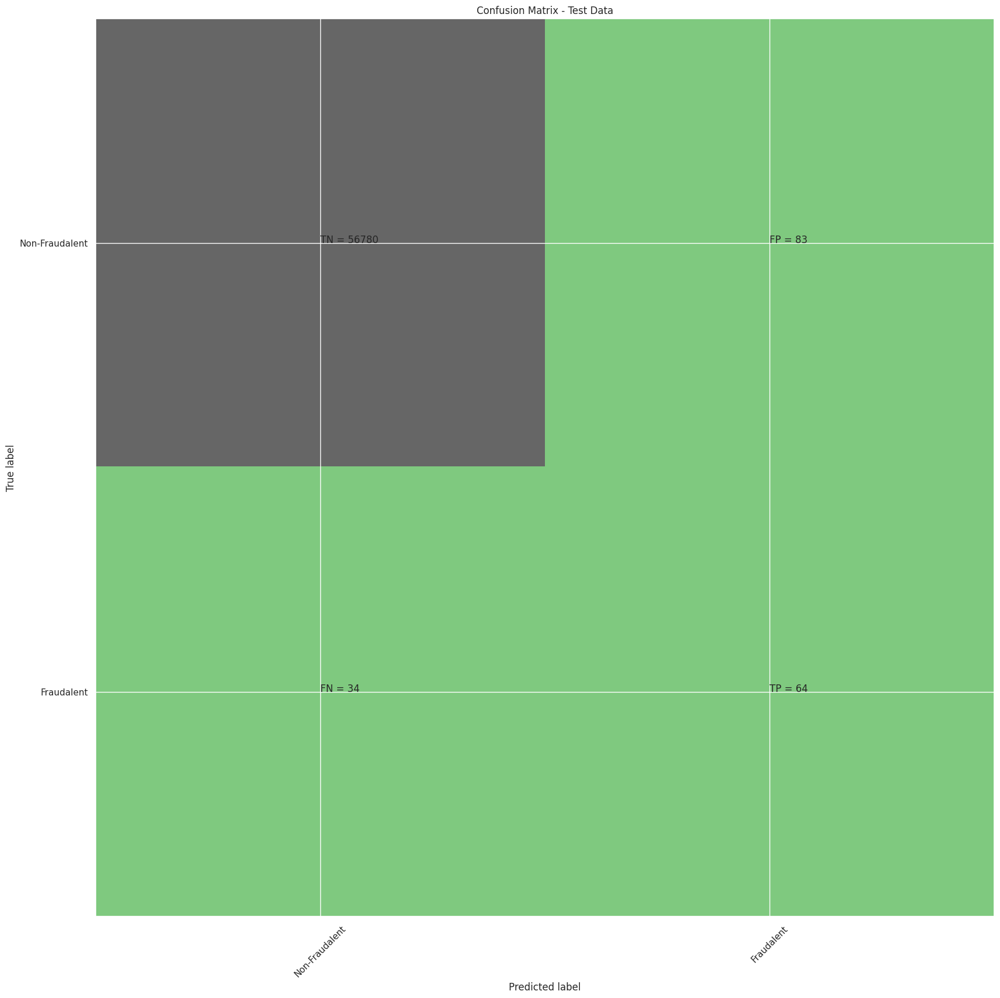

classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56863
           1       0.44      0.65      0.52        98

    accuracy                           1.00     56961
   macro avg       0.72      0.83      0.76     56961
weighted avg       1.00      1.00      1.00     56961

gini tree_roc_value: 0.8258007879303172
Tree threshold: 1.0
ROC for the test dataset 82.6%


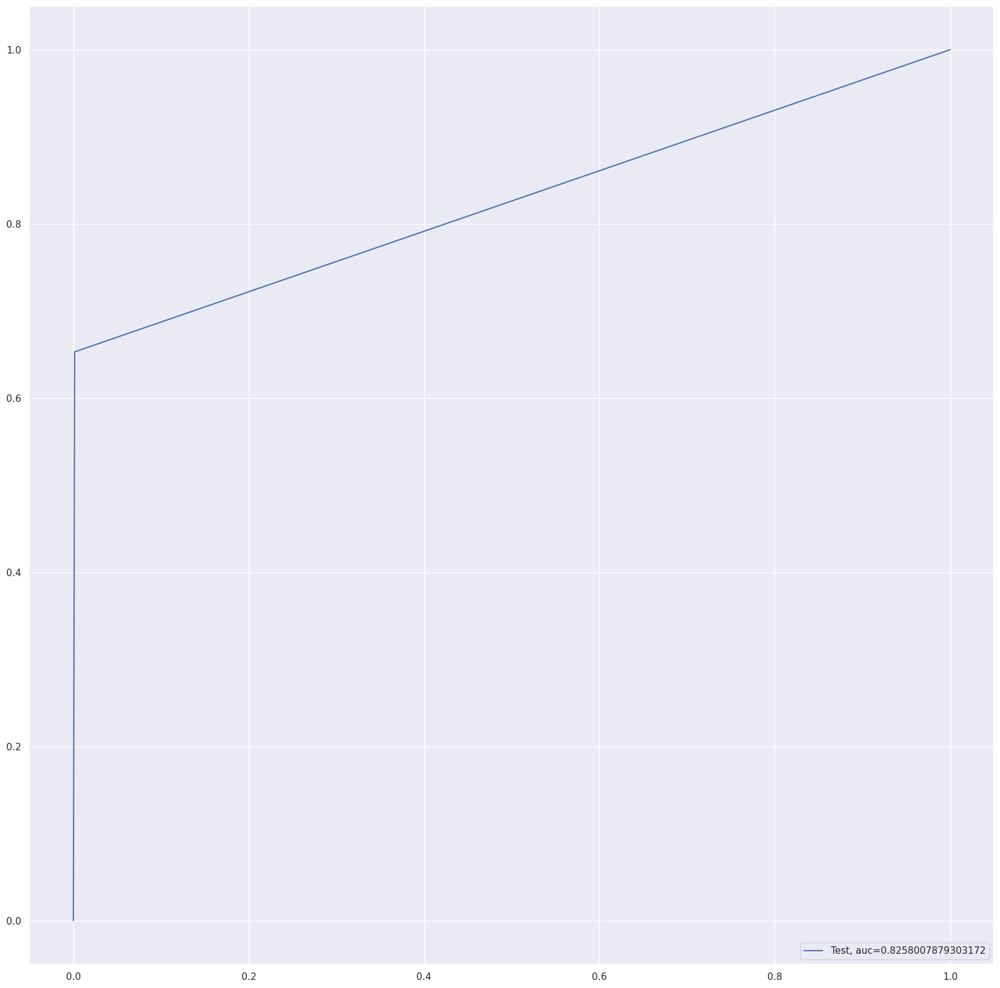

entropy score: 0.9954179175225154
Confusion Matrix


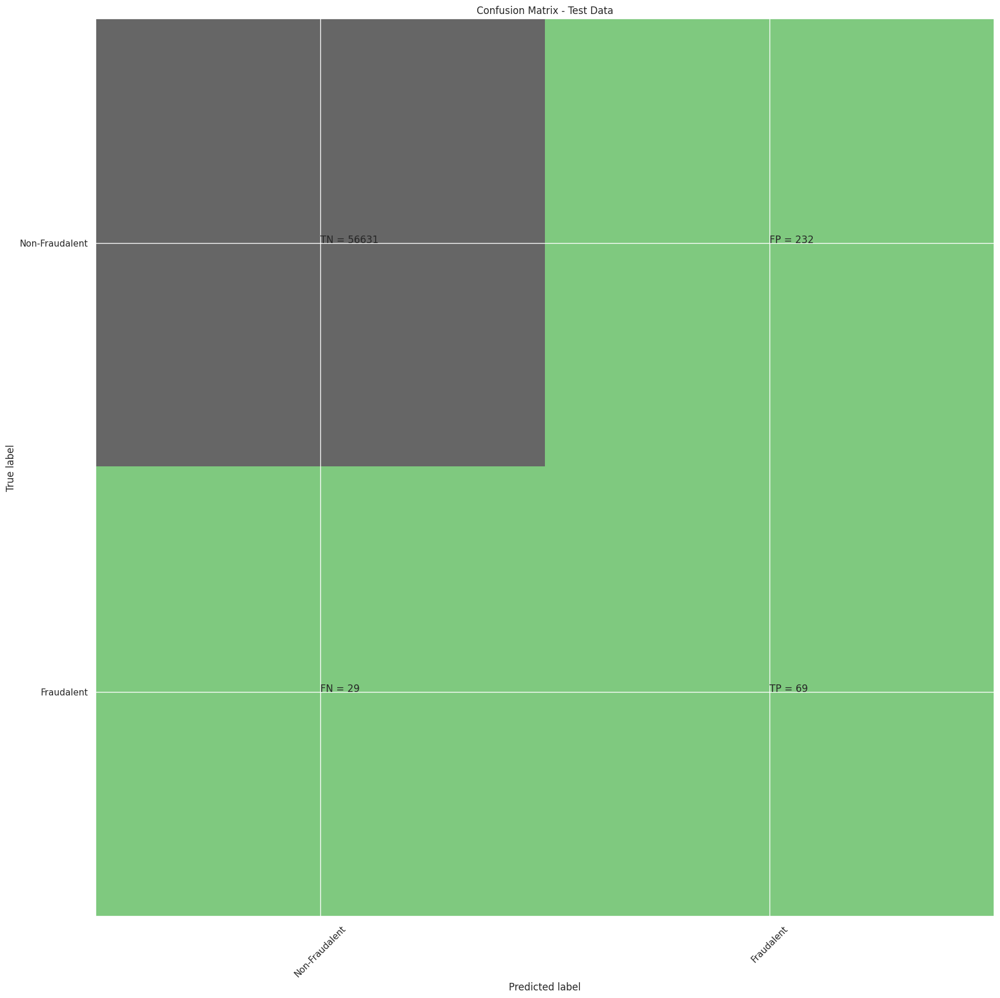

classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56863
           1       0.23      0.70      0.35        98

    accuracy                           1.00     56961
   macro avg       0.61      0.85      0.67     56961
weighted avg       1.00      1.00      1.00     56961

entropy tree_roc_value: 0.8500008254713172
Tree threshold: 1.0
ROC for the test dataset 85.0%


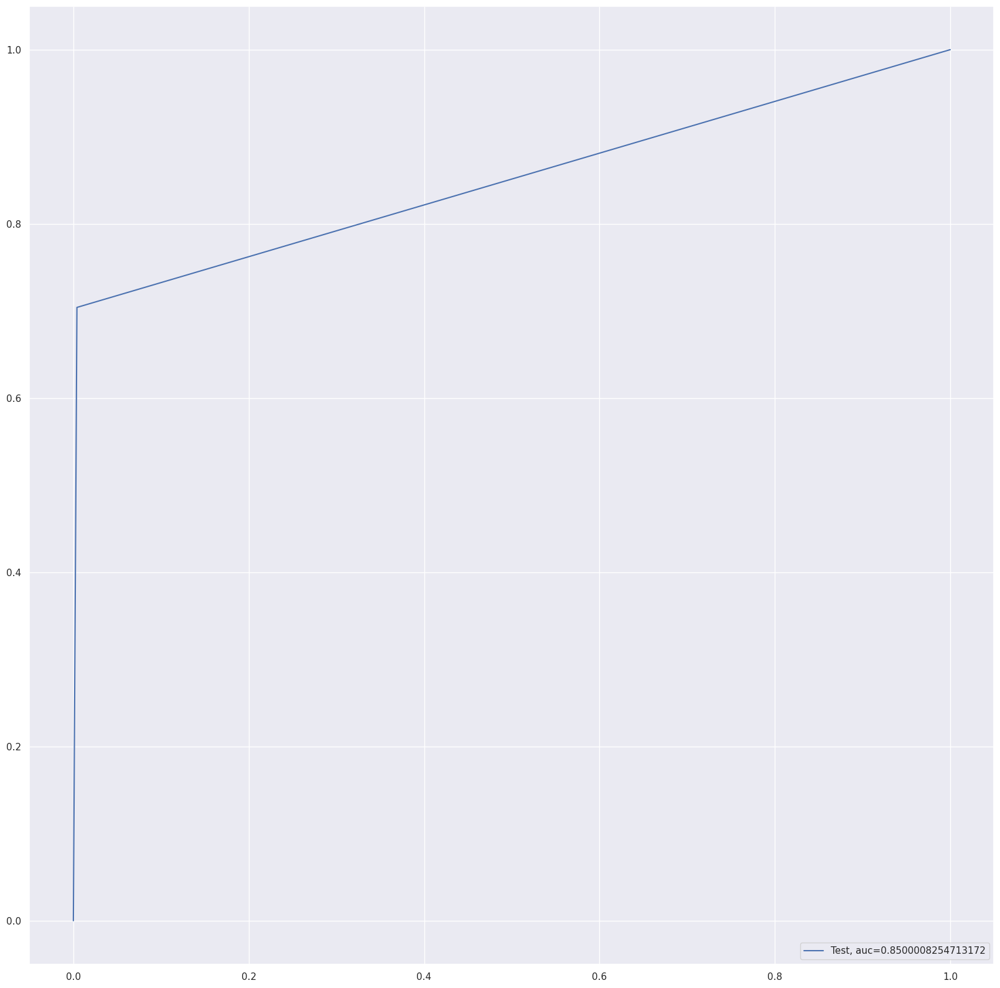

Time Taken by Model: --- 91.46314024925232 seconds ---
--------------------------------------------------------------------------------


In [ ]:
#Run Decision Tree Models with  'gini' & 'entropy' criteria
print("Decision Tree Models with  'gini' & 'entropy' criteria")
start_time = time.time()
df_Results = buildAndRunTreeModels(df_Results, Data_Imbalance_Handiling,X_train_ADASYN, y_train_ADASYN , X_test, y_test)
print("Time Taken by Model: --- %s seconds ---" % (time.time() - start_time))
print('-'*80 )


Random Forest Model
Model Accuracy: 0.9995259914678464
Confusion Matrix


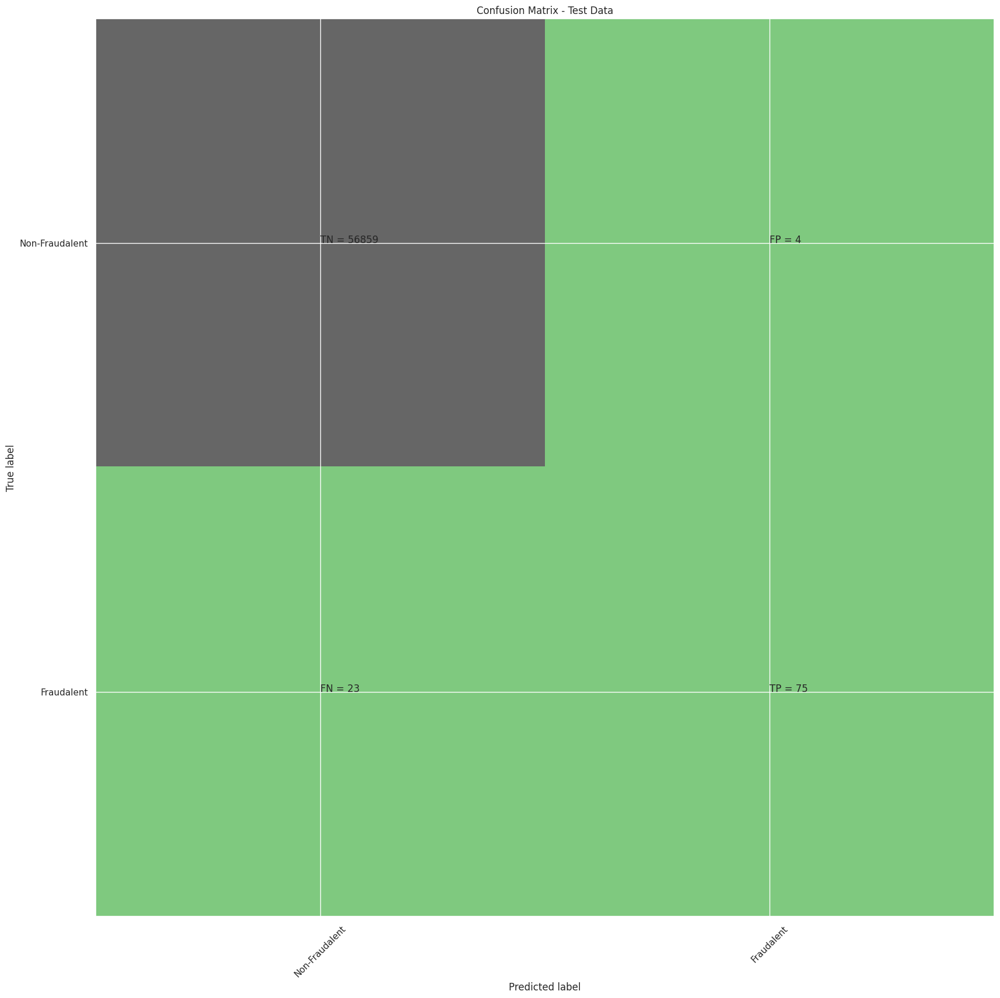

classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56863
           1       0.95      0.77      0.85        98

    accuracy                           1.00     56961
   macro avg       0.97      0.88      0.92     56961
weighted avg       1.00      1.00      1.00     56961

Random Forest roc_value: 0.9632269575962563
Random Forest threshold: 0.03
ROC for the test dataset 96.3%


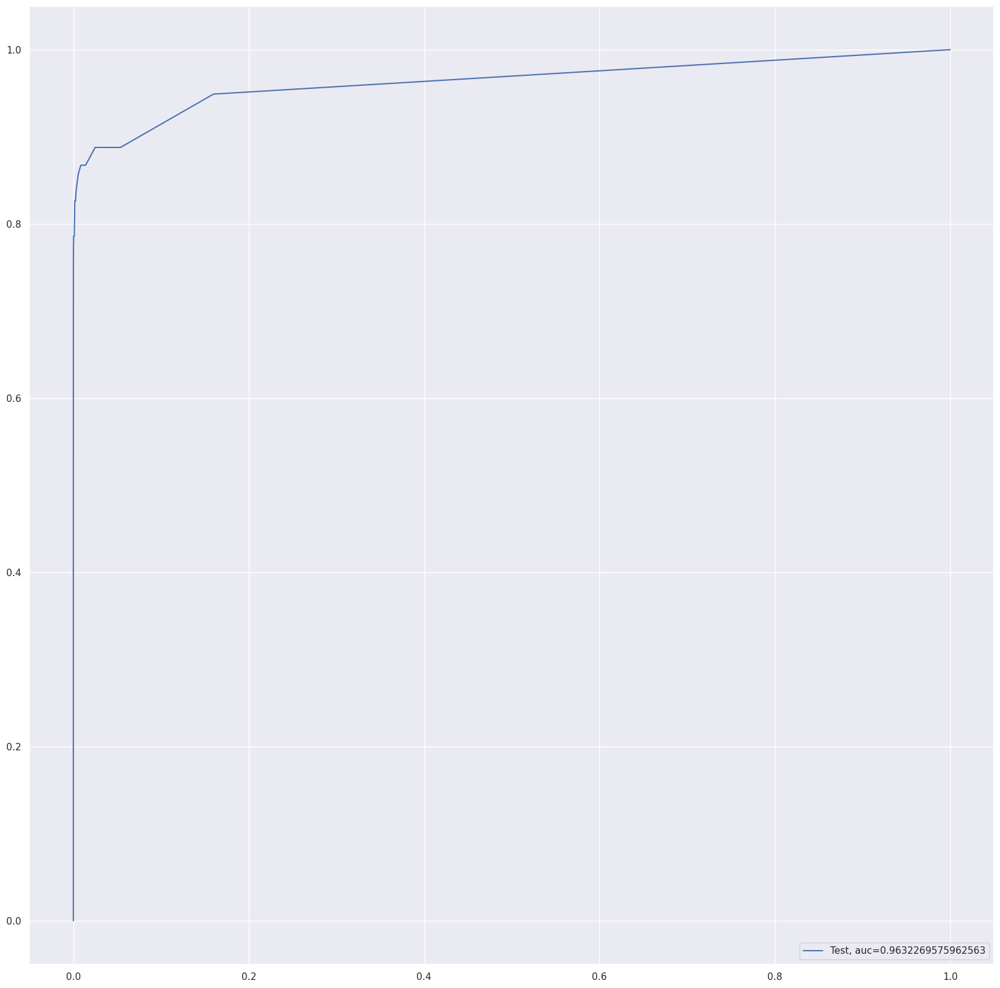

Time Taken by Model: --- 492.5439774990082 seconds ---
--------------------------------------------------------------------------------


In [ ]:
#Run Random Forest Model
print("Random Forest Model")
start_time = time.time()
df_Results = buildAndRunRandomForestModels(df_Results, Data_Imbalance_Handiling,X_train_ADASYN, y_train_ADASYN , X_test, y_test)
print("Time Taken by Model: --- %s seconds ---" % (time.time() - start_time))
print('-'*80 )


XGBoost Model
Model Accuracy: 0.999350432752234
Confusion Matrix


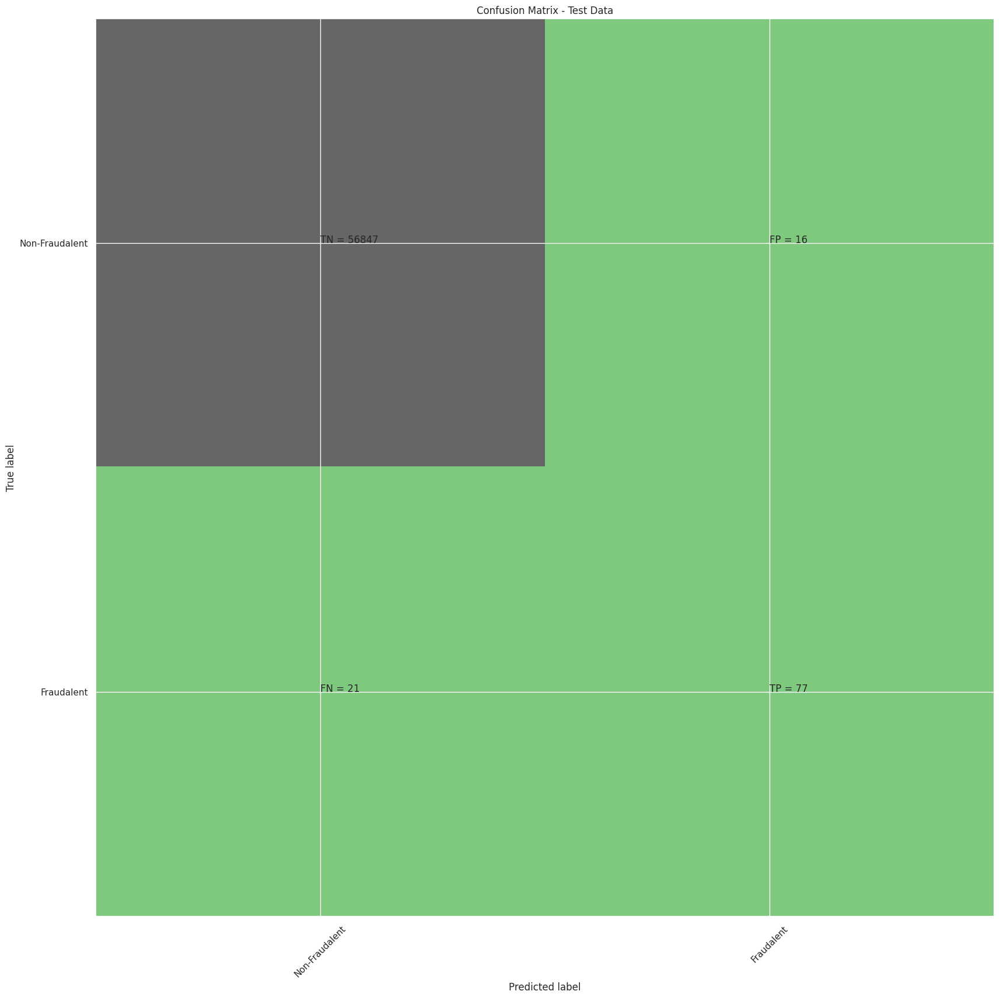

classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56863
           1       0.83      0.79      0.81        98

    accuracy                           1.00     56961
   macro avg       0.91      0.89      0.90     56961
weighted avg       1.00      1.00      1.00     56961

XGboost roc_value: 0.9696561230052754
XGBoost threshold: 0.00012316476204432547
ROC for the test dataset 97.0%


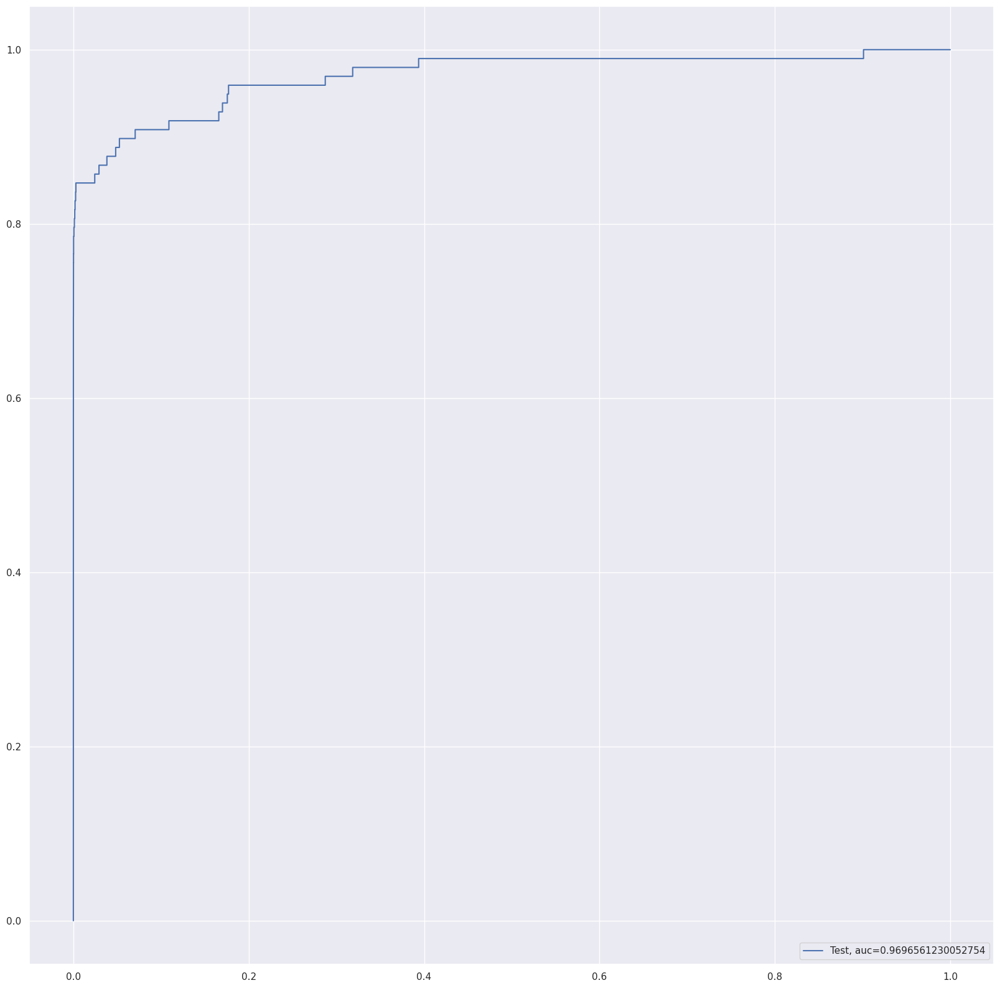

Time Taken by Model: --- 10.319012641906738 seconds ---
--------------------------------------------------------------------------------


In [ ]:
#Run XGBoost Model
print("XGBoost Model")
start_time = time.time()
df_Results = buildAndRunXGBoostModels(df_Results, Data_Imbalance_Handiling,X_train_ADASYN, y_train_ADASYN , X_test, y_test)
print("Time Taken by Model: --- %s seconds ---" % (time.time() - start_time))
print('-'*80 )


KNN Model
model score
0.9945050122013307
Confusion Matrix


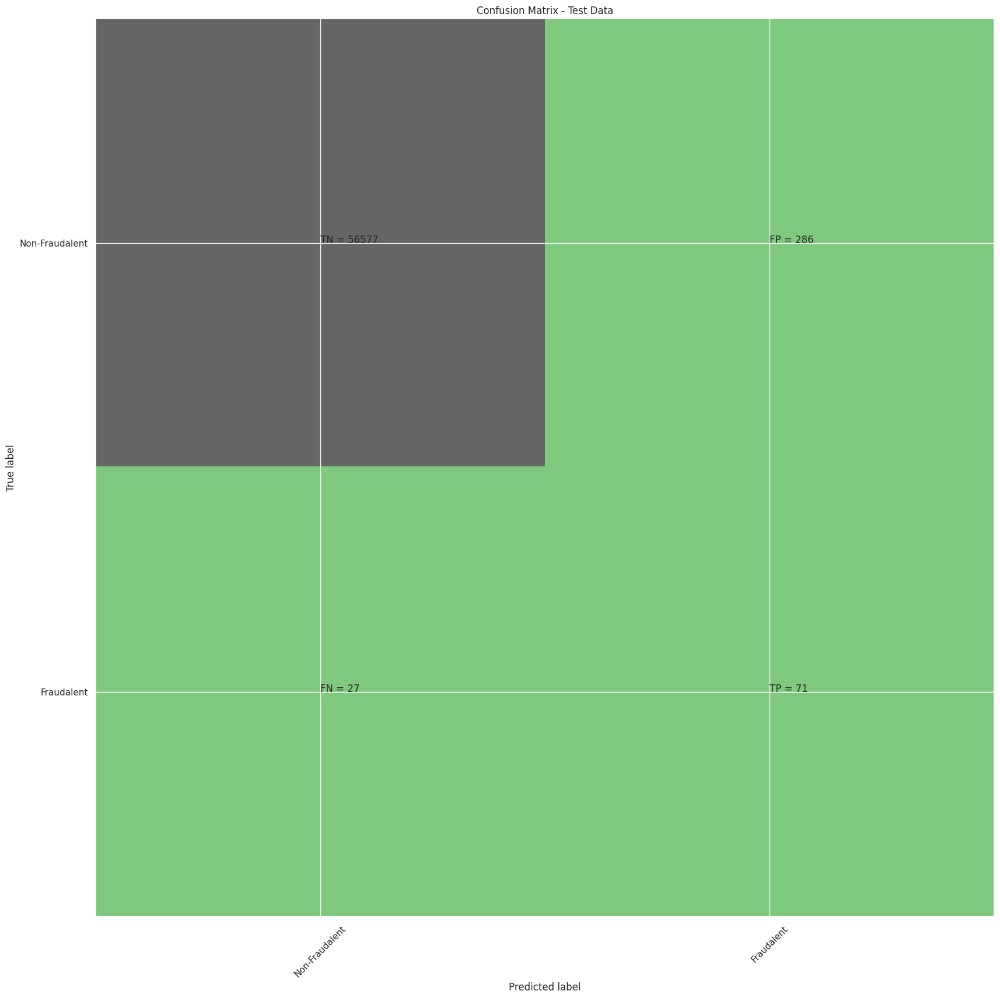

classification Report
              precision    recall  f1-score   support

           0       1.00      0.99      1.00     56863
           1       0.20      0.72      0.31        98

    accuracy                           0.99     56961
   macro avg       0.60      0.86      0.65     56961
weighted avg       1.00      0.99      1.00     56961

KNN roc_value: 0.8601937811862167
KNN threshold: 0.6
ROC for the test dataset 86.0%


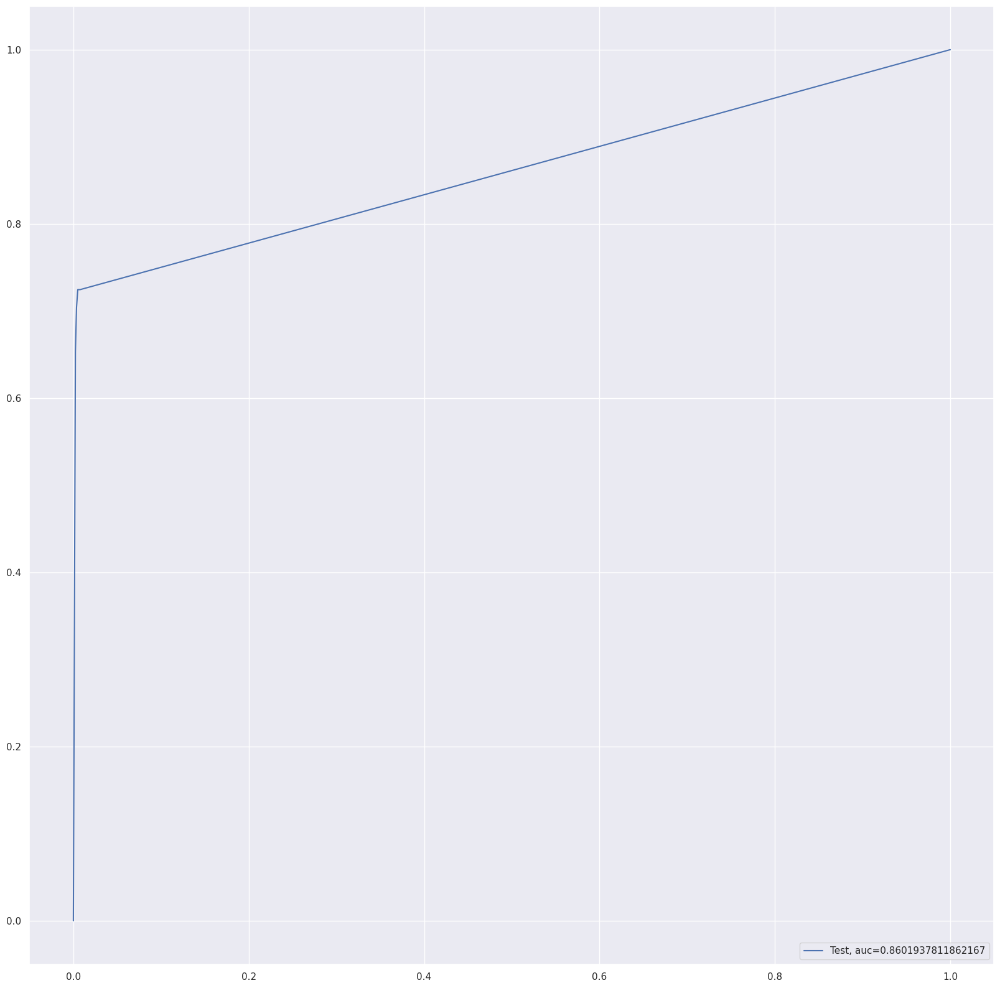

Time Taken by Model: --- 476.9606223106384 seconds ---
--------------------------------------------------------------------------------


In [ ]:
#Run KNN Model
print("KNN Model")
start_time = time.time()
df_Results = buildAndRunKNNModels(df_Results, Data_Imbalance_Handiling,X_train_ADASYN, y_train_ADASYN , X_test, y_test)
print("Time Taken by Model: --- %s seconds ---" % (time.time() - start_time))
print('-'*80 )


In [ ]:
df_Results

,Data_Imbalance_Handiling,Model,Accuracy,roc_value,threshold,Data_Imbalance_Handling
0,NaN,Logistic Regression with L2 Regularisation,0.999073,0.967671,0.001259,Power Transformer
1,NaN,Logistic Regression with L1 Regularisation,0.999017,0.967101,0.004577,Power Transformer
2,Power Transformer,Tree Model with gini criteria,0.998876,0.884880,1.000000,NaN
3,Power Transformer,Tree Model with entropy criteria,0.999059,0.860424,1.000000,NaN
4,Power Transformer,Random Forest,0.999354,0.932552,0.020000,NaN
5,Power Transformer,XGBoost,0.999480,0.980627,0.000025,NaN
6,Power Transformer,SVM,0.998441,0.876366,0.001667,NaN
7,Power Transformer,KNN,0.999228,0.909664,0.200000,NaN
8,NaN,Logistic Regression with L2 Regularisation,0.999052,0.982696,0.003110,RepeatedKFold Cross Validation
9,NaN,Logistic Regression with L1 Regularisation,0.999140,0.894494,0.047180,RepeatedKFold Cross Validation


**From Accuracy and ROC value, XGBoost which has provided best results for Random Oversampling with StratifiedKFold CV**

### Conclusion from above:

- From all above results it seems XGBOOST model with Random Oversampling with StratifiedKFold CV has provided best results. Hence, Let's try to tune the hyperparameters of this model

- Logistic Regression with L2 Regularisation with RepeatedKFold Cross Validation has best results without any oversampling.

### Select the oversampling method which shows the best result on a model
- Apply the best hyperparameter on the model
- Predict on the test dataset

In [ ]:
#Evaluate XGboost model
from xgboost import XGBClassifier

# fitting model no training data
XGBmodel = XGBClassifier(random_state=42)
XGBmodel.fit(X_over, y_over)

XGB_test_score = XGBmodel.score(X_test, y_test)
print('Model Accuracy: {0}'.format(XGB_test_score))

# Getting Probabilities for each class
XGB_probs = XGBmodel.predict_proba(X_test)[:, 1]

# Calculating the roc auc
XGB_roc_value = roc_auc_score(y_test, XGB_probs)

print("XGboost roc_value: {0}" .format(XGB_roc_value))
fpr, tpr, thresholds = metrics.roc_curve(y_test, XGB_probs)
threshold = thresholds[np.argmax(tpr-fpr)]
print("XGBoost threshold: {0}".format(threshold))

Model Accuracy: 0.9995084355962852
XGboost roc_value: 0.9839356103660535
XGBoost threshold: 2.9788448955514468e-05


In [ ]:
#Evaluate XGboost model
from xgboost import XGBClassifier
# fit model no training data
XGBmodel = XGBClassifier(random_state=42)


#Tuning XGBoost Model for max_depth and min_child_weight
from xgboost.sklearn import XGBClassifier
from sklearn.model_selection import GridSearchCV
param_test = {
 'max_depth':range(3,10,2),
 'min_child_weight':range(1,6,2)
}

gsearch1 = GridSearchCV(estimator = XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=42,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1),
 param_grid = param_test, scoring='roc_auc',n_jobs=4, cv=5)

gsearch1.fit(X_over, y_over)

gsearch1.cv_results_, gsearch1.best_params_, gsearch1.best_score_

({'mean_fit_time': array([18.37822876, 17.81938829, 20.49624362, 23.22779107, 20.65076699,
         20.97717838, 27.71576009, 26.1193717 , 25.24138865, 30.74409385,
         31.92965789, 33.9082058 ]),
  'std_fit_time': array([0.3314166 , 0.17912583, 1.76459136, 2.10274781, 0.42380328,
         0.75262263, 1.65632109, 1.6092003 , 1.24011159, 1.9127352 ,
         4.63912198, 2.90894253]),
  'mean_score_time': array([0.03723602, 0.039537  , 0.04724903, 0.03343024, 0.03829775,
         0.03968186, 0.06246424, 0.04583945, 0.04194112, 0.05267859,
         0.04639473, 0.03809047]),
  'std_score_time': array([0.00751479, 0.01493571, 0.0081134 , 0.00896731, 0.0131589 ,
         0.01629037, 0.01533369, 0.01349097, 0.01517551, 0.02132994,
         0.0135316 , 0.01869481]),
  'param_max_depth': masked_array(data=[3, 3, 3, 5, 5, 5, 7, 7, 7, 9, 9, 9],
               mask=[False, False, False, False, False, False, False, False,
                     False, False, False, False],
         fill_value='?

In [ ]:
#Tuning XGBoost Model for n_estimators
from xgboost.sklearn import XGBClassifier
from sklearn.model_selection import GridSearchCV
param_test = {
 'n_estimators':range(60,150,20)
}
gsearch1 = GridSearchCV(estimator = XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=5, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=42,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1),
 param_grid = param_test, scoring='roc_auc',n_jobs=4, cv=5)
gsearch1.fit(X_over, y_over)
gsearch1.cv_results_, gsearch1.best_params_, gsearch1.best_score_

({'mean_fit_time': array([16.46508784, 16.03537011, 17.23057518, 19.90096827, 20.6036531 ]),
  'std_fit_time': array([1.05042757, 0.4518316 , 0.2422799 , 1.35870919, 4.79101687]),
  'mean_score_time': array([0.03796816, 0.03681555, 0.04099865, 0.05141892, 0.03336544]),
  'std_score_time': array([0.00436428, 0.00298407, 0.007301  , 0.01565026, 0.0103055 ]),
  'param_n_estimators': masked_array(data=[60, 80, 100, 120, 140],
               mask=[False, False, False, False, False],
         fill_value='?',
              dtype=object),
  'params': [{'n_estimators': 60},
   {'n_estimators': 80},
   {'n_estimators': 100},
   {'n_estimators': 120},
   {'n_estimators': 140}],
  'split0_test_score': array([nan, nan, nan, nan, nan]),
  'split1_test_score': array([nan, nan, nan, nan, nan]),
  'split2_test_score': array([nan, nan, nan, nan, nan]),
  'split3_test_score': array([nan, nan, nan, nan, nan]),
  'split4_test_score': array([nan, nan, nan, nan, nan]),
  'mean_test_score': array([nan, nan, n

In [ ]:
# Using tunned parameters of max_depth ,  min_child_weight and n_estimators

# Tuning XGBoost Model for n_estimators
from xgboost.sklearn import XGBClassifier
from sklearn.model_selection import GridSearchCV
param_test = {
 'n_estimators':[110,120,130],
  'max_depth':[2,3,4],
 'min_child_weight':[4,5,6]
}

gsearch1 = GridSearchCV(estimator = XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=5, missing=None, n_estimators=120, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=42,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1),
 param_grid = param_test, scoring='roc_auc',n_jobs=4, cv=5)

gsearch1.fit(X_over, y_over)

gsearch1.cv_results_, gsearch1.best_params_, gsearch1.best_score_

({'mean_fit_time': array([16.93209043, 17.612606  , 18.11466498, 18.25984836, 18.35371532,
         18.26746368, 16.33471489, 20.05198503, 17.69864755, 17.8682816 ,
         19.11143346, 19.56699266, 20.4824791 , 18.97758603, 20.44489822,
         20.70211082, 19.47280765, 20.09857492, 19.75206466, 21.20523734,
         26.14014096, 19.66934032, 21.45421228, 25.28543043, 20.05102043,
         20.84907303, 19.47613664]),
  'std_fit_time': array([0.22420901, 0.32838033, 0.37591249, 1.28068454, 1.0467139 ,
         0.25968359, 0.71580733, 1.38521918, 0.20396845, 0.33921158,
         0.46876752, 0.08331809, 1.06839964, 0.36549198, 0.86153507,
         2.11372826, 0.74094092, 0.58183433, 0.86907097, 0.57600029,
         1.44615429, 0.30778933, 1.28841773, 1.87097266, 0.67603014,
         0.60425186, 3.0584093 ]),
  'mean_score_time': array([0.03741746, 0.03113446, 0.03497972, 0.06134267, 0.04695892,
         0.05094609, 0.04211736, 0.04321785, 0.04315186, 0.03849297,
         0.04322653, 0.

In [ ]:
# 'max_depth': 4, 'min_child_weight': 4, 'n_estimators': 130 parameters tuned above we will now check learning rate

# Tuning XGBoost Model for n_estimators
from xgboost.sklearn import XGBClassifier
from sklearn.model_selection import GridSearchCV
param_test = {
 'learning_rate':[0.05,0.1,0.125,0.15,0.2]
}

gsearch1 = GridSearchCV(estimator = XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=4,
              min_child_weight=4, missing=None, n_estimators=130, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=42,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1),
 param_grid = param_test, scoring='roc_auc',n_jobs=4, cv=5)

gsearch1.fit(X_over, y_over)

gsearch1.cv_results_, gsearch1.best_params_, gsearch1.best_score_

({'mean_fit_time': array([25.85291872, 22.77612462, 25.88197432, 22.63356018, 19.20376863]),
  'std_fit_time': array([1.88437539, 0.88837744, 0.90606028, 1.36091499, 5.17359125]),
  'mean_score_time': array([0.04125581, 0.03674798, 0.05100203, 0.02618461, 0.0261301 ]),
  'std_score_time': array([0.00765782, 0.01099256, 0.01605859, 0.00595282, 0.01104581]),
  'param_learning_rate': masked_array(data=[0.05, 0.1, 0.125, 0.15, 0.2],
               mask=[False, False, False, False, False],
         fill_value='?',
              dtype=object),
  'params': [{'learning_rate': 0.05},
   {'learning_rate': 0.1},
   {'learning_rate': 0.125},
   {'learning_rate': 0.15},
   {'learning_rate': 0.2}],
  'split0_test_score': array([nan, nan, nan, nan, nan]),
  'split1_test_score': array([nan, nan, nan, nan, nan]),
  'split2_test_score': array([nan, nan, nan, nan, nan]),
  'split3_test_score': array([nan, nan, nan, nan, nan]),
  'split4_test_score': array([nan, nan, nan, nan, nan]),
  'mean_test_score': 

In [ ]:
#'max_depth': 4, 'min_child_weight': 4, 'n_estimators': 130 parameters tuned above we will now check learning rate

# Tuning XGBoost Model for n_estimators
from xgboost.sklearn import XGBClassifier
from sklearn.model_selection import GridSearchCV
param_test = {
'gamma':[i/10.0 for i in range(0,5)]
}

gsearch1 = GridSearchCV(estimator = XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.2, max_delta_step=0, max_depth=4,
              min_child_weight=4, missing=None, n_estimators=130, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=42,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1),
 param_grid = param_test, scoring='roc_auc',n_jobs=4, cv=5)

gsearch1.fit(X_over, y_over)

gsearch1.cv_results_, gsearch1.best_params_, gsearch1.best_score_

({'mean_fit_time': array([23.88587708, 24.74400721, 24.38192868, 22.76783094, 21.76715169]),
  'std_fit_time': array([0.71661445, 0.67487494, 0.6117479 , 1.15110755, 6.8265292 ]),
  'mean_score_time': array([0.05517664, 0.04942093, 0.05588784, 0.03684649, 0.03080282]),
  'std_score_time': array([0.0248137 , 0.01467765, 0.01593296, 0.00438786, 0.0128059 ]),
  'param_gamma': masked_array(data=[0.0, 0.1, 0.2, 0.3, 0.4],
               mask=[False, False, False, False, False],
         fill_value='?',
              dtype=object),
  'params': [{'gamma': 0.0},
   {'gamma': 0.1},
   {'gamma': 0.2},
   {'gamma': 0.3},
   {'gamma': 0.4}],
  'split0_test_score': array([nan, nan, nan, nan, nan]),
  'split1_test_score': array([nan, nan, nan, nan, nan]),
  'split2_test_score': array([nan, nan, nan, nan, nan]),
  'split3_test_score': array([nan, nan, nan, nan, nan]),
  'split4_test_score': array([nan, nan, nan, nan, nan]),
  'mean_test_score': array([nan, nan, nan, nan, nan]),
  'std_test_score': ar

In [ ]:
#Evaluating XGboost model
from xgboost import XGBClassifier

# fitting model
XGBmodel = XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0.1,
              learning_rate=0.2, max_delta_step=0, max_depth=4,
              min_child_weight=4, missing=1, n_estimators=130, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=42,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)
XGBmodel.fit(X_over, y_over)

XGB_test_score = XGBmodel.score(X_test, y_test)
print('Model Accuracy: {0}'.format(XGB_test_score))


Model Accuracy: 0.999280209265989


In [ ]:
# Getting Probabilities for each class
XGB_probs = XGBmodel.predict_proba(X_test)[:, 1]

# Calculating the roc auc
XGB_roc_value = roc_auc_score(y_test, XGB_probs)

print("XGboost roc_value: {0}" .format(XGB_roc_value))

fpr, tpr, thresholds = metrics.roc_curve(y_test, XGB_probs)
threshold = thresholds[np.argmax(tpr-fpr)]

print("XGBoost threshold: {0}".format(threshold))

XGboost roc_value: 0.9849672700622728
XGBoost threshold: 0.003366371151059866


In [ ]:
#With 'max_depth': 4, 'min_child_weight': 4, 'n_estimators': 130 , gamma: 0.1 parameters tuned above we will now check learning rate

#Tuning XGBoost Model for n_estimators
from xgboost.sklearn import XGBClassifier
from sklearn.model_selection import GridSearchCV
param_test = {
 'subsample':[i/10.0 for i in range(7,10)],
 'colsample_bytree':[i/10.0 for i in range(7,10)]
}

gsearch1 = GridSearchCV(estimator = XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0.1,
              learning_rate=0.2, max_delta_step=0, max_depth=4,
              min_child_weight=4, missing=None, n_estimators=130, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=42,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1),
 param_grid = param_test, scoring='roc_auc',n_jobs=4, cv=5)

gsearch1.fit(X_over, y_over)

gsearch1.cv_results_, gsearch1.best_params_, gsearch1.best_score_

({'mean_fit_time': array([23.12602639, 23.64490519, 25.55291247, 24.98301458, 23.77000833,
         24.23322334, 24.26663628, 22.63617444, 20.08076396]),
  'std_fit_time': array([0.49376288, 1.10190465, 0.11019804, 0.73102221, 1.35733333,
         1.74647457, 1.31759503, 0.31266324, 5.44592766]),
  'mean_score_time': array([0.03504949, 0.05686431, 0.03733754, 0.05347867, 0.03753524,
         0.04682894, 0.05163488, 0.02754531, 0.02624516]),
  'std_score_time': array([0.01159338, 0.01411818, 0.00577018, 0.01187775, 0.00285358,
         0.0189809 , 0.0161502 , 0.00669739, 0.01315091]),
  'param_colsample_bytree': masked_array(data=[0.7, 0.7, 0.7, 0.8, 0.8, 0.8, 0.9, 0.9, 0.9],
               mask=[False, False, False, False, False, False, False, False,
                     False],
         fill_value='?',
              dtype=object),
  'param_subsample': masked_array(data=[0.7, 0.8, 0.9, 0.7, 0.8, 0.9, 0.7, 0.8, 0.9],
               mask=[False, False, False, False, False, False, False, 

In [ ]:
#Evaluating XGboost model
from xgboost import XGBClassifier

# fitting model no training data
XGBmodel = XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=0.8,
              colsample_bynode=1, colsample_bytree=1, gamma=0.1,
              learning_rate=0.2, max_delta_step=0, max_depth=4,
              min_child_weight=4, missing=1, n_estimators=130, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=42,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=0.8, verbosity=1)
XGBmodel.fit(X_over, y_over)

XGB_test_score = XGBmodel.score(X_test, y_test)
print('Model Accuracy: {0}'.format(XGB_test_score))


Model Accuracy: 0.999350432752234


In [ ]:
# Getting Probabilities for each class
XGB_probs = XGBmodel.predict_proba(X_test)[:, 1]

# Calculating the roc auc
XGB_roc_value = roc_auc_score(y_test, XGB_probs)

print("XGboost roc_value: {0}" .format(XGB_roc_value))

fpr, tpr, thresholds = metrics.roc_curve(y_test, XGB_probs)
threshold = thresholds[np.argmax(tpr-fpr)]

print("XGBoost threshold: {0}".format(threshold))

XGboost roc_value: 0.9868570610278122
XGBoost threshold: 0.0014943405985832214


**Roc value dropped, so we will take not consider new values**

In [ ]:
# Performing the best oversampling method on X_train & y_train

clf = XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0.1,
              learning_rate=0.2, max_delta_step=0, max_depth=4,
              min_child_weight=4, missing=1, n_estimators=130, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=42,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)
clf.fit(X_over, y_over ) # fit on the balanced dataset
XGB_test_score = clf.score(X_test, y_test)
print('Model Accuracy: {0}'.format(XGB_test_score))

# Probabilities for each class
XGB_probs = clf.predict_proba(X_test)[:, 1]

# Calculate roc auc
XGB_roc_value = roc_auc_score(y_test, XGB_probs)


Model Accuracy: 0.999280209265989


In [ ]:
print("XGboost roc_value: {0}" .format(XGB_roc_value))
fpr, tpr, thresholds = metrics.roc_curve(y_test, XGB_probs)
threshold = thresholds[np.argmax(tpr-fpr)]
print("XGBoost threshold: {0}".format(threshold))

XGboost roc_value: 0.9849672700622728
XGBoost threshold: 0.003366371151059866


### Print the important features of the best model to understand the dataset

Top var = 14
2nd Top var = 10
3rd Top var = 4


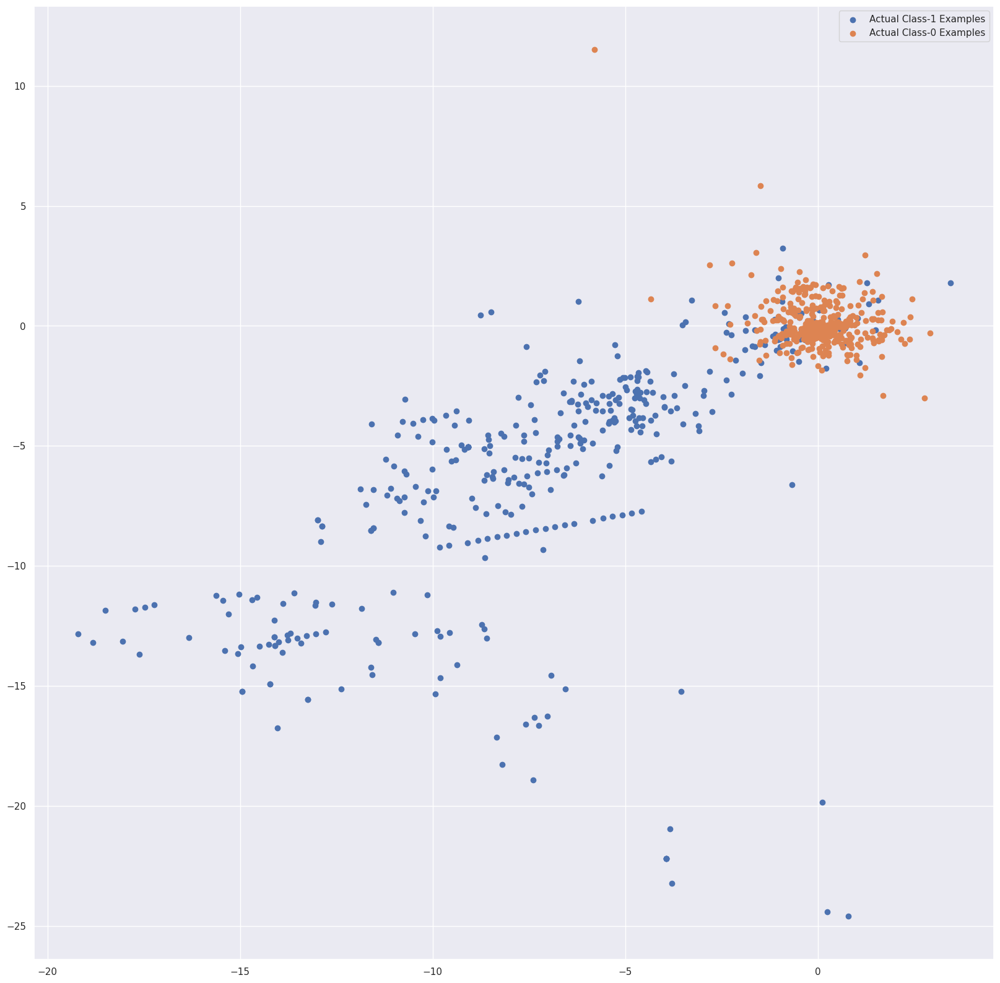

In [ ]:
var_imp = []
for i in clf.feature_importances_:
    var_imp.append(i)
print('Top var =', var_imp.index(np.sort(clf.feature_importances_)[-1])+1)
print('2nd Top var =', var_imp.index(np.sort(clf.feature_importances_)[-2])+1)
print('3rd Top var =', var_imp.index(np.sort(clf.feature_importances_)[-3])+1)

# Variable on Index-13 and Index-9 seems to be the top 2 variables
top_var_index = var_imp.index(np.sort(clf.feature_importances_)[-1])
second_top_var_index = var_imp.index(np.sort(clf.feature_importances_)[-2])

X_train_1 = X_train.to_numpy()[np.where(y_train==1.0)]
X_train_0 = X_train.to_numpy()[np.where(y_train==0.0)]

np.random.shuffle(X_train_0)

import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['figure.figsize'] = [20, 20]

plt.scatter(X_train_1[:, top_var_index], X_train_1[:, second_top_var_index], label='Actual Class-1 Examples')
plt.scatter(X_train_0[:X_train_1.shape[0], top_var_index], X_train_0[:X_train_1.shape[0], second_top_var_index],
            label='Actual Class-0 Examples')
plt.legend()

In [ ]:
#### Print the FPR,TPR & select the best threshold from the roc curve

In [ ]:
# Calculating the roc auc
XGB_roc_value = roc_auc_score(y_test, XGB_probs)

In [ ]:
print("XGboost roc_value: {0}" .format(XGB_roc_value))
fpr, tpr, thresholds = metrics.roc_curve(y_test, XGB_probs)
threshold = thresholds[np.argmax(tpr-fpr)]
print("XGBoost threshold: {0}".format(threshold))

XGboost roc_value: 0.9849672700622728
XGBoost threshold: 0.003366371151059866


## Model Selection

#### From above results, XGBOOST model with Random Oversampling with StratifiedKFold CV has provided best results.
So we tune the hyperparameters of this model to get best results

Final Model selected is XGBOOST model with Random Oversampling and StratifiedKFold CV

Below are the results:

### **Model Accuracy: 0.999280209265989**

### **XGboost roc_value: 0.9849672700622728**

### **XGBoost threshold: 0.003366371151059866**

#### The Model selection is done by comparing all the metrics, However It was also noticed that Logistic Regression with L2 Regularisation with RepeatedKFold Cross Validation has provided best results without any oversampling.





#### Submitted by :
- Alpesh Kumar
- kumaralpesh0695@gmail.com